<a href="https://colab.research.google.com/github/lucasabbruzzini/Portfolio/blob/main/Stochastic_Modeling_Group_Work_Project_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pprint

from scipy.stats import norm
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller

from pandas.tseries.holiday import AbstractHolidayCalendar, USFederalHolidayCalendar, GoodFriday

In [ ]:
class CustomHolidayCalendar(AbstractHolidayCalendar):
    rules = USFederalHolidayCalendar().rules + [GoodFriday]
class Asset:
    def __init__(self, ticker, start_date, end_date, frequency='1d', window=20):
        self.ticker = ticker
        self.start_date = pd.Timestamp(start_date)
        self.end_date = pd.Timestamp(end_date)
        self.frequency = frequency
        self.window = window  # Rolling window for volatility calculation

        self.data = self._download_data()
        self.prices = self.data['Adj Close']
        self.dividends = self._download_dividends()
        self.returns = self.calculate_returns()
        self.volatility = self.calculate_volatility()

        self.logprices = np.log(self.prices)

        # Ensuring returns are strictly positive before taking the log
        valid_returns = (1 + self.returns).clip(lower=1e-10)
        self.logreturns = np.log(valid_returns)

        # Ensuring volatility is strictly positive before taking the log
        valid_volatility = self.volatility.clip(lower=1e-10)
        self.logvolatility = np.log(valid_volatility)

    def _download_data(self):
        data = yf.download(
            self.ticker,
            start=self.start_date,
            end=self.end_date,
            interval=self.frequency
        )
        data.index = pd.to_datetime(data.index)
        return data

    def _download_dividends(self):
        try:
            ticker_obj = yf.Ticker(self.ticker)
            # Get all dividends
            dividends = ticker_obj.dividends

            # Convert index to datetime if not already
            dividends.index = pd.to_datetime(dividends.index)

            # Create a date range matching the price data frequency
            full_date_range = pd.date_range(
                start=self.start_date,
                end=self.end_date,
                freq=self.frequency
            )

            dividends = dividends.reindex(full_date_range, fill_value=0)

            dividends = dividends.reindex(self.prices.index, fill_value=0)

            return dividends

        except Exception as e:
            print(f"Error downloading dividends: {e}")
            # Return zeros with same index as prices if there's an error
            return pd.Series(0, index=self.prices.index)

    def calculate_returns(self):

        total_return = self.prices.pct_change()   # + self.dividends / self.prices We removed the dividends as it was giving errors in the date

        return total_return

    def calculate_volatility(self, annualize=True):
        returns = self.prices.pct_change()
        rolling_volatility = returns.rolling(window=self.window).std()

        if annualize:
            rolling_volatility *= np.sqrt(252)  # Assuming 252 trading days in a year

        return rolling_volatility


    def plot_all(self):
        fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(24, 8))
        plt.subplots_adjust(wspace=0.3)  # Adjust the spacing between plots (horizontal)

        # Plot prices and logprices
        self._plot_single(axes[0], 'prices')

        # Plot volatility and logvolatility
        self._plot_single(axes[1], 'volatility')

        # Plot returns and logreturns
        self._plot_single(axes[2], 'returns')

        # Show the plot
        plt.show()

    def _plot_single(self, ax, arg):
        # Regular plot (primary y-axis)
        data_to_plot = getattr(self, arg)
        ax.plot(self.data.index, data_to_plot, label=f'{self.ticker} {arg}', color='b')
        ax.set_xlabel('Date')
        ax.set_ylabel(f'{arg.capitalize()}', color='b')
        ax.tick_params(axis='y', labelcolor='b')

        # Log-transformed plot (secondary y-axis)
        ax2 = ax.twinx()
        log_arg = f'log{arg}'
        log_data_to_plot = getattr(self, log_arg)
        ax2.plot(self.data.index, log_data_to_plot, label=f'{self.ticker} Log({arg})', color='r')
        ax2.set_ylabel(f'Log({arg.capitalize()})', color='r')
        ax2.tick_params(axis='y', labelcolor='r')

        # Combine legends from both axes
        lines, labels = ax.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        ax2.legend(lines + lines2, labels + labels2, loc='upper left')

        # Title for the subplot
        ax.set_title(f'{self.ticker} {arg} and Log({arg}) Time Series')




[*********************100%***********************]  1 of 1 completed



Inicializing Ticker: CL=F





/usr/local/lib/python3.10/dist-packages/pandas/core/internals/blocks.py:393: RuntimeWarning: invalid value encountered in log
  result = func(self.values, **kwargs)




Visualization of Ticker: CL=F




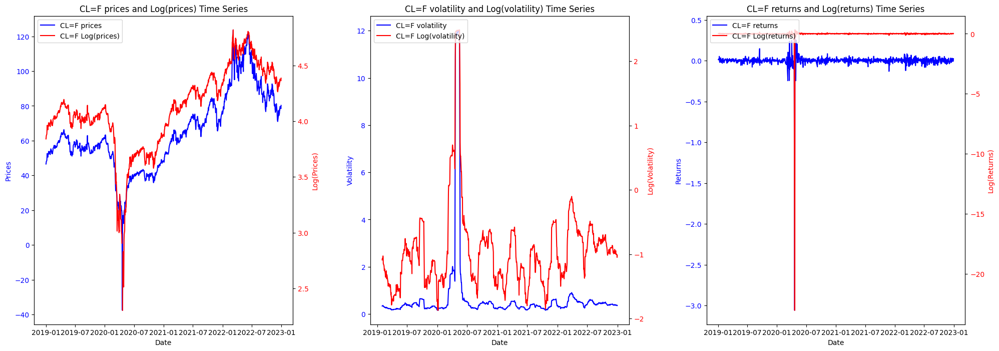

[*********************100%***********************]  1 of 1 completed





Inicializing Ticker: ^GSPC






Visualization of Ticker: ^GSPC




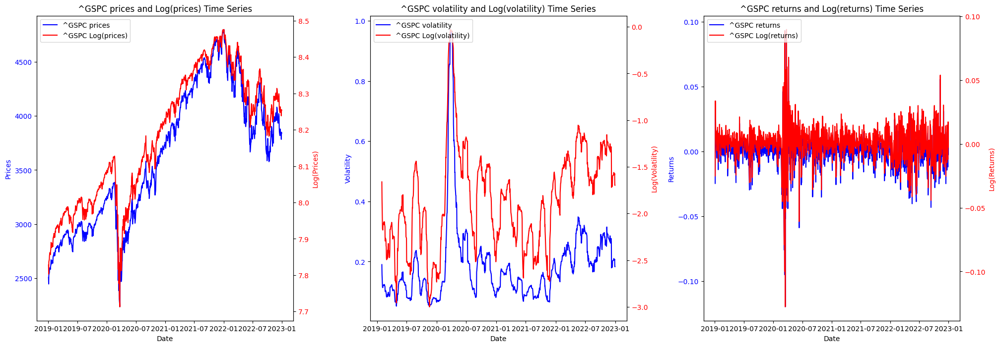

[*********************100%***********************]  1 of 1 completed





Inicializing Ticker: NVDA






Visualization of Ticker: NVDA




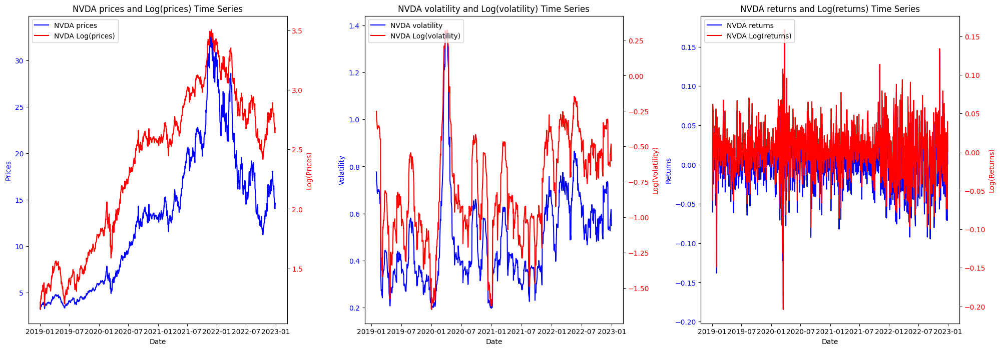

In [ ]:
# Starting the data

asset = {}
start_date = '2019-01-01'
end_date = '2022-12-31'

tickers = ['CL=F', '^GSPC', 'NVDA']  # This trio I believe is interesting, Oil Futures (Commodities), ARKK is an ETF and NVDA is a company

# I am testing and adding tkts with interesting results here, VIX is actually the best but it was used in the class so I am not sure it is allowed
# good ones = 'ARKK', 'PTON', 'BABA', 'MRNA', 'GDX', 'CL=F', 'NVDA', 'GME', '^VIX', 'ARKK','TSLA', 'XLE'

# not fit tickers = AAPL, DIS, BA, BTC-USD, ^FVX

for ticker in tickers:
    print('\n')
    print('Inicializing Ticker:', ticker)
    print('\n')
    asset[ticker] = Asset(ticker, start_date, end_date, frequency='1d')
    print('\n')
    print('Visualization of Ticker:', ticker)
    print('\n')
    asset[ticker].plot_all()
    print('\n')

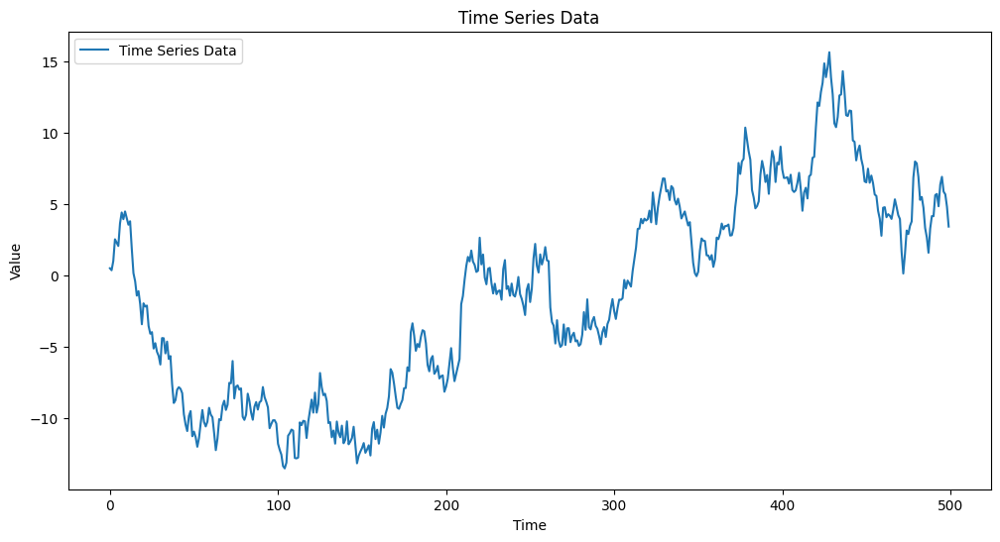

ADF Statistic: -1.498630478503646
p-value: 0.5341887124972032


<Figure size 1200x600 with 0 Axes>

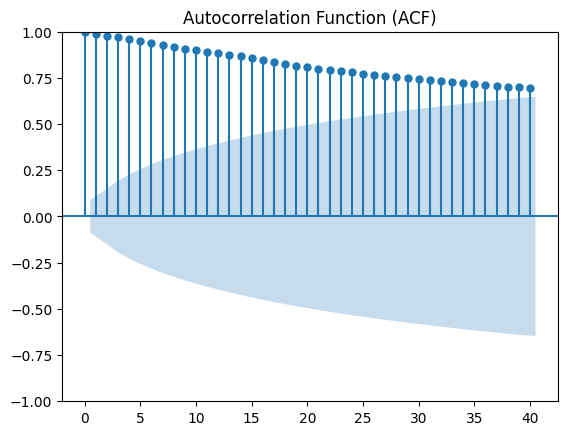

<Figure size 1200x600 with 0 Axes>

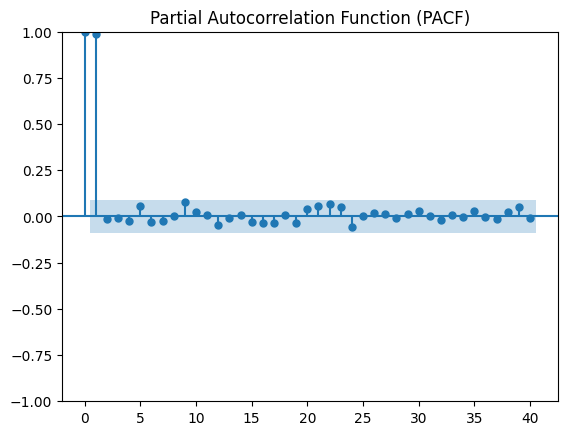

In [ ]:
# Step 1: Simulate or load the time series data
# Replace this with actual time series data
np.random.seed(42)  # For reproducibility
n_samples = 500
y = np.cumsum(np.random.normal(size=n_samples))  # Generating a non-stationary time series

# Step 2: Plot the time series to visually inspect for stationarity
plt.figure(figsize=(12, 6))
plt.plot(y, label='Time Series Data')
plt.title('Time Series Data')
plt.xlabel('Time')
plt.ylabel('Value')
plt.legend()
plt.show()

# Step 3: Perform the Augmented Dickey-Fuller (ADF) test for stationarity
adf_result = adfuller(y)
print('ADF Statistic:', adf_result[0])
print('p-value:', adf_result[1])

# Step 4: Calculate and plot the ACF and PACF
# ACF plot
plt.figure(figsize=(12, 6))
plot_acf(y, lags=40)
plt.title('Autocorrelation Function (ACF)')
plt.show()

# PACF plot
plt.figure(figsize=(12, 6))
plot_pacf(y, lags=40)
plt.title('Partial Autocorrelation Function (PACF)')
plt.show()

# Step 5: Interpretation
# For a stationary process:
# - The ACF should drop off rapidly.
# - The PACF should show significant values at the first few lags and then drop off.


Initial type of data: <class 'pandas.core.frame.DataFrame'>
Data after dropping NaNs:
Ticker                         CL=F
Date                               
2019-01-02 00:00:00+00:00  3.840312
2019-01-03 00:00:00+00:00  3.852061
2019-01-04 00:00:00+00:00  3.870367
2019-01-07 00:00:00+00:00  3.881976
2019-01-08 00:00:00+00:00  3.907613
Data successfully reshaped into a 2D array for EM processing.
Data type after transformation: <class 'numpy.ndarray'>
Input data shape: (1007, 1)
Data flattened for EM analysis. Shape: (1007,)

Running analyses for different numbers of states but constant mu and sigma...

Analyzing model with 2 states constant mu and sigma:


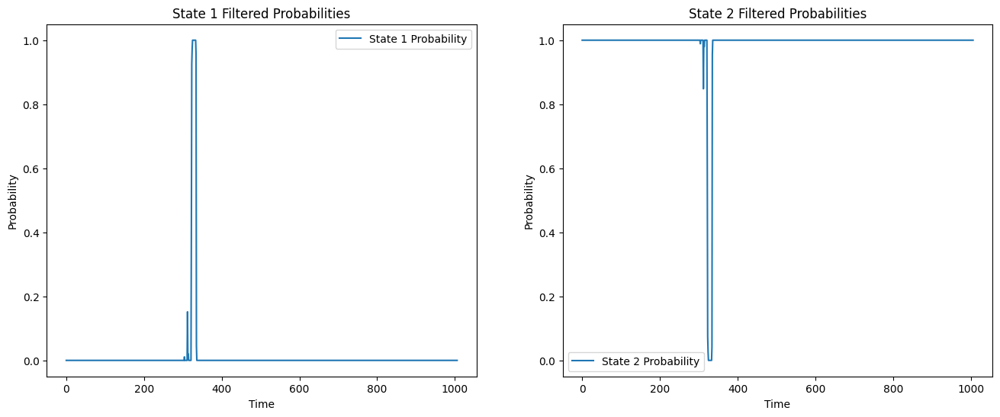

Iteration 0: Max Diff = 5.436601976997402
mu_hat0: [2 4]
mu_hat1: [4.10753314 4.10753314]
sigma_hat0: [0.1 0.1]
sigma_hat1: [0.37210193 0.37210193]
P_hat0: [[0.7 0.3]
 [0.3 0.7]]
P_hat1: [[0.90288603 0.09711397]
 [0.00122246 0.99877754]]


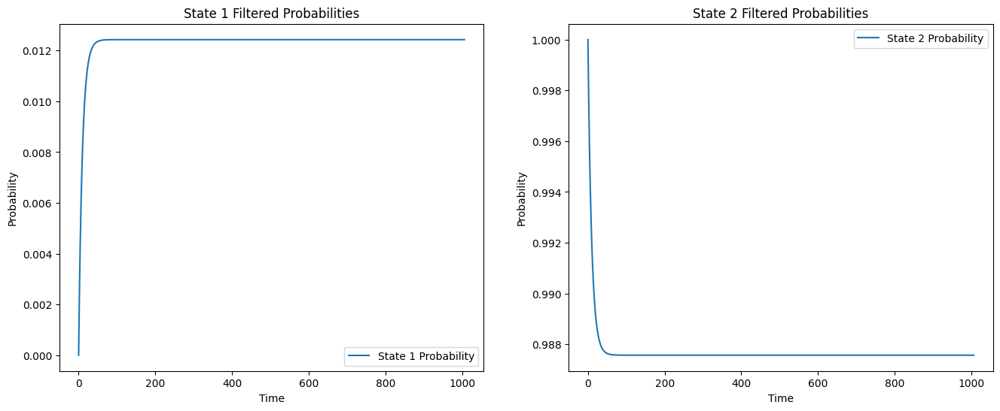

Iteration 1: Max Diff = 4.629630012686903e-10
mu_hat0: [4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314]
sigma_hat0: [0.37210193 0.37210193]
sigma_hat1: [0.37210193 0.37210193]
P_hat0: [[0.90288603 0.09711397]
 [0.00122246 0.99877754]]
P_hat1: [[0.90288603 0.09711397]
 [0.00122246 0.99877754]]
Converged:
{   'P_hat': '[[0.9029 0.0971]\n [0.0012 0.9988]]',
    'mu_hat': '[4.1075 4.1075]',
    'pi_hat': '[0. 1.]',
    'sigma_hat': '[0.3721 0.3721]'}

Analyzing model with 3 states constant mu and sigma:


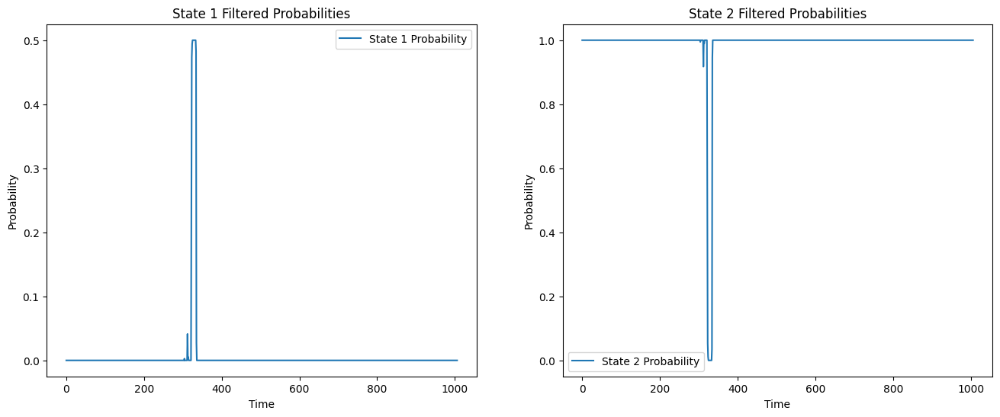

Iteration 0: Max Diff = 8.154902965496102
mu_hat0: [2 4 2]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.1 0.1 0.1]
sigma_hat1: [0.37210193 0.37210193 0.37210193]
P_hat0: [[0.7  0.15 0.15]
 [0.15 0.7  0.15]
 [0.15 0.15 0.7 ]]
P_hat1: [[7.50501984e-01 8.86761628e-02 1.60821854e-01]
 [5.58847550e-04 9.98882305e-01 5.58847550e-04]
 [1.60821854e-01 8.86761628e-02 7.50501984e-01]]


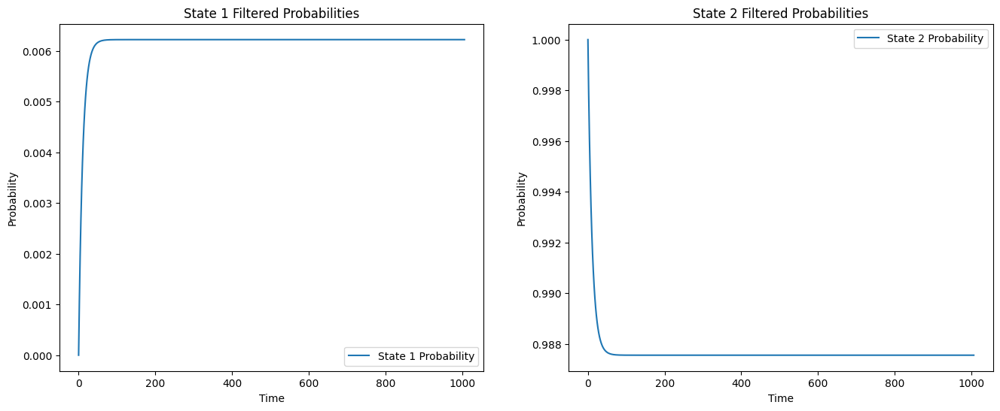

Iteration 1: Max Diff = 4.951594689828198e-10
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.37210193 0.37210193 0.37210193]
sigma_hat1: [0.37210193 0.37210193 0.37210193]
P_hat0: [[7.50501984e-01 8.86761628e-02 1.60821854e-01]
 [5.58847550e-04 9.98882305e-01 5.58847550e-04]
 [1.60821854e-01 8.86761628e-02 7.50501984e-01]]
P_hat1: [[7.50501984e-01 8.86761628e-02 1.60821854e-01]
 [5.58847550e-04 9.98882305e-01 5.58847550e-04]
 [1.60821854e-01 8.86761628e-02 7.50501984e-01]]
Converged:
{   'P_hat': '[[0.7505 0.0887 0.1608]\n'
             ' [0.0006 0.9989 0.0006]\n'
             ' [0.1608 0.0887 0.7505]]',
    'mu_hat': '[4.1075 4.1075 4.1075]',
    'pi_hat': '[0. 1. 0.]',
    'sigma_hat': '[0.3721 0.3721 0.3721]'}

Analyzing model with 4 states constant mu and sigma:


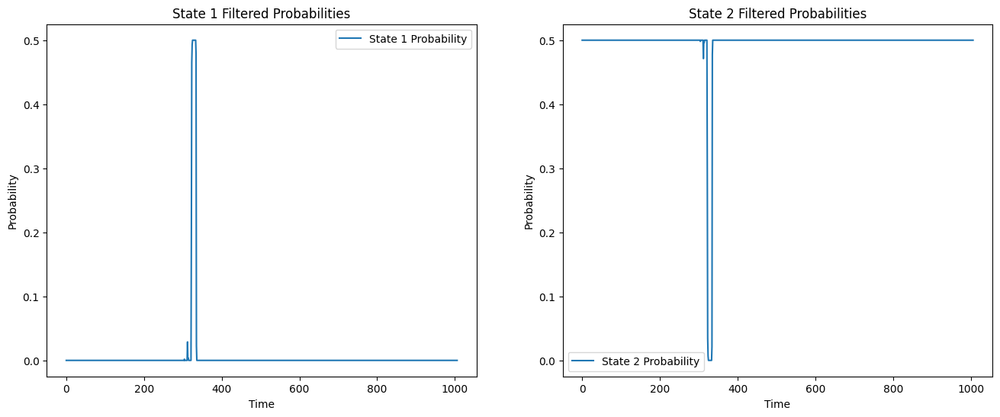

Iteration 0: Max Diff = 12.462607400865728
mu_hat0: [2 4 2 4]
mu_hat1: [4.10753314 4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.1 0.1 0.1 0.1]
sigma_hat1: [0.37210193 0.37210193 0.37210193 0.37210193]
P_hat0: [[0.7 0.1 0.1 0.1]
 [0.1 0.7 0.1 0.1]
 [0.1 0.1 0.7 0.1]
 [0.1 0.1 0.1 0.7]]
P_hat1: [[7.98842692e-01 4.35184615e-02 1.14120385e-01 4.35184615e-02]
 [5.43163381e-04 8.74049464e-01 5.43163381e-04 1.24864209e-01]
 [1.14120385e-01 4.35184615e-02 7.98842692e-01 4.35184615e-02]
 [5.43163381e-04 1.24864209e-01 5.43163381e-04 8.74049464e-01]]


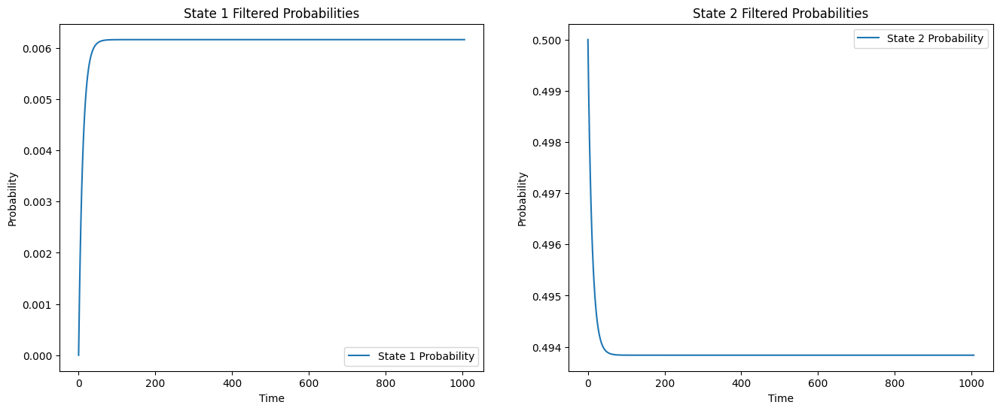

Iteration 1: Max Diff = 7.105427357601002e-11
mu_hat0: [4.10753314 4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.37210193 0.37210193 0.37210193 0.37210193]
sigma_hat1: [0.37210193 0.37210193 0.37210193 0.37210193]
P_hat0: [[7.98842692e-01 4.35184615e-02 1.14120385e-01 4.35184615e-02]
 [5.43163381e-04 8.74049464e-01 5.43163381e-04 1.24864209e-01]
 [1.14120385e-01 4.35184615e-02 7.98842692e-01 4.35184615e-02]
 [5.43163381e-04 1.24864209e-01 5.43163381e-04 8.74049464e-01]]
P_hat1: [[7.98842692e-01 4.35184615e-02 1.14120385e-01 4.35184615e-02]
 [5.43163381e-04 8.74049464e-01 5.43163381e-04 1.24864209e-01]
 [1.14120385e-01 4.35184615e-02 7.98842692e-01 4.35184615e-02]
 [5.43163381e-04 1.24864209e-01 5.43163381e-04 8.74049464e-01]]
Converged:
{   'P_hat': '[[0.7988 0.0435 0.1141 0.0435]\n'
             ' [0.0005 0.874  0.0005 0.1249]\n'
             ' [0.1141 0.0435 0.7988 0.0435]\n'
             ' [0.0005 0.1249 0.0005 0.874 ]]',
   

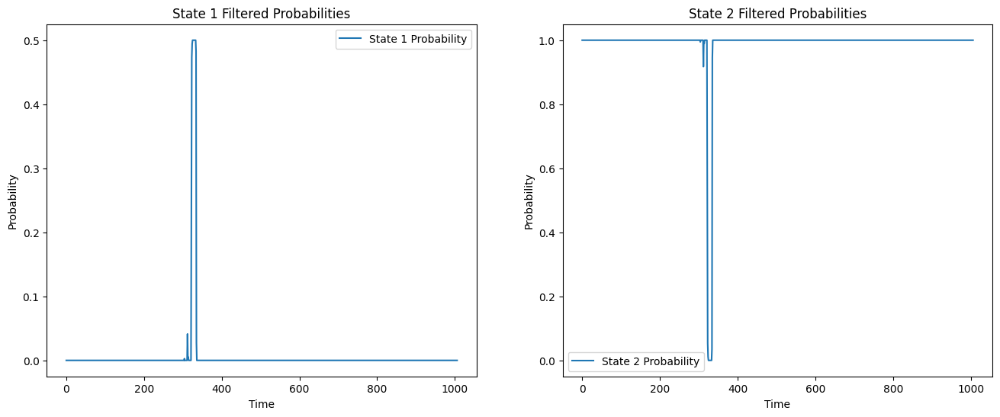

Iteration 0: Max Diff = 7.209858296328707
mu_hat0: [2 4 2]
mu_hat1: [2.77159202 4.12435473 2.77159202]
sigma_hat0: [0.1 0.1 0.1]
sigma_hat1: [0.34056894 0.34056894 0.34056894]
P_hat0: [[0.7  0.15 0.15]
 [0.15 0.7  0.15]
 [0.15 0.15 0.7 ]]
P_hat1: [[7.50501984e-01 8.86761628e-02 1.60821854e-01]
 [5.58847550e-04 9.98882305e-01 5.58847550e-04]
 [1.60821854e-01 8.86761628e-02 7.50501984e-01]]


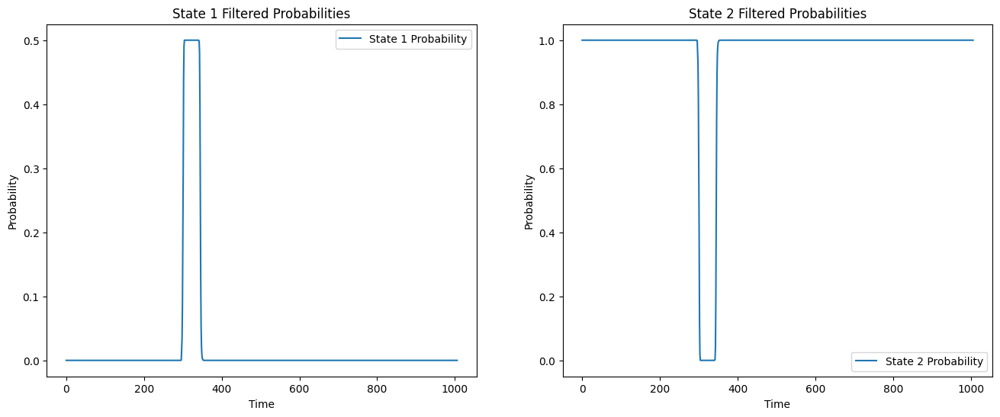

Iteration 1: Max Diff = 402.85201770203196
mu_hat0: [2.77159202 4.12435473 2.77159202]
mu_hat1: [3.07501173 4.15562726 3.07501173]
sigma_hat0: [0.34056894 0.34056894 0.34056894]
sigma_hat1: [0.29799605 0.29799605 0.29799605]
P_hat0: [[7.50501984e-01 8.86761628e-02 1.60821854e-01]
 [5.58847550e-04 9.98882305e-01 5.58847550e-04]
 [1.60821854e-01 8.86761628e-02 7.50501984e-01]]
P_hat1: [[8.05115941e-01 2.23592141e-02 1.72524845e-01]
 [5.21279907e-04 9.98957440e-01 5.21279907e-04]
 [1.72524845e-01 2.23592141e-02 8.05115941e-01]]


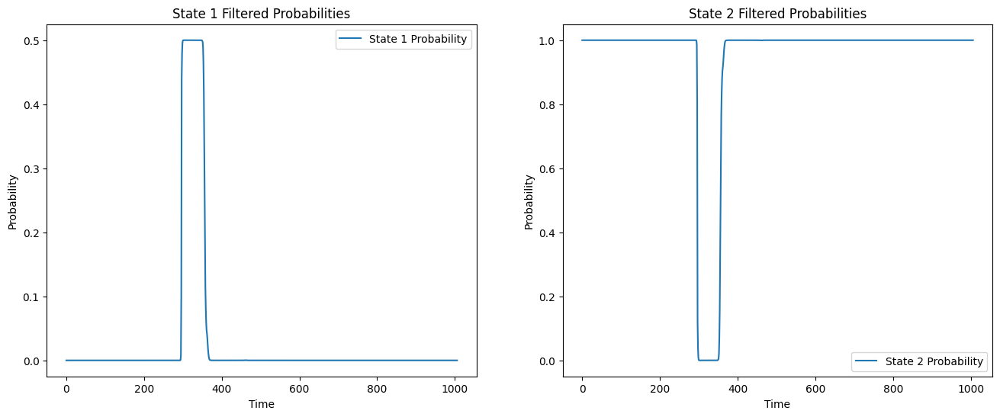

Iteration 2: Max Diff = 36.79495412325401
mu_hat0: [3.07501173 4.15562726 3.07501173]
mu_hat1: [3.19071799 4.16589714 3.19071799]
sigma_hat0: [0.29799605 0.29799605 0.29799605]
sigma_hat1: [0.29146329 0.29146329 0.29146329]
P_hat0: [[8.05115941e-01 2.23592141e-02 1.72524845e-01]
 [5.21279907e-04 9.98957440e-01 5.21279907e-04]
 [1.72524845e-01 2.23592141e-02 8.05115941e-01]]
P_hat1: [[8.09814697e-01 1.66535828e-02 1.73531721e-01]
 [5.30639956e-04 9.98938720e-01 5.30639956e-04]
 [1.73531721e-01 1.66535828e-02 8.09814697e-01]]


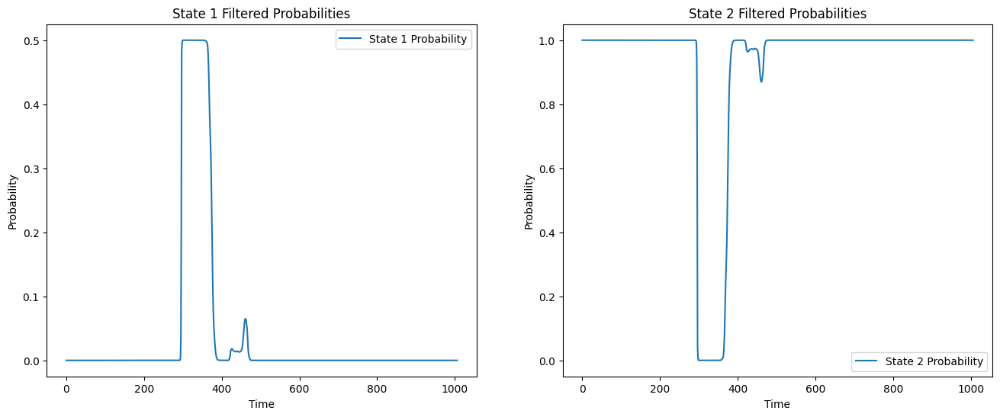

Iteration 3: Max Diff = 14.216213674423809
mu_hat0: [3.19071799 4.16589714 3.19071799]
mu_hat1: [3.30439012 4.17681938 3.30439012]
sigma_hat0: [0.29146329 0.29146329 0.29146329]
sigma_hat1: [0.28777263 0.28777263 0.28777263]
P_hat0: [[8.09814697e-01 1.66535828e-02 1.73531721e-01]
 [5.30639956e-04 9.98938720e-01 5.30639956e-04]
 [1.73531721e-01 1.66535828e-02 8.09814697e-01]]
P_hat1: [[8.11581574e-01 1.45080889e-02 1.73910337e-01]
 [6.26474137e-04 9.98747052e-01 6.26474137e-04]
 [1.73910337e-01 1.45080889e-02 8.11581574e-01]]


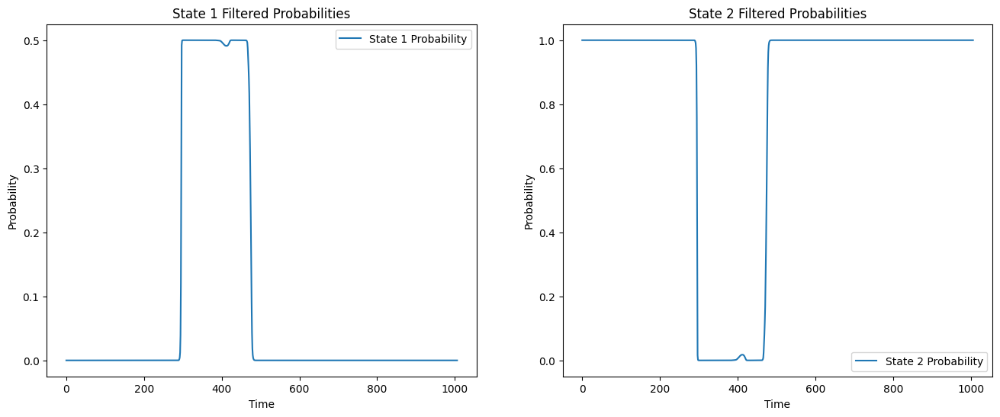

Iteration 4: Max Diff = 48.2436392060667
mu_hat0: [3.30439012 4.17681938 3.30439012]
mu_hat1: [3.52279531 4.23332384 3.52279531]
sigma_hat0: [0.28777263 0.28777263 0.28777263]
sigma_hat1: [0.25476512 0.25476512 0.25476512]
P_hat0: [[8.11581574e-01 1.45080889e-02 1.73910337e-01]
 [6.26474137e-04 9.98747052e-01 6.26474137e-04]
 [1.73910337e-01 1.45080889e-02 8.11581574e-01]]
P_hat1: [[8.18791592e-01 5.75306636e-03 1.75455341e-01]
 [6.19557596e-04 9.98760885e-01 6.19557596e-04]
 [1.75455341e-01 5.75306636e-03 8.18791592e-01]]


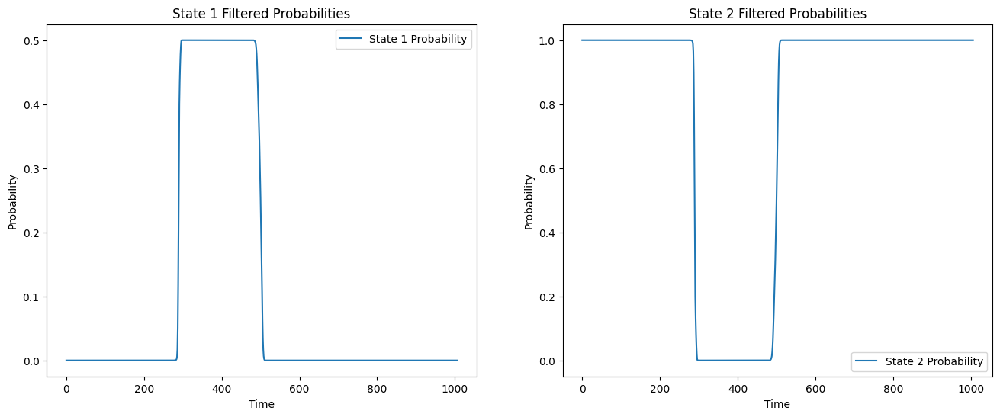

Iteration 5: Max Diff = 5.49985256431419
mu_hat0: [3.52279531 4.23332384 3.52279531]
mu_hat1: [3.56868555 4.24935866 3.56868555]
sigma_hat0: [0.25476512 0.25476512 0.25476512]
sigma_hat1: [0.2490733 0.2490733 0.2490733]
P_hat0: [[8.18791592e-01 5.75306636e-03 1.75455341e-01]
 [6.19557596e-04 9.98760885e-01 6.19557596e-04]
 [1.75455341e-01 5.75306636e-03 8.18791592e-01]]
P_hat1: [[8.19598643e-01 4.77307603e-03 1.75628281e-01]
 [6.28932437e-04 9.98742135e-01 6.28932437e-04]
 [1.75628281e-01 4.77307603e-03 8.19598643e-01]]


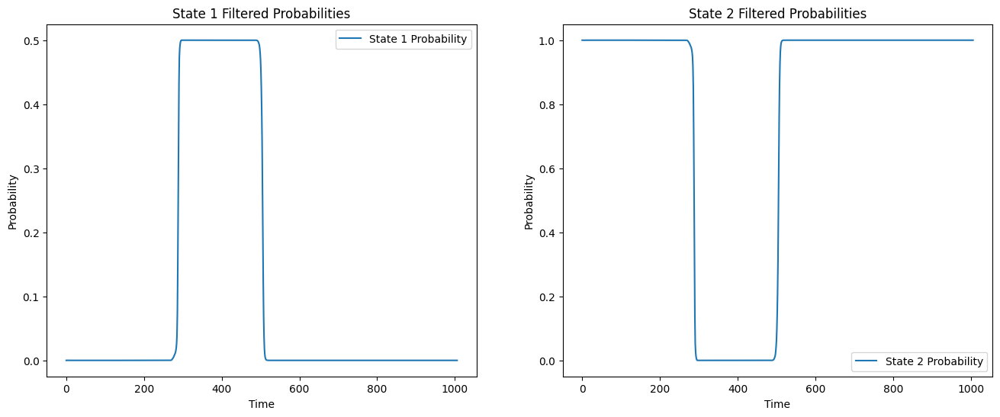

Iteration 6: Max Diff = 0.9177160960739196
mu_hat0: [3.56868555 4.24935866 3.56868555]
mu_hat1: [3.57947204 4.25275683 3.57947204]
sigma_hat0: [0.2490733 0.2490733 0.2490733]
sigma_hat1: [0.24854148 0.24854148 0.24854148]
P_hat0: [[8.19598643e-01 4.77307603e-03 1.75628281e-01]
 [6.28932437e-04 9.98742135e-01 6.28932437e-04]
 [1.75628281e-01 4.77307603e-03 8.19598643e-01]]
P_hat1: [[8.19731396e-01 4.61187667e-03 1.75656728e-01]
 [6.34971332e-04 9.98730057e-01 6.34971332e-04]
 [1.75656728e-01 4.61187667e-03 8.19731396e-01]]


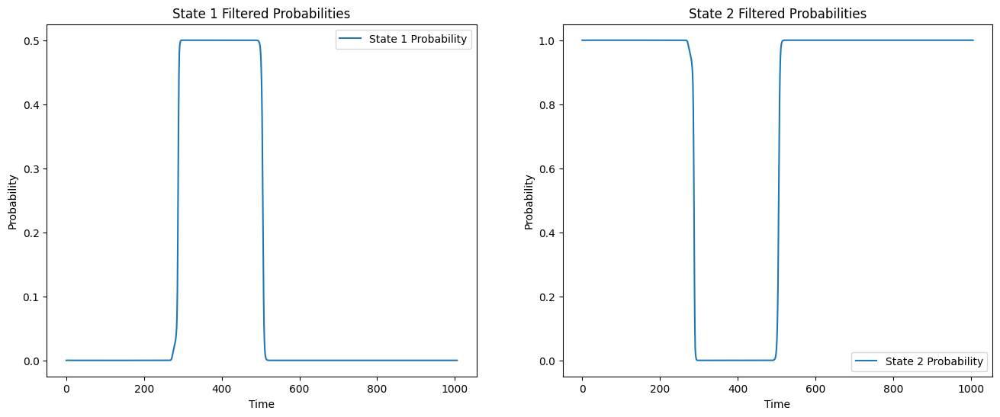

Iteration 7: Max Diff = 0.17292386060570497
mu_hat0: [3.57947204 4.25275683 3.57947204]
mu_hat1: [3.58179323 4.25338831 3.58179323]
sigma_hat0: [0.24854148 0.24854148 0.24854148]
sigma_hat1: [0.24855173 0.24855173 0.24855173]
P_hat0: [[8.19731396e-01 4.61187667e-03 1.75656728e-01]
 [6.34971332e-04 9.98730057e-01 6.34971332e-04]
 [1.75656728e-01 4.61187667e-03 8.19731396e-01]]
P_hat1: [[8.19756447e-01 4.58145696e-03 1.75662096e-01]
 [6.36325149e-04 9.98727350e-01 6.36325149e-04]
 [1.75662096e-01 4.58145696e-03 8.19756447e-01]]


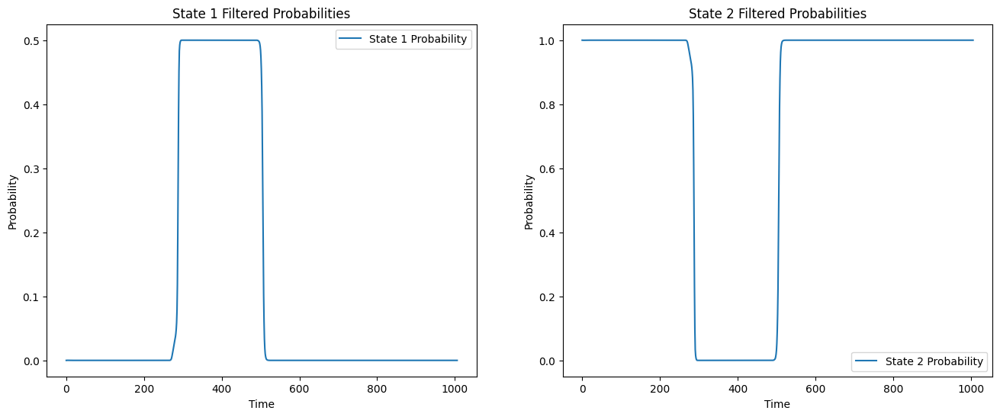

Iteration 8: Max Diff = 0.04285478335664794
mu_hat0: [3.58179323 4.25338831 3.58179323]
mu_hat1: [3.58238382 4.2535435  3.58238382]
sigma_hat0: [0.24855173 0.24855173 0.24855173]
sigma_hat1: [0.24856108 0.24856108 0.24856108]
P_hat0: [[8.19756447e-01 4.58145696e-03 1.75662096e-01]
 [6.36325149e-04 9.98727350e-01 6.36325149e-04]
 [1.75662096e-01 4.58145696e-03 8.19756447e-01]]
P_hat1: [[8.19762661e-01 4.57391189e-03 1.75663427e-01]
 [6.36668841e-04 9.98726662e-01 6.36668840e-04]
 [1.75663427e-01 4.57391189e-03 8.19762661e-01]]


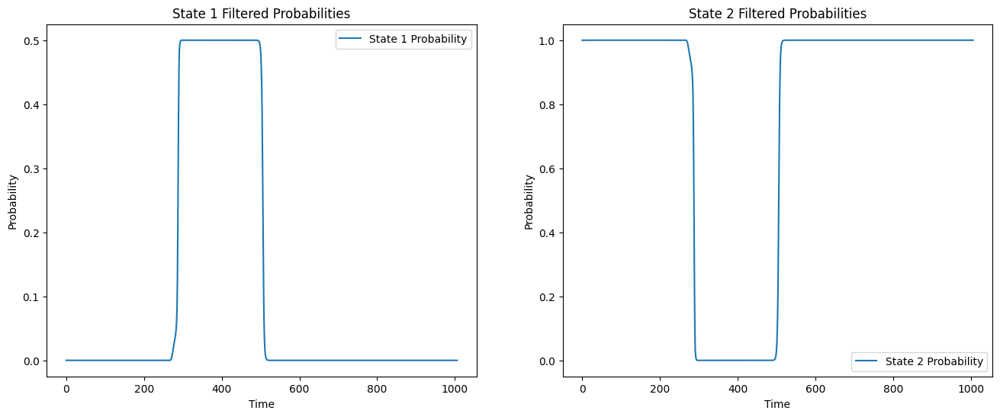

Iteration 9: Max Diff = 0.011396816076532677
mu_hat0: [3.58238382 4.2535435  3.58238382]
mu_hat1: [3.58254157 4.25358471 3.58254157]
sigma_hat0: [0.24856108 0.24856108 0.24856108]
sigma_hat1: [0.24856388 0.24856388 0.24856388]
P_hat0: [[8.19762661e-01 4.57391189e-03 1.75663427e-01]
 [6.36668841e-04 9.98726662e-01 6.36668840e-04]
 [1.75663427e-01 4.57391189e-03 8.19762661e-01]]
P_hat1: [[8.19764314e-01 4.57190463e-03 1.75663782e-01]
 [6.36760497e-04 9.98726479e-01 6.36760497e-04]
 [1.75663782e-01 4.57190463e-03 8.19764314e-01]]


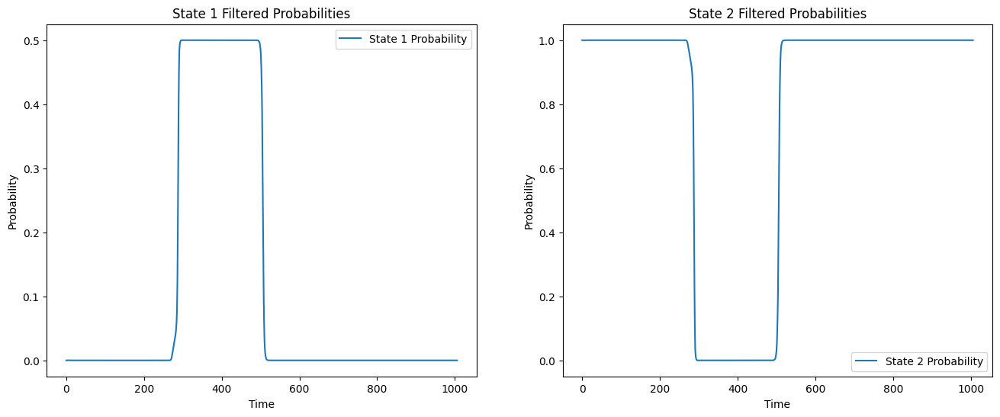

Iteration 10: Max Diff = 0.0030826233765975757
mu_hat0: [3.58254157 4.25358471 3.58254157]
mu_hat1: [3.58258428 4.25359586 3.58258428]
sigma_hat0: [0.24856388 0.24856388 0.24856388]
sigma_hat1: [0.24856466 0.24856466 0.24856466]
P_hat0: [[8.19764314e-01 4.57190463e-03 1.75663782e-01]
 [6.36760497e-04 9.98726479e-01 6.36760497e-04]
 [1.75663782e-01 4.57190463e-03 8.19764314e-01]]
P_hat1: [[8.19764761e-01 4.57136166e-03 1.75663877e-01]
 [6.36785302e-04 9.98726429e-01 6.36785298e-04]
 [1.75663877e-01 4.57136163e-03 8.19764761e-01]]
Converged:
{   'P_hat': '[[0.8198 0.0046 0.1757]\n'
             ' [0.0006 0.9987 0.0006]\n'
             ' [0.1757 0.0046 0.8198]]',
    'mu_hat': '[3.5826 4.2536 3.5826]',
    'pi_hat': '[0. 1. 0.]',
    'sigma_hat': '[0.2486 0.2486 0.2486]'}

Analyzing model with constant mu (mean):


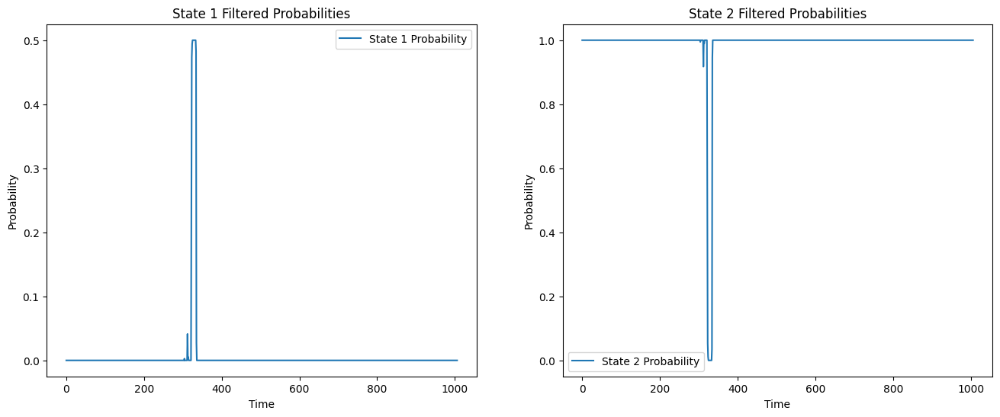

Iteration 0: Max Diff = 27.45827532934487
mu_hat0: [2 4 2]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.1 0.1 0.1]
sigma_hat1: [1.35315233 0.34226869 1.35315233]
P_hat0: [[0.7  0.15 0.15]
 [0.15 0.7  0.15]
 [0.15 0.15 0.7 ]]
P_hat1: [[7.50501984e-01 8.86761628e-02 1.60821854e-01]
 [5.58847550e-04 9.98882305e-01 5.58847550e-04]
 [1.60821854e-01 8.86761628e-02 7.50501984e-01]]


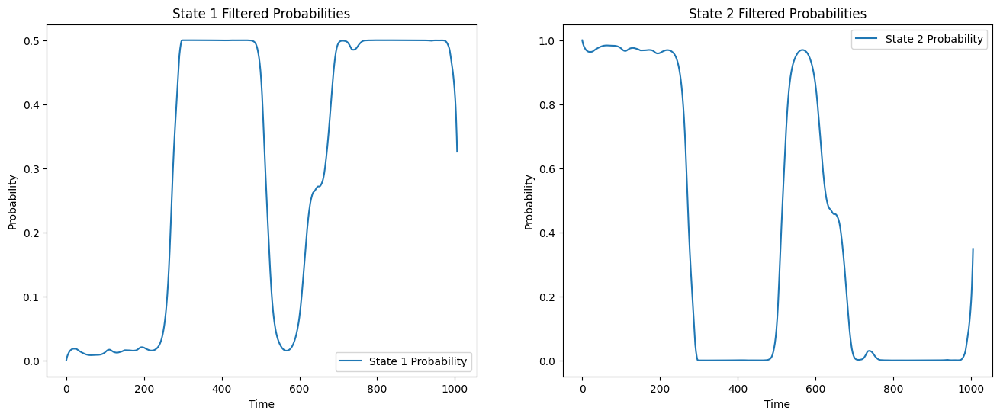

Iteration 1: Max Diff = 535.3717704659612
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [1.35315233 0.34226869 1.35315233]
sigma_hat1: [0.46901729 0.09968684 0.46901729]
P_hat0: [[7.50501984e-01 8.86761628e-02 1.60821854e-01]
 [5.58847550e-04 9.98882305e-01 5.58847550e-04]
 [1.60821854e-01 8.86761628e-02 7.50501984e-01]]
P_hat1: [[0.82053712 0.00363349 0.17582938]
 [0.00369827 0.99260345 0.00369827]
 [0.17582938 0.00363349 0.82053712]]


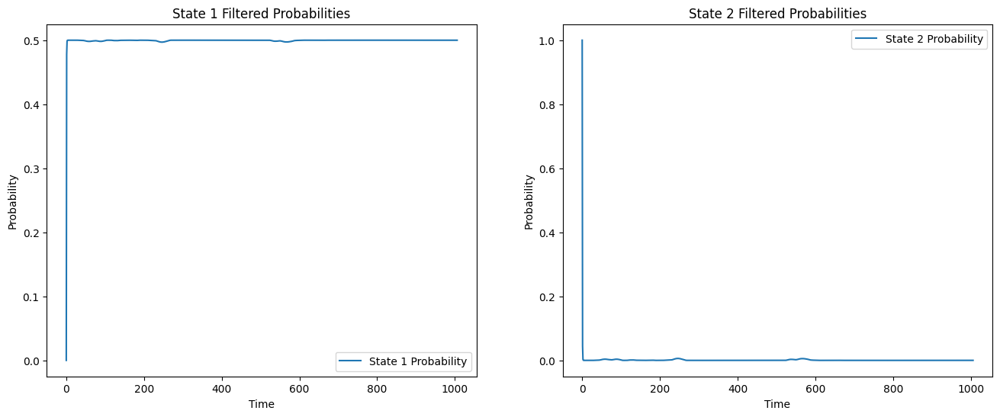

Iteration 2: Max Diff = 349.7902482430349
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.46901729 0.09968684 0.46901729]
sigma_hat1: [0.37230269 0.21520889 0.37230269]
P_hat0: [[0.82053712 0.00363349 0.17582938]
 [0.00369827 0.99260345 0.00369827]
 [0.17582938 0.00363349 0.82053712]]
P_hat1: [[8.23475969e-01 6.48949338e-05 1.76459136e-01]
 [3.26614545e-01 3.46770909e-01 3.26614545e-01]
 [1.76459136e-01 6.48949338e-05 8.23475969e-01]]


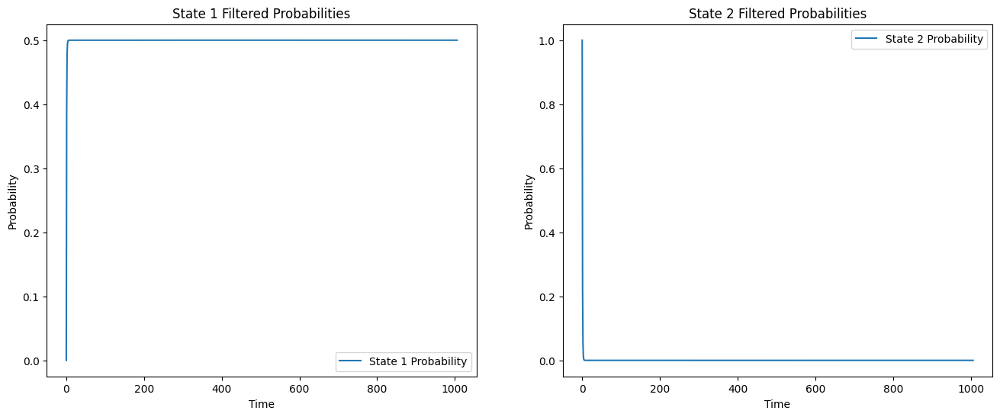

Iteration 3: Max Diff = 1442.3816676434283
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.37230269 0.21520889 0.37230269]
sigma_hat1: [0.37222855 0.26051963 0.37222855]
P_hat0: [[8.23475969e-01 6.48949338e-05 1.76459136e-01]
 [3.26614545e-01 3.46770909e-01 3.26614545e-01]
 [1.76459136e-01 6.48949338e-05 8.23475969e-01]]
P_hat1: [[8.23499333e-01 3.65240387e-05 1.76464143e-01]
 [3.86046532e-01 2.27906936e-01 3.86046532e-01]
 [1.76464143e-01 3.65240387e-05 8.23499333e-01]]


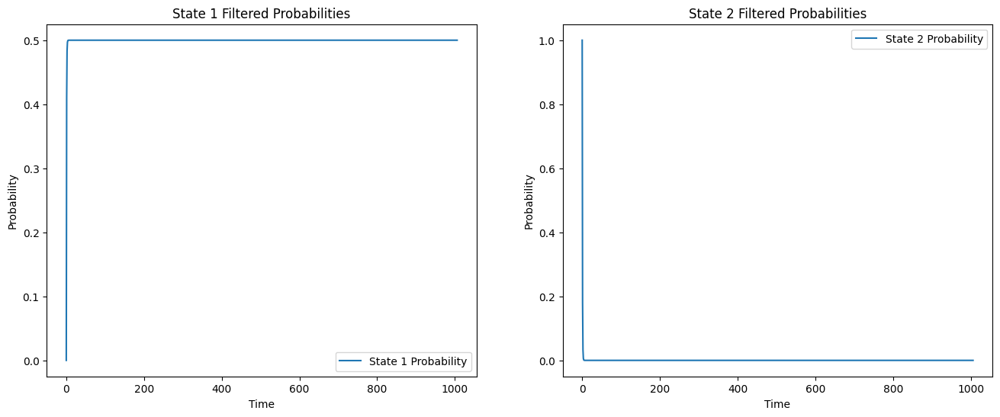

Iteration 4: Max Diff = 683.461997801061
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.37222855 0.26051963 0.37222855]
sigma_hat1: [0.37221738 0.26355713 0.37221738]
P_hat0: [[8.23499333e-01 3.65240387e-05 1.76464143e-01]
 [3.86046532e-01 2.27906936e-01 3.86046532e-01]
 [1.76464143e-01 3.65240387e-05 8.23499333e-01]]
P_hat1: [[8.23508510e-01 2.53809558e-05 1.76466109e-01]
 [4.09362637e-01 1.81274726e-01 4.09362637e-01]
 [1.76466109e-01 2.53809558e-05 8.23508510e-01]]


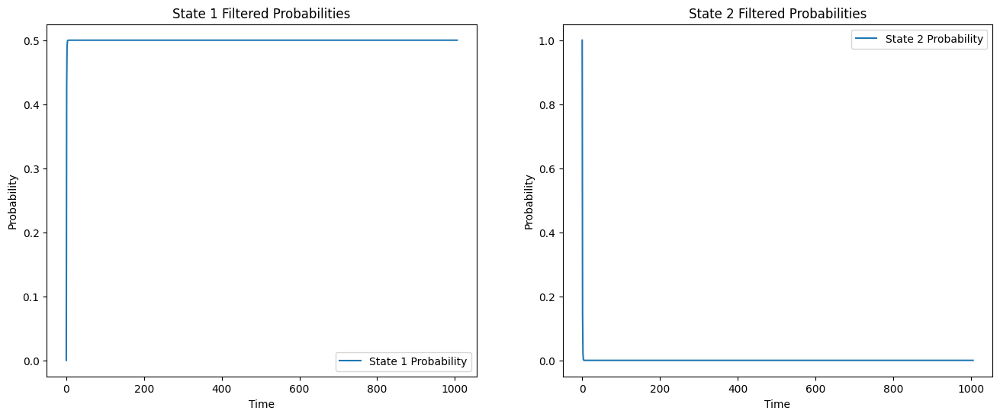

Iteration 5: Max Diff = 577.0267814458865
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.37221738 0.26355713 0.37221738]
sigma_hat1: [0.37221082 0.26459183 0.37221082]
P_hat0: [[8.23508510e-01 2.53809558e-05 1.76466109e-01]
 [4.09362637e-01 1.81274726e-01 4.09362637e-01]
 [1.76466109e-01 2.53809558e-05 8.23508510e-01]]
P_hat1: [[8.23514575e-01 1.80163620e-05 1.76467409e-01]
 [4.27442315e-01 1.45115371e-01 4.27442315e-01]
 [1.76467409e-01 1.80163620e-05 8.23514575e-01]]


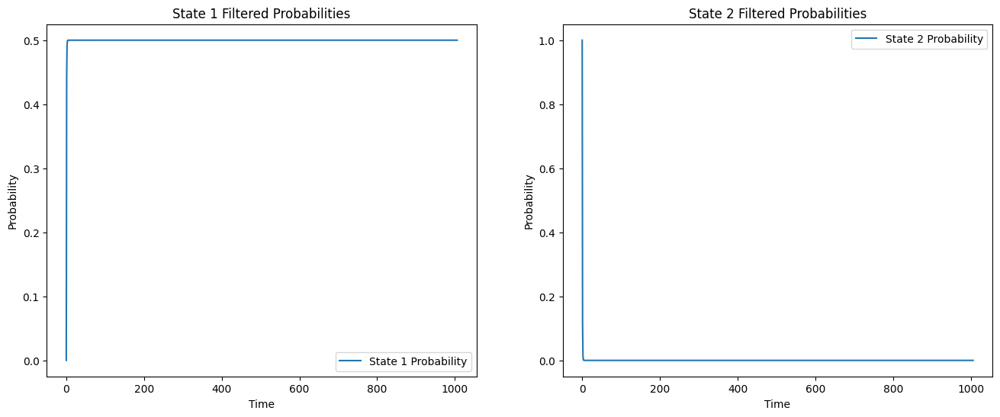

Iteration 6: Max Diff = 489.12123959729473
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.37221082 0.26459183 0.37221082]
sigma_hat1: [0.37220618 0.26527302 0.37220618]
P_hat0: [[8.23514575e-01 1.80163620e-05 1.76467409e-01]
 [4.27442315e-01 1.45115371e-01 4.27442315e-01]
 [1.76467409e-01 1.80163620e-05 8.23514575e-01]]
P_hat1: [[8.23518762e-01 1.29315936e-05 1.76468306e-01]
 [4.41868307e-01 1.16263386e-01 4.41868307e-01]
 [1.76468306e-01 1.29315936e-05 8.23518762e-01]]


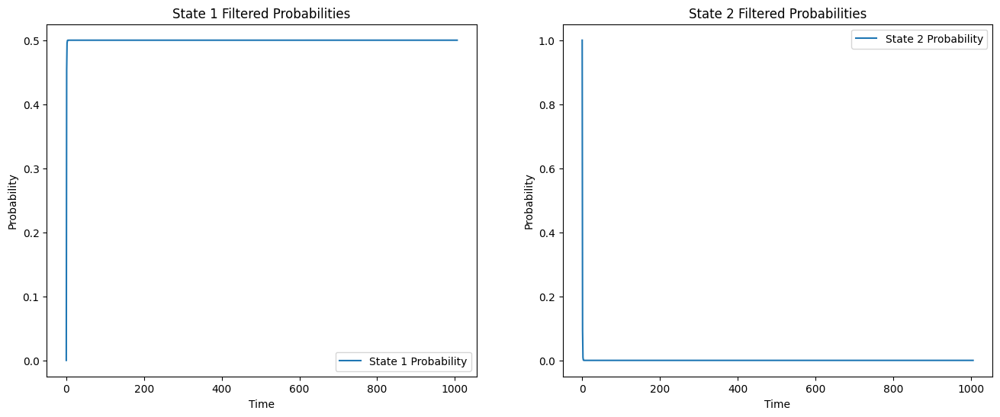

Iteration 7: Max Diff = 408.93455576934394
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.37220618 0.26527302 0.37220618]
sigma_hat1: [0.37220278 0.26575324 0.37220278]
P_hat0: [[8.23518762e-01 1.29315936e-05 1.76468306e-01]
 [4.41868307e-01 1.16263386e-01 4.41868307e-01]
 [1.76468306e-01 1.29315936e-05 8.23518762e-01]]
P_hat1: [[8.23521706e-01 9.35652270e-06 1.76468937e-01]
 [4.53410140e-01 9.31797202e-02 4.53410140e-01]
 [1.76468937e-01 9.35652270e-06 8.23521706e-01]]


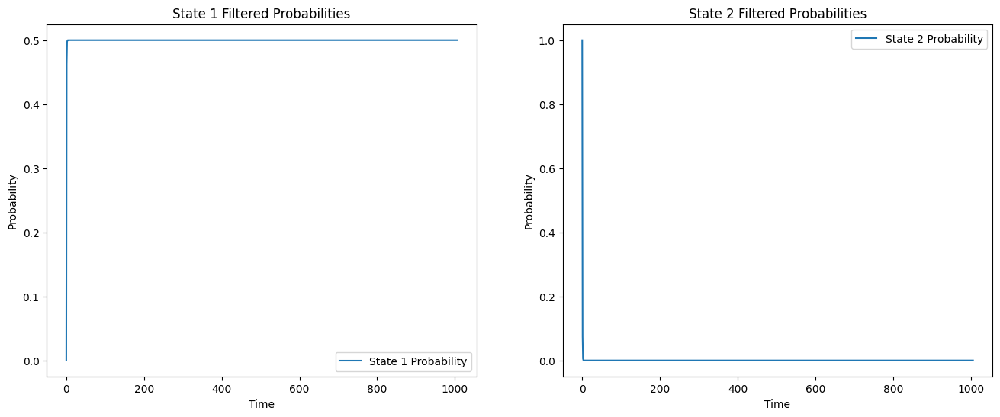

Iteration 8: Max Diff = 338.23302442317873
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.37220278 0.26575324 0.37220278]
sigma_hat1: [0.37220025 0.26610118 0.37220025]
P_hat0: [[8.23521706e-01 9.35652270e-06 1.76468937e-01]
 [4.53410140e-01 9.31797202e-02 4.53410140e-01]
 [1.76468937e-01 9.35652270e-06 8.23521706e-01]]
P_hat1: [[8.23523803e-01 6.81039558e-06 1.76469386e-01]
 [4.62654591e-01 7.46908187e-02 4.62654591e-01]
 [1.76469386e-01 6.81039558e-06 8.23523803e-01]]


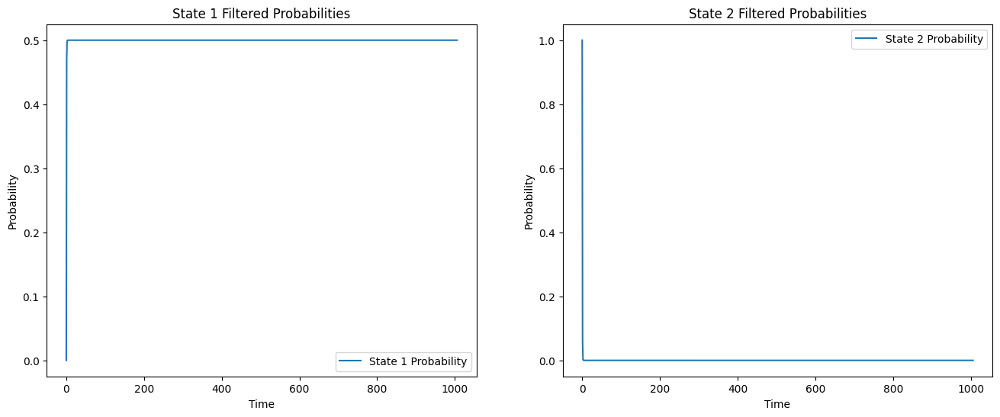

Iteration 9: Max Diff = 277.5118154927219
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.37220025 0.26610118 0.37220025]
sigma_hat1: [0.37219832 0.26635843 0.37219832]
P_hat0: [[8.23523803e-01 6.81039558e-06 1.76469386e-01]
 [4.62654591e-01 7.46908187e-02 4.62654591e-01]
 [1.76469386e-01 6.81039558e-06 8.23523803e-01]]
P_hat1: [[8.23525311e-01 4.97967479e-06 1.76469709e-01]
 [4.70063047e-01 5.98739068e-02 4.70063047e-01]
 [1.76469709e-01 4.97967479e-06 8.23525311e-01]]


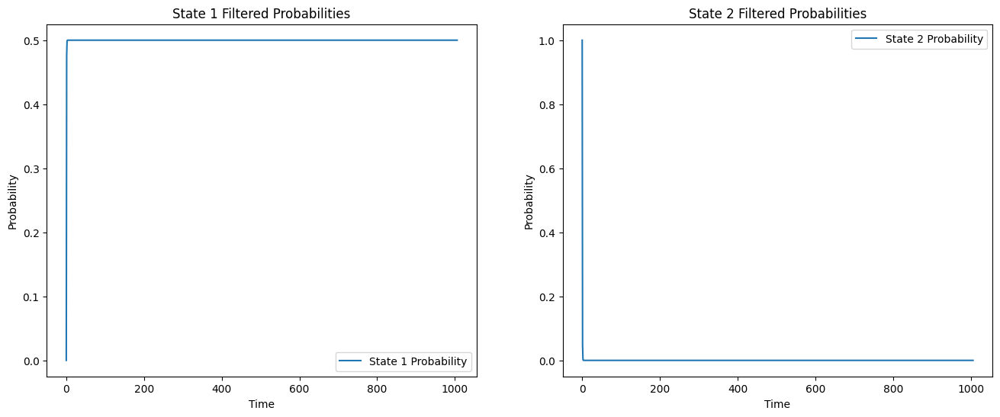

Iteration 10: Max Diff = 226.32949800466997
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.37219832 0.26635843 0.37219832]
sigma_hat1: [0.37219685 0.26655163 0.37219685]
P_hat0: [[8.23525311e-01 4.97967479e-06 1.76469709e-01]
 [4.70063047e-01 5.98739068e-02 4.70063047e-01]
 [1.76469709e-01 4.97967479e-06 8.23525311e-01]]
P_hat1: [[8.23526403e-01 3.65379888e-06 1.76469943e-01]
 [4.76001720e-01 4.79965600e-02 4.76001720e-01]
 [1.76469943e-01 3.65379888e-06 8.23526403e-01]]


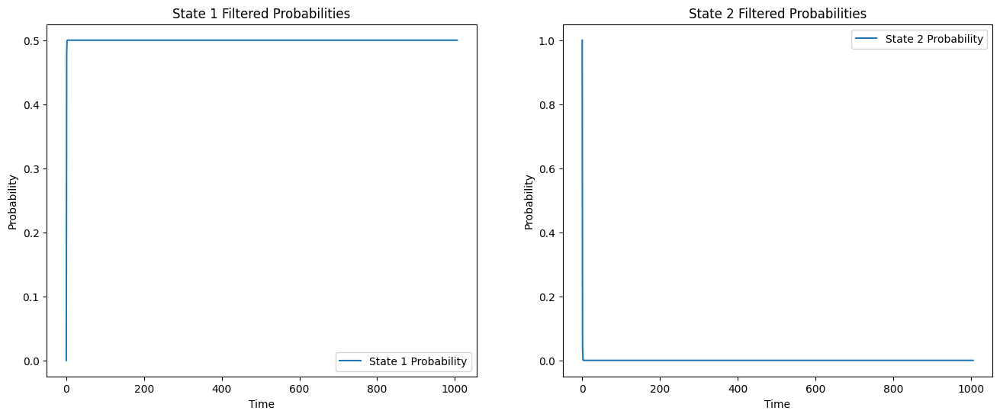

Iteration 11: Max Diff = 183.76430884269473
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.37219685 0.26655163 0.37219685]
sigma_hat1: [0.37219571 0.26669852 0.37219571]
P_hat0: [[8.23526403e-01 3.65379888e-06 1.76469943e-01]
 [4.76001720e-01 4.79965600e-02 4.76001720e-01]
 [1.76469943e-01 3.65379888e-06 8.23526403e-01]]
P_hat1: [[8.23527198e-01 2.68821286e-06 1.76470114e-01]
 [4.80762722e-01 3.84745568e-02 4.80762722e-01]
 [1.76470114e-01 2.68821286e-06 8.23527198e-01]]


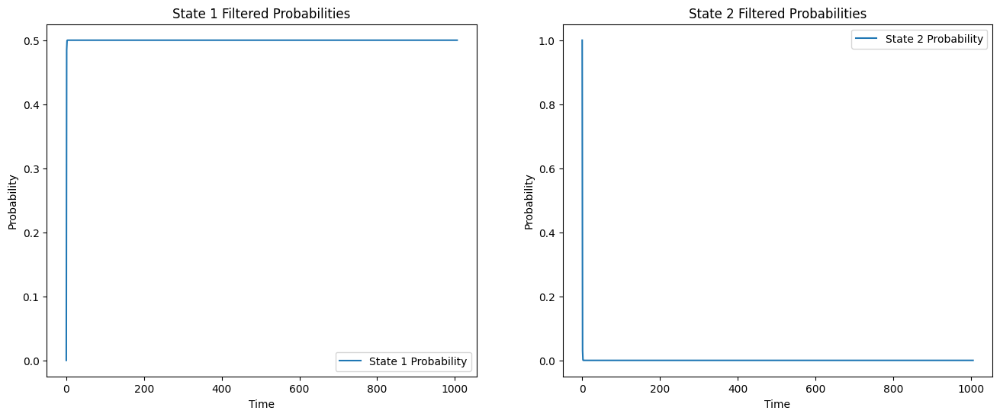

Iteration 12: Max Diff = 148.7091181178237
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.37219571 0.26669852 0.37219571]
sigma_hat1: [0.37219482 0.26681128 0.37219482]
P_hat0: [[8.23527198e-01 2.68821286e-06 1.76470114e-01]
 [4.80762722e-01 3.84745568e-02 4.80762722e-01]
 [1.76470114e-01 2.68821286e-06 8.23527198e-01]]
P_hat1: [[8.23527779e-01 1.98198722e-06 1.76470239e-01]
 [4.84579684e-01 3.08406325e-02 4.84579684e-01]
 [1.76470238e-01 1.98198722e-06 8.23527780e-01]]


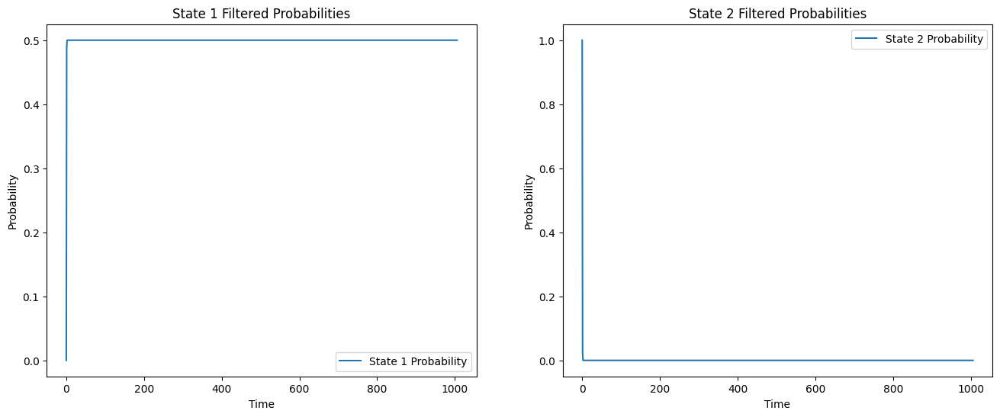

Iteration 13: Max Diff = 120.04368782239642
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.37219482 0.26681128 0.37219482]
sigma_hat1: [0.37219412 0.26689852 0.37219413]
P_hat0: [[8.23527779e-01 1.98198722e-06 1.76470239e-01]
 [4.84579684e-01 3.08406325e-02 4.84579684e-01]
 [1.76470238e-01 1.98198722e-06 8.23527780e-01]]
P_hat1: [[8.23528205e-01 1.46372381e-06 1.76470331e-01]
 [4.87639738e-01 2.47205221e-02 4.87639740e-01]
 [1.76470329e-01 1.46372379e-06 8.23528207e-01]]


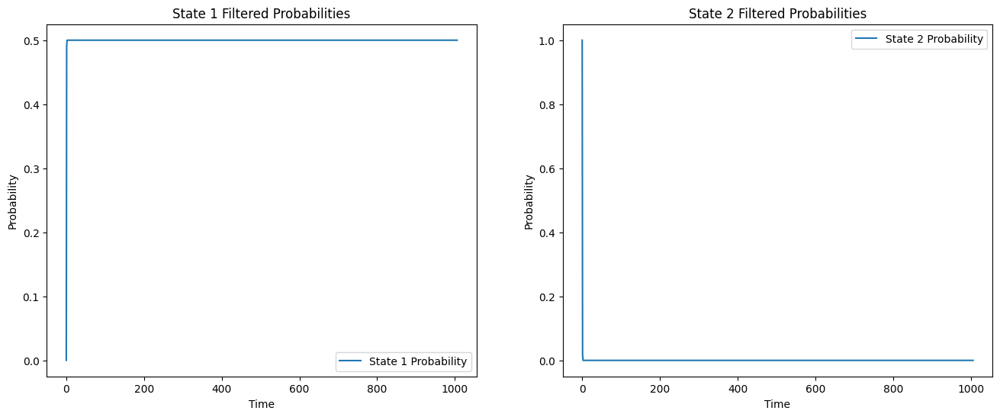

Iteration 14: Max Diff = 96.72539014572662
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.37219412 0.26689852 0.37219413]
sigma_hat1: [0.37219355 0.26696643 0.3721936 ]
P_hat0: [[8.23528205e-01 1.46372381e-06 1.76470331e-01]
 [4.87639738e-01 2.47205221e-02 4.87639740e-01]
 [1.76470329e-01 1.46372379e-06 8.23528207e-01]]
P_hat1: [[8.23528513e-01 1.08239570e-06 1.76470405e-01]
 [4.90092883e-01 1.98142256e-02 4.90092892e-01]
 [1.76470390e-01 1.08239564e-06 8.23528528e-01]]


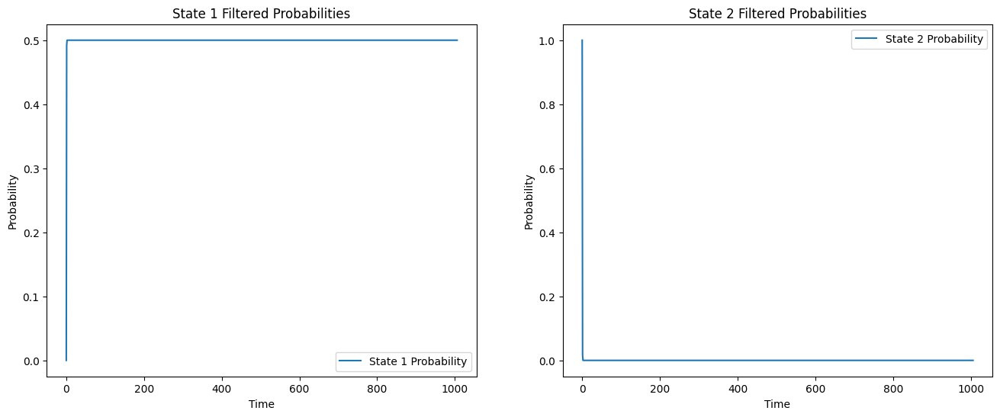

Iteration 15: Max Diff = 77.829671880587
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.37219355 0.26696643 0.3721936 ]
sigma_hat1: [0.37219295 0.26701957 0.37219334]
P_hat0: [[8.23528513e-01 1.08239570e-06 1.76470405e-01]
 [4.90092883e-01 1.98142256e-02 4.90092892e-01]
 [1.76470390e-01 1.08239564e-06 8.23528528e-01]]
P_hat1: [[8.23528692e-01 8.01240517e-07 1.76470507e-01]
 [4.92059369e-01 1.58811863e-02 4.92059445e-01]
 [1.76470386e-01 8.01240122e-07 8.23528812e-01]]


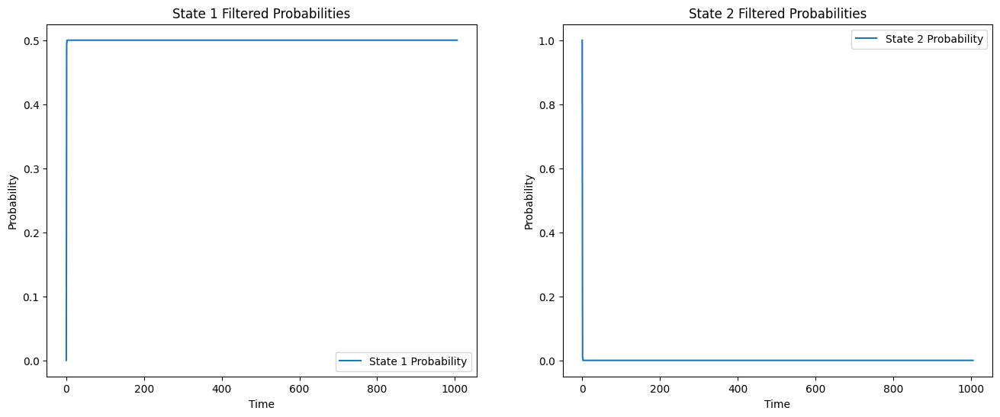

Iteration 16: Max Diff = 62.57378830192004
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.37219295 0.26701957 0.37219334]
sigma_hat1: [0.37219126 0.2670613  0.37219435]
P_hat0: [[8.23528692e-01 8.01240517e-07 1.76470507e-01]
 [4.92059369e-01 1.58811863e-02 4.92059445e-01]
 [1.76470386e-01 8.01240122e-07 8.23528812e-01]]
P_hat1: [[8.23528437e-01 5.93604474e-07 1.76470969e-01]
 [4.93635451e-01 1.27284866e-02 4.93636062e-01]
 [1.76469998e-01 5.93602119e-07 8.23529408e-01]]


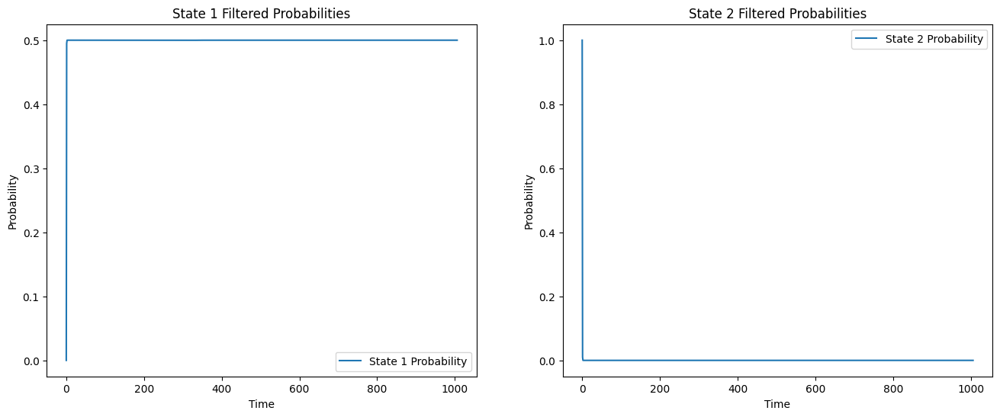

Iteration 17: Max Diff = 50.38235912861741
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.37219126 0.2670613  0.37219435]
sigma_hat1: [0.37218009 0.26709419 0.37220498]
P_hat0: [[8.23528437e-01 5.93604474e-07 1.76470969e-01]
 [4.93635451e-01 1.27284866e-02 4.93636062e-01]
 [1.76469998e-01 5.93602119e-07 8.23529408e-01]]
P_hat1: [[8.23525142e-01 4.40068458e-07 1.76474418e-01]
 [4.94896830e-01 1.02014117e-02 4.94901759e-01]
 [1.76466603e-01 4.40054416e-07 8.23532957e-01]]


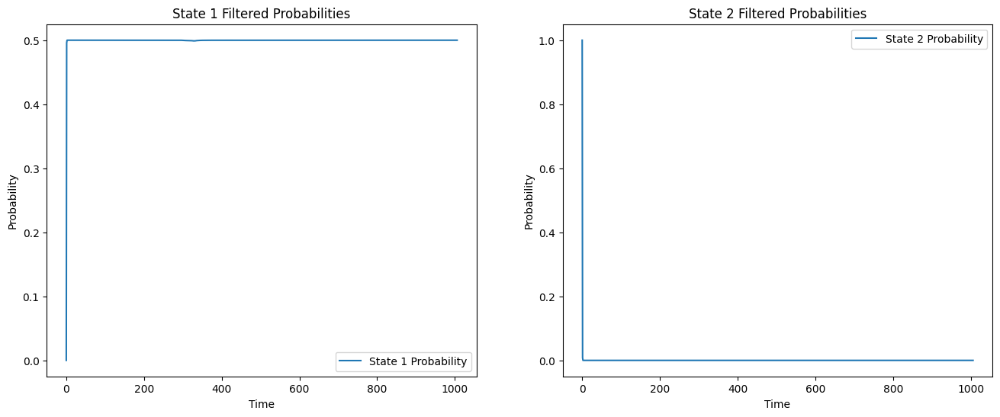

Iteration 18: Max Diff = 41.43167422547639
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.37218009 0.26709419 0.37220498]
sigma_hat1: [0.37209216 0.26712017 0.37229242]
P_hat0: [[8.23525142e-01 4.40068458e-07 1.76474418e-01]
 [4.94896830e-01 1.02014117e-02 4.94901759e-01]
 [1.76466603e-01 4.40054416e-07 8.23532957e-01]]
P_hat1: [[8.23497710e-01 3.26446261e-07 1.76501964e-01]
 [4.95892177e-01 8.17589020e-03 4.95931933e-01]
 [1.76439085e-01 3.26362482e-07 8.23560589e-01]]


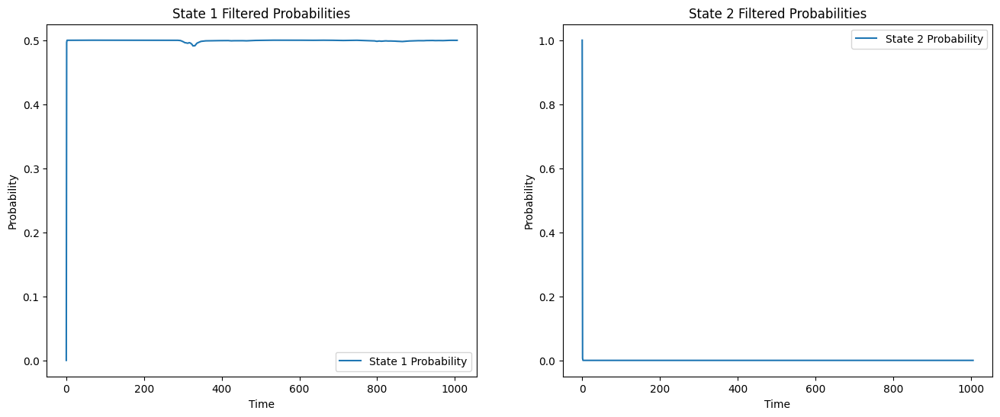

Iteration 19: Max Diff = 41.1979682376663
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.37209216 0.26712017 0.37229242]
sigma_hat1: [0.37138444 0.26714074 0.37299581]
P_hat0: [[8.23497710e-01 3.26446261e-07 1.76501964e-01]
 [4.95892177e-01 8.17589020e-03 4.95931933e-01]
 [1.76439085e-01 3.26362482e-07 8.23560589e-01]]
P_hat1: [[8.23276639e-01 2.42452688e-07 1.76723119e-01]
 [4.96563532e-01 6.55243241e-03 4.96884036e-01]
 [1.76217161e-01 2.41952610e-07 8.23782597e-01]]


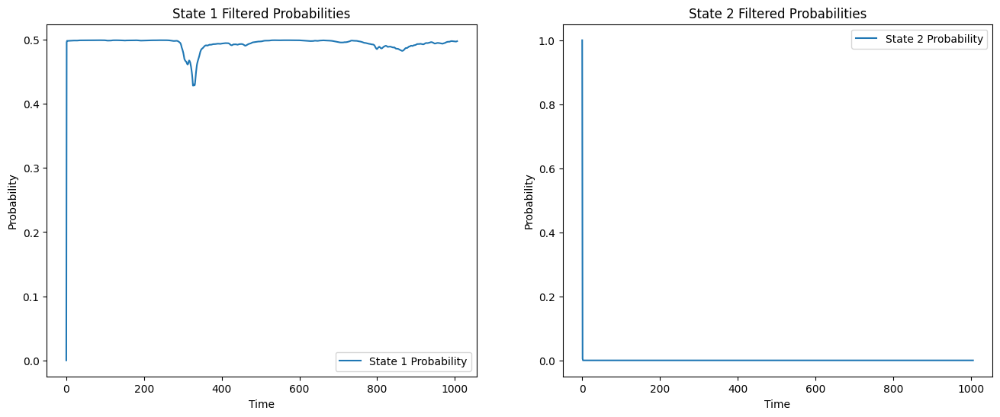

Iteration 20: Max Diff = 106.5314205596309
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.37138444 0.26714074 0.37299581]
sigma_hat1: [0.3656126  0.26715706 0.37851131]
P_hat0: [[8.23276639e-01 2.42452688e-07 1.76723119e-01]
 [4.96563532e-01 6.55243241e-03 4.96884036e-01]
 [1.76217161e-01 2.41952610e-07 8.23782597e-01]]
P_hat1: [[8.21523478e-01 1.81283577e-07 1.78476341e-01]
 [4.96082983e-01 5.25128128e-03 4.98665736e-01]
 [1.74412689e-01 1.78303945e-07 8.25587133e-01]]


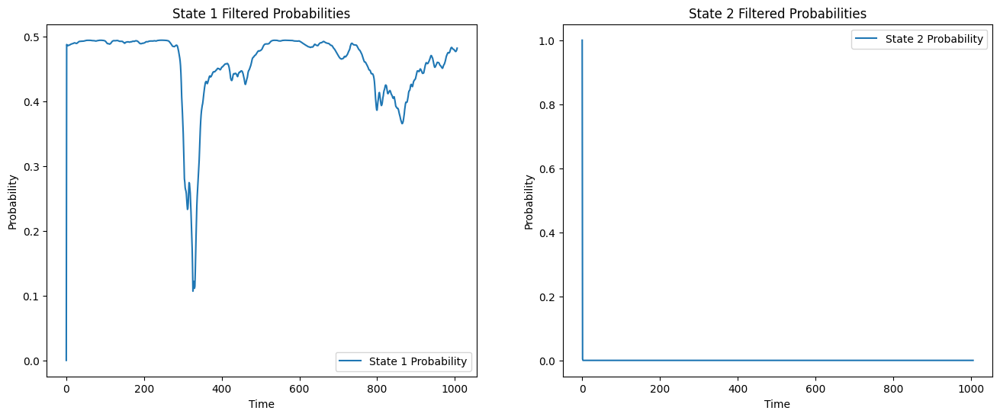

Iteration 21: Max Diff = 711.1061891904942
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.3656126  0.26715706 0.37851131]
sigma_hat1: [0.3251784  0.26716992 0.40759952]
P_hat0: [[8.21523478e-01 1.81283577e-07 1.78476341e-01]
 [4.96082983e-01 5.25128128e-03 4.98665736e-01]
 [1.74412689e-01 1.78303945e-07 8.25587133e-01]]
P_hat1: [[8.09610194e-01 1.42045333e-07 1.90389664e-01]
 [4.87525905e-01 4.20925145e-03 5.08264843e-01]
 [1.60306465e-01 1.25885294e-07 8.39693409e-01]]


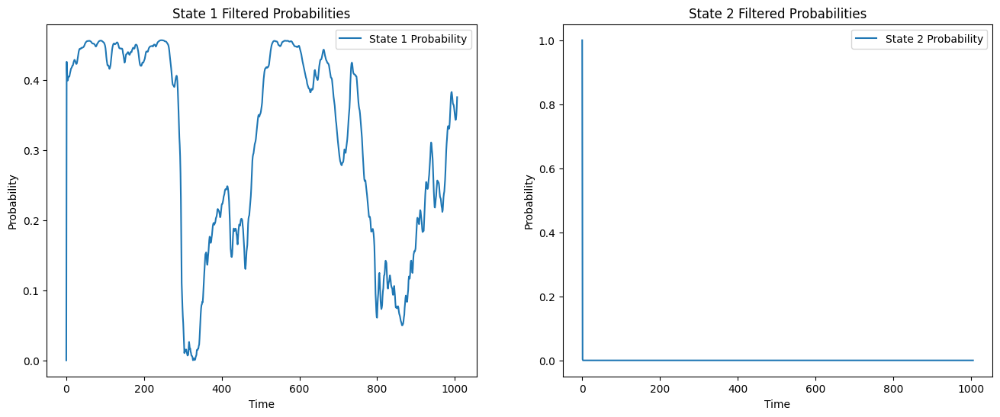

Iteration 22: Max Diff = 3211.5502952249412
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.3251784  0.26716992 0.40759952]
sigma_hat1: [0.22850341 0.26717884 0.42136638]
P_hat0: [[8.09610194e-01 1.42045333e-07 1.90389664e-01]
 [4.87525905e-01 4.20925145e-03 5.08264843e-01]
 [1.60306465e-01 1.25885294e-07 8.39693409e-01]]
P_hat1: [[7.65308822e-01 1.30278211e-07 2.34691048e-01]
 [4.26163986e-01 3.40025957e-03 5.70435754e-01]
 [1.05999149e-01 7.88551636e-08 8.94000772e-01]]


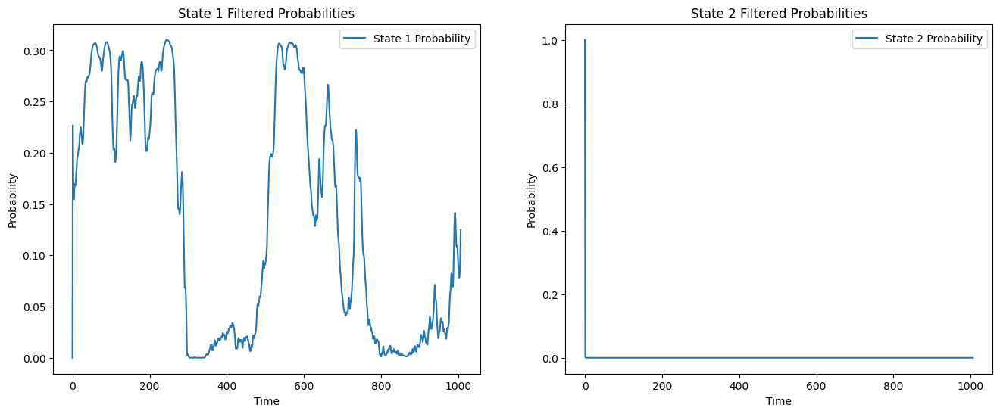

Iteration 23: Max Diff = 6501.376090047154
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.22850341 0.26717884 0.42136638]
sigma_hat1: [0.13920149 0.2671854  0.39640067]
P_hat0: [[7.65308822e-01 1.30278211e-07 2.34691048e-01]
 [4.26163986e-01 3.40025957e-03 5.70435754e-01]
 [1.05999149e-01 7.88551636e-08 8.94000772e-01]]
P_hat1: [[6.98972956e-01 1.36654601e-07 3.01026907e-01]
 [2.26846573e-01 2.83237577e-03 7.70321051e-01]
 [4.68952055e-02 4.72120089e-08 9.53104747e-01]]


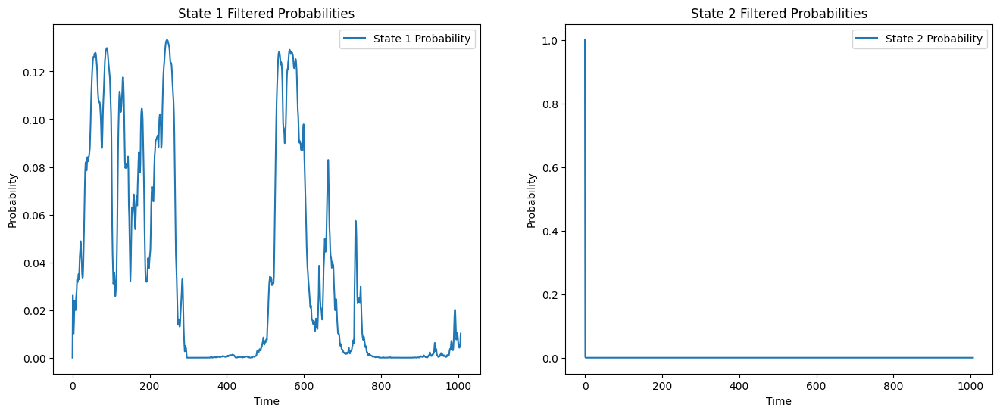

Iteration 24: Max Diff = 6401.227011922644
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.13920149 0.2671854  0.39640067]
sigma_hat1: [0.08589813 0.26719279 0.37869566]
P_hat0: [[6.98972956e-01 1.36654601e-07 3.01026907e-01]
 [2.26846573e-01 2.83237577e-03 7.70321051e-01]
 [4.68952055e-02 4.72120089e-08 9.53104747e-01]]
P_hat1: [[6.12404016e-01 1.59310491e-07 3.87595825e-01]
 [2.61827616e-02 2.32039961e-03 9.71496839e-01]
 [1.44274917e-02 3.08205098e-08 9.85572477e-01]]


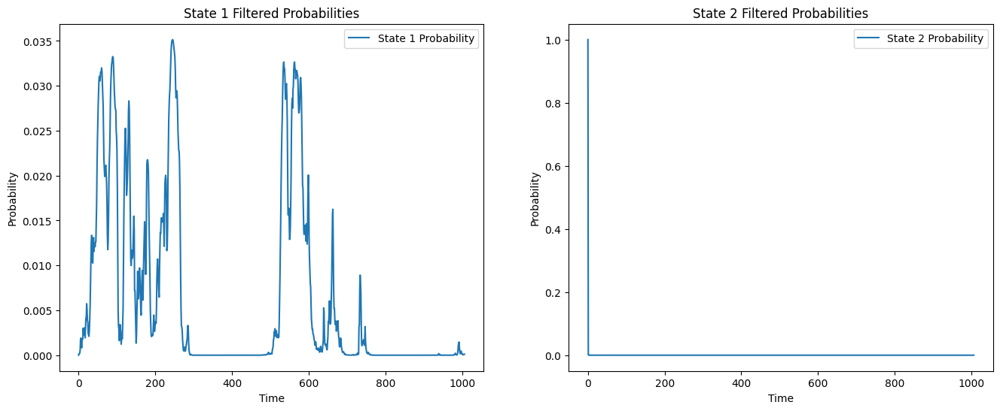

Iteration 25: Max Diff = 2923.2323712474877
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.08589813 0.26719279 0.37869566]
sigma_hat1: [0.05946297 0.26719884 0.37333765]
P_hat0: [[6.12404016e-01 1.59310491e-07 3.87595825e-01]
 [2.61827616e-02 2.32039961e-03 9.71496839e-01]
 [1.44274917e-02 3.08205098e-08 9.85572477e-01]]
P_hat1: [[5.03951300e-01 1.99483095e-07 4.96048500e-01]
 [1.62518710e-04 1.87164523e-03 9.97965836e-01]
 [3.14254614e-03 2.27149143e-08 9.96857431e-01]]


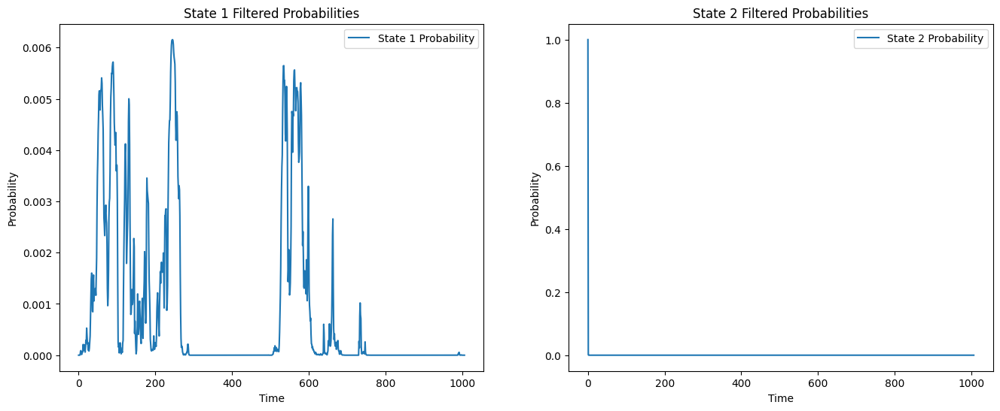

Iteration 26: Max Diff = 2371.85096906468
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.05946297 0.26719884 0.37333765]
sigma_hat1: [0.046558   0.26720335 0.37234854]
P_hat0: [[5.03951300e-01 1.99483095e-07 4.96048500e-01]
 [1.62518710e-04 1.87164523e-03 9.97965836e-01]
 [3.14254614e-03 2.27149143e-08 9.96857431e-01]]
P_hat1: [[3.88481602e-01 2.43675147e-07 6.11518154e-01]
 [1.07080581e-08 1.50247179e-03 9.98497518e-01]
 [5.24444721e-04 1.69290516e-08 9.99475538e-01]]


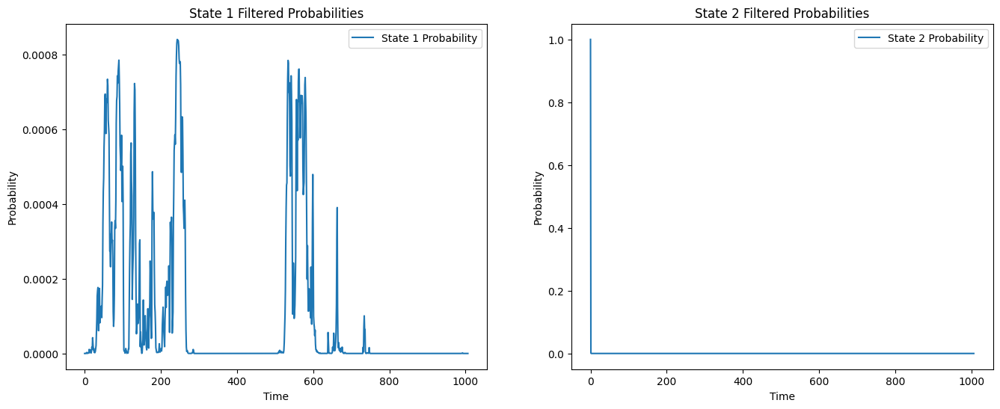

Iteration 27: Max Diff = 2128.0868750650707
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.046558   0.26720335 0.37234854]
sigma_hat1: [0.03987031 0.26720689 0.37221055]
P_hat0: [[3.88481602e-01 2.43675147e-07 6.11518154e-01]
 [1.07080581e-08 1.50247179e-03 9.98497518e-01]
 [5.24444721e-04 1.69290516e-08 9.99475538e-01]]
P_hat1: [[2.82814384e-01 2.83702673e-07 7.17185333e-01]
 [2.81206217e-14 1.20445205e-03 9.98795548e-01]
 [7.39603731e-05 1.25867297e-08 9.99926027e-01]]


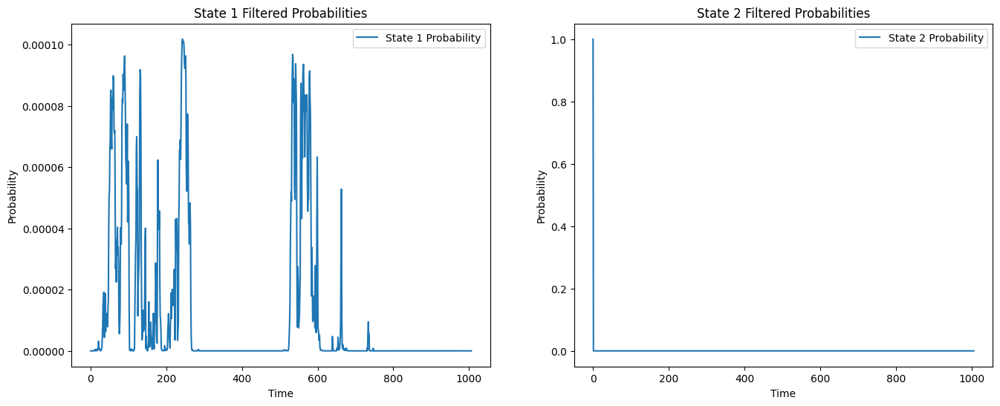

Iteration 28: Max Diff = 1724.3719349812088
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.03987031 0.26720689 0.37221055]
sigma_hat1: [0.03634383 0.2672097  0.37219374]
P_hat0: [[2.82814384e-01 2.83702673e-07 7.17185333e-01]
 [2.81206217e-14 1.20445205e-03 9.98795548e-01]
 [7.39603731e-05 1.25867297e-08 9.99926027e-01]]
P_hat1: [[1.96899480e-01 3.15717413e-07 8.03100204e-01]
 [4.52572657e-20 9.65275982e-04 9.99034724e-01]
 [9.44634588e-06 9.35380892e-09 9.99990544e-01]]


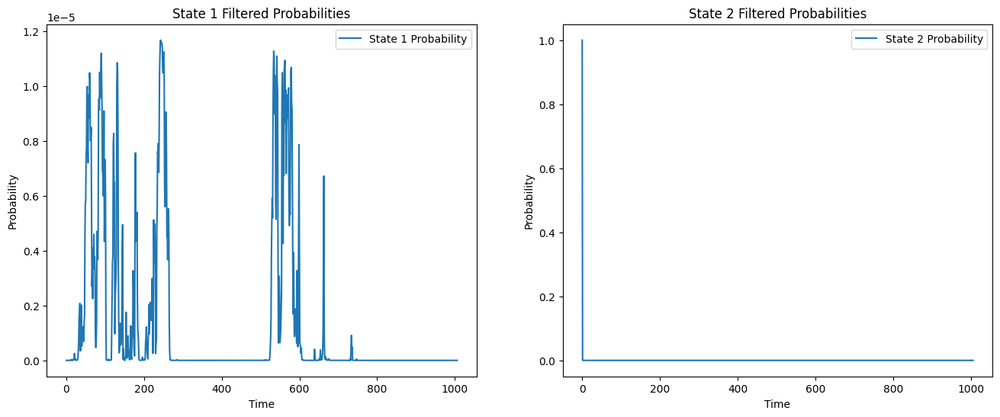

Iteration 29: Max Diff = 1283.884102004892
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.03634383 0.2672097  0.37219374]
sigma_hat1: [0.03451053 0.26721195 0.3721918 ]
P_hat0: [[1.96899480e-01 3.15717413e-07 8.03100204e-01]
 [4.52572657e-20 9.65275982e-04 9.99034724e-01]
 [9.44634588e-06 9.35380892e-09 9.99990544e-01]]
P_hat1: [[1.32905297e-01 3.38955492e-07 8.67094364e-01]
 [5.12467410e-26 7.73559380e-04 9.99226441e-01]
 [1.14369871e-06 6.95102323e-09 9.99998849e-01]]


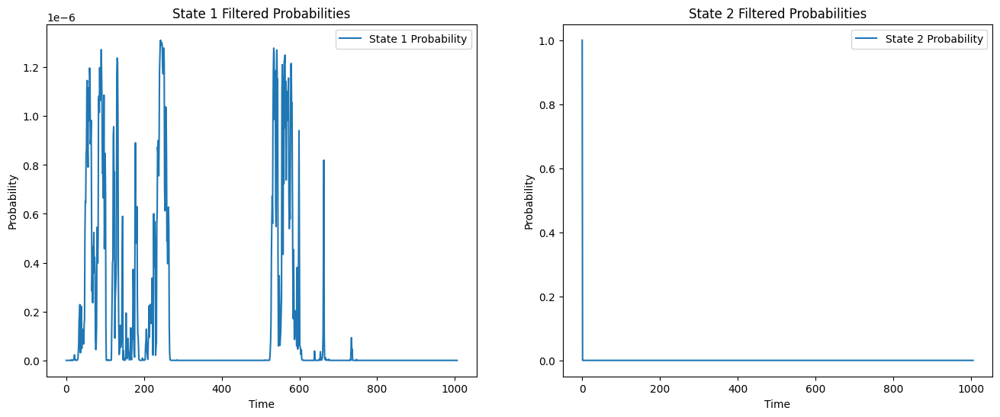

Iteration 30: Max Diff = 902.1926210919411
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.03451053 0.26721195 0.3721918 ]
sigma_hat1: [0.03361878 0.26721375 0.37219157]
P_hat0: [[1.32905297e-01 3.38955492e-07 8.67094364e-01]
 [5.12467410e-26 7.73559380e-04 9.99226441e-01]
 [1.14369871e-06 6.95102323e-09 9.99998849e-01]]
P_hat1: [[8.79503202e-02 3.54623881e-07 9.12049325e-01]
 [4.20493755e-32 6.19915405e-04 9.99380085e-01]
 [1.35017612e-07 5.16559890e-09 9.99999860e-01]]


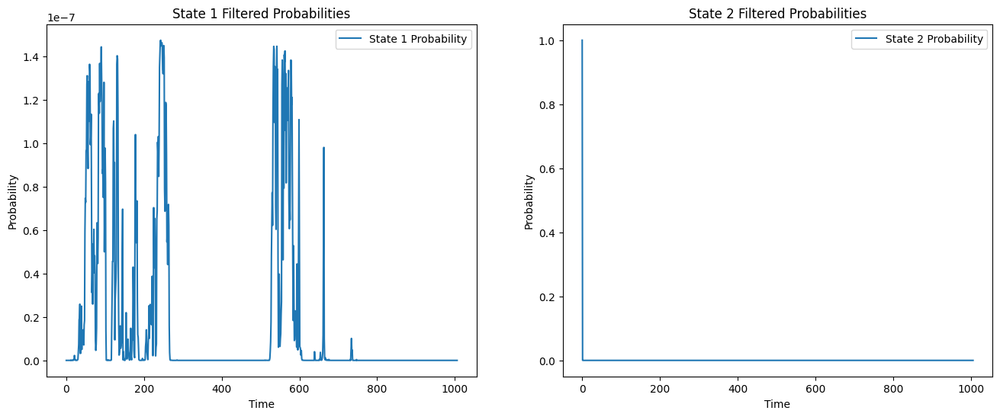

Iteration 31: Max Diff = 611.1918696986946
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.03361878 0.26721375 0.37219157]
sigma_hat1: [0.03326872 0.26721519 0.37219153]
P_hat0: [[8.79503202e-02 3.54623881e-07 9.12049325e-01]
 [4.20493755e-32 6.19915405e-04 9.99380085e-01]
 [1.35017612e-07 5.16559890e-09 9.99999860e-01]]
P_hat1: [[5.75139757e-02 3.64547392e-07 9.42485660e-01]
 [2.54235131e-38 4.96786985e-04 9.99503213e-01]
 [1.58033041e-08 3.83888650e-09 9.99999980e-01]]


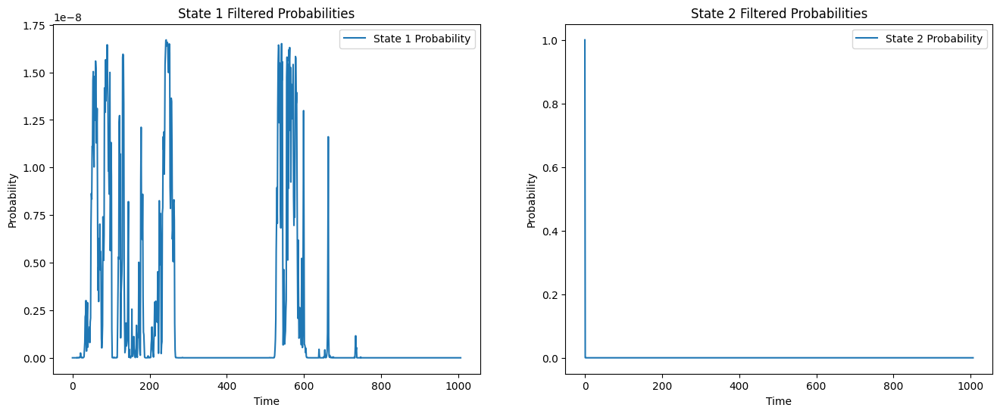

Iteration 32: Max Diff = 404.9816683155031
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.03326872 0.26721519 0.37219153]
sigma_hat1: [0.03323636 0.26721634 0.37219152]
P_hat0: [[5.75139757e-02 3.64547392e-07 9.42485660e-01]
 [2.54235131e-38 4.96786985e-04 9.99503213e-01]
 [1.58033041e-08 3.83888650e-09 9.99999980e-01]]
P_hat1: [[3.73635803e-02 3.70414268e-07 9.62636049e-01]
 [1.14365519e-44 3.98113964e-04 9.99601886e-01]
 [1.85182001e-09 2.85299103e-09 9.99999995e-01]]


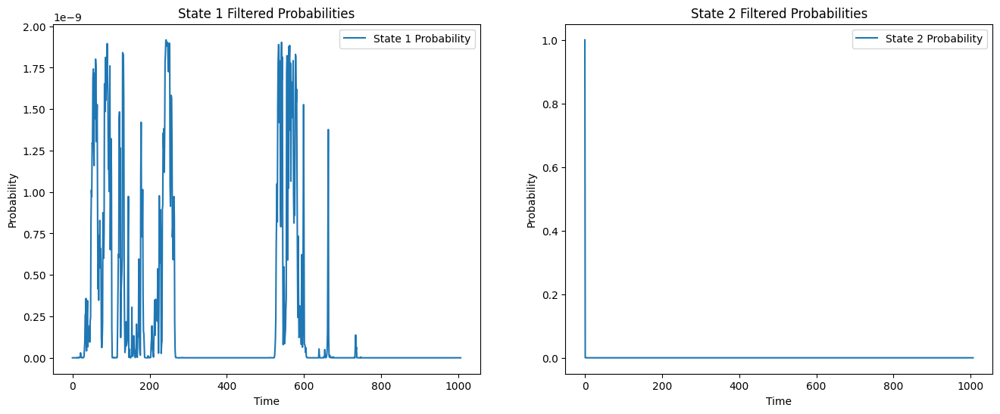

Iteration 33: Max Diff = 264.9387617237512
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.03323636 0.26721634 0.37219152]
sigma_hat1: [0.03339005 0.26721726 0.37219151]
P_hat0: [[3.73635803e-02 3.70414268e-07 9.62636049e-01]
 [1.14365519e-44 3.98113964e-04 9.99601886e-01]
 [1.85182001e-09 2.85299103e-09 9.99999995e-01]]
P_hat1: [[2.41957192e-02 3.73532412e-07 9.75803907e-01]
 [3.84882865e-51 3.19039293e-04 9.99680961e-01]
 [2.18445394e-10 2.12033282e-09 9.99999998e-01]]


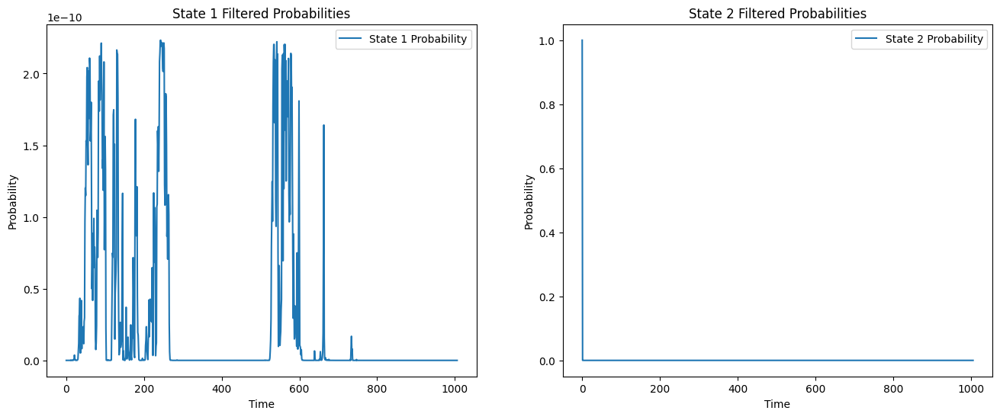

Iteration 34: Max Diff = 172.14771156875403
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.03339005 0.26721726 0.37219151]
sigma_hat1: [0.0336496  0.267218   0.37219151]
P_hat0: [[2.41957192e-02 3.73532412e-07 9.75803907e-01]
 [3.84882865e-51 3.19039293e-04 9.99680961e-01]
 [2.18445394e-10 2.12033282e-09 9.99999998e-01]]
P_hat1: [[1.56517032e-02 3.74830565e-07 9.84347922e-01]
 [9.71925215e-58 2.55670482e-04 9.99744330e-01]
 [2.60184006e-11 1.57584855e-09 9.99999998e-01]]


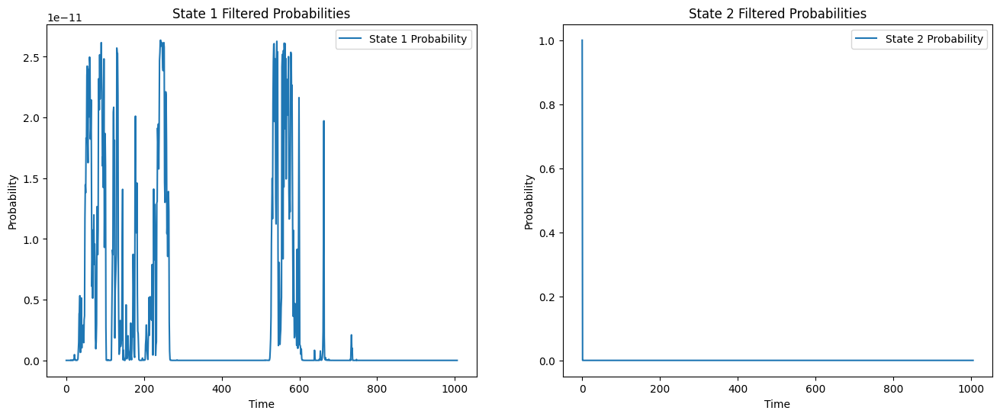

Iteration 35: Max Diff = 111.5148681498061
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.0336496  0.267218   0.37219151]
sigma_hat1: [0.03396507 0.26721859 0.3721915 ]
P_hat0: [[1.56517032e-02 3.74830565e-07 9.84347922e-01]
 [9.71925215e-58 2.55670482e-04 9.99744330e-01]
 [2.60184006e-11 1.57584855e-09 9.99999998e-01]]
P_hat1: [[1.01267426e-02 3.74937928e-07 9.89872882e-01]
 [1.84431217e-64 2.04888095e-04 9.99795112e-01]
 [3.13355915e-12 1.17119814e-09 9.99999999e-01]]


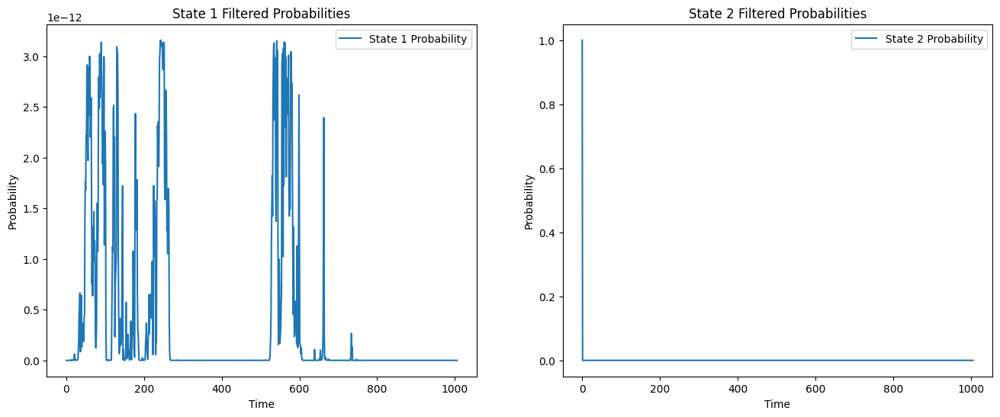

Iteration 36: Max Diff = 72.1861235413992
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.03396507 0.26721859 0.3721915 ]
sigma_hat1: [0.03430503 0.26721907 0.3721915 ]
P_hat0: [[1.01267426e-02 3.74937928e-07 9.89872882e-01]
 [1.84431217e-64 2.04888095e-04 9.99795112e-01]
 [3.13355915e-12 1.17119814e-09 9.99999999e-01]]
P_hat1: [[6.55813324e-03 3.74269888e-07 9.93441492e-01]
 [2.63116200e-71 1.64192242e-04 9.99835808e-01]
 [3.81791296e-13 8.70463659e-10 9.99999999e-01]]


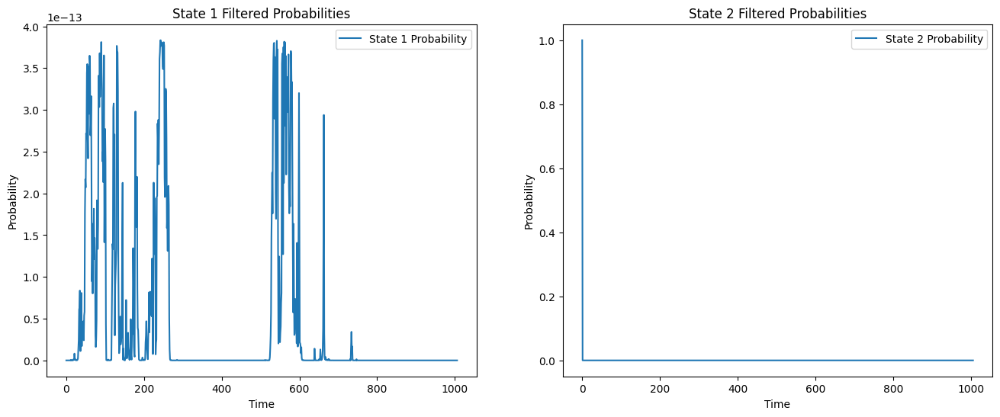

Iteration 37: Max Diff = 46.7614836820226
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.03430503 0.26721907 0.3721915 ]
sigma_hat1: [0.03464975 0.26721944 0.37219149]
P_hat0: [[6.55813324e-03 3.74269888e-07 9.93441492e-01]
 [2.63116200e-71 1.64192242e-04 9.99835808e-01]
 [3.81791296e-13 8.70463659e-10 9.99999999e-01]]
P_hat1: [[4.25267315e-03 3.73096965e-07 9.95746954e-01]
 [2.82186393e-78 1.31579540e-04 9.99868420e-01]
 [4.70547728e-14 6.46955513e-10 9.99999999e-01]]


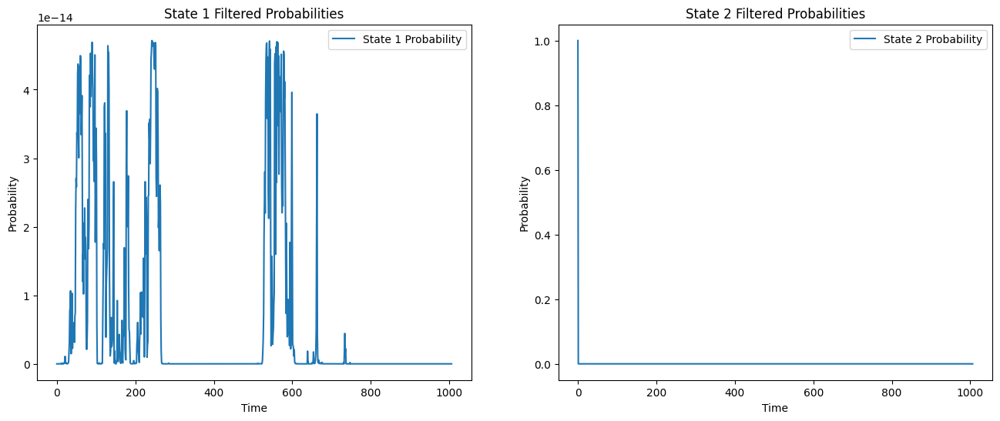

Iteration 38: Max Diff = 30.340211676671938
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.03464975 0.26721944 0.37219149]
sigma_hat1: [0.034987   0.26721975 0.37219149]
P_hat0: [[4.25267315e-03 3.73096965e-07 9.95746954e-01]
 [2.82186393e-78 1.31579540e-04 9.99868420e-01]
 [4.70547728e-14 6.46955513e-10 9.99999999e-01]]
P_hat1: [[2.76179927e-03 3.71594274e-07 9.97237829e-01]
 [2.27413666e-85 1.05444504e-04 9.99894555e-01]
 [5.86381299e-15 4.80840454e-10 1.00000000e+00]]


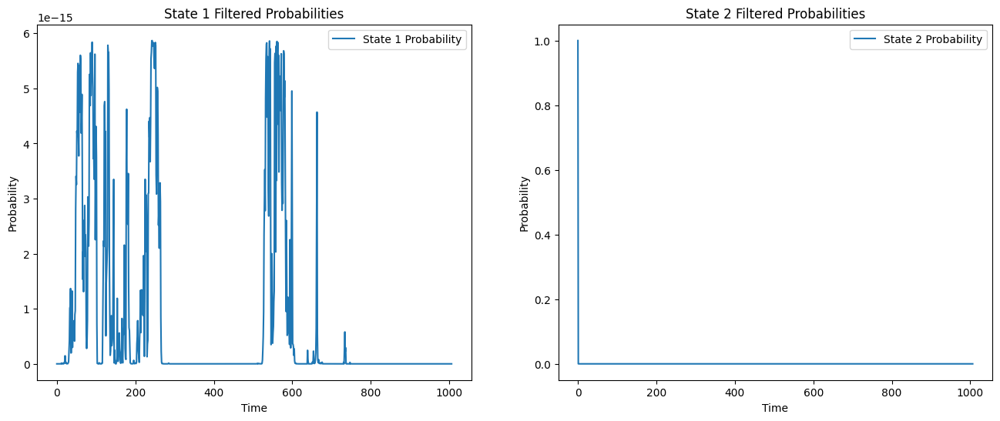

Iteration 39: Max Diff = 19.727848489882003
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.034987   0.26721975 0.37219149]
sigma_hat1: [0.03530948 0.26721999 0.37219149]
P_hat0: [[2.76179927e-03 3.71594274e-07 9.97237829e-01]
 [2.27413666e-85 1.05444504e-04 9.99894555e-01]
 [5.86381299e-15 4.80840454e-10 1.00000000e+00]]
P_hat1: [[1.79635267e-03 3.69875052e-07 9.98203277e-01]
 [1.37634158e-92 8.45005270e-05 9.99915499e-01]
 [7.38381902e-16 3.57379656e-10 1.00000000e+00]]


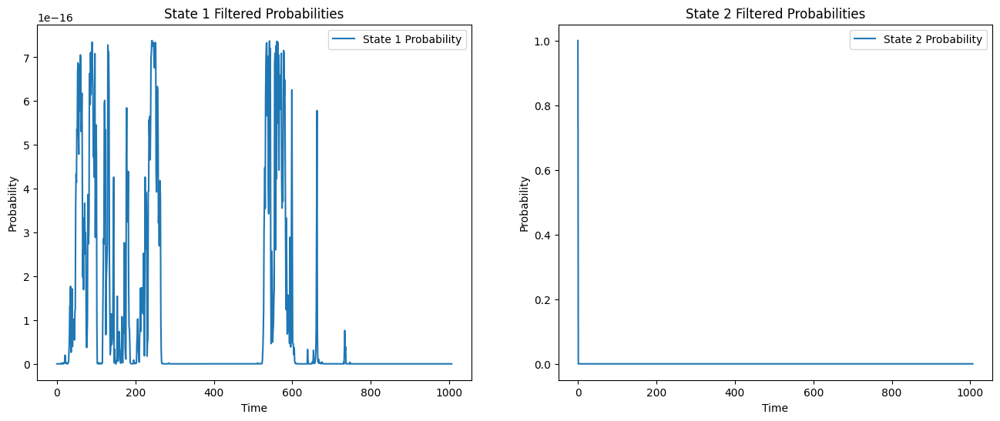

Iteration 40: Max Diff = 12.859401969620496
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.03530948 0.26721999 0.37219149]
sigma_hat1: [0.03561309 0.26722018 0.37219149]
P_hat0: [[1.79635267e-03 3.69875052e-07 9.98203277e-01]
 [1.37634158e-92 8.45005270e-05 9.99915499e-01]
 [7.38381902e-16 3.57379656e-10 1.00000000e+00]]
P_hat1: [[1.17016851e-003 3.68012714e-007 9.98829463e-001]
 [6.25126961e-100 6.77165452e-005 9.99932283e-001]
 [9.38838429e-017 2.65619808e-010 1.00000000e+000]]


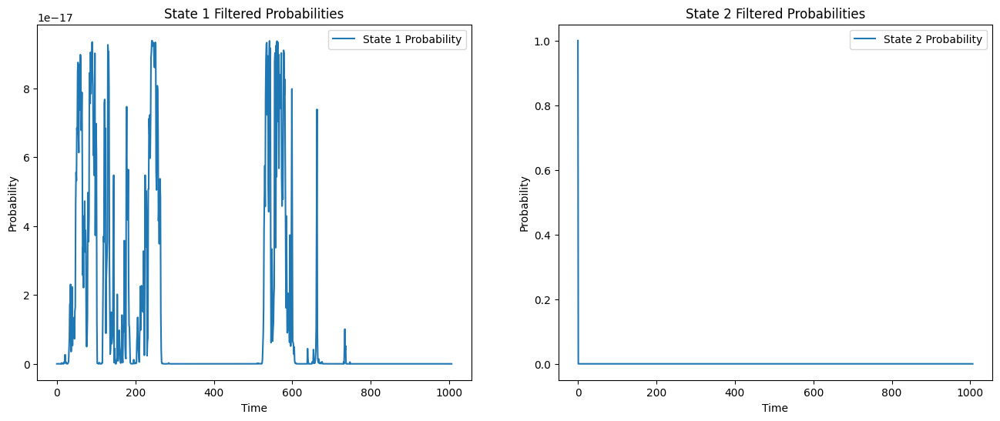

Iteration 41: Max Diff = 8.405134690115833
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.03561309 0.26722018 0.37219149]
sigma_hat1: [0.03589582 0.26722034 0.37219149]
P_hat0: [[1.17016851e-003 3.68012714e-007 9.98829463e-001]
 [6.25126961e-100 6.77165452e-005 9.99932283e-001]
 [9.38838429e-017 2.65619808e-010 1.00000000e+000]]
P_hat1: [[7.63364057e-004 3.66055121e-007 9.99236270e-001]
 [2.12933708e-107 5.42662853e-005 9.99945734e-001]
 [1.20442375e-017 1.97420629e-010 1.00000000e+000]]


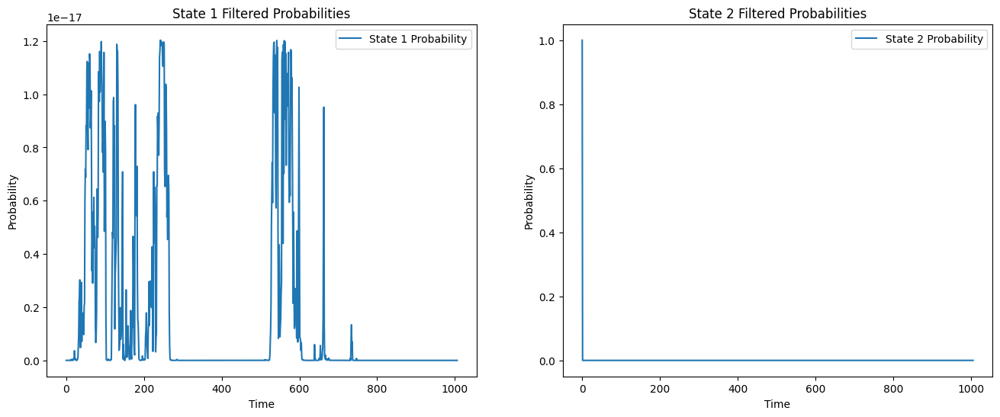

Iteration 42: Max Diff = 5.509778473087543
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.03589582 0.26722034 0.37219149]
sigma_hat1: [0.03615704 0.26722047 0.37219149]
P_hat0: [[7.63364057e-004 3.66055121e-007 9.99236270e-001]
 [2.12933708e-107 5.42662853e-005 9.99945734e-001]
 [1.20442375e-017 1.97420629e-010 1.00000000e+000]]
P_hat1: [[4.98655902e-004 3.64033736e-007 9.99500980e-001]
 [5.43603183e-115 4.34875894e-005 9.99956512e-001]
 [1.55782310e-018 1.46732313e-010 1.00000000e+000]]


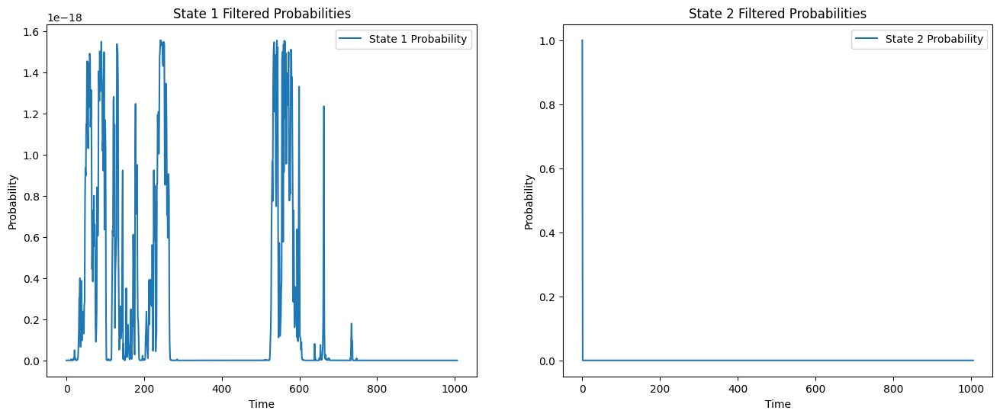

Iteration 43: Max Diff = 3.623004729042459
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.03615704 0.26722047 0.37219149]
sigma_hat1: [0.03639696 0.26722057 0.37219148]
P_hat0: [[4.98655902e-004 3.64033736e-007 9.99500980e-001]
 [5.43603183e-115 4.34875894e-005 9.99956512e-001]
 [1.55782310e-018 1.46732313e-010 1.00000000e+000]]
P_hat1: [[3.26145538e-004 3.61969472e-007 9.99673492e-001]
 [1.03958366e-122 3.48498191e-005 9.99965150e-001]
 [2.02997672e-019 1.09058601e-010 1.00000000e+000]]


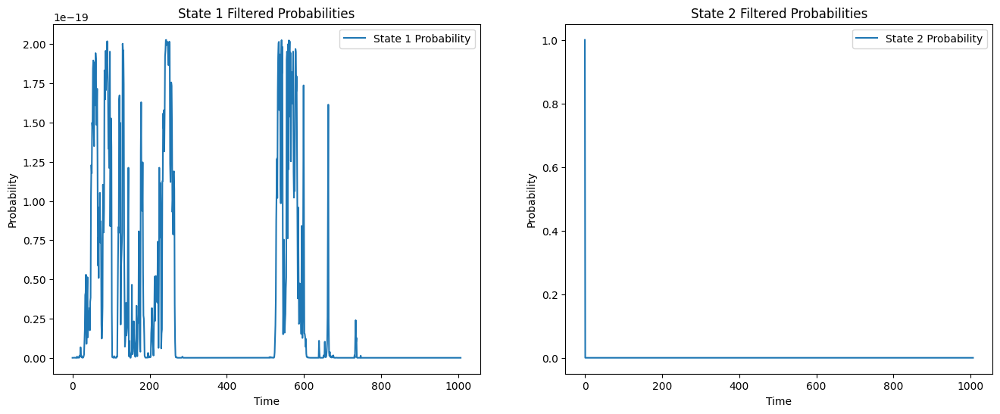

Iteration 44: Max Diff = 2.3902177475532236
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.03639696 0.26722057 0.37219148]
sigma_hat1: [0.03661635 0.26722065 0.37219148]
P_hat0: [[3.26145538e-004 3.61969472e-007 9.99673492e-001]
 [1.03958366e-122 3.48498191e-005 9.99965150e-001]
 [2.02997672e-019 1.09058601e-010 1.00000000e+000]]
P_hat1: [[2.13558857e-004 3.59876434e-007 9.99786081e-001]
 [1.48880135e-130 2.79277329e-005 9.99972072e-001]
 [2.66317323e-020 8.10578018e-011 1.00000000e+000]]


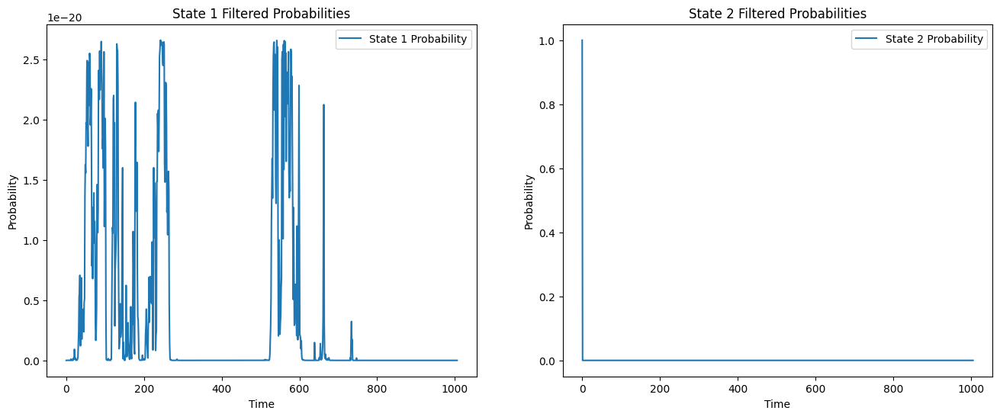

Iteration 45: Max Diff = 1.5825051979705782
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.03661635 0.26722065 0.37219148]
sigma_hat1: [0.03681628 0.26722071 0.37219148]
P_hat0: [[2.13558857e-004 3.59876434e-007 9.99786081e-001]
 [1.48880135e-130 2.79277329e-005 9.99972072e-001]
 [2.66317323e-020 8.10578018e-011 1.00000000e+000]]
P_hat1: [[1.39982911e-004 3.57764299e-007 9.99859659e-001]
 [1.59659534e-138 2.23805526e-005 9.99977619e-001]
 [3.51532171e-021 6.02462913e-011 1.00000000e+000]]


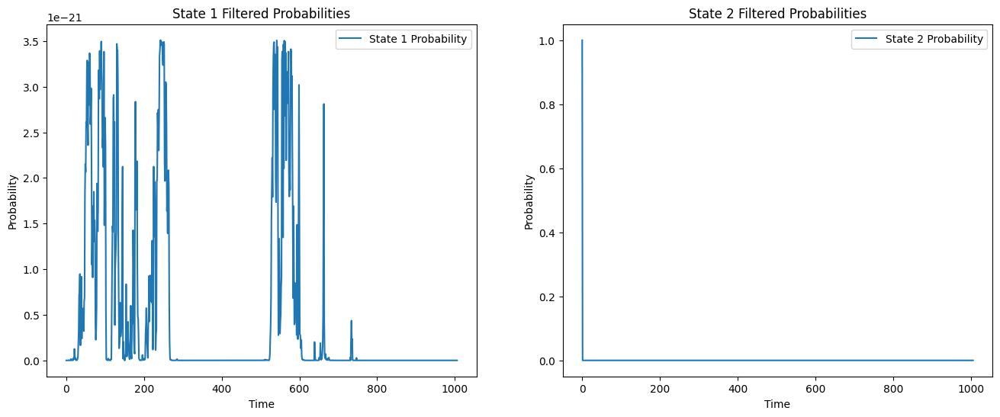

Iteration 46: Max Diff = 1.051767108576607
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.03681628 0.26722071 0.37219148]
sigma_hat1: [0.03699799 0.26722076 0.37219148]
P_hat0: [[1.39982911e-004 3.57764299e-007 9.99859659e-001]
 [1.59659534e-138 2.23805526e-005 9.99977619e-001]
 [3.51532171e-021 6.02462913e-011 1.00000000e+000]]
P_hat1: [[9.18420611e-005 3.55639847e-007 9.99907802e-001]
 [1.28259651e-146 1.79351868e-005 9.99982065e-001]
 [4.66585749e-022 4.47781648e-011 1.00000000e+000]]


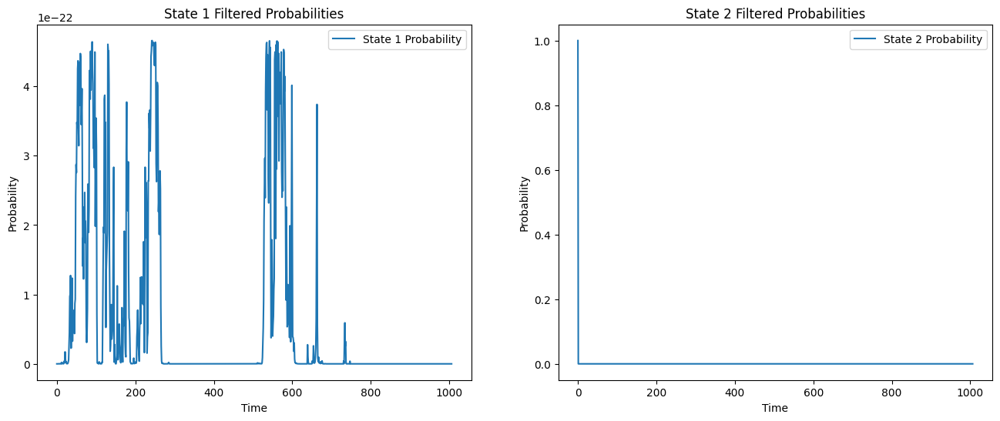

Iteration 47: Max Diff = 0.701963222481631
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.03699799 0.26722076 0.37219148]
sigma_hat1: [0.03716279 0.2672208  0.37219148]
P_hat0: [[9.18420611e-005 3.55639847e-007 9.99907802e-001]
 [1.28259651e-146 1.79351868e-005 9.99982065e-001]
 [4.66585749e-022 4.47781648e-011 1.00000000e+000]]
P_hat1: [[6.03084434e-005 3.53507943e-007 9.99939338e-001]
 [7.72555814e-155 1.43727868e-005 9.99985627e-001]
 [6.22391364e-023 3.32814811e-011 1.00000000e+000]]


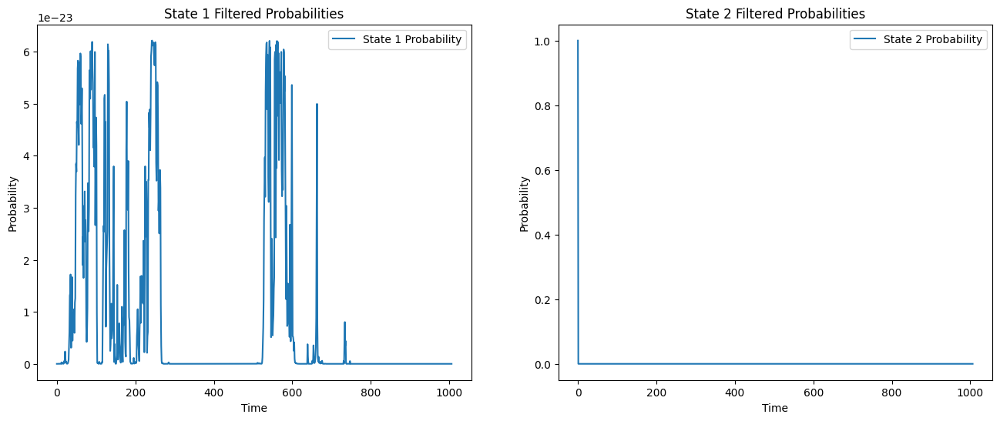

Iteration 48: Max Diff = 0.47066380888660403
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.03716279 0.2672208  0.37219148]
sigma_hat1: [0.03731202 0.26722083 0.37219148]
P_hat0: [[6.03084434e-005 3.53507943e-007 9.99939338e-001]
 [7.72555814e-155 1.43727868e-005 9.99985627e-001]
 [6.22391364e-023 3.32814811e-011 1.00000000e+000]]
P_hat1: [[3.96322113e-005 3.51372168e-007 9.99960016e-001]
 [3.49524693e-163 1.15179727e-005 9.99988482e-001]
 [8.33963603e-024 2.47365601e-011 1.00000000e+000]]


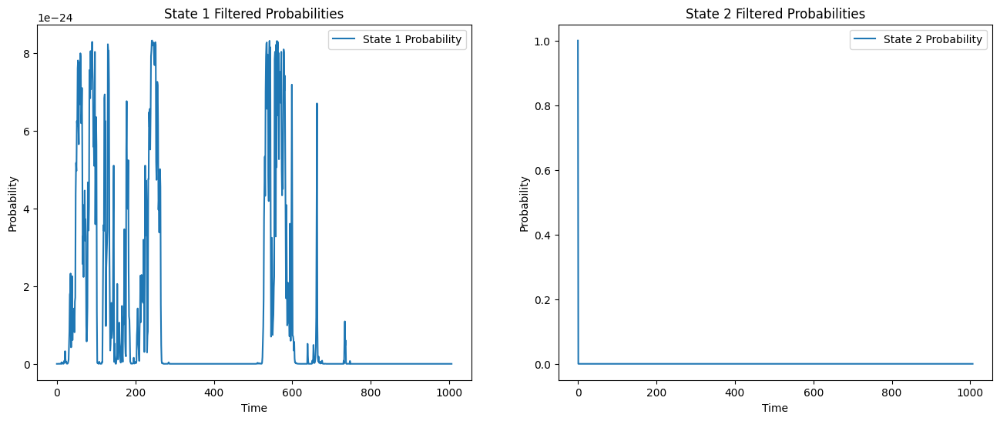

Iteration 49: Max Diff = 0.31718896689607307
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.03731202 0.26722083 0.37219148]
sigma_hat1: [0.03744696 0.26722086 0.37219148]
P_hat0: [[3.96322113e-005 3.51372168e-007 9.99960016e-001]
 [3.49524693e-163 1.15179727e-005 9.99988482e-001]
 [8.33963603e-024 2.47365601e-011 1.00000000e+000]]
P_hat1: [[2.60626793e-005 3.49235232e-007 9.99973588e-001]
 [1.19122915e-171 9.23019968e-006 9.99990770e-001]
 [1.12198620e-024 1.83855325e-011 1.00000000e+000]]


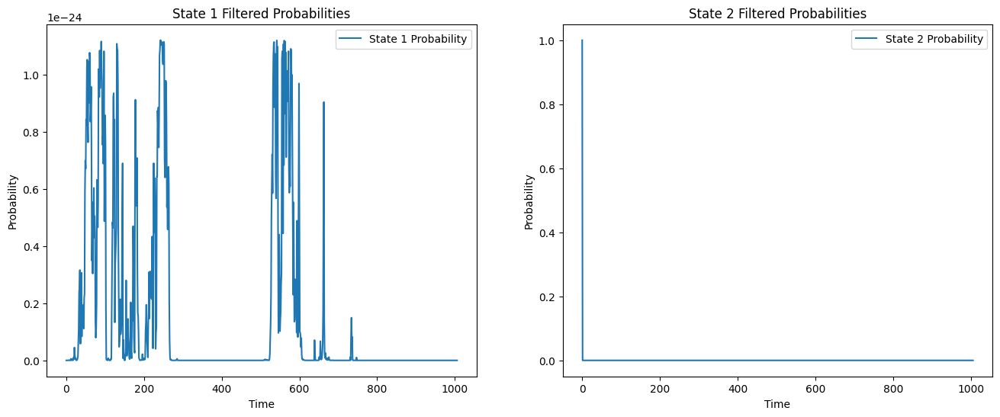

Iteration 50: Max Diff = 0.21496667695846397
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.03744696 0.26722086 0.37219148]
sigma_hat1: [0.03756885 0.26722088 0.37219148]
P_hat0: [[2.60626793e-005 3.49235232e-007 9.99973588e-001]
 [1.19122915e-171 9.23019968e-006 9.99990770e-001]
 [1.12198620e-024 1.83855325e-011 1.00000000e+000]]
P_hat1: [[1.71498474e-005 3.47099240e-007 9.99982503e-001]
 [3.07203698e-180 7.39683849e-006 9.99992603e-001]
 [1.51498592e-025 1.36651158e-011 1.00000000e+000]]


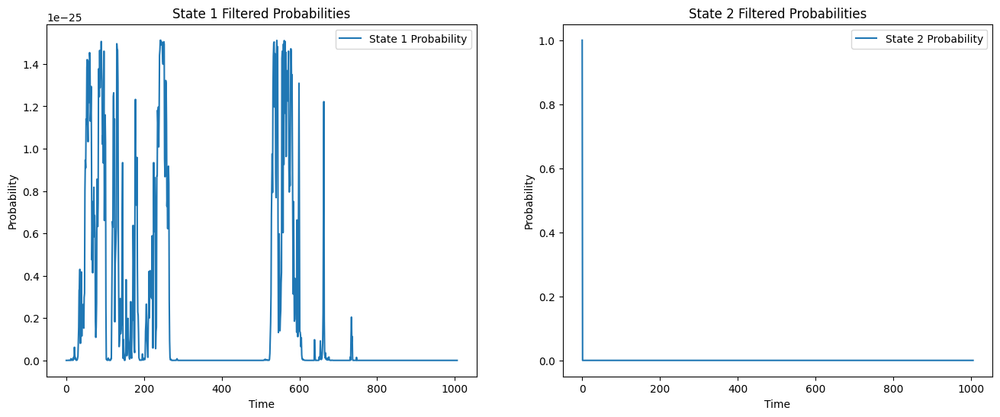

Iteration 51: Max Diff = 0.14659749116002316
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.03756885 0.26722088 0.37219148]
sigma_hat1: [0.03767885 0.2672209  0.37219148]
P_hat0: [[1.71498474e-005 3.47099240e-007 9.99982503e-001]
 [3.07203698e-180 7.39683849e-006 9.99992603e-001]
 [1.51498592e-025 1.36651158e-011 1.00000000e+000]]
P_hat1: [[1.12913171e-005 3.44965869e-007 9.99988364e-001]
 [6.03433615e-189 5.92763110e-006 9.99994072e-001]
 [2.05234831e-026 1.01566521e-011 1.00000000e+000]]


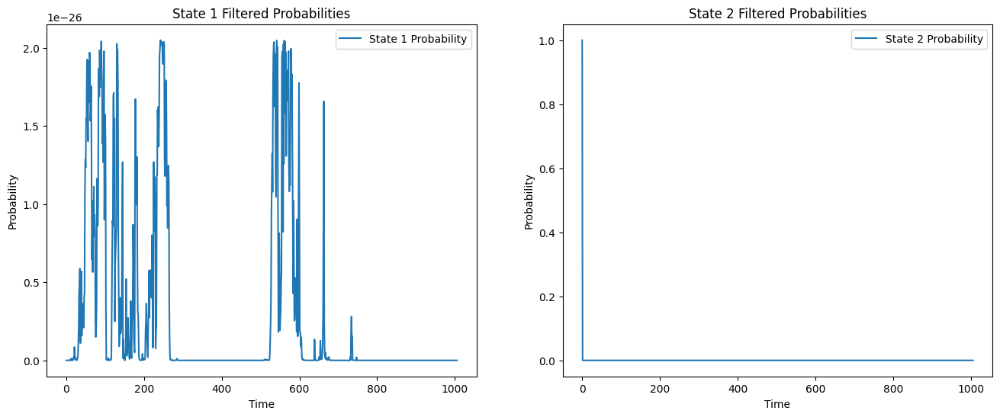

Iteration 52: Max Diff = 0.10065965956590132
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.03767885 0.2672209  0.37219148]
sigma_hat1: [0.03777804 0.26722091 0.37219148]
P_hat0: [[1.12913171e-005 3.44965869e-007 9.99988364e-001]
 [6.03433615e-189 5.92763110e-006 9.99994072e-001]
 [2.05234831e-026 1.01566521e-011 1.00000000e+000]]
P_hat1: [[7.43785020e-006 3.42836483e-007 9.99992219e-001]
 [9.11266634e-198 4.75024700e-006 9.99995250e-001]
 [2.78850356e-027 7.54897458e-012 1.00000000e+000]]


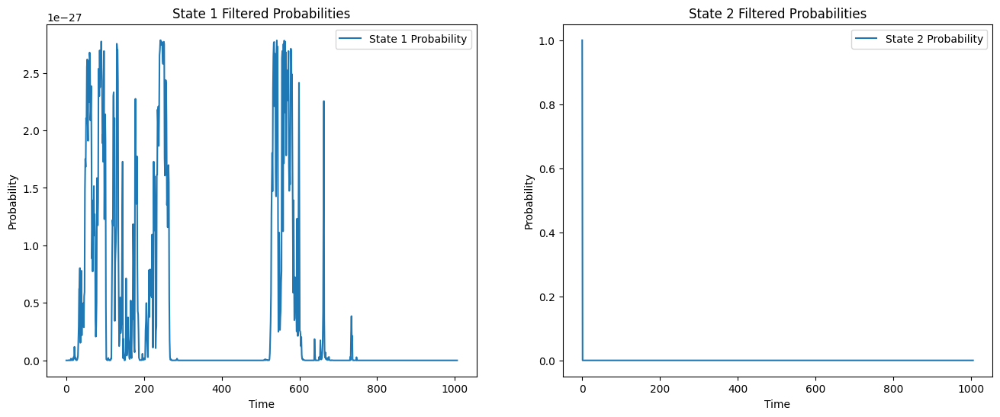

Iteration 53: Max Diff = 0.06963607388993104
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.03777804 0.26722091 0.37219148]
sigma_hat1: [0.03786744 0.26722092 0.37219148]
P_hat0: [[7.43785020e-006 3.42836483e-007 9.99992219e-001]
 [9.11266634e-198 4.75024700e-006 9.99995250e-001]
 [2.78850356e-027 7.54897458e-012 1.00000000e+000]]
P_hat1: [[4.90169728e-006 3.40712214e-007 9.99994758e-001]
 [1.07146331e-206 3.80672244e-006 9.99996193e-001]
 [3.79873895e-028 5.61080856e-012 1.00000000e+000]]


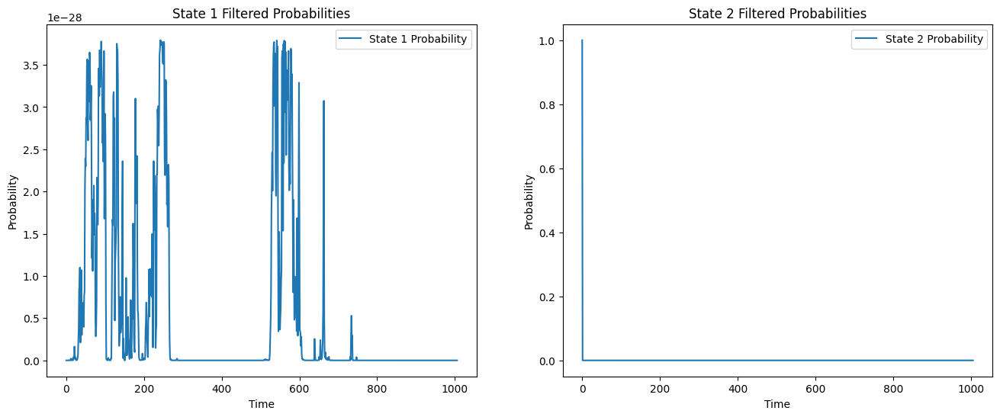

Iteration 54: Max Diff = 0.04856603444651396
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.03786744 0.26722092 0.37219148]
sigma_hat1: [0.03794796 0.26722093 0.37219148]
P_hat0: [[4.90169728e-006 3.40712214e-007 9.99994758e-001]
 [1.07146331e-206 3.80672244e-006 9.99996193e-001]
 [3.79873895e-028 5.61080856e-012 1.00000000e+000]]
P_hat1: [[3.23163088e-006 3.38594014e-007 9.99996430e-001]
 [9.97299592e-216 3.05060676e-006 9.99996949e-001]
 [5.18727349e-029 4.17025892e-012 1.00000000e+000]]


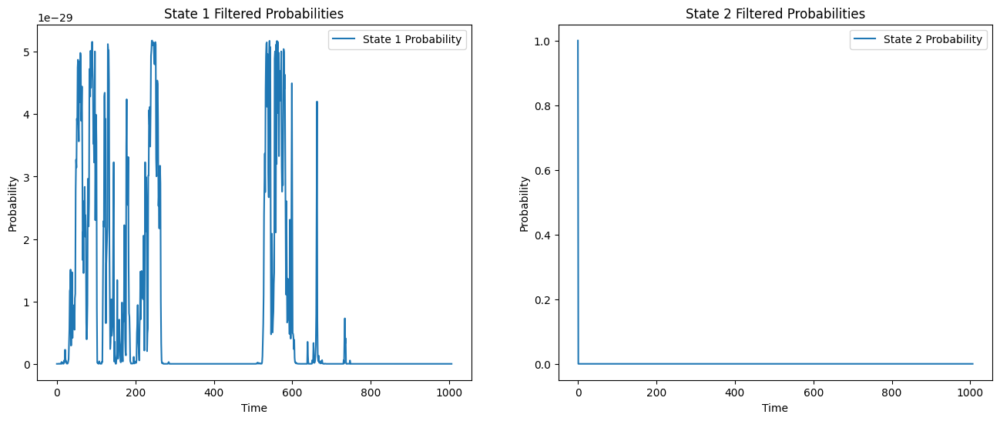

Iteration 55: Max Diff = 0.03416644663890749
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.03794796 0.26722093 0.37219148]
sigma_hat1: [0.03802045 0.26722094 0.37219148]
P_hat0: [[3.23163088e-006 3.38594014e-007 9.99996430e-001]
 [9.97299592e-216 3.05060676e-006 9.99996949e-001]
 [5.18727349e-029 4.17025892e-012 1.00000000e+000]]
P_hat1: [[2.13135208e-006 3.36482696e-007 9.99997532e-001]
 [7.50237075e-225 2.44467561e-006 9.99997555e-001]
 [7.09847905e-030 3.09956433e-012 1.00000000e+000]]


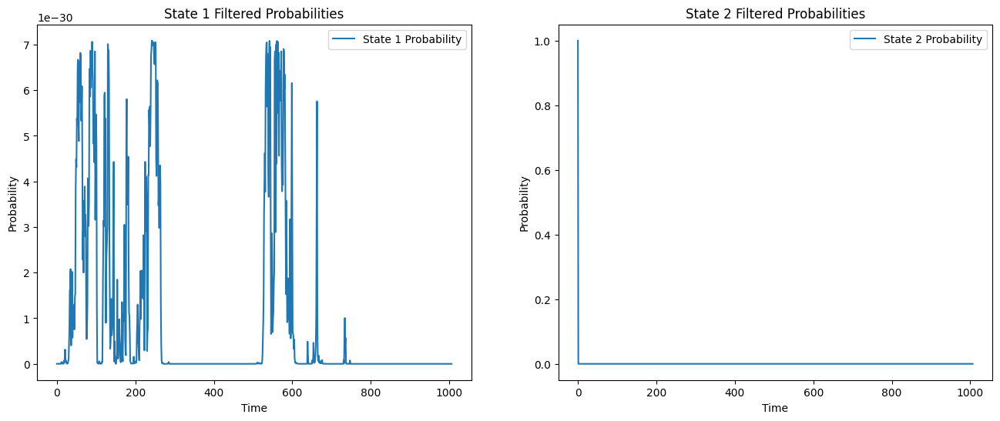

Iteration 56: Max Diff = 0.02425774255987879
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.03802045 0.26722094 0.37219148]
sigma_hat1: [0.03808569 0.26722094 0.37219148]
P_hat0: [[2.13135208e-006 3.36482696e-007 9.99997532e-001]
 [7.50237075e-225 2.44467561e-006 9.99997555e-001]
 [7.09847905e-030 3.09956433e-012 1.00000000e+000]]
P_hat1: [[1.40614670e-006 3.34378956e-007 9.99998259e-001]
 [3.18448502e-234 1.95909840e-006 9.99998041e-001]
 [9.73247958e-031 2.30376587e-012 1.00000000e+000]]


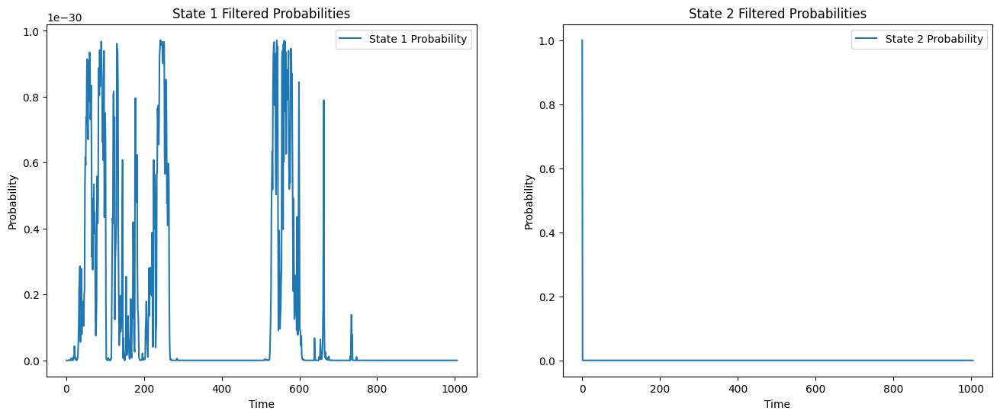

Iteration 57: Max Diff = 0.01738805054717675
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.03808569 0.26722094 0.37219148]
sigma_hat1: [0.03814439 0.26722095 0.37219148]
P_hat0: [[1.40614670e-006 3.34378956e-007 9.99998259e-001]
 [3.18448502e-234 1.95909840e-006 9.99998041e-001]
 [9.73247958e-031 2.30376587e-012 1.00000000e+000]]
P_hat1: [[9.27969078e-007 3.32283396e-007 9.99998740e-001]
 [1.00637385e-243 1.56996965e-006 9.99998430e-001]
 [1.33668428e-031 1.71228506e-012 1.00000000e+000]]


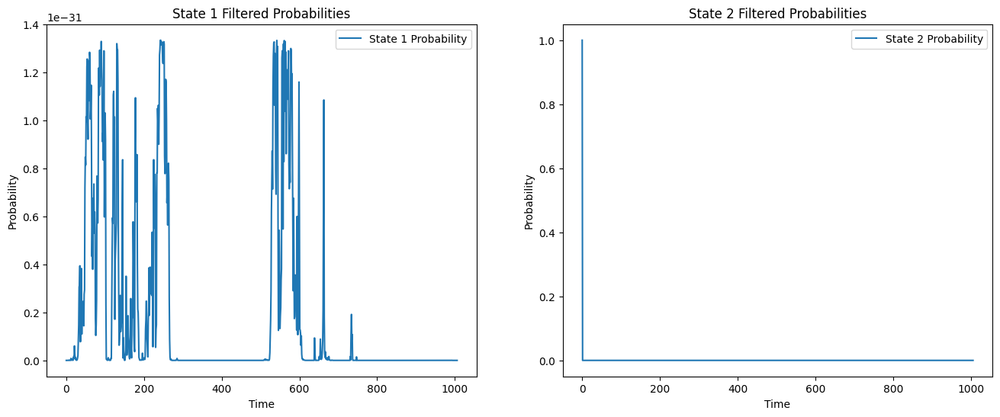

Iteration 58: Max Diff = 0.012586617934099273
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.03814439 0.26722095 0.37219148]
sigma_hat1: [0.03819718 0.26722095 0.37219148]
P_hat0: [[9.27969078e-007 3.32283396e-007 9.99998740e-001]
 [1.00637385e-243 1.56996965e-006 9.99998430e-001]
 [1.33668428e-031 1.71228506e-012 1.00000000e+000]]
P_hat1: [[6.12562974e-007 3.30196536e-007 9.99999057e-001]
 [2.36746437e-253 1.25813216e-006 9.99998742e-001]
 [1.83867525e-032 1.27266420e-012 1.00000000e+000]]


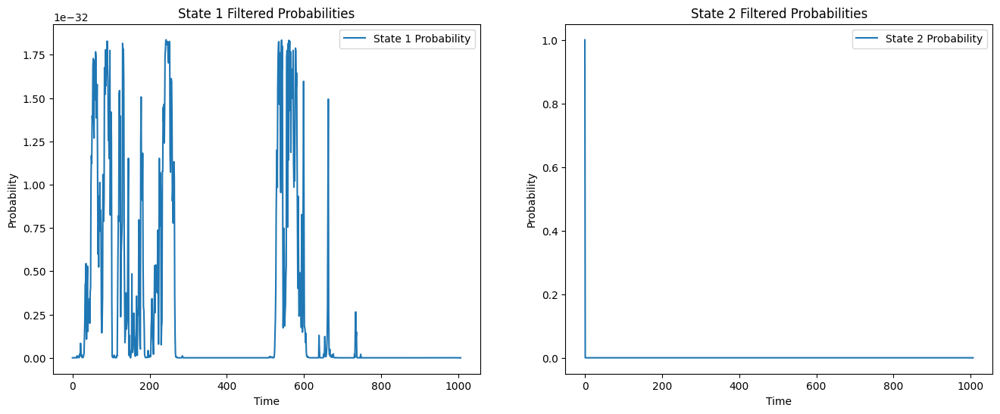

Iteration 59: Max Diff = 0.009201679054251188
mu_hat0: [4.10753314 4.10753314 4.10753314]
mu_hat1: [4.10753314 4.10753314 4.10753314]
sigma_hat0: [0.03819718 0.26722095 0.37219148]
sigma_hat1: [0.03824466 0.26722096 0.37219148]
P_hat0: [[6.12562974e-007 3.30196536e-007 9.99999057e-001]
 [2.36746437e-253 1.25813216e-006 9.99998742e-001]
 [1.83867525e-032 1.27266420e-012 1.00000000e+000]]
P_hat1: [[4.04455378e-007 3.28118831e-007 9.99999267e-001]
 [4.14518339e-263 1.00823383e-006 9.99998992e-001]
 [2.53269864e-033 9.45913921e-013 1.00000000e+000]]
Converged:
{   'P_hat': '[[0. 0. 1.]\n [0. 0. 1.]\n [0. 0. 1.]]',
    'mu_hat': '[4.1075 4.1075 4.1075]',
    'pi_hat': '[0. 1. 0.]',
    'sigma_hat': '[0.0382 0.2672 0.3722]'}

Running analyses for different numbers of states...

Analyzing model with 2 states:


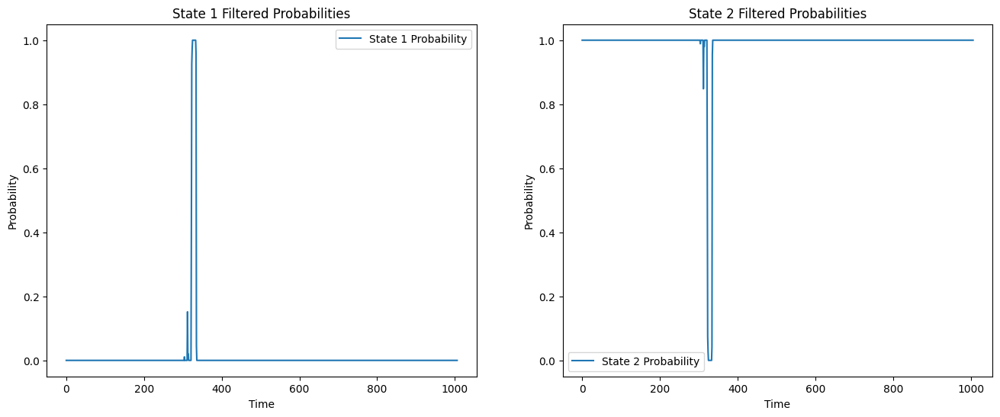

Iteration 0: Max Diff = 3.566905394274457
mu_hat0: [2 4]
mu_hat1: [2.77134372 4.12433599]
sigma_hat0: [0.1 0.1]
sigma_hat1: [0.21516316 0.34188407]
P_hat0: [[0.7 0.3]
 [0.3 0.7]]
P_hat1: [[0.90288603 0.09711397]
 [0.00122246 0.99877754]]


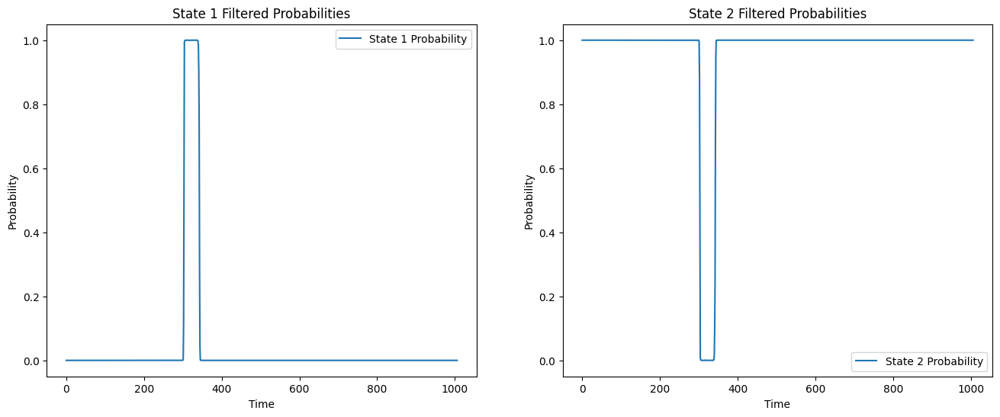

Iteration 1: Max Diff = 108.94593942956017
mu_hat0: [2.77134372 4.12433599]
mu_hat1: [3.03405865 4.15152722]
sigma_hat0: [0.21516316 0.34188407]
sigma_hat1: [0.22898725 0.30466931]
P_hat0: [[0.90288603 0.09711397]
 [0.00122246 0.99877754]]
P_hat1: [[0.97473808 0.02526192]
 [0.00103638 0.99896362]]


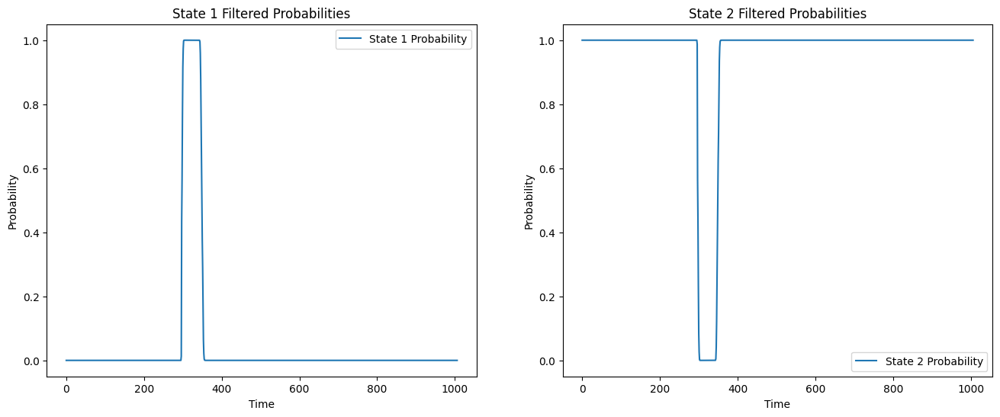

Iteration 2: Max Diff = 10.14185770393086
mu_hat0: [3.03405865 4.15152722]
mu_hat1: [3.12687647 4.16015578]
sigma_hat0: [0.22898725 0.30466931]
sigma_hat1: [0.26708039 0.29612175]
P_hat0: [[0.97473808 0.02526192]
 [0.00103638 0.99896362]]
P_hat1: [[0.98048887 0.01951113]
 [0.00104808 0.99895192]]


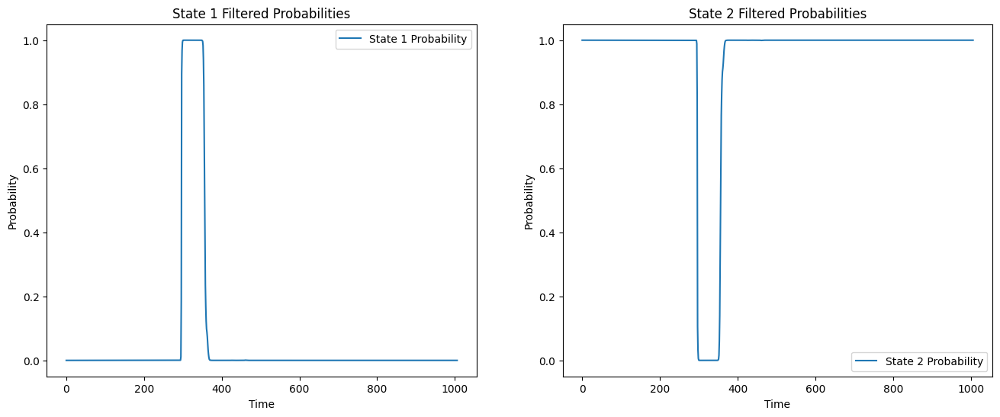

Iteration 3: Max Diff = 5.073614955748801
mu_hat0: [3.12687647 4.16015578]
mu_hat1: [3.19145701 4.16597669]
sigma_hat0: [0.26708039 0.29612175]
sigma_hat1: [0.2909778  0.29143996]
P_hat0: [[0.98048887 0.01951113]
 [0.00104808 0.99895192]]
P_hat1: [[0.9833885 0.0166115]
 [0.0010609 0.9989391]]


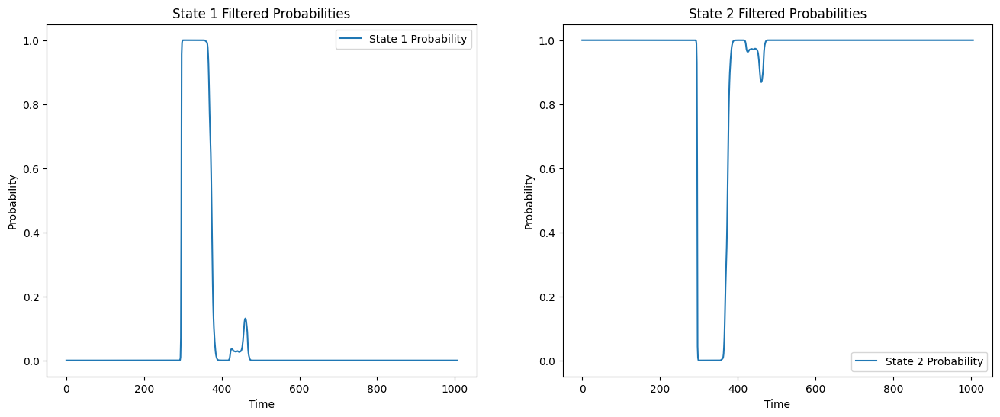

Iteration 4: Max Diff = 3.9489114413410746
mu_hat0: [3.19145701 4.16597669]
mu_hat1: [3.30449695 4.17683255]
sigma_hat0: [0.2909778  0.29143996]
sigma_hat1: [0.32198885 0.2846211 ]
P_hat0: [[0.9833885 0.0166115]
 [0.0010609 0.9989391]]
P_hat1: [[0.98548783 0.01451217]
 [0.00125371 0.99874629]]


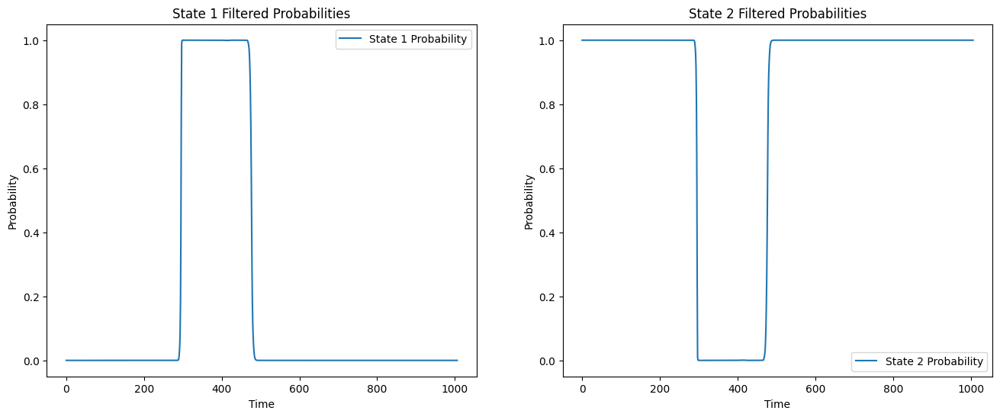

Iteration 5: Max Diff = 13.315624191790317
mu_hat0: [3.30449695 4.17683255]
mu_hat1: [3.52716943 4.23525779]
sigma_hat0: [0.32198885 0.2846211 ]
sigma_hat1: [0.29289504 0.24415461]
P_hat0: [[0.98548783 0.01451217]
 [0.00125371 0.99874629]]
P_hat1: [[0.99446619 0.00553381]
 [0.00121935 0.99878065]]


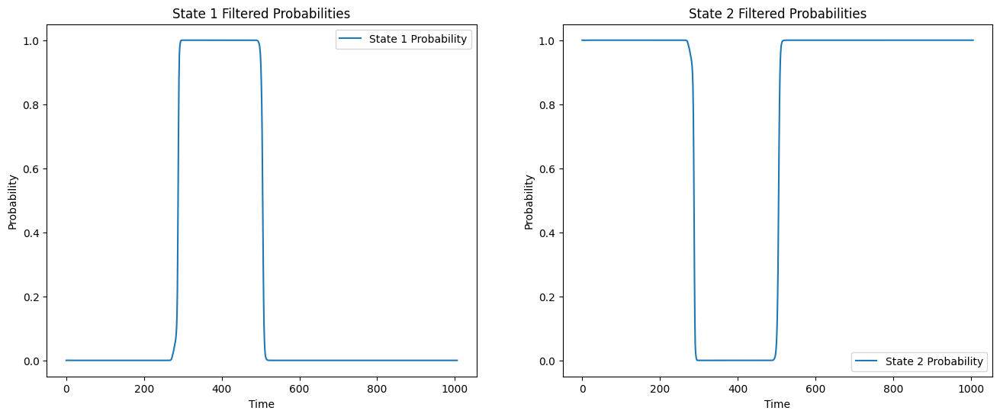

Iteration 6: Max Diff = 1.5086910803553966
mu_hat0: [3.52716943 4.23525779]
mu_hat1: [3.58125274 4.25320241]
sigma_hat0: [0.29289504 0.24415461]
sigma_hat1: [0.29363352 0.23459909]
P_hat0: [[0.99446619 0.00553381]
 [0.00121935 0.99878065]]
P_hat1: [[0.99540817 0.00459183]
 [0.00127261 0.99872739]]


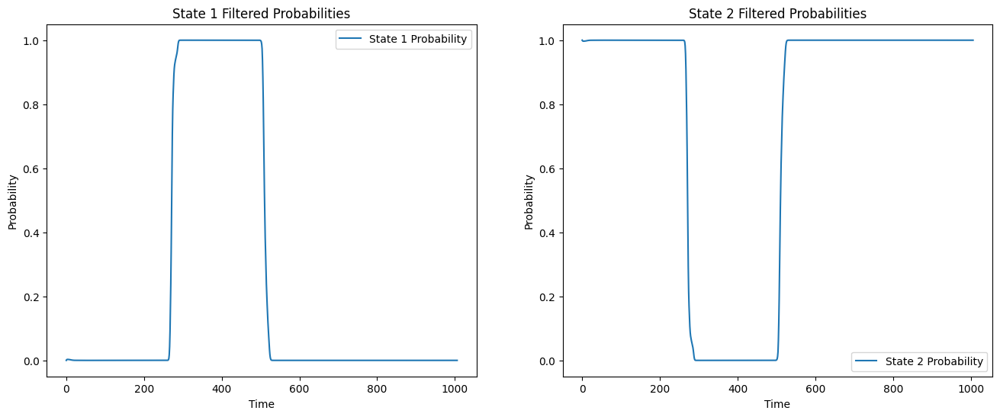

Iteration 7: Max Diff = 0.6269928721569262
mu_hat0: [3.58125274 4.25320241]
mu_hat1: [3.61312194 4.26189158]
sigma_hat0: [0.29363352 0.23459909]
sigma_hat1: [0.29843406 0.23181639]
P_hat0: [[0.99540817 0.00459183]
 [0.00127261 0.99872739]]
P_hat1: [[0.99579719 0.00420281]
 [0.00131391 0.99868609]]


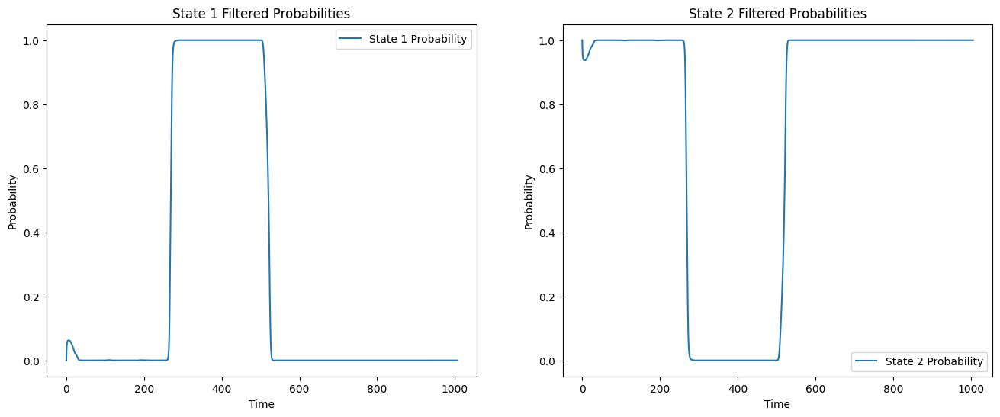

Iteration 8: Max Diff = 0.2344936164375761
mu_hat0: [3.61312194 4.26189158]
mu_hat1: [3.62968848 4.26661931]
sigma_hat0: [0.29843406 0.23181639]
sigma_hat1: [0.3006442  0.23051596]
P_hat0: [[0.99579719 0.00420281]
 [0.00131391 0.99868609]]
P_hat1: [[0.99573829 0.00426171]
 [0.00142078 0.99857922]]


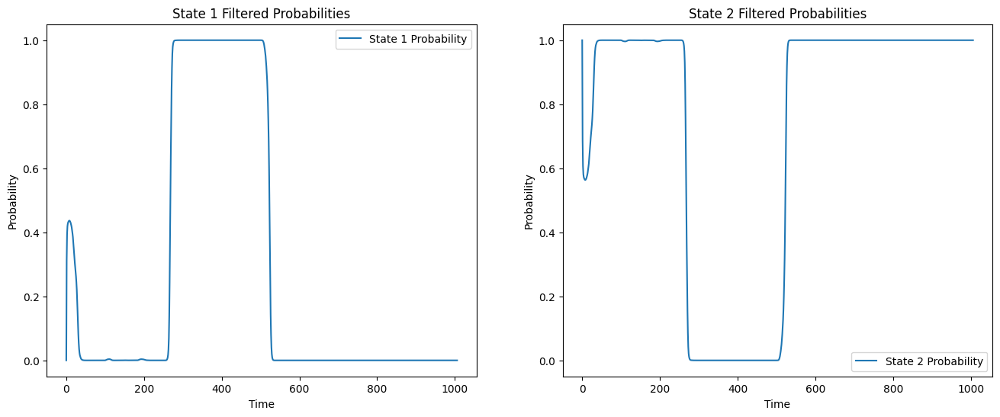

Iteration 9: Max Diff = 2.3400749740318947
mu_hat0: [3.62968848 4.26661931]
mu_hat1: [3.64642678 4.27205208]
sigma_hat0: [0.3006442  0.23051596]
sigma_hat1: [0.30202896 0.22888183]
P_hat0: [[0.99573829 0.00426171]
 [0.00142078 0.99857922]]
P_hat1: [[0.99450238 0.00549762]
 [0.00196425 0.99803575]]


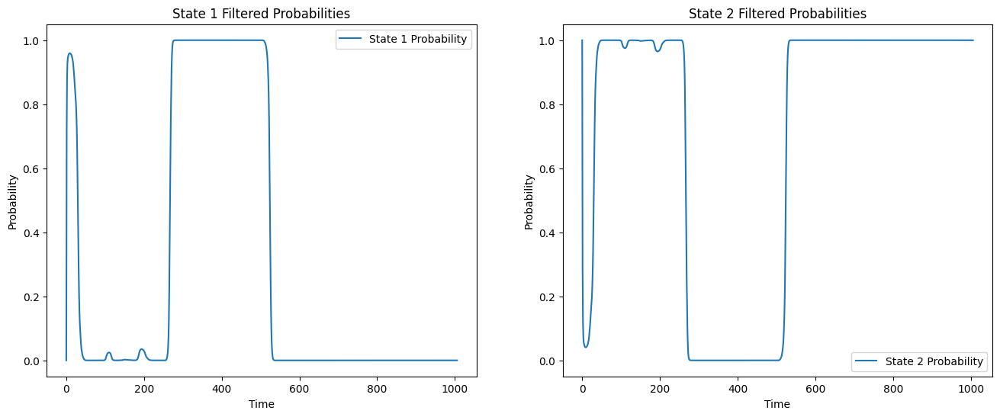

Iteration 10: Max Diff = 2.4339430075923714
mu_hat0: [3.64642678 4.27205208]
mu_hat1: [3.66929923 4.2805483 ]
sigma_hat0: [0.30202896 0.22888183]
sigma_hat1: [0.3028346  0.22618986]
P_hat0: [[0.99450238 0.00549762]
 [0.00196425 0.99803575]]
P_hat1: [[0.99285208 0.00714792]
 [0.00282608 0.99717392]]


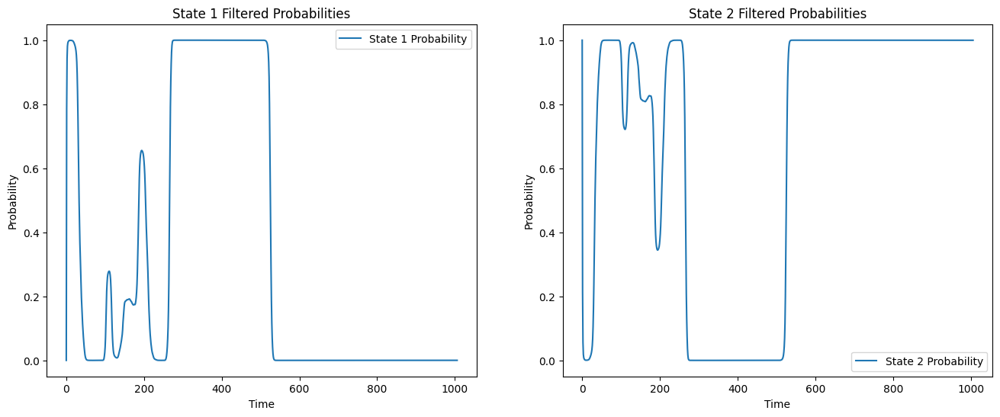

Iteration 11: Max Diff = 2.613493344776185
mu_hat0: [3.66929923 4.2805483 ]
mu_hat1: [3.70591157 4.29489203]
sigma_hat0: [0.3028346  0.22618986]
sigma_hat1: [0.30426117 0.22251909]
P_hat0: [[0.99285208 0.00714792]
 [0.00282608 0.99717392]]
P_hat1: [[0.99059605 0.00940395]
 [0.0043937  0.9956063 ]]


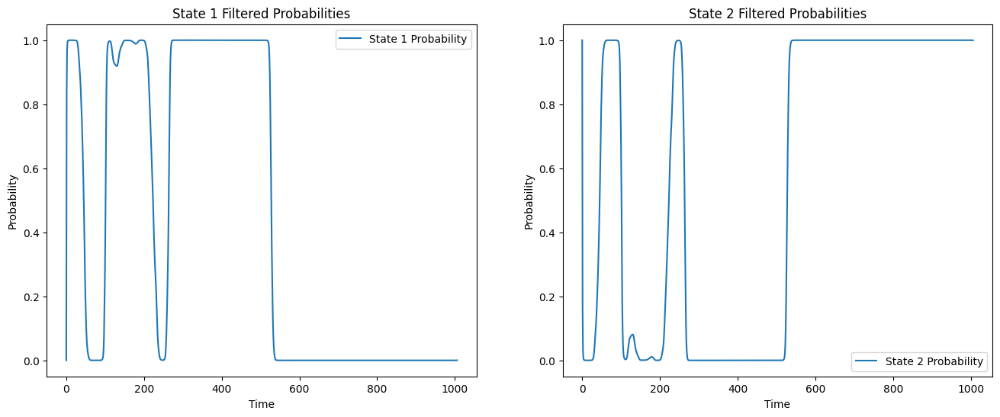

Iteration 12: Max Diff = 1.3893221381010403
mu_hat0: [3.70591157 4.29489203]
mu_hat1: [3.78690784 4.34493726]
sigma_hat0: [0.30426117 0.22251909]
sigma_hat1: [0.29839111 0.20633923]
P_hat0: [[0.99059605 0.00940395]
 [0.0043937  0.9956063 ]]
P_hat1: [[0.99268457 0.00731543]
 [0.00542678 0.99457322]]


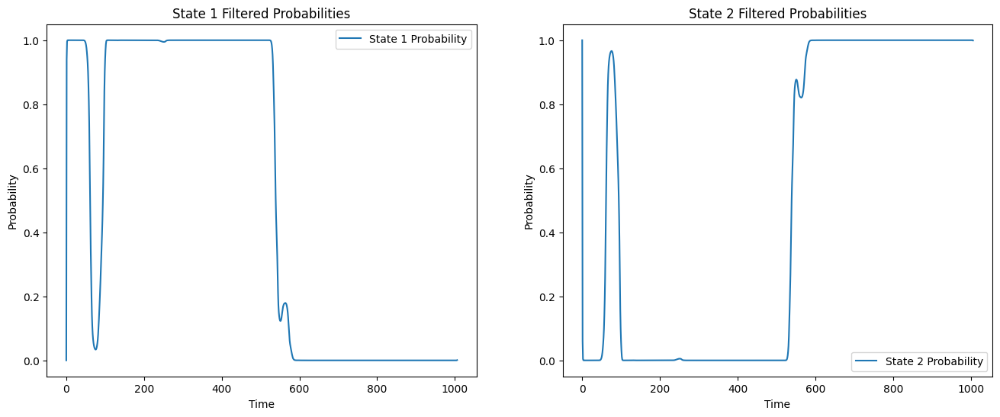

Iteration 13: Max Diff = 1.6116692216347541
mu_hat0: [3.78690784 4.34493726]
mu_hat1: [3.83603411 4.38913216]
sigma_hat0: [0.29839111 0.20633923]
sigma_hat1: [0.29480905 0.19019215]
P_hat0: [[0.99268457 0.00731543]
 [0.00542678 0.99457322]]
P_hat1: [[0.99593647 0.00406353]
 [0.00422501 0.99577499]]


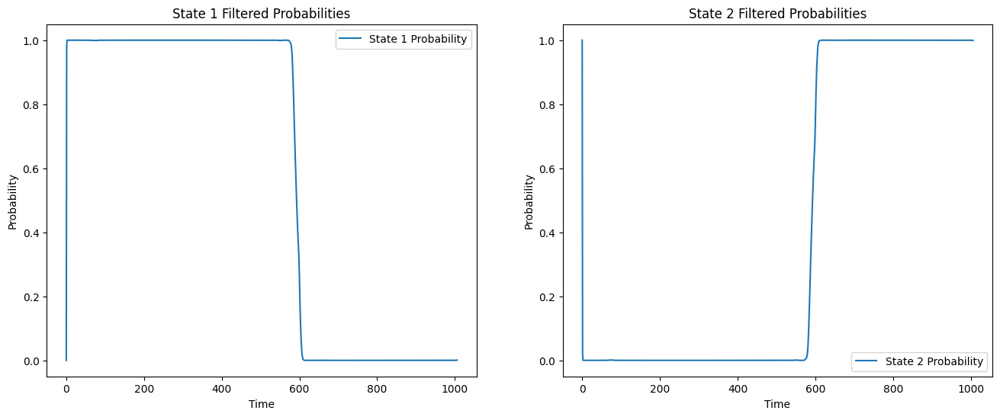

Iteration 14: Max Diff = 1.9847263056237725
mu_hat0: [3.83603411 4.38913216]
mu_hat1: [3.87686226 4.43744519]
sigma_hat0: [0.29480905 0.19019215]
sigma_hat1: [0.29331719 0.16880854]
P_hat0: [[0.99593647 0.00406353]
 [0.00422501 0.99577499]]
P_hat1: [[0.9982929  0.0017071 ]
 [0.00244971 0.99755029]]


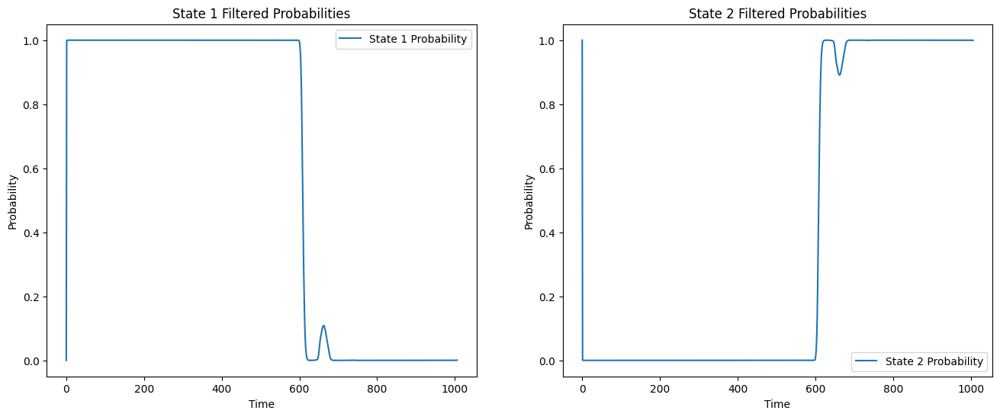

Iteration 15: Max Diff = 0.5318773344891491
mu_hat0: [3.87686226 4.43744519]
mu_hat1: [3.88615831 4.44852684]
sigma_hat0: [0.29331719 0.16880854]
sigma_hat1: [0.29392162 0.16401645]
P_hat0: [[0.9982929  0.0017071 ]
 [0.00244971 0.99755029]]
P_hat1: [[0.99817809 0.00182191]
 [0.00281547 0.99718453]]


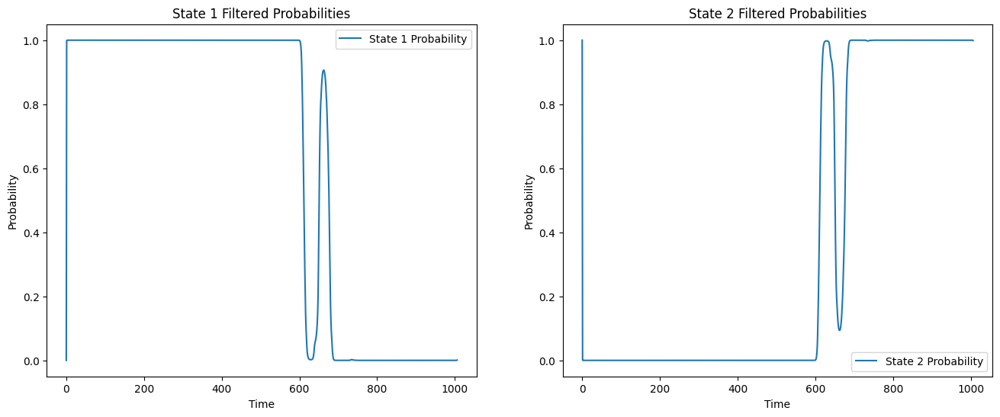

Iteration 16: Max Diff = 3.665840339807517
mu_hat0: [3.88615831 4.44852684]
mu_hat1: [3.89918155 4.46330714]
sigma_hat0: [0.29392162 0.16401645]
sigma_hat1: [0.29551623 0.15832391]
P_hat0: [[0.99817809 0.00182191]
 [0.00281547 0.99718453]]
P_hat1: [[0.99699232 0.00300768]
 [0.00515242 0.99484758]]


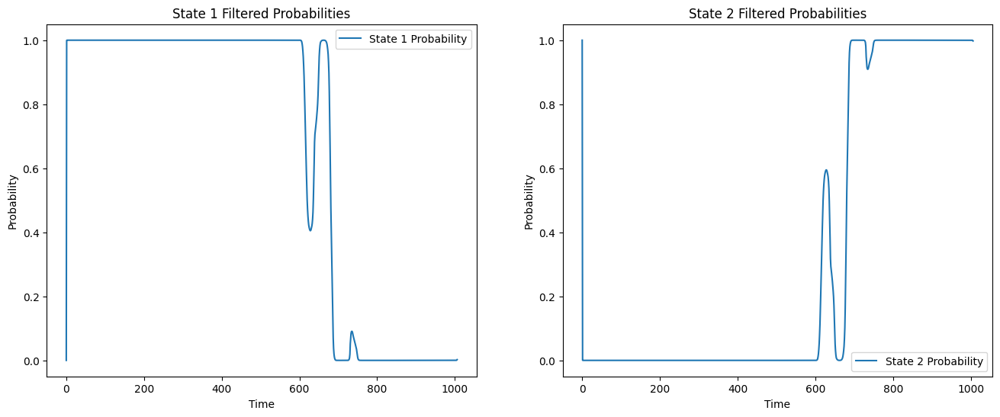

Iteration 17: Max Diff = 0.37593698668246717
mu_hat0: [3.89918155 4.46330714]
mu_hat1: [3.91613158 4.48133694]
sigma_hat0: [0.29551623 0.15832391]
sigma_hat1: [0.2987157 0.1527313]
P_hat0: [[0.99699232 0.00300768]
 [0.00515242 0.99484758]]
P_hat1: [[0.99744175 0.00255825]
 [0.0050177  0.9949823 ]]


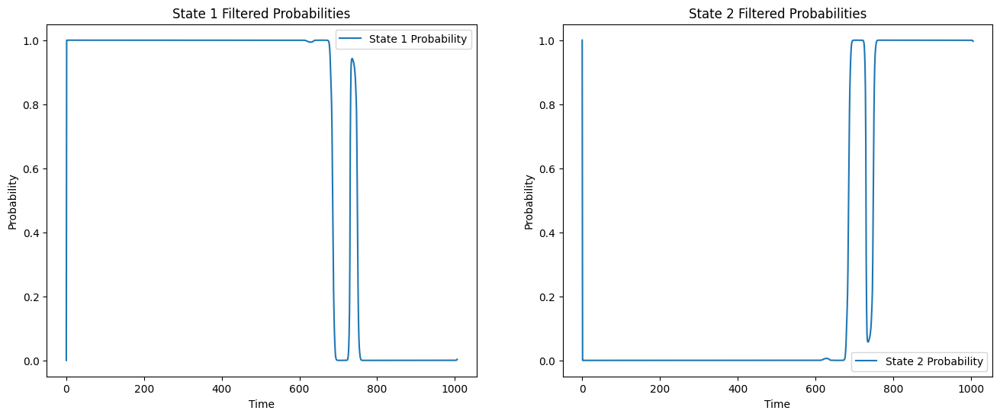

Iteration 18: Max Diff = 1.2566208751584849
mu_hat0: [3.91613158 4.48133694]
mu_hat1: [3.9346091  4.50689365]
sigma_hat0: [0.2987157 0.1527313]
sigma_hat1: [0.30137677 0.14112322]
P_hat0: [[0.99744175 0.00255825]
 [0.0050177  0.9949823 ]]
P_hat1: [[0.99721567 0.00278433]
 [0.00646183 0.99353817]]


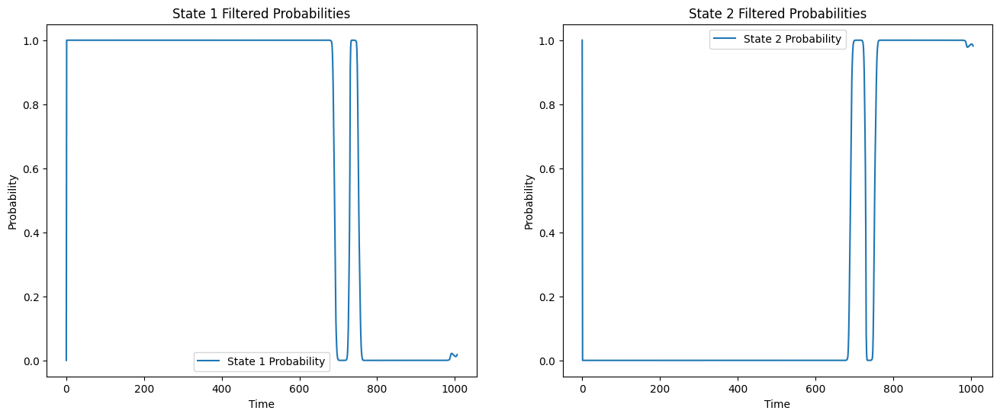

Iteration 19: Max Diff = 0.38723075774379373
mu_hat0: [3.9346091  4.50689365]
mu_hat1: [3.94069722 4.5149669 ]
sigma_hat0: [0.30137677 0.14112322]
sigma_hat1: [0.30262949 0.13768831]
P_hat0: [[0.99721567 0.00278433]
 [0.00646183 0.99353817]]
P_hat1: [[0.9971761  0.0028239 ]
 [0.00698072 0.99301928]]


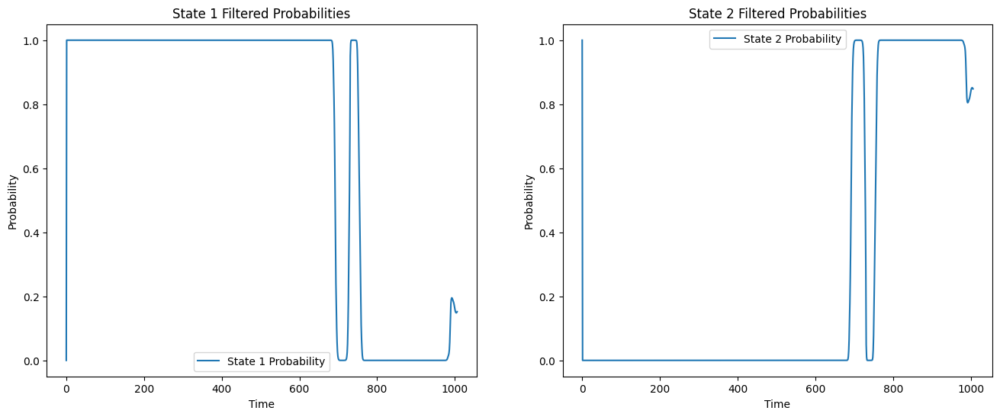

Iteration 20: Max Diff = 0.5679544621357734
mu_hat0: [3.94069722 4.5149669 ]
mu_hat1: [3.9444601  4.51937395]
sigma_hat0: [0.30262949 0.13768831]
sigma_hat1: [0.30360874 0.13627523]
P_hat0: [[0.9971761  0.0028239 ]
 [0.00698072 0.99301928]]
P_hat1: [[0.99714049 0.00285951]
 [0.00777543 0.99222457]]


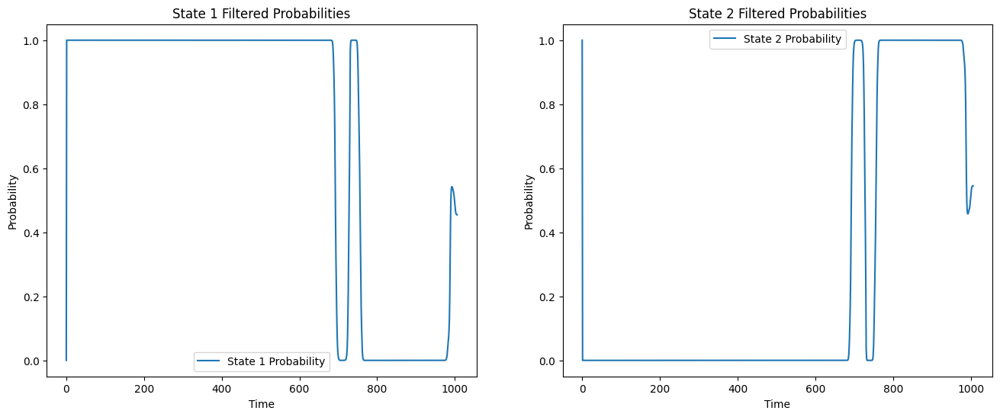

Iteration 21: Max Diff = 1.0322786125579535
mu_hat0: [3.9444601  4.51937395]
mu_hat1: [3.94917936 4.52523176]
sigma_hat0: [0.30360874 0.13627523]
sigma_hat1: [0.30480032 0.13420421]
P_hat0: [[0.99714049 0.00285951]
 [0.00777543 0.99222457]]
P_hat1: [[0.99711193 0.00288807]
 [0.00927438 0.99072562]]


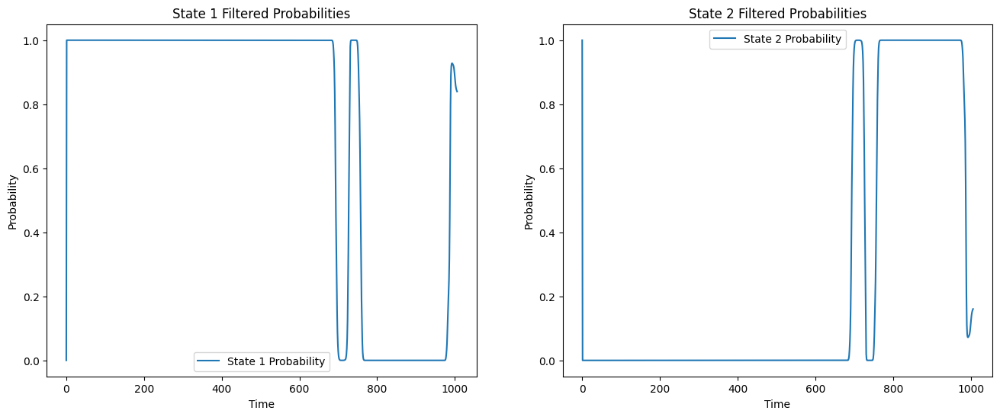

Iteration 22: Max Diff = 1.2495557153072714
mu_hat0: [3.94917936 4.52523176]
mu_hat1: [3.9552332  4.53326253]
sigma_hat0: [0.30480032 0.13420421]
sigma_hat1: [0.306286   0.13108755]
P_hat0: [[0.99711193 0.00288807]
 [0.00927438 0.99072562]]
P_hat1: [[0.997164   0.002836  ]
 [0.01108919 0.98891081]]


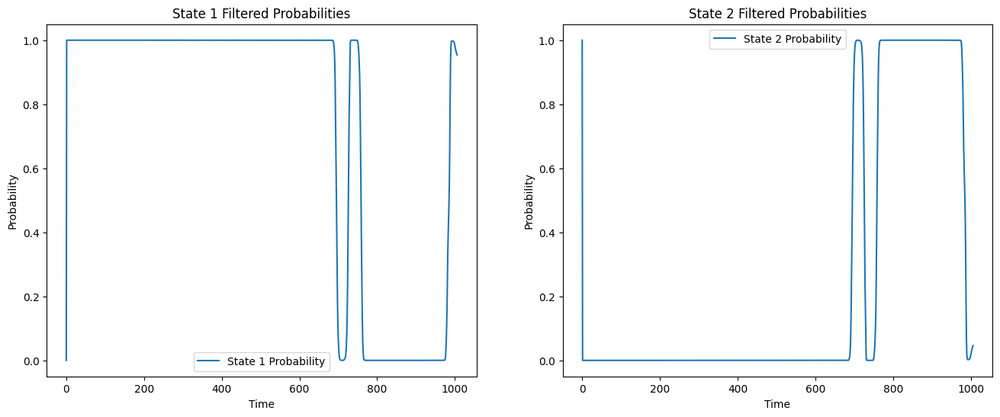

Iteration 23: Max Diff = 0.4658248973700077
mu_hat0: [3.9552332  4.53326253]
mu_hat1: [3.95943502 4.53872288]
sigma_hat0: [0.306286   0.13108755]
sigma_hat1: [0.30740193 0.12914473]
P_hat0: [[0.997164   0.002836  ]
 [0.01108919 0.98891081]]
P_hat1: [[0.99725917 0.00274083]
 [0.01167785 0.98832215]]


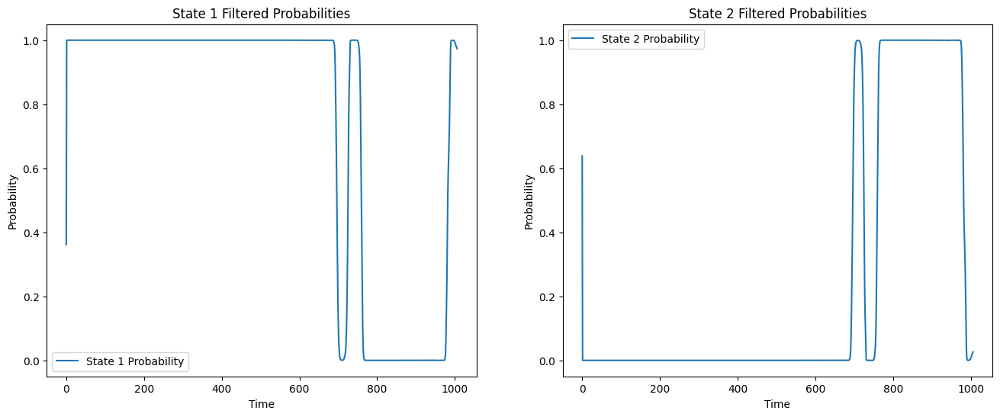

Iteration 24: Max Diff = 7236.47016147844
mu_hat0: [3.95943502 4.53872288]
mu_hat1: [3.96185959 4.5428742 ]
sigma_hat0: [0.30740193 0.12914473]
sigma_hat1: [0.30803878 0.12543455]
P_hat0: [[0.99725917 0.00274083]
 [0.01167785 0.98832215]]
P_hat1: [[0.9973015  0.0026985 ]
 [0.01047811 0.98952189]]


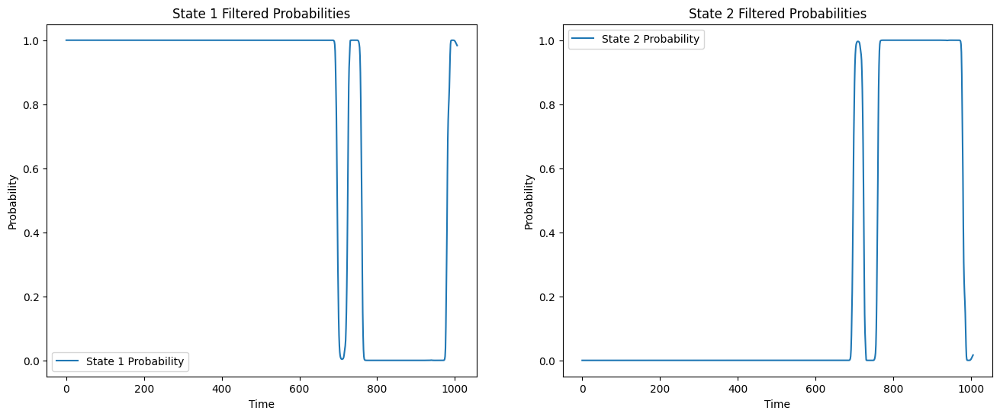

Iteration 25: Max Diff = 3.5264057472304753
mu_hat0: [3.96185959 4.5428742 ]
mu_hat1: [3.96422384 4.54784479]
sigma_hat0: [0.30803878 0.12543455]
sigma_hat1: [0.30864205 0.11922527]
P_hat0: [[0.9973015  0.0026985 ]
 [0.01047811 0.98952189]]
P_hat1: [[0.9973375  0.0026625 ]
 [0.00810346 0.99189654]]


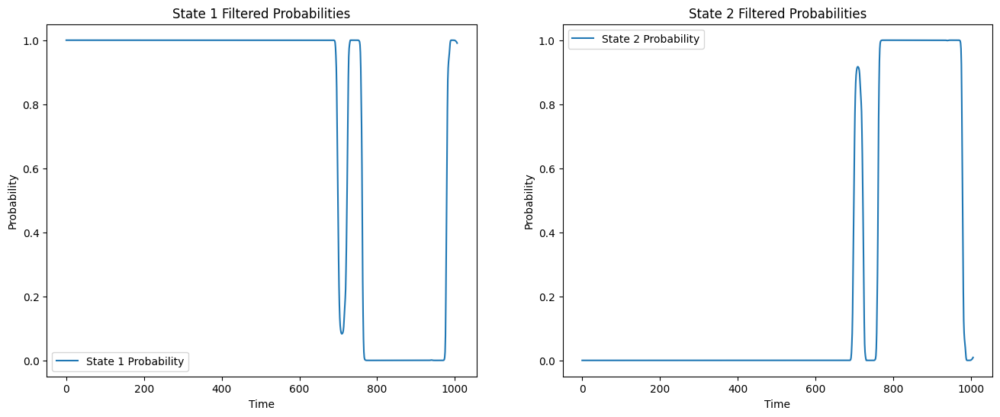

Iteration 26: Max Diff = 0.13777946437648628
mu_hat0: [3.96422384 4.54784479]
mu_hat1: [3.96856159 4.55317224]
sigma_hat0: [0.30864205 0.11922527]
sigma_hat1: [0.31000023 0.11734155]
P_hat0: [[0.9973375  0.0026625 ]
 [0.00810346 0.99189654]]
P_hat1: [[0.99747454 0.00252546]
 [0.00805019 0.99194981]]


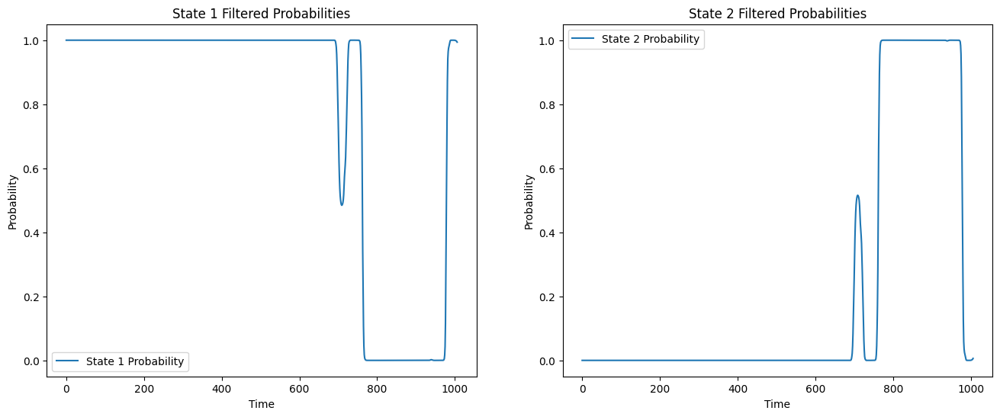

Iteration 27: Max Diff = 1.4160015109520705
mu_hat0: [3.96856159 4.55317224]
mu_hat1: [3.97546482 4.56129755]
sigma_hat0: [0.31000023 0.11734155]
sigma_hat1: [0.31231993 0.11493743]
P_hat0: [[0.99747454 0.00252546]
 [0.00805019 0.99194981]]
P_hat1: [[0.99802701 0.00197299]
 [0.00674384 0.99325616]]


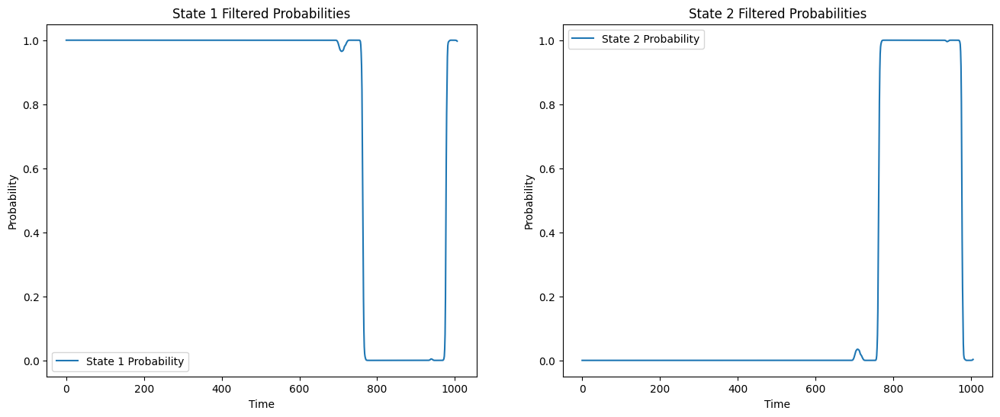

Iteration 28: Max Diff = 2.441747457345211
mu_hat0: [3.97546482 4.56129755]
mu_hat1: [3.982021   4.56981115]
sigma_hat0: [0.31231993 0.11493743]
sigma_hat1: [0.31443842 0.11201105]
P_hat0: [[0.99802701 0.00197299]
 [0.00674384 0.99325616]]
P_hat1: [[0.99867486 0.00132514]
 [0.00486083 0.99513917]]


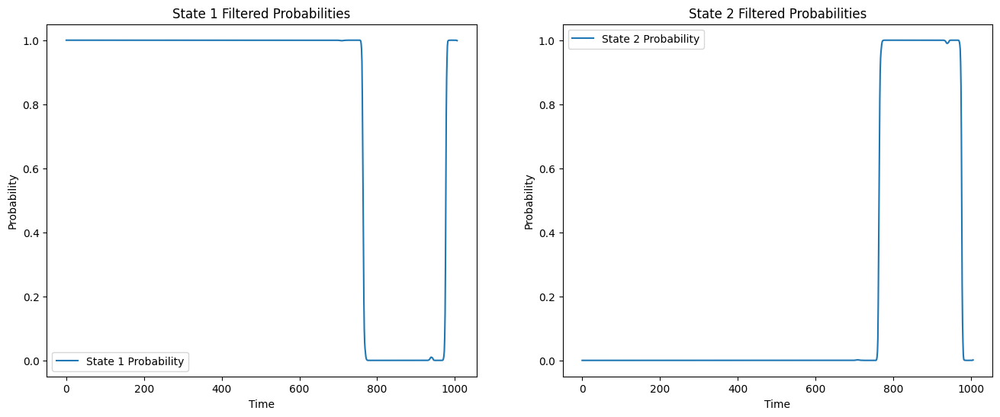

Iteration 29: Max Diff = 0.19597481873487907
mu_hat0: [3.982021   4.56981115]
mu_hat1: [3.98332431 4.5716125 ]
sigma_hat0: [0.31443842 0.11201105]
sigma_hat1: [0.31485156 0.11130699]
P_hat0: [[0.99867486 0.00132514]
 [0.00486083 0.99513917]]
P_hat1: [[0.99872086 0.00127914]
 [0.00476719 0.99523281]]


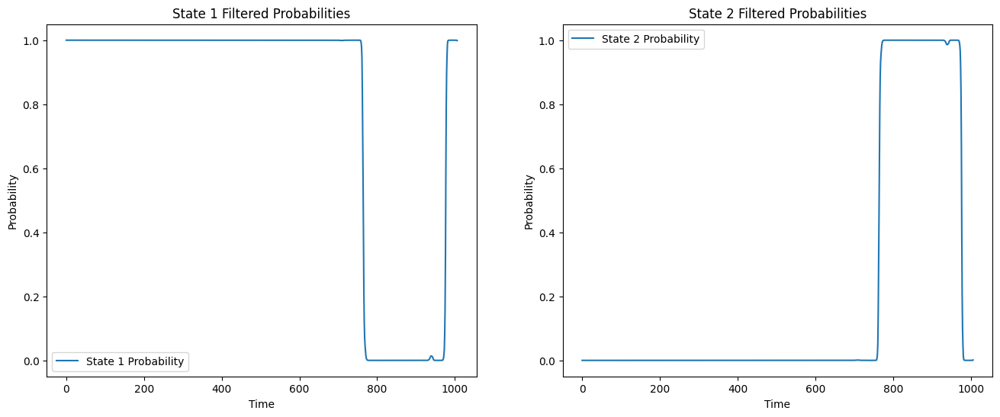

Iteration 30: Max Diff = 0.04103287507479851
mu_hat0: [3.98332431 4.5716125 ]
mu_hat1: [3.98356798 4.57193479]
sigma_hat0: [0.31485156 0.11130699]
sigma_hat1: [0.31493245 0.11119073]
P_hat0: [[0.99872086 0.00127914]
 [0.00476719 0.99523281]]
P_hat1: [[0.99871772 0.00128228]
 [0.00479234 0.99520766]]


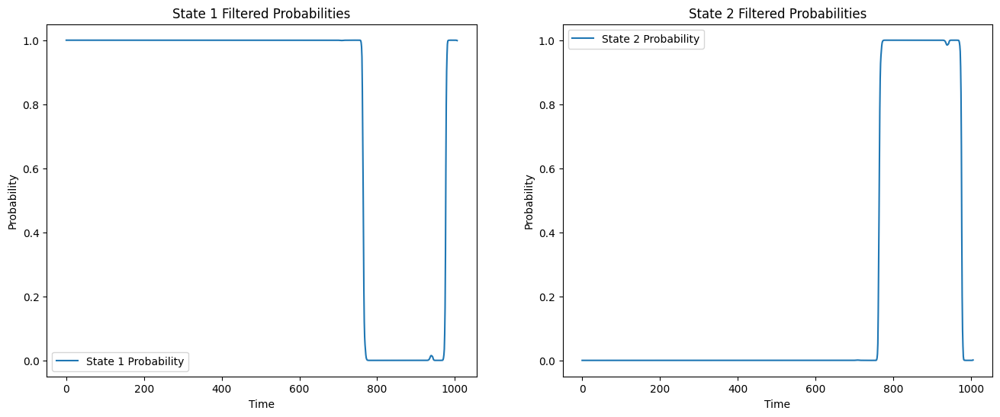

Iteration 31: Max Diff = 0.011899778941143876
mu_hat0: [3.98356798 4.57193479]
mu_hat1: [3.9836137  4.57199491]
sigma_hat0: [0.31493245 0.11119073]
sigma_hat1: [0.31494772 0.11116927]
P_hat0: [[0.99871772 0.00128228]
 [0.00479234 0.99520766]]
P_hat1: [[0.99871651 0.00128349]
 [0.00479935 0.99520065]]


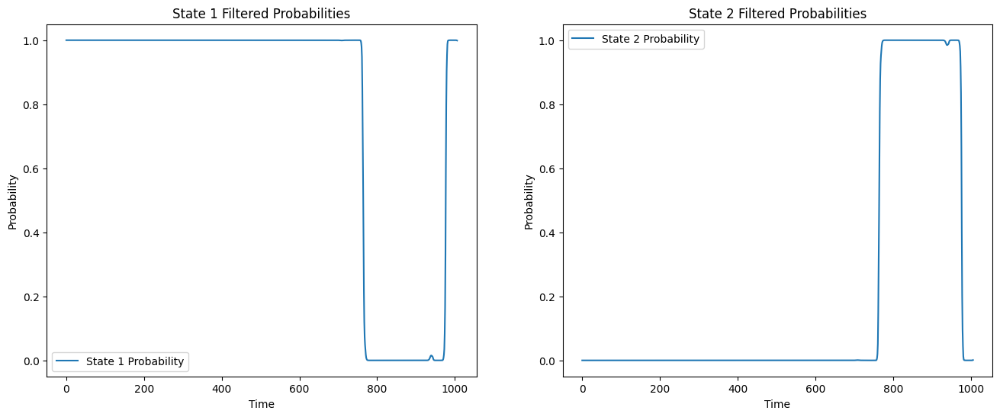

Iteration 32: Max Diff = 0.002476769754788747
mu_hat0: [3.9836137  4.57199491]
mu_hat1: [3.98362236 4.5720063 ]
sigma_hat0: [0.31494772 0.11116927]
sigma_hat1: [0.31495062 0.11116519]
P_hat0: [[0.99871651 0.00128349]
 [0.00479935 0.99520065]]
P_hat1: [[0.99871624 0.00128376]
 [0.0048008  0.9951992 ]]
Converged:
{   'P_hat': '[[0.9987 0.0013]\n [0.0048 0.9952]]',
    'mu_hat': '[3.9836 4.572 ]',
    'pi_hat': '[1. 0.]',
    'sigma_hat': '[0.315  0.1112]'}

Analyzing model with 3 states:


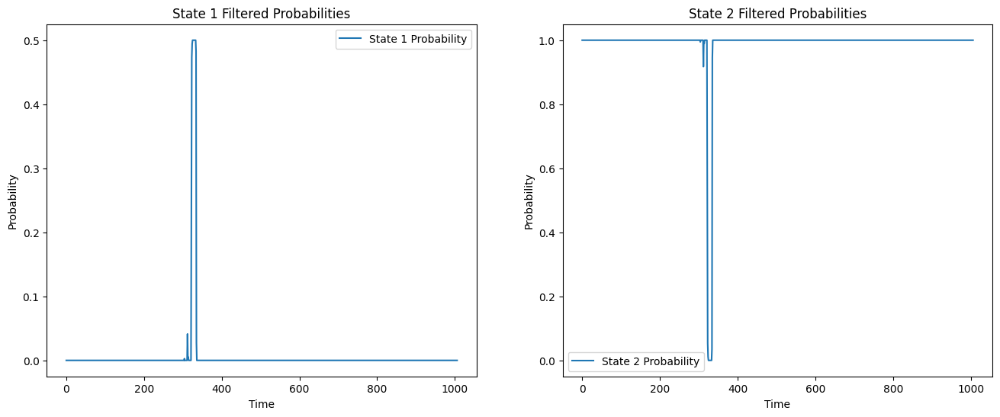

Iteration 0: Max Diff = 5.616655288192228
mu_hat0: [2 4 2]
mu_hat1: [2.77159202 4.12435473 2.77159202]
sigma_hat0: [0.1 0.1 0.1]
sigma_hat1: [0.21513382 0.34185507 0.21513382]
P_hat0: [[0.7  0.15 0.15]
 [0.15 0.7  0.15]
 [0.15 0.15 0.7 ]]
P_hat1: [[7.50501984e-01 8.86761628e-02 1.60821854e-01]
 [5.58847550e-04 9.98882305e-01 5.58847550e-04]
 [1.60821854e-01 8.86761628e-02 7.50501984e-01]]


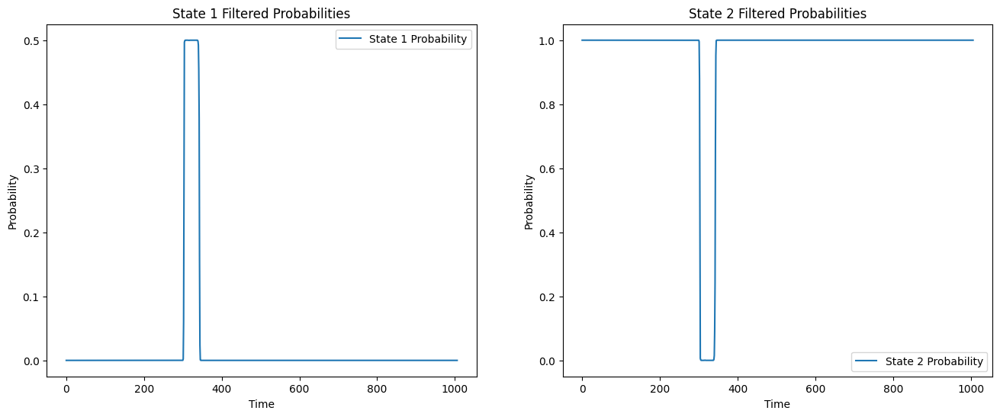

Iteration 1: Max Diff = 385.36583916584266
mu_hat0: [2.77159202 4.12435473 2.77159202]
mu_hat1: [3.03418049 4.15154441 3.03418049]
sigma_hat0: [0.21513382 0.34185507 0.21513382]
sigma_hat1: [0.22900242 0.30464779 0.22900242]
P_hat0: [[7.50501984e-01 8.86761628e-02 1.60821854e-01]
 [5.58847550e-04 9.98882305e-01 5.58847550e-04]
 [1.60821854e-01 8.86761628e-02 7.50501984e-01]]
P_hat1: [[8.02741371e-01 2.52426215e-02 1.72016008e-01]
 [5.18054032e-04 9.98963892e-01 5.18054032e-04]
 [1.72016008e-01 2.52426215e-02 8.02741371e-01]]


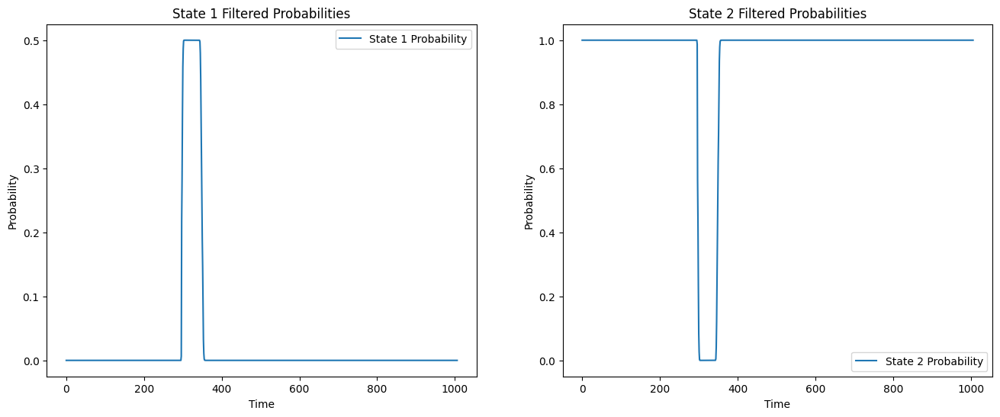

Iteration 2: Max Diff = 37.17343365186618
mu_hat0: [3.03418049 4.15154441 3.03418049]
mu_hat1: [3.12699973 4.1601671  3.12699973]
sigma_hat0: [0.22900242 0.30464779 0.22900242]
sigma_hat1: [0.26712585 0.29611181 0.26712585]
P_hat0: [[8.02741371e-01 2.52426215e-02 1.72016008e-01]
 [5.18054032e-04 9.98963892e-01 5.18054032e-04]
 [1.72016008e-01 2.52426215e-02 8.02741371e-01]]
P_hat1: [[8.07466622e-01 1.95048167e-02 1.73028562e-01]
 [5.24046928e-04 9.98951906e-01 5.24046928e-04]
 [1.73028562e-01 1.95048167e-02 8.07466622e-01]]


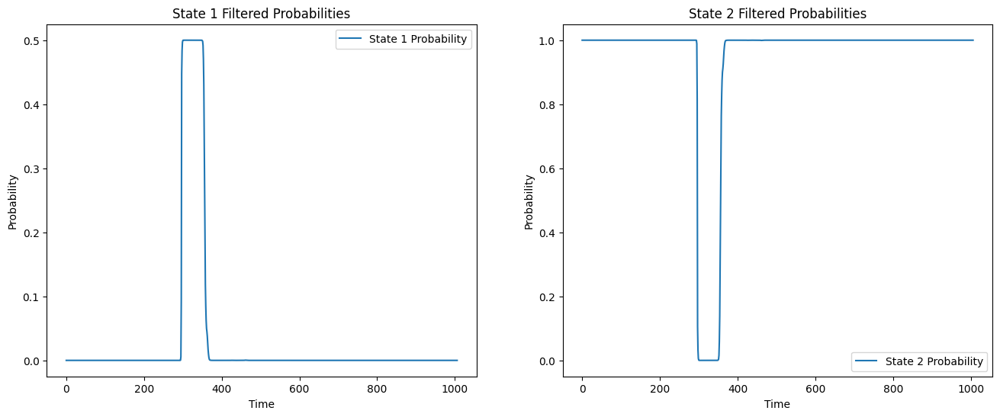

Iteration 3: Max Diff = 18.616618177187462
mu_hat0: [3.12699973 4.1601671  3.12699973]
mu_hat1: [3.19158528 4.16598678 3.19158528]
sigma_hat0: [0.26712585 0.29611181 0.26712585]
sigma_hat1: [0.2910322  0.29143332 0.2910322 ]
P_hat0: [[8.07466622e-01 1.95048167e-02 1.73028562e-01]
 [5.24046928e-04 9.98951906e-01 5.24046928e-04]
 [1.73028562e-01 1.95048167e-02 8.07466622e-01]]
P_hat1: [[8.09853204e-01 1.66068236e-02 1.73539972e-01]
 [5.30464593e-04 9.98939071e-01 5.30464593e-04]
 [1.73539972e-01 1.66068236e-02 8.09853204e-01]]


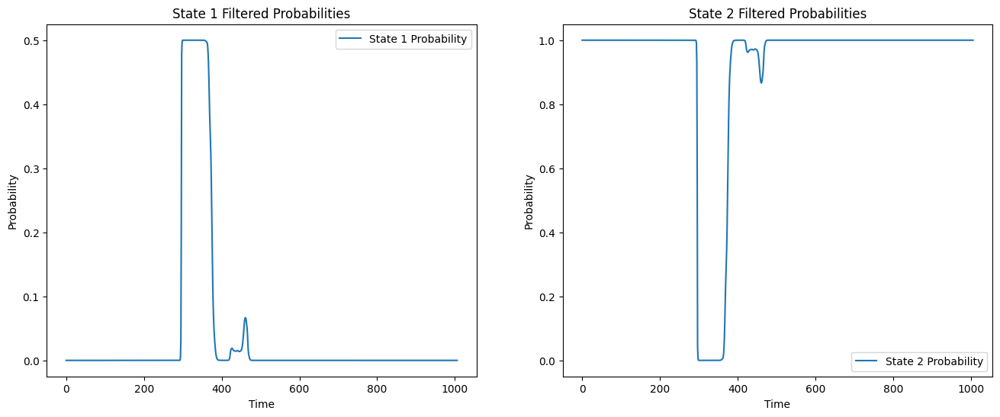

Iteration 4: Max Diff = 13.817339800495416
mu_hat0: [3.19158528 4.16598678 3.19158528]
mu_hat1: [3.3050232 4.1768951 3.3050232]
sigma_hat0: [0.2910322  0.29143332 0.2910322 ]
sigma_hat1: [0.3220612  0.28458289 0.3220612 ]
P_hat0: [[8.09853204e-01 1.66068236e-02 1.73539972e-01]
 [5.30464593e-04 9.98939071e-01 5.30464593e-04]
 [1.73539972e-01 1.66068236e-02 8.09853204e-01]]
P_hat1: [[8.11566004e-01 1.45269946e-02 1.73907001e-01]
 [6.28471487e-04 9.98743057e-01 6.28471487e-04]
 [1.73907001e-01 1.45269946e-02 8.11566004e-01]]


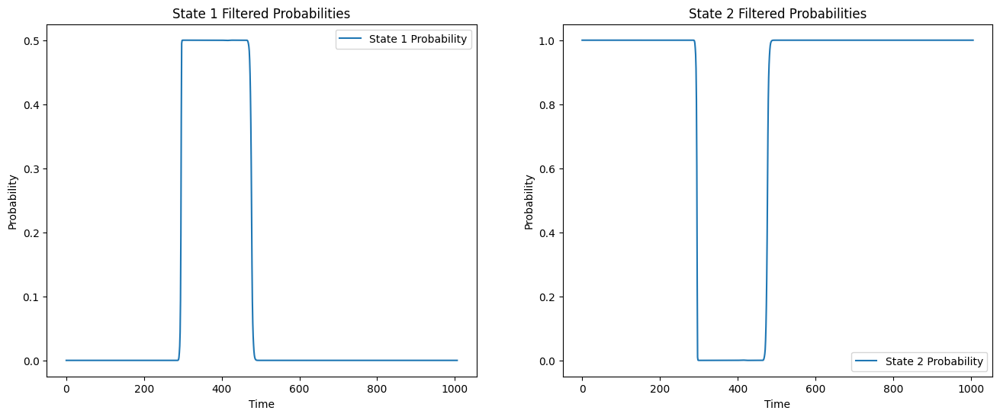

Iteration 5: Max Diff = 49.49167544383674
mu_hat0: [3.3050232 4.1768951 3.3050232]
mu_hat1: [3.52722538 4.23528034 3.52722538]
sigma_hat0: [0.3220612  0.28458289 0.3220612 ]
sigma_hat1: [0.29288708 0.24413923 0.29288708]
P_hat0: [[8.11566004e-01 1.45269946e-02 1.73907001e-01]
 [6.28471487e-04 9.98743057e-01 6.28471487e-04]
 [1.73907001e-01 1.45269946e-02 8.11566004e-01]]
P_hat1: [[8.18973271e-01 5.53245607e-03 1.75494272e-01]
 [6.09691399e-04 9.98780617e-01 6.09691399e-04]
 [1.75494272e-01 5.53245607e-03 8.18973271e-01]]


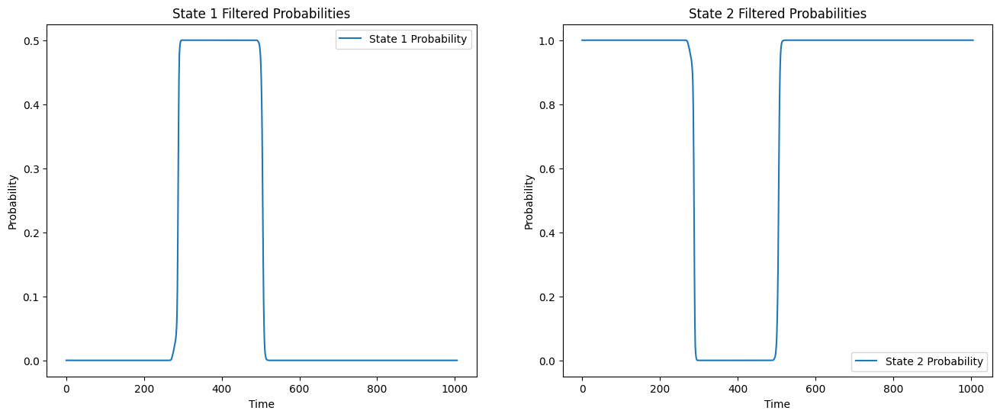

Iteration 6: Max Diff = 5.452860224074055
mu_hat0: [3.52722538 4.23528034 3.52722538]
mu_hat1: [3.58126887 4.2532068  3.58126887]
sigma_hat0: [0.29288708 0.24413923 0.29288708]
sigma_hat1: [0.29363597 0.23459747 0.29363597]
P_hat0: [[8.18973271e-01 5.53245607e-03 1.75494272e-01]
 [6.09691399e-04 9.98780617e-01 6.09691399e-04]
 [1.75494272e-01 5.53245607e-03 8.18973271e-01]]
P_hat1: [[8.19748079e-01 4.59161860e-03 1.75660303e-01]
 [6.36315934e-04 9.98727368e-01 6.36315934e-04]
 [1.75660303e-01 4.59161860e-03 8.19748079e-01]]


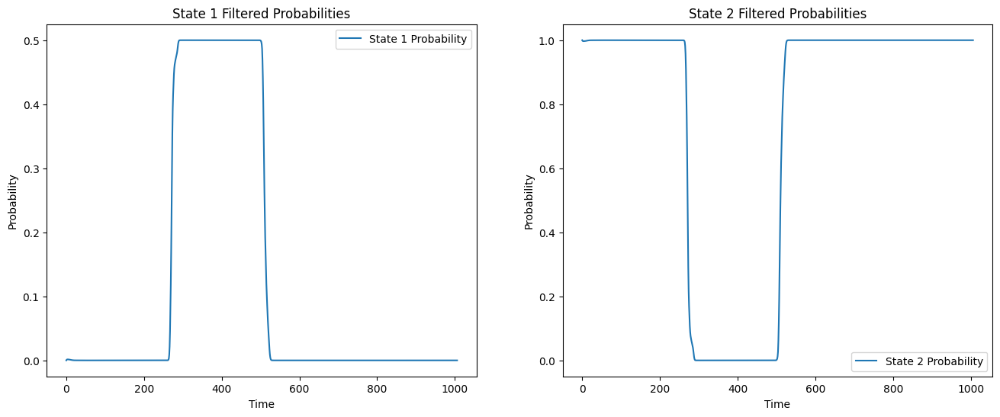

Iteration 7: Max Diff = 2.2247931271997983
mu_hat0: [3.58126887 4.2532068  3.58126887]
mu_hat1: [3.61313061 4.26189402 3.61313061]
sigma_hat0: [0.29363597 0.23459747 0.29363597]
sigma_hat1: [0.29843525 0.23181567 0.29843525]
P_hat0: [[8.19748079e-01 4.59161860e-03 1.75660303e-01]
 [6.36315934e-04 9.98727368e-01 6.36315934e-04]
 [1.75660303e-01 4.59161860e-03 8.19748079e-01]]
P_hat1: [[8.20068343e-01 4.20272585e-03 1.75728931e-01]
 [6.56960840e-04 9.98686078e-01 6.56960840e-04]
 [1.75728931e-01 4.20272585e-03 8.20068343e-01]]


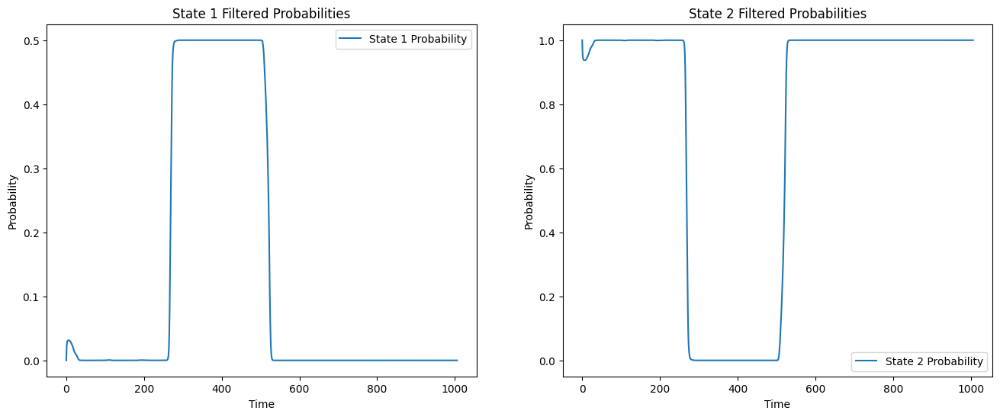

Iteration 8: Max Diff = 0.5953740795960919
mu_hat0: [3.61313061 4.26189402 3.61313061]
mu_hat1: [3.62969354 4.26662083 3.62969354]
sigma_hat0: [0.29843525 0.23181567 0.29843525]
sigma_hat1: [0.30064478 0.23051553 0.30064478]
P_hat0: [[8.20068343e-01 4.20272585e-03 1.75728931e-01]
 [6.56960840e-04 9.98686078e-01 6.56960840e-04]
 [1.75728931e-01 4.20272585e-03 8.20068343e-01]]
P_hat1: [[8.20019599e-01 4.26191595e-03 1.75718485e-01]
 [7.10439459e-04 9.98579121e-01 7.10439459e-04]
 [1.75718485e-01 4.26191595e-03 8.20019599e-01]]


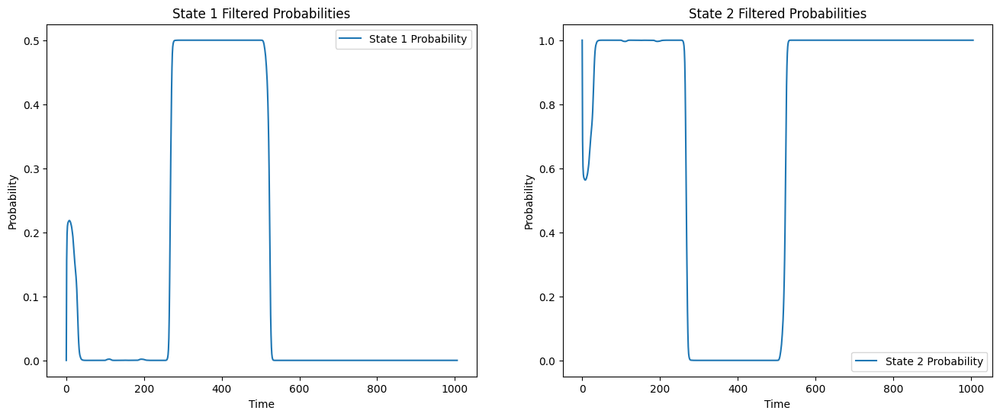

Iteration 9: Max Diff = 7.444206475717546
mu_hat0: [3.62969354 4.26662083 3.62969354]
mu_hat1: [3.64643526 4.27205503 3.64643526]
sigma_hat0: [0.30064478 0.23051553 0.30064478]
sigma_hat1: [0.30202943 0.2288809  0.30202943]
P_hat0: [[8.20019599e-01 4.26191595e-03 1.75718485e-01]
 [7.10439459e-04 9.98579121e-01 7.10439459e-04]
 [1.75718485e-01 4.26191595e-03 8.20019599e-01]]
P_hat1: [[8.19001370e-01 5.49833653e-03 1.75500293e-01]
 [9.82288544e-04 9.98035423e-01 9.82288543e-04]
 [1.75500294e-01 5.49833653e-03 8.19001370e-01]]


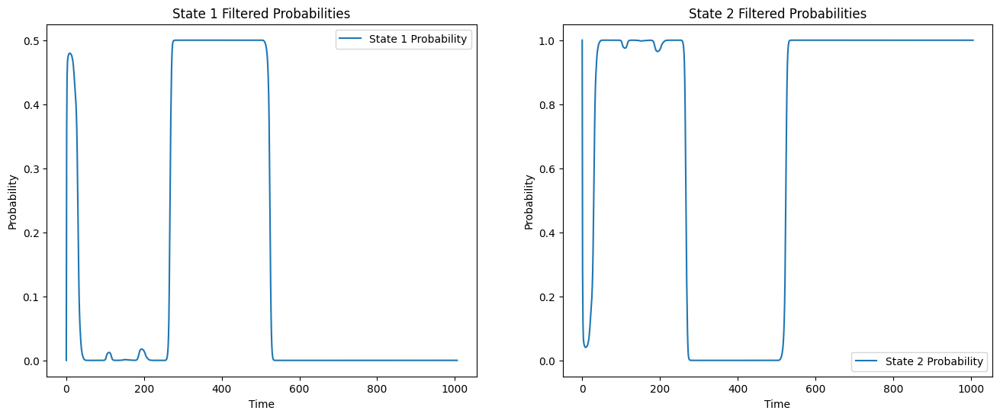

Iteration 10: Max Diff = 7.690370079257108
mu_hat0: [3.64643526 4.27205503 3.64643526]
mu_hat1: [3.66930596 4.28055082 3.66930597]
sigma_hat0: [0.30202943 0.2288809  0.30202943]
sigma_hat1: [0.3028349  0.22618913 0.3028349 ]
P_hat0: [[8.19001370e-01 5.49833653e-03 1.75500293e-01]
 [9.82288544e-04 9.98035423e-01 9.82288543e-04]
 [1.75500294e-01 5.49833653e-03 8.19001370e-01]]
P_hat1: [[0.8176426  0.00714827 0.17520913]
 [0.00141315 0.99717369 0.00141315]
 [0.17520913 0.00714827 0.8176426 ]]


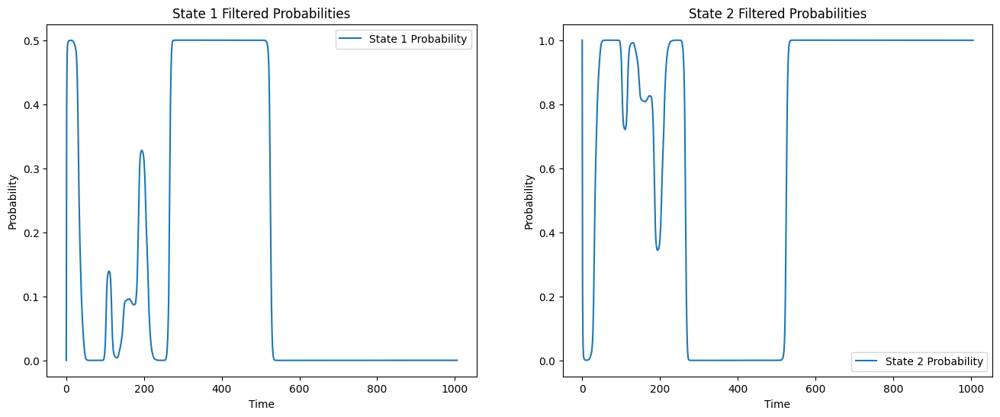

Iteration 11: Max Diff = 8.038085686779372
mu_hat0: [3.66930596 4.28055082 3.66930597]
mu_hat1: [3.70593846 4.29490369 3.70593853]
sigma_hat0: [0.3028349  0.22618913 0.3028349 ]
sigma_hat1: [0.30426151 0.22251611 0.30426143]
P_hat0: [[0.8176426  0.00714827 0.17520913]
 [0.00141315 0.99717369 0.00141315]
 [0.17520913 0.00714827 0.8176426 ]]
P_hat1: [[0.81578429 0.00940481 0.17481091]
 [0.00219733 0.99560533 0.00219733]
 [0.17481093 0.00940481 0.81578427]]


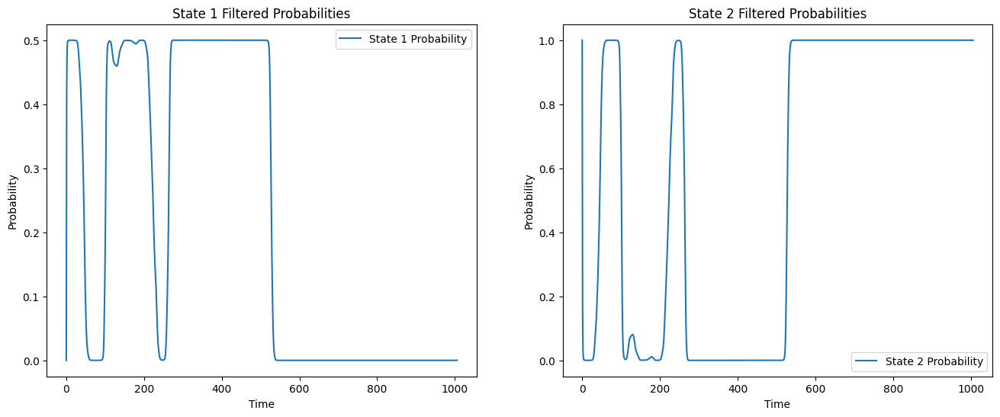

Iteration 12: Max Diff = 4.538186085448753
mu_hat0: [3.70593846 4.29490369 3.70593853]
mu_hat1: [3.7869262  4.34495318 3.78692695]
sigma_hat0: [0.30426151 0.22251611 0.30426143]
sigma_hat1: [0.29838912 0.20633313 0.2983881 ]
P_hat0: [[0.81578429 0.00940481 0.17481091]
 [0.00219733 0.99560533 0.00219733]
 [0.17481093 0.00940481 0.81578427]]
P_hat1: [[0.81750591 0.00731438 0.17517971]
 [0.00271334 0.99457332 0.00271334]
 [0.17517992 0.00731438 0.8175057 ]]


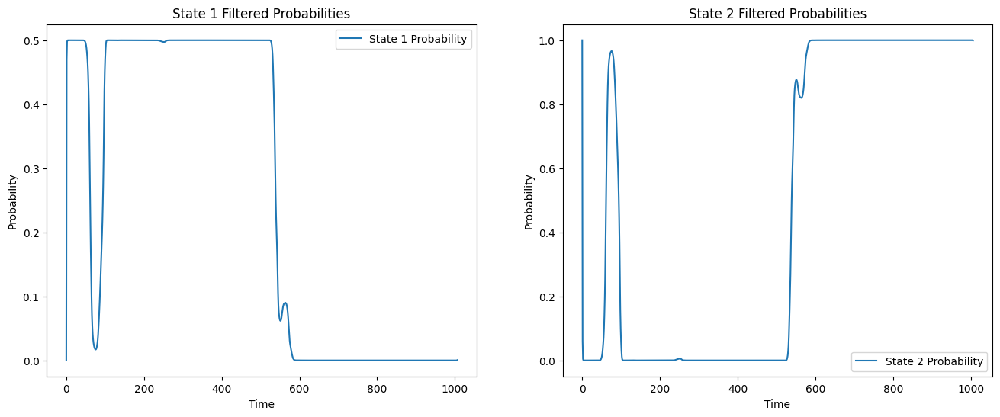

Iteration 13: Max Diff = 5.476603051903694
mu_hat0: [3.7869262  4.34495318 3.78692695]
mu_hat1: [3.83605294 4.389155   3.83606298]
sigma_hat0: [0.29838912 0.20633313 0.2983881 ]
sigma_hat1: [0.29481568 0.19018411 0.29480158]
P_hat0: [[0.81750591 0.00731438 0.17517971]
 [0.00271334 0.99457332 0.00271334]
 [0.17517992 0.00731438 0.8175057 ]]
P_hat1: [[0.82018465 0.00406314 0.17575221]
 [0.00211267 0.99577466 0.00211267]
 [0.17575491 0.00406319 0.8201819 ]]


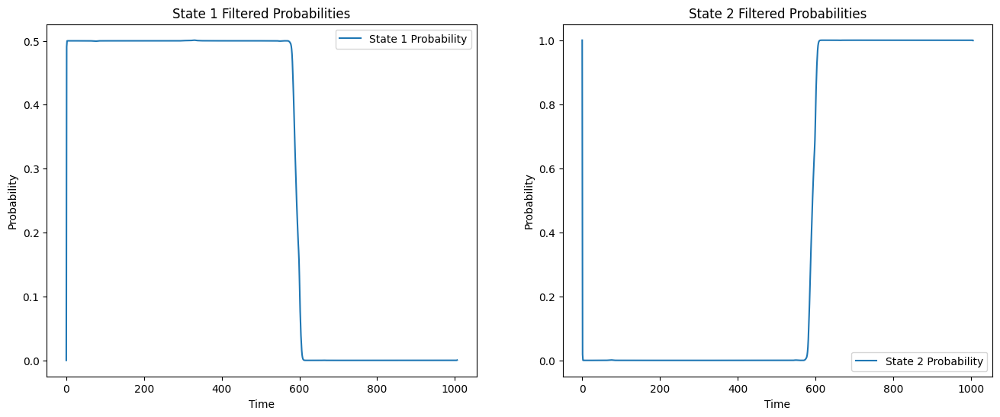

Iteration 14: Max Diff = 5.86422614915994
mu_hat0: [3.83605294 4.389155   3.83606298]
mu_hat1: [3.87679819 4.43745638 3.8769437 ]
sigma_hat0: [0.29481568 0.19018411 0.29480158]
sigma_hat1: [0.29342226 0.16880322 0.29321218]
P_hat0: [[0.82018465 0.00406314 0.17575221]
 [0.00211267 0.99577466 0.00211267]
 [0.17575491 0.00406319 0.8201819 ]]
P_hat1: [[0.82214304 0.00170691 0.17615005]
 [0.00122489 0.9975502  0.0012249 ]
 [0.17618862 0.00170717 0.82210421]]


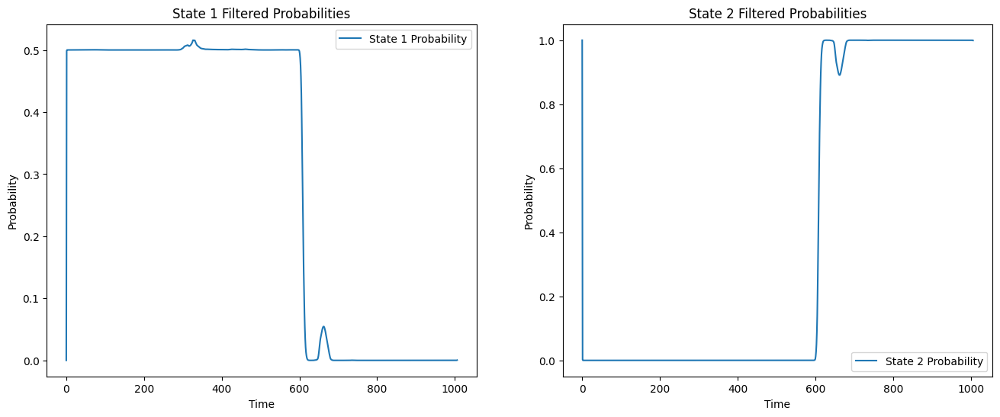

Iteration 15: Max Diff = 1.6044786409619545
mu_hat0: [3.87679819 4.43745638 3.8769437 ]
mu_hat1: [3.88497094 4.44853237 3.88736038]
sigma_hat0: [0.29342226 0.16880322 0.29321218]
sigma_hat1: [0.29559783 0.16401453 0.29222639]
P_hat0: [[0.82214304 0.00170691 0.17615005]
 [0.00122489 0.9975502  0.0012249 ]
 [0.17618862 0.00170717 0.82210421]]
P_hat1: [[0.82234149 0.00182035 0.17583816]
 [0.00140827 0.99718361 0.00140812]
 [0.17645565 0.00182453 0.82171982]]


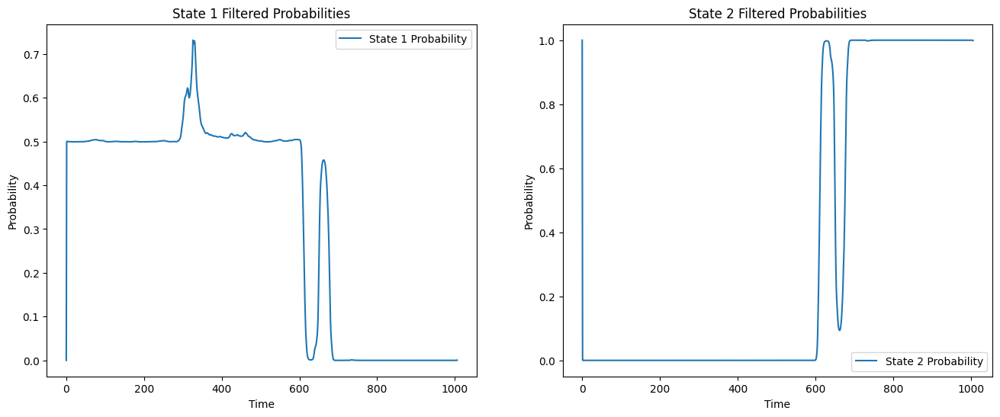

Iteration 16: Max Diff = 16.440807548292433
mu_hat0: [3.88497094 4.44853237 3.88736038]
mu_hat1: [3.88167703 4.46331207 3.91766104]
sigma_hat0: [0.29559783 0.16401453 0.29222639]
sigma_hat1: [0.31856916 0.15832193 0.26782015]
P_hat0: [[0.82234149 0.00182035 0.17583816]
 [0.00140827 0.99718361 0.00140812]
 [0.17645565 0.00182453 0.82171982]]
P_hat1: [[0.82630711 0.00295868 0.1707342 ]
 [0.00258846 0.99484698 0.00256456]
 [0.18017704 0.0030599  0.81676307]]


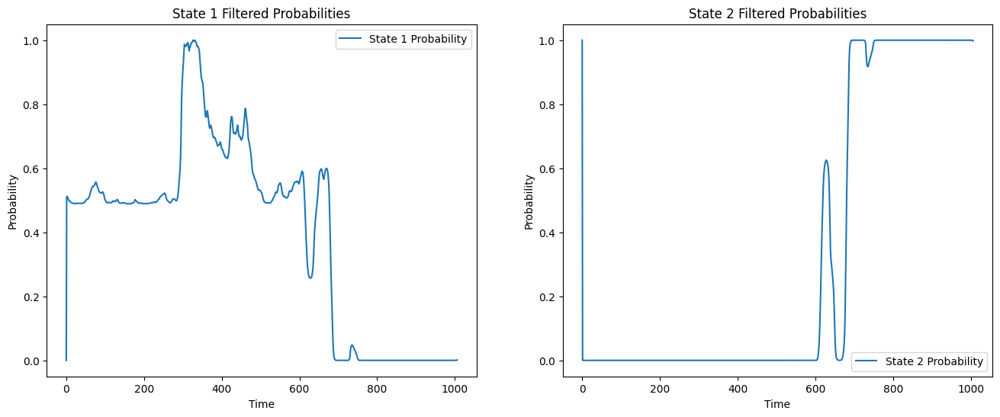

Iteration 17: Max Diff = 41.17270779627686
mu_hat0: [3.88167703 4.46331207 3.91766104]
mu_hat1: [3.85717535 4.48054661 4.00120874]
sigma_hat0: [0.31856916 0.15832193 0.26782015]
sigma_hat1: [0.34950861 0.15297887 0.16785635]
P_hat0: [[0.82630711 0.00295868 0.1707342 ]
 [0.00258846 0.99484698 0.00256456]
 [0.18017704 0.0030599  0.81676307]]
P_hat1: [[0.86348443 0.00252896 0.13398662]
 [0.00271851 0.99493961 0.00234188]
 [0.19763061 0.00269295 0.79967645]]


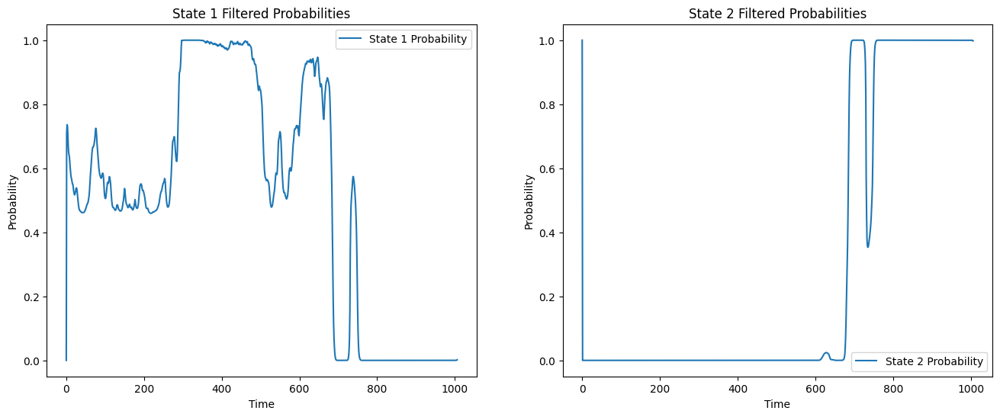

Iteration 18: Max Diff = 51.53529988727244
mu_hat0: [3.85717535 4.48054661 4.00120874]
mu_hat1: [3.88525351 4.50023486 4.05163183]
sigma_hat0: [0.34950861 0.15297887 0.16785635]
sigma_hat1: [0.33768345 0.1448858  0.08790553]
P_hat0: [[0.86348443 0.00252896 0.13398662]
 [0.00271851 0.99493961 0.00234188]
 [0.19763061 0.00269295 0.79967645]]
P_hat1: [[0.92289443 0.00283074 0.07427483]
 [0.00395748 0.9946023  0.00144022]
 [0.19960143 0.00132903 0.79906953]]


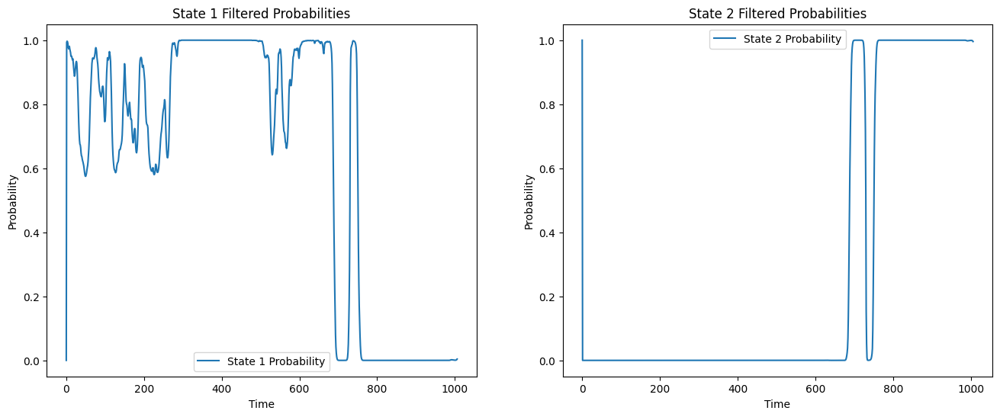

Iteration 19: Max Diff = 99.69100907507331
mu_hat0: [3.88525351 4.50023486 4.05163183]
mu_hat1: [3.92326103 4.5118374  4.06067084]
sigma_hat0: [0.33768345 0.1448858  0.08790553]
sigma_hat1: [0.31608443 0.13877397 0.0488525 ]
P_hat0: [[0.92289443 0.00283074 0.07427483]
 [0.00395748 0.9946023  0.00144022]
 [0.19960143 0.00132903 0.79906953]]
P_hat1: [[9.70188290e-01 3.16220277e-03 2.66495070e-02]
 [6.71296102e-03 9.93219587e-01 6.74524384e-05]
 [2.20451559e-01 5.01759683e-05 7.79498265e-01]]


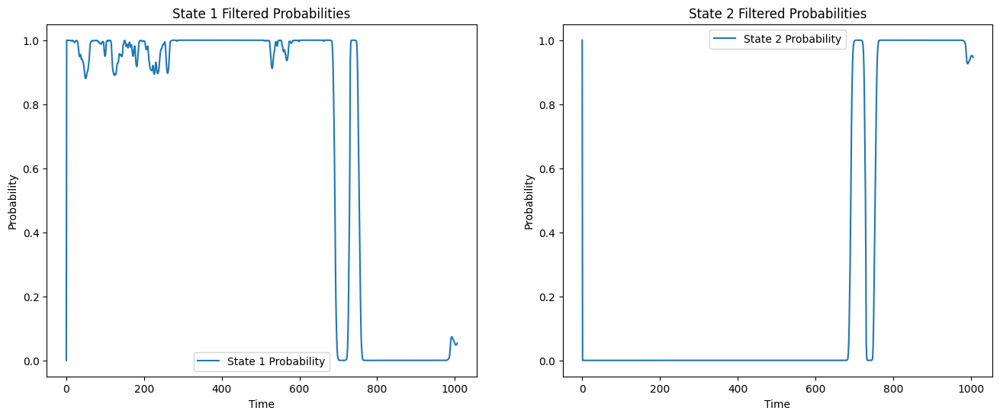

Iteration 20: Max Diff = 1575.343986227394
mu_hat0: [3.92326103 4.5118374  4.06067084]
mu_hat1: [3.94031717 4.5168002  4.06131798]
sigma_hat0: [0.31608443 0.13877397 0.0488525 ]
sigma_hat1: [0.30511418 0.13711049 0.03108412]
P_hat0: [[9.70188290e-01 3.16220277e-03 2.66495070e-02]
 [6.71296102e-03 9.93219587e-01 6.74524384e-05]
 [2.20451559e-01 5.01759683e-05 7.79498265e-01]]
P_hat1: [[9.91895344e-01 2.88806315e-03 5.21659304e-03]
 [7.24388384e-03 9.92756094e-01 2.23320258e-08]
 [3.16502987e-01 9.14247794e-09 6.83497004e-01]]


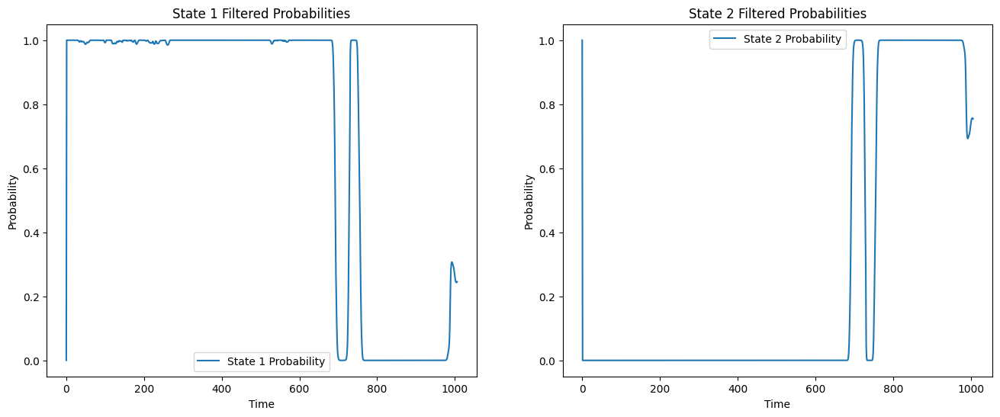

Iteration 21: Max Diff = 3363.098225690561
mu_hat0: [3.94031717 4.5168002  4.06131798]
mu_hat1: [3.9458714  4.52128013 4.06143407]
sigma_hat0: [0.30511418 0.13711049 0.03108412]
sigma_hat1: [0.30419427 0.13562763 0.02329577]
P_hat0: [[9.91895344e-01 2.88806315e-03 5.21659304e-03]
 [7.24388384e-03 9.92756094e-01 2.23320258e-08]
 [3.16502987e-01 9.14247794e-09 6.83497004e-01]]
P_hat1: [[9.96444885e-01 2.87960349e-03 6.75511975e-04]
 [8.25447983e-03 9.91745520e-01 1.36971689e-13]
 [4.79113135e-01 5.96999712e-13 5.20886865e-01]]


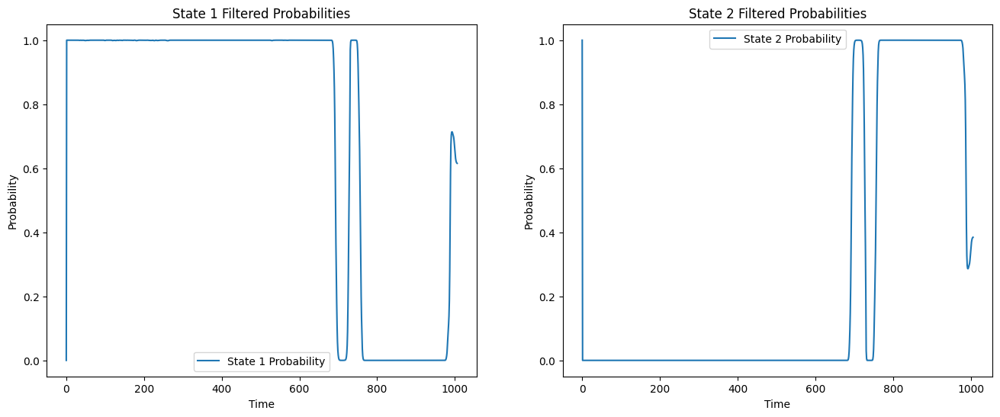

Iteration 22: Max Diff = 3297.3289393743776
mu_hat0: [3.9458714  4.52128013 4.06143407]
mu_hat1: [3.95152058 4.52830665 4.06152309]
sigma_hat0: [0.30419427 0.13562763 0.02329577]
sigma_hat1: [0.30539329 0.13303125 0.01943162]
P_hat0: [[9.96444885e-01 2.87960349e-03 6.75511975e-04]
 [8.25447983e-03 9.91745520e-01 1.36971689e-13]
 [4.79113135e-01 5.96999712e-13 5.20886865e-01]]
P_hat1: [[9.97040935e-01 2.88347677e-03 7.55882429e-05]
 [1.00439847e-02 9.89956015e-01 5.35566571e-19]
 [6.41590153e-01 2.88022463e-17 3.58409847e-01]]


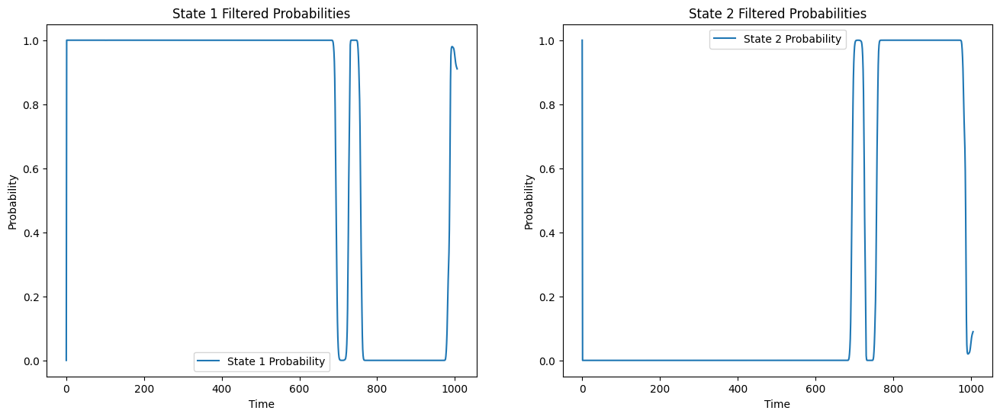

Iteration 23: Max Diff = 2618.512444003431
mu_hat0: [3.95152058 4.52830665 4.06152309]
mu_hat1: [3.95705998 4.53567827 4.06153775]
sigma_hat0: [0.30539329 0.13303125 0.01943162]
sigma_hat1: [0.30675776 0.13018546 0.01739124]
P_hat0: [[9.97040935e-01 2.88347677e-03 7.55882429e-05]
 [1.00439847e-02 9.89956015e-01 5.35566571e-19]
 [6.41590153e-01 2.88022463e-17 3.58409847e-01]]
P_hat1: [[9.97198056e-01 2.79411543e-03 7.82877248e-06]
 [1.14209526e-02 9.88579047e-01 1.35774073e-24]
 [7.70981687e-01 9.92964898e-22 2.29018313e-01]]


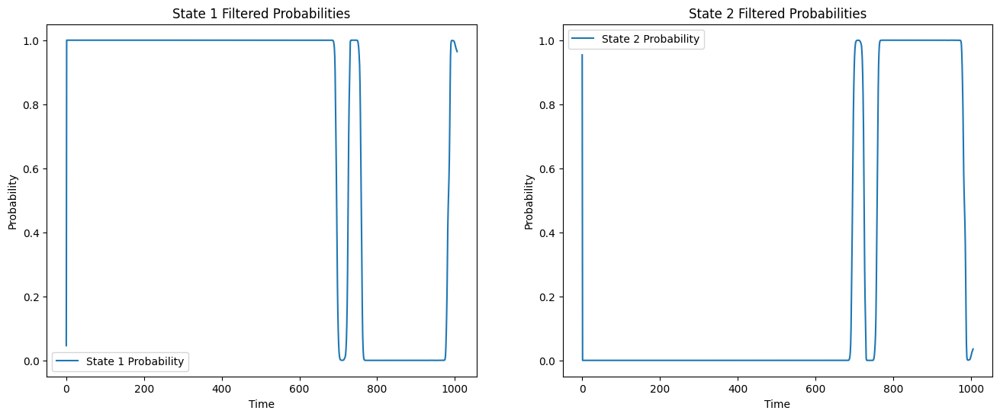

Iteration 24: Max Diff = 1807.2010680901528
mu_hat0: [3.95705998 4.53567827 4.06153775]
mu_hat1: [3.9605327  4.54025088 4.06151749]
sigma_hat0: [0.30675776 0.13018546 0.01739124]
sigma_hat1: [0.30770305 0.12835463 0.0162804 ]
P_hat0: [[9.97198056e-01 2.79411543e-03 7.82877248e-06]
 [1.14209526e-02 9.88579047e-01 1.35774073e-24]
 [7.70981687e-01 9.92964898e-22 2.29018313e-01]]
P_hat1: [[9.97278550e-01 2.72067562e-03 7.74093193e-07]
 [1.15968528e-02 9.88403147e-01 2.08388260e-30]
 [8.61085346e-01 2.26521665e-26 1.38914654e-01]]


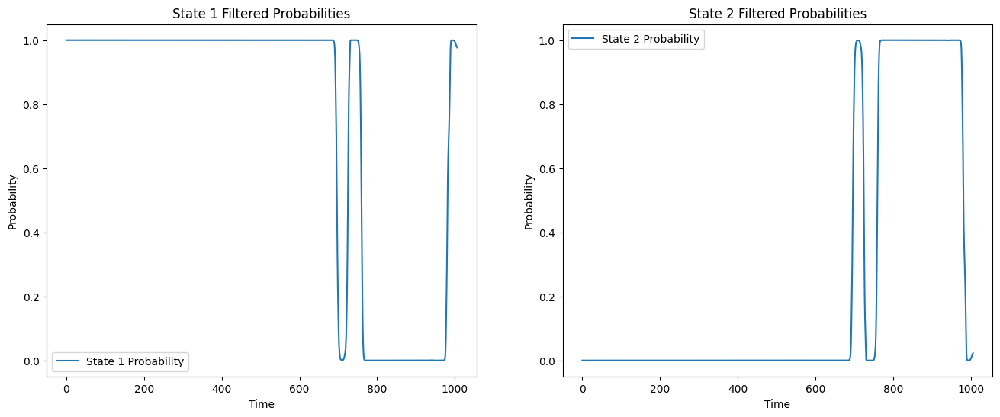

Iteration 25: Max Diff = 19077.59824336625
mu_hat0: [3.9605327  4.54025088 4.06151749]
mu_hat1: [3.96251512 4.54563532 4.06149034]
sigma_hat0: [0.30770305 0.12835463 0.0162804 ]
sigma_hat1: [0.30814631 0.12010486 0.01566229]
P_hat0: [[9.97278550e-01 2.72067562e-03 7.74093193e-07]
 [1.15968528e-02 9.88403147e-01 2.08388260e-30]
 [8.61085346e-01 2.26521665e-26 1.38914654e-01]]
P_hat1: [[9.97314074e-01 2.68585139e-03 7.44245534e-08]
 [8.01354971e-03 9.91986450e-01 2.28628797e-36]
 [9.18456195e-01 3.66337788e-31 8.15438054e-02]]


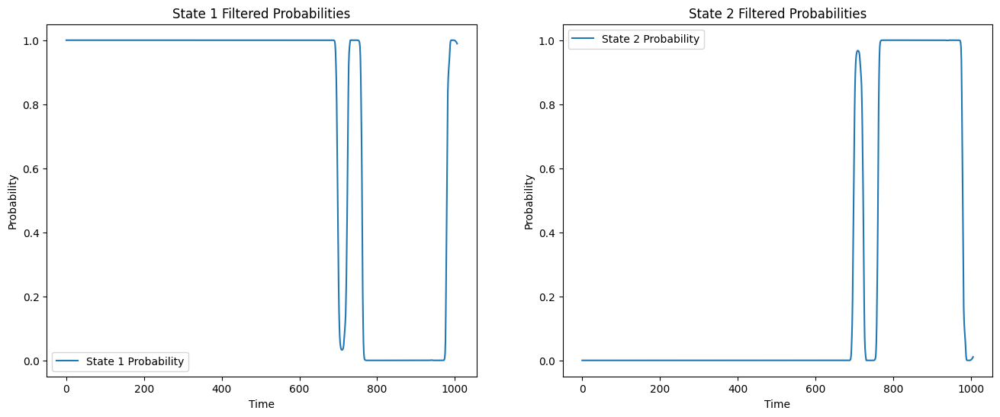

Iteration 26: Max Diff = 696.5771792732575
mu_hat0: [3.96251512 4.54563532 4.06149034]
mu_hat1: [3.96692283 4.55123492 4.061465  ]
sigma_hat0: [0.30814631 0.12010486 0.01566229]
sigma_hat1: [0.30946427 0.11796201 0.01531079]
P_hat0: [[9.97314074e-01 2.68585139e-03 7.44245534e-08]
 [8.01354971e-03 9.91986450e-01 2.28628797e-36]
 [9.18456195e-01 3.66337788e-31 8.15438054e-02]]
P_hat1: [[9.97399281e-01 2.60071187e-03 6.99161192e-09]
 [8.15171527e-03 9.91848285e-01 8.72028203e-43]
 [9.53061681e-01 1.33806859e-36 4.69383189e-02]]


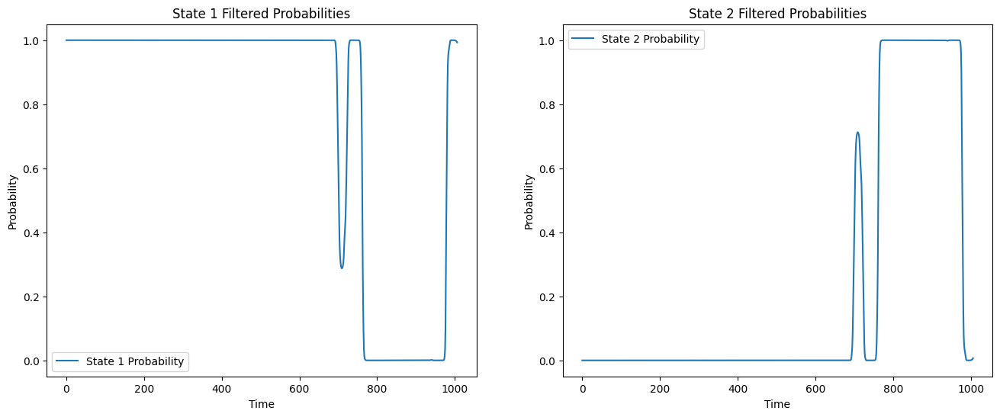

Iteration 27: Max Diff = 428.25931095485146
mu_hat0: [3.96692283 4.55123492 4.061465  ]
mu_hat1: [3.97250078 4.5577495  4.06143345]
sigma_hat0: [0.30946427 0.11796201 0.01531079]
sigma_hat1: [0.31132702 0.11599899 0.01510734]
P_hat0: [[9.97399281e-01 2.60071187e-03 6.99161192e-09]
 [8.15171527e-03 9.91848285e-01 8.72028203e-43]
 [9.53061681e-01 1.33806859e-36 4.69383189e-02]]
P_hat1: [[9.97759292e-01 2.24070738e-03 6.40905104e-10]
 [7.43122943e-03 9.92568771e-01 2.09947952e-49]
 [9.73394150e-01 3.06101129e-42 2.66058500e-02]]


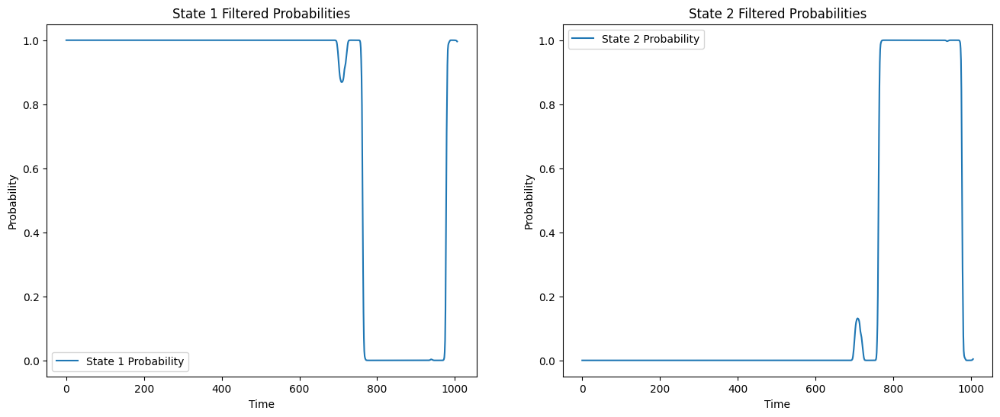

Iteration 28: Max Diff = 293.42964810943624
mu_hat0: [3.97250078 4.5577495  4.06143345]
mu_hat1: [3.98061041 4.56788008 4.06139162]
sigma_hat0: [0.31132702 0.11599899 0.01510734]
sigma_hat1: [0.3139944  0.11274035 0.01498826]
P_hat0: [[9.97759292e-01 2.24070738e-03 6.40905104e-10]
 [7.43122943e-03 9.92568771e-01 2.09947952e-49]
 [9.73394150e-01 3.06101129e-42 2.66058500e-02]]
P_hat1: [[9.98543483e-01 1.45651708e-03 5.70436414e-11]
 [5.25745019e-03 9.94742550e-01 2.80221711e-56]
 [9.85107662e-01 3.80828663e-48 1.48923378e-02]]


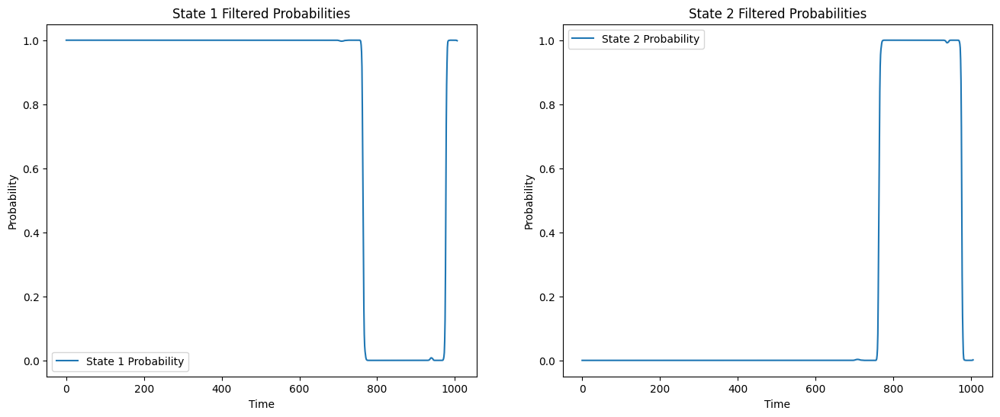

Iteration 29: Max Diff = 146.74821120012984
mu_hat0: [3.98061041 4.56788008 4.06139162]
mu_hat1: [3.98307555 4.57127814 4.06133222]
sigma_hat0: [0.3139944  0.11274035 0.01498826]
sigma_hat1: [0.31477028 0.11143148 0.01491934]
P_hat0: [[9.98543483e-01 1.45651708e-03 5.70436414e-11]
 [5.25745019e-03 9.94742550e-01 2.80221711e-56]
 [9.85107662e-01 3.80828663e-48 1.48923378e-02]]
P_hat1: [[9.98719768e-01 1.28023225e-03 4.98831811e-12]
 [4.75703906e-03 9.95242961e-01 1.03732824e-63]
 [9.91768377e-01 1.37696866e-54 8.23162323e-03]]


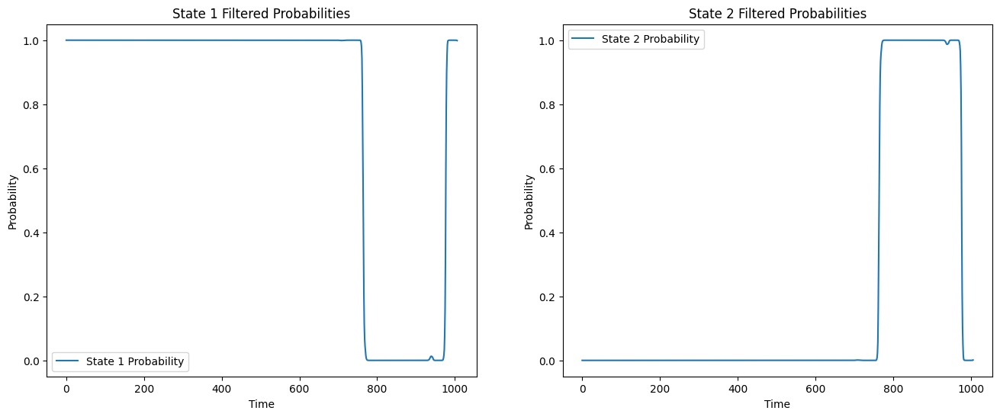

Iteration 30: Max Diff = 74.68862866940593
mu_hat0: [3.98307555 4.57127814 4.06133222]
mu_hat1: [3.98352144 4.57187353 4.06126958]
sigma_hat0: [0.31477028 0.11143148 0.01491934]
sigma_hat1: [0.31491693 0.11121263 0.01488082]
P_hat0: [[9.98719768e-01 1.28023225e-03 4.98831811e-12]
 [4.75703906e-03 9.95242961e-01 1.03732824e-63]
 [9.91768377e-01 1.37696866e-54 8.23162323e-03]]
P_hat1: [[9.98718722e-01 1.28127846e-03 4.34001340e-13]
 [4.78608475e-03 9.95213915e-01 2.39018193e-71]
 [9.95472716e-01 3.14864878e-61 4.52728369e-03]]


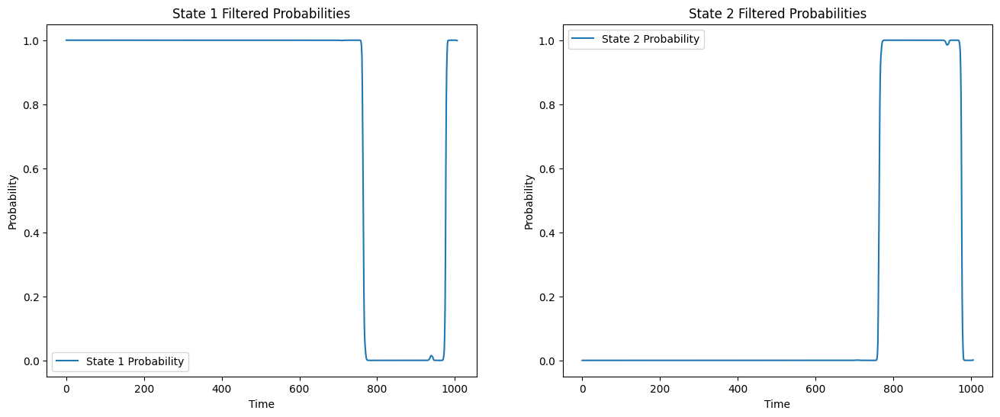

Iteration 31: Max Diff = 41.13029300131519
mu_hat0: [3.98352144 4.57187353 4.06126958]
mu_hat1: [3.98360492 4.57198337 4.06120765]
sigma_hat0: [0.31491693 0.11121263 0.01488082]
sigma_hat1: [0.31494479 0.11117339 0.0148613 ]
P_hat0: [[9.98718722e-01 1.28127846e-03 4.34001340e-13]
 [4.78608475e-03 9.95213915e-01 2.39018193e-71]
 [9.95472716e-01 3.14864878e-61 4.52728369e-03]]
P_hat1: [[9.98716762e-01 1.28323780e-03 3.77048658e-14]
 [4.79792835e-03 9.95202072e-01 5.17570596e-79]
 [9.97515428e-01 6.78403451e-68 2.48457198e-03]]


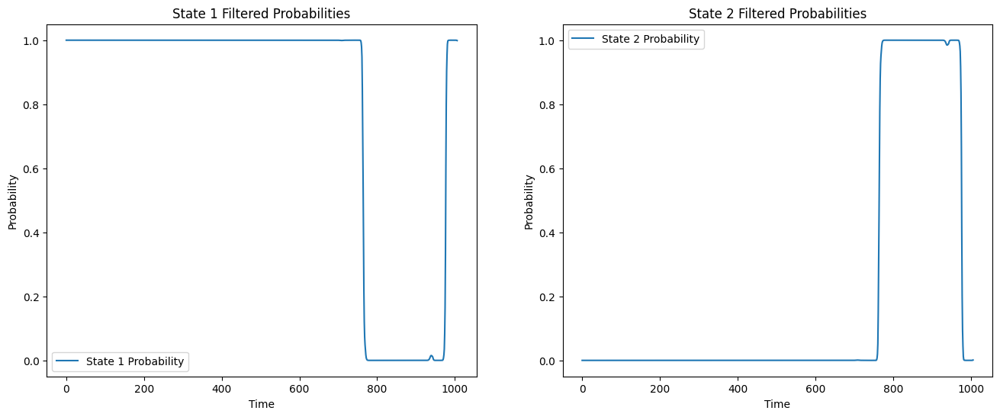

Iteration 32: Max Diff = 22.51730440866906
mu_hat0: [3.98360492 4.57198337 4.06120765]
mu_hat1: [3.98362069 4.57200411 4.06114624]
sigma_hat0: [0.31494479 0.11117339 0.0148613 ]
sigma_hat1: [0.31495006 0.11116598 0.01485425]
P_hat0: [[9.98716762e-01 1.28323780e-03 3.77048658e-14]
 [4.79792835e-03 9.95202072e-01 5.17570596e-79]
 [9.97515428e-01 6.78403451e-68 2.48457198e-03]]
P_hat1: [[9.98716296e-01 1.28370417e-03 3.27415183e-15]
 [4.80051956e-03 9.95199480e-01 1.10706106e-86]
 [9.98638236e-01 1.44425759e-74 1.36176434e-03]]


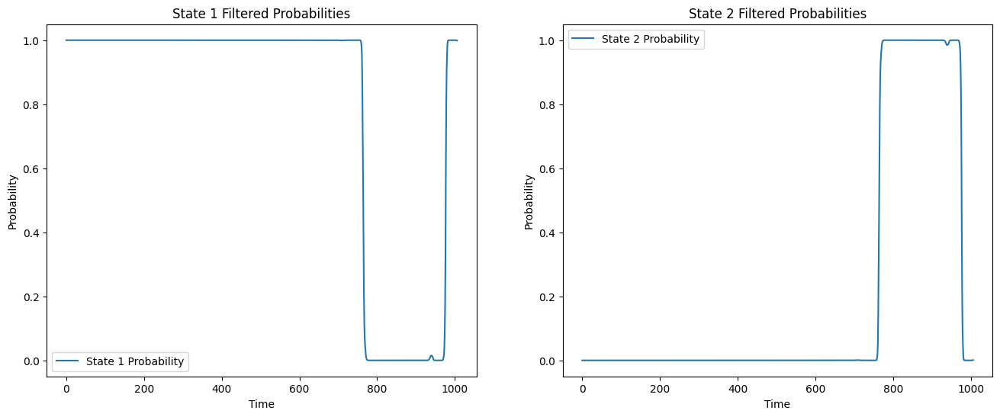

Iteration 33: Max Diff = 12.333327244242362
mu_hat0: [3.98362069 4.57200411 4.06114624]
mu_hat1: [3.98362369 4.57200806 4.06108451]
sigma_hat0: [0.31495006 0.11116598 0.01485425]
sigma_hat1: [0.31495106 0.11116456 0.01485592]
P_hat0: [[9.98716296e-01 1.28370417e-03 3.27415183e-15]
 [4.80051956e-03 9.95199480e-01 1.10706106e-86]
 [9.98638236e-01 1.44425759e-74 1.36176434e-03]]
P_hat1: [[9.98716202e-01 1.28379761e-03 2.84324426e-16]
 [4.80102981e-03 9.95198970e-01 2.35811694e-94]
 [9.99254298e-01 3.06134527e-81 7.45701672e-04]]


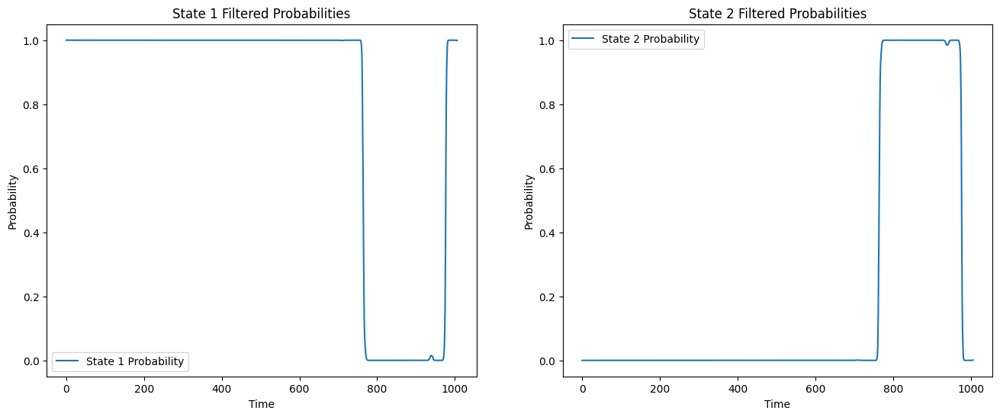

Iteration 34: Max Diff = 6.754754003874652
mu_hat0: [3.98362369 4.57200806 4.06108451]
mu_hat1: [3.98362427 4.57200881 4.06102163]
sigma_hat0: [0.31495106 0.11116456 0.01485592]
sigma_hat1: [0.31495125 0.1111643  0.01486411]
P_hat0: [[9.98716202e-01 1.28379761e-03 2.84324426e-16]
 [4.80102981e-03 9.95198970e-01 2.35811694e-94]
 [9.99254298e-01 3.06134527e-81 7.45701672e-04]]
P_hat1: [[9.98716184e-001 1.28381563e-003 2.47004953e-017]
 [4.80112783e-003 9.95198872e-001 5.01105882e-102]
 [9.99591920e-001 6.47090386e-088 4.08080017e-004]]


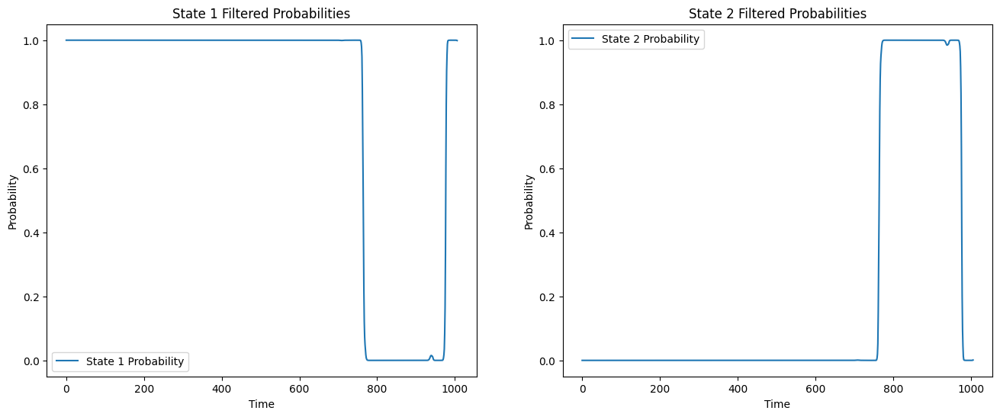

Iteration 35: Max Diff = 3.6978634183639314
mu_hat0: [3.98362427 4.57200881 4.06102163]
mu_hat1: [3.98362437 4.57200895 4.06095681]
sigma_hat0: [0.31495125 0.1111643  0.01486411]
sigma_hat1: [0.31495129 0.11116424 0.01487751]
P_hat0: [[9.98716184e-001 1.28381563e-003 2.47004953e-017]
 [4.80112783e-003 9.95198872e-001 5.01105882e-102]
 [9.99591920e-001 6.47090386e-088 4.08080017e-004]]
P_hat1: [[9.98716181e-001 1.28381908e-003 2.14739060e-018]
 [4.80114656e-003 9.95198853e-001 1.06297649e-109]
 [9.99776791e-001 1.36447130e-094 2.23209014e-004]]


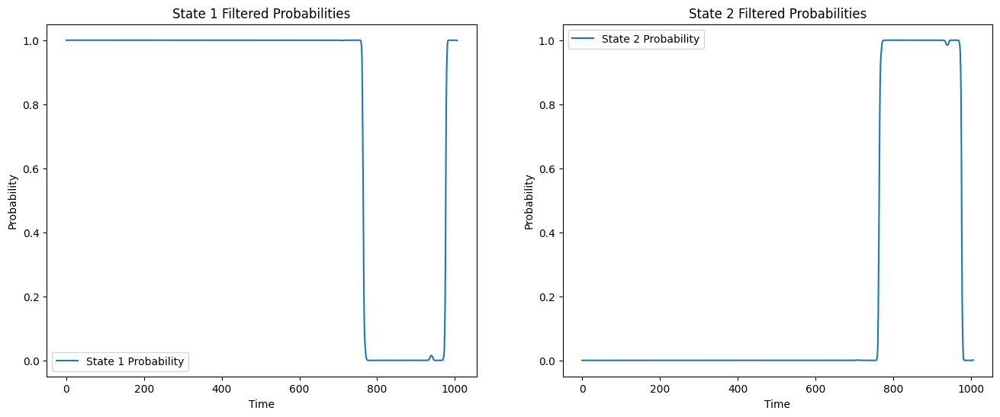

Iteration 36: Max Diff = 2.023402577298253
mu_hat0: [3.98362437 4.57200895 4.06095681]
mu_hat1: [3.9836244  4.57200898 4.06088934]
sigma_hat0: [0.31495129 0.11116424 0.01487751]
sigma_hat1: [0.31495129 0.11116423 0.01489531]
P_hat0: [[9.98716181e-001 1.28381908e-003 2.14739060e-018]
 [4.80114656e-003 9.95198853e-001 1.06297649e-109]
 [9.99776791e-001 1.36447130e-094 2.23209014e-004]]
P_hat1: [[9.98716180e-001 1.28381973e-003 1.86875960e-019]
 [4.80115013e-003 9.95198850e-001 2.25157322e-117]
 [9.99877957e-001 2.87044266e-101 1.22043114e-004]]


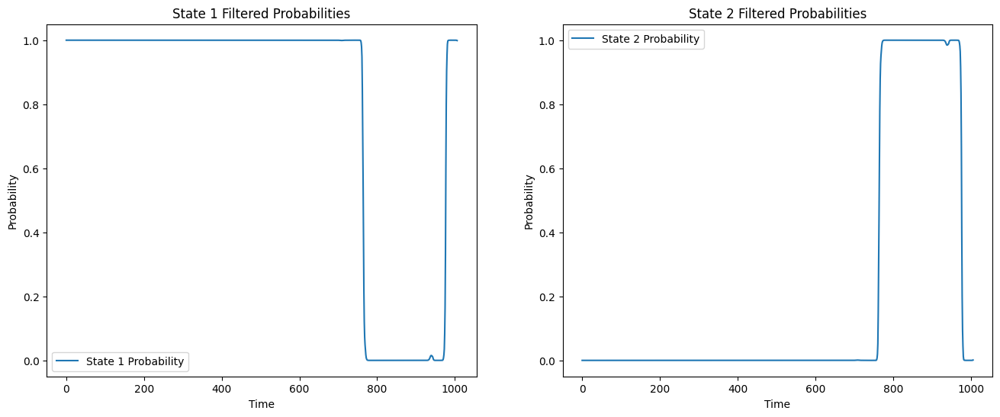

Iteration 37: Max Diff = 1.1066926163358652
mu_hat0: [3.9836244  4.57200898 4.06088934]
mu_hat1: [3.9836244  4.57200898 4.06081856]
sigma_hat0: [0.31495129 0.11116423 0.01489531]
sigma_hat1: [0.3149513  0.11116423 0.01491702]
P_hat0: [[9.98716180e-001 1.28381973e-003 1.86875960e-019]
 [4.80115013e-003 9.95198850e-001 2.25157322e-117]
 [9.99877957e-001 2.87044266e-101 1.22043114e-004]]
P_hat1: [[9.98716180e-001 1.28381986e-003 1.62834248e-020]
 [4.80115081e-003 9.95198849e-001 4.76334852e-125]
 [9.99933291e-001 6.02440192e-108 6.67092898e-005]]


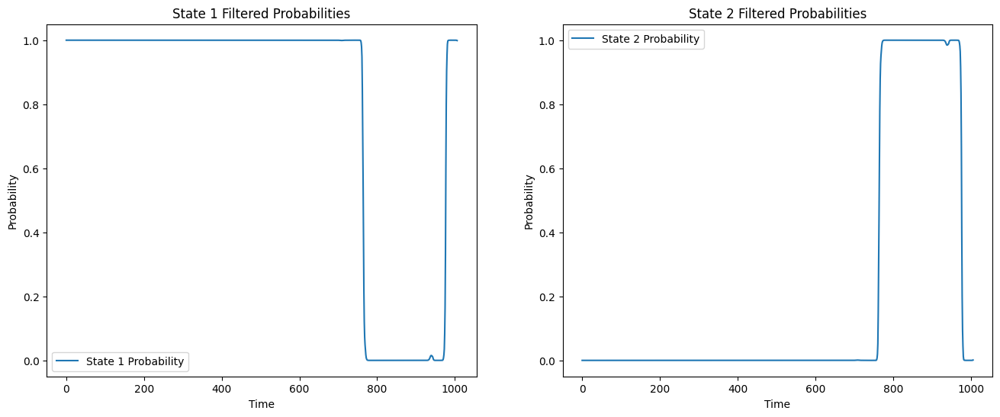

Iteration 38: Max Diff = 0.6050860019426065
mu_hat0: [3.9836244  4.57200898 4.06081856]
mu_hat1: [3.9836244  4.57200899 4.06074385]
sigma_hat0: [0.3149513  0.11116423 0.01491702]
sigma_hat1: [0.3149513  0.11116423 0.0149423 ]
P_hat0: [[9.98716180e-001 1.28381986e-003 1.62834248e-020]
 [4.80115081e-003 9.95198849e-001 4.76334852e-125]
 [9.99933291e-001 6.02440192e-108 6.67092898e-005]]
P_hat1: [[9.98716180e-001 1.28381988e-003 1.42099803e-021]
 [4.80115094e-003 9.95198849e-001 1.00663867e-132]
 [9.99963545e-001 1.26134202e-114 3.64551435e-005]]


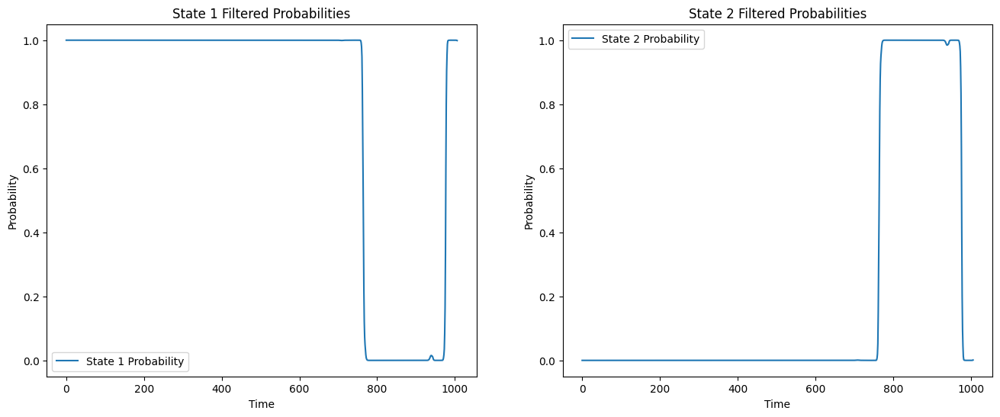

Iteration 39: Max Diff = 0.33073682713827623
mu_hat0: [3.9836244  4.57200899 4.06074385]
mu_hat1: [3.9836244  4.57200899 4.06066464]
sigma_hat0: [0.3149513  0.11116423 0.0149423 ]
sigma_hat1: [0.3149513  0.11116423 0.01497095]
P_hat0: [[9.98716180e-001 1.28381988e-003 1.42099803e-021]
 [4.80115094e-003 9.95198849e-001 1.00663867e-132]
 [9.99963545e-001 1.26134202e-114 3.64551435e-005]]
P_hat1: [[9.98716180e-001 1.28381989e-003 1.24221428e-022]
 [4.80115096e-003 9.95198849e-001 2.12530946e-140]
 [9.99980082e-001 2.63428885e-121 1.99183315e-005]]


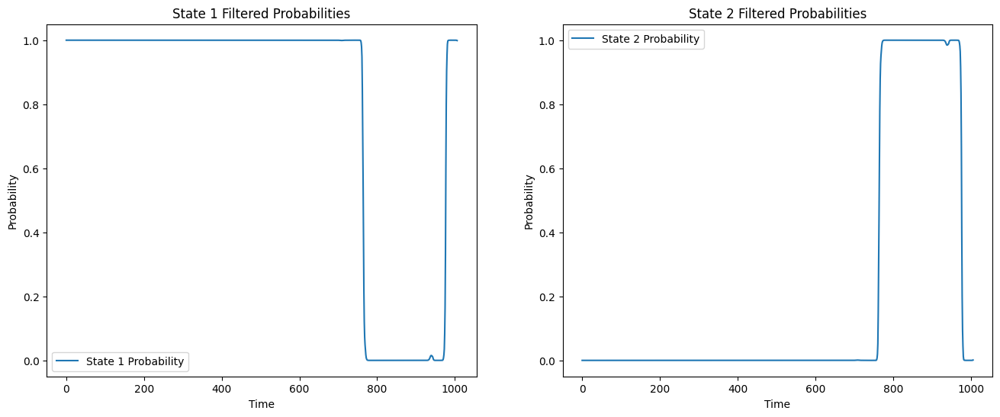

Iteration 40: Max Diff = 0.1807377346647514
mu_hat0: [3.9836244  4.57200899 4.06066464]
mu_hat1: [3.9836244  4.57200899 4.06058036]
sigma_hat0: [0.3149513  0.11116423 0.01497095]
sigma_hat1: [0.3149513  0.11116423 0.01500281]
P_hat0: [[9.98716180e-001 1.28381989e-003 1.24221428e-022]
 [4.80115096e-003 9.95198849e-001 2.12530946e-140]
 [9.99980082e-001 2.63428885e-121 1.99183315e-005]]
P_hat1: [[9.98716180e-001 1.28381989e-003 1.08805431e-023]
 [4.80115097e-003 9.95198849e-001 4.48326575e-148]
 [9.99989119e-001 5.48719999e-128 1.08814503e-005]]


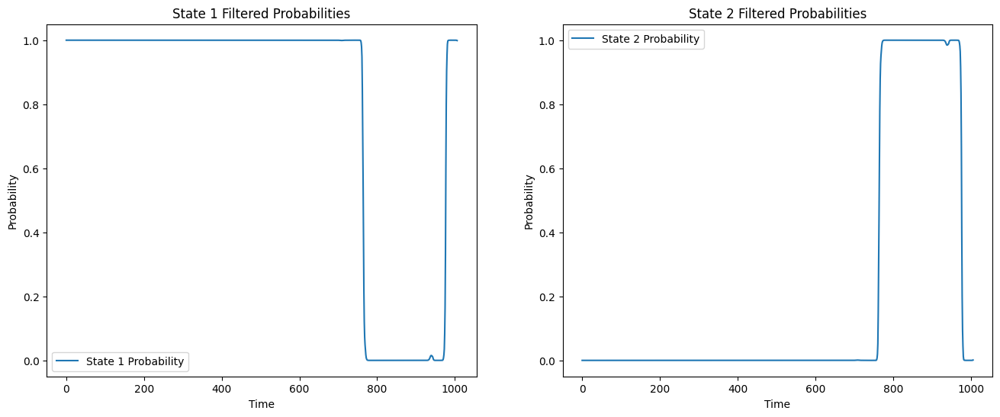

Iteration 41: Max Diff = 0.09874999531440797
mu_hat0: [3.9836244  4.57200899 4.06058036]
mu_hat1: [3.9836244  4.57200899 4.06049048]
sigma_hat0: [0.3149513  0.11116423 0.01500281]
sigma_hat1: [0.3149513  0.11116423 0.01503779]
P_hat0: [[9.98716180e-001 1.28381989e-003 1.08805431e-023]
 [4.80115097e-003 9.95198849e-001 4.48326575e-148]
 [9.99989119e-001 5.48719999e-128 1.08814503e-005]]
P_hat1: [[9.98716180e-001 1.28381989e-003 9.55098360e-025]
 [4.80115097e-003 9.95198849e-001 9.44958631e-156]
 [9.99994056e-001 1.13980222e-134 5.94395163e-006]]


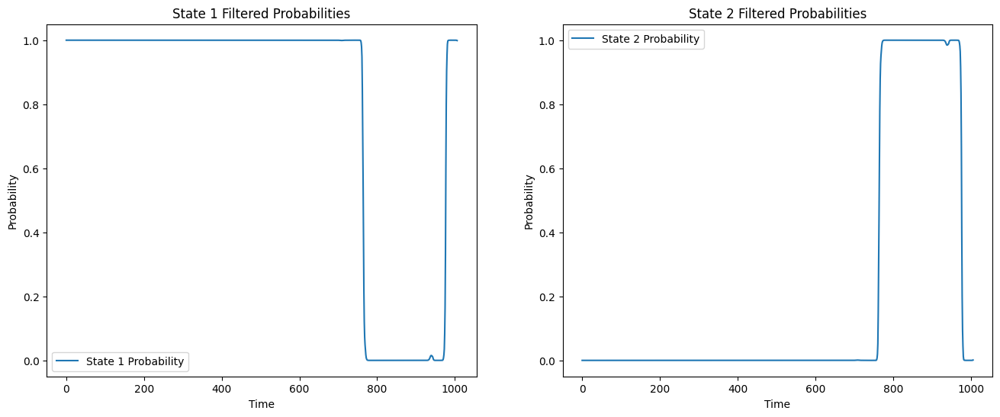

Iteration 42: Max Diff = 0.053946696516115764
mu_hat0: [3.9836244  4.57200899 4.06049048]
mu_hat1: [3.9836244  4.57200899 4.06039449]
sigma_hat0: [0.3149513  0.11116423 0.01503779]
sigma_hat1: [0.3149513  0.11116423 0.01507579]
P_hat0: [[9.98716180e-001 1.28381989e-003 9.55098360e-025]
 [4.80115097e-003 9.95198849e-001 9.44958631e-156]
 [9.99994056e-001 1.13980222e-134 5.94395163e-006]]
P_hat1: [[9.98716180e-001 1.28381989e-003 8.40386216e-026]
 [4.80115097e-003 9.95198849e-001 1.99015287e-163]
 [9.99996753e-001 2.36060966e-141 3.24661700e-006]]


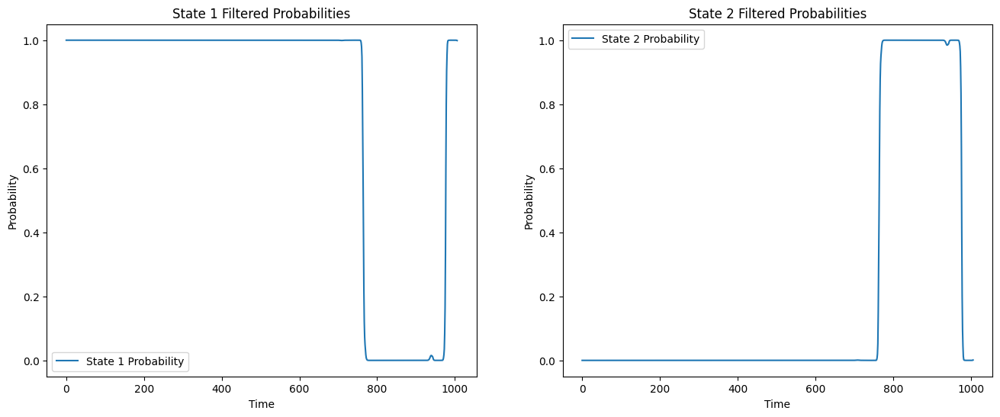

Iteration 43: Max Diff = 0.029467742074498315
mu_hat0: [3.9836244  4.57200899 4.06039449]
mu_hat1: [3.9836244  4.57200899 4.06029189]
sigma_hat0: [0.3149513  0.11116423 0.01507579]
sigma_hat1: [0.3149513  0.11116423 0.01511676]
P_hat0: [[9.98716180e-001 1.28381989e-003 8.40386216e-026]
 [4.80115097e-003 9.95198849e-001 1.99015287e-163]
 [9.99996753e-001 2.36060966e-141 3.24661700e-006]]
P_hat1: [[9.98716180e-001 1.28381989e-003 7.41362529e-027]
 [4.80115097e-003 9.95198849e-001 4.18805713e-171]
 [9.99998227e-001 4.87360537e-148 1.77322994e-006]]


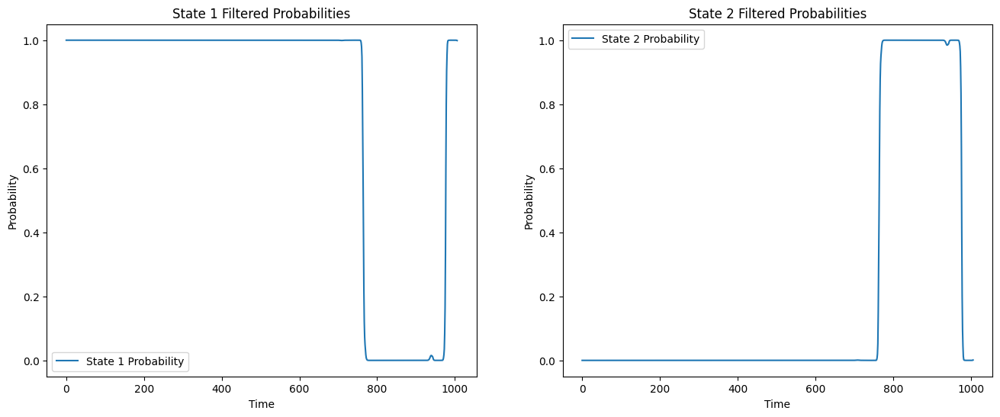

Iteration 44: Max Diff = 0.016095170716986053
mu_hat0: [3.9836244  4.57200899 4.06029189]
mu_hat1: [3.9836244  4.57200899 4.0601822 ]
sigma_hat0: [0.3149513  0.11116423 0.01511676]
sigma_hat1: [0.3149513  0.11116423 0.01516063]
P_hat0: [[9.98716180e-001 1.28381989e-003 7.41362529e-027]
 [4.80115097e-003 9.95198849e-001 4.18805713e-171]
 [9.99998227e-001 4.87360537e-148 1.77322994e-006]]
P_hat1: [[9.98716180e-001 1.28381989e-003 6.55826136e-028]
 [4.80115097e-003 9.95198849e-001 8.80596238e-179]
 [9.99999032e-001 1.00280137e-154 9.68471411e-007]]


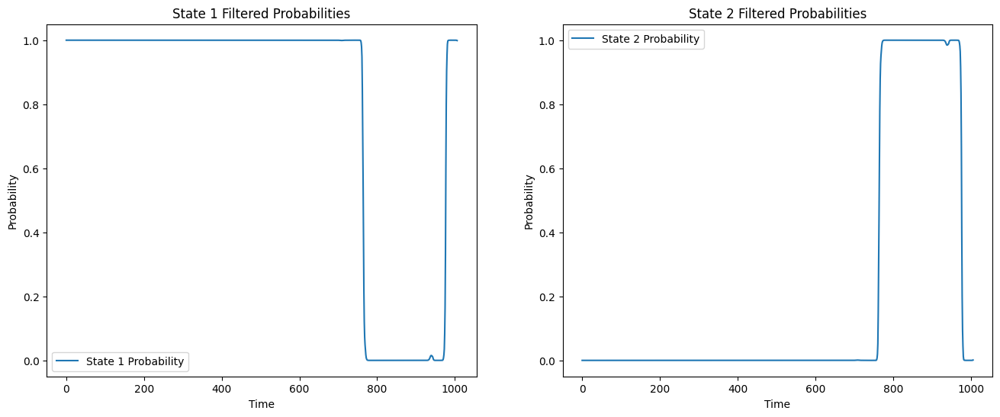

Iteration 45: Max Diff = 0.008790666497919519
mu_hat0: [3.9836244  4.57200899 4.0601822 ]
mu_hat1: [3.9836244  4.57200899 4.06006498]
sigma_hat0: [0.3149513  0.11116423 0.01516063]
sigma_hat1: [0.3149513  0.11116423 0.01520731]
P_hat0: [[9.98716180e-001 1.28381989e-003 6.55826136e-028]
 [4.80115097e-003 9.95198849e-001 8.80596238e-179]
 [9.99999032e-001 1.00280137e-154 9.68471411e-007]]
P_hat1: [[9.98716180e-001 1.28381989e-003 5.81884108e-029]
 [4.80115097e-003 9.95198849e-001 1.84992135e-186]
 [9.99999471e-001 2.05596847e-161 5.28938087e-007]]
Converged:
{   'P_hat': '[[0.9987 0.0013 0.    ]\n'
             ' [0.0048 0.9952 0.    ]\n'
             ' [1.     0.     0.    ]]',
    'mu_hat': '[3.9836 4.572  4.0601]',
    'pi_hat': '[1. 0. 0.]',
    'sigma_hat': '[0.315  0.1112 0.0152]'}

Analyzing model with 4 states:


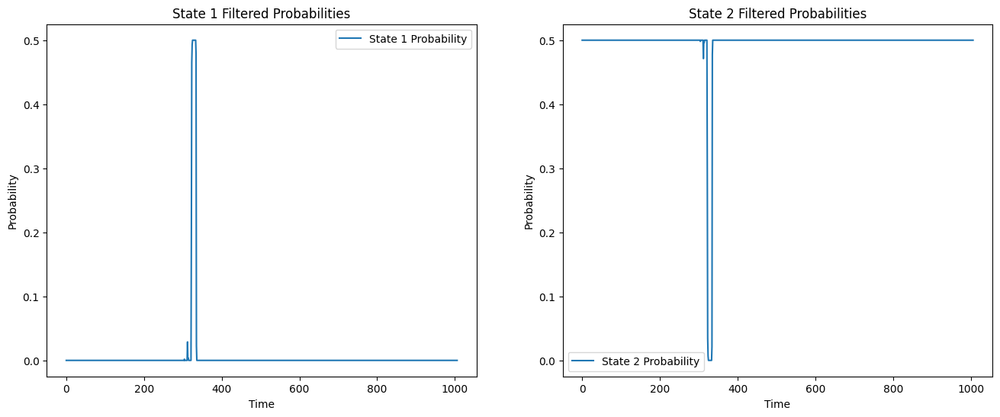

Iteration 0: Max Diff = 12.462607400865728
mu_hat0: [2 4 2 4]
mu_hat1: [2.76936975 4.12421826 2.76936975 4.12421826]
sigma_hat0: [0.1 0.1 0.1 0.1]
sigma_hat1: [0.21498867 0.34205869 0.21498867 0.34205869]
P_hat0: [[0.7 0.1 0.1 0.1]
 [0.1 0.7 0.1 0.1]
 [0.1 0.1 0.7 0.1]
 [0.1 0.1 0.1 0.7]]
P_hat1: [[7.98842692e-01 4.35184615e-02 1.14120385e-01 4.35184615e-02]
 [5.43163381e-04 8.74049464e-01 5.43163381e-04 1.24864209e-01]
 [1.14120385e-01 4.35184615e-02 7.98842692e-01 4.35184615e-02]
 [5.43163381e-04 1.24864209e-01 5.43163381e-04 8.74049464e-01]]


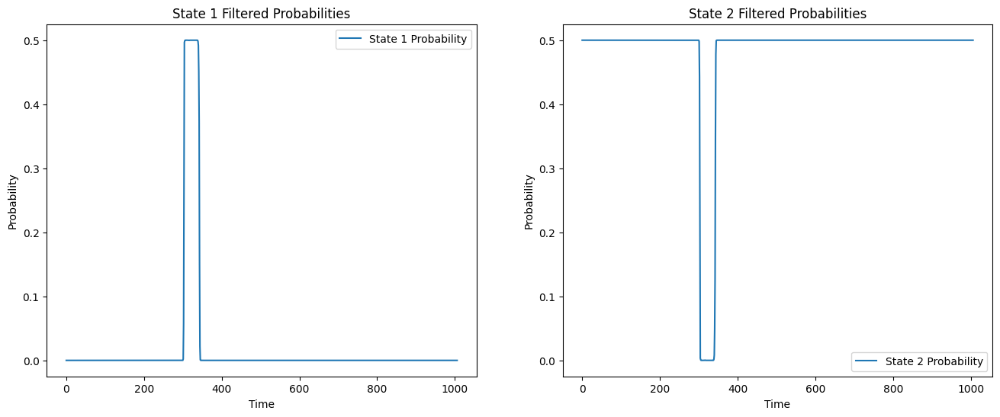

Iteration 1: Max Diff = 384.4300649002978
mu_hat0: [2.76936975 4.12421826 2.76936975 4.12421826]
mu_hat1: [3.03385777 4.15149963 3.03385777 4.15149963]
sigma_hat0: [0.21498867 0.34205869 0.21498867 0.34205869]
sigma_hat1: [0.22895851 0.30470357 0.22895851 0.30470357]
P_hat0: [[7.98842692e-01 4.35184615e-02 1.14120385e-01 4.35184615e-02]
 [5.43163381e-04 8.74049464e-01 5.43163381e-04 1.24864209e-01]
 [1.14120385e-01 4.35184615e-02 7.98842692e-01 4.35184615e-02]
 [5.43163381e-04 1.24864209e-01 5.43163381e-04 8.74049464e-01]]
P_hat1: [[8.52884926e-01 1.26371852e-02 1.21840704e-01 1.26371852e-02]
 [5.18022105e-04 8.74093461e-01 5.18022105e-04 1.24870494e-01]
 [1.21840704e-01 1.26371852e-02 8.52884926e-01 1.26371852e-02]
 [5.18022105e-04 1.24870494e-01 5.18022105e-04 8.74093461e-01]]


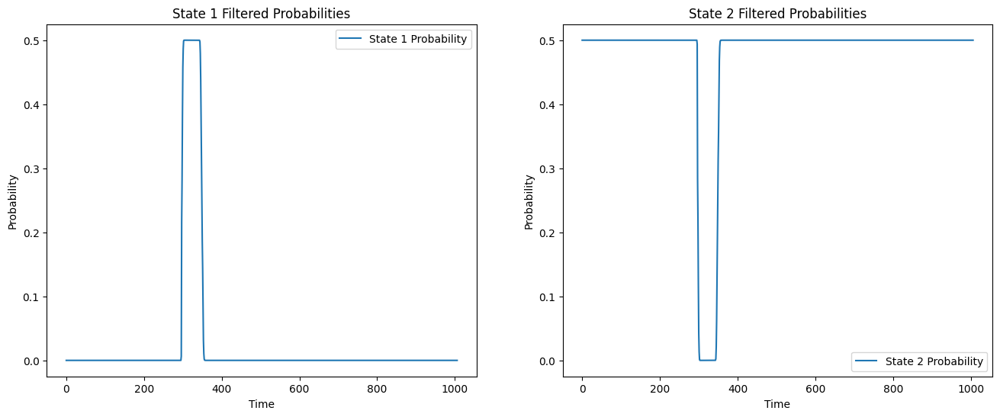

Iteration 2: Max Diff = 37.31096614617825
mu_hat0: [3.03385777 4.15149963 3.03385777 4.15149963]
mu_hat1: [3.12667116 4.16013694 3.12667116 4.16013694]
sigma_hat0: [0.22895851 0.30470357 0.22895851 0.30470357]
sigma_hat1: [0.26700454 0.29613828 0.26700454 0.29613828]
P_hat0: [[8.52884926e-01 1.26371852e-02 1.21840704e-01 1.26371852e-02]
 [5.18022105e-04 8.74093461e-01 5.18022105e-04 1.24870494e-01]
 [1.21840704e-01 1.26371852e-02 8.52884926e-01 1.26371852e-02]
 [5.18022105e-04 1.24870494e-01 5.18022105e-04 8.74093461e-01]]
P_hat1: [[8.57918582e-01 9.76081005e-03 1.22559797e-01 9.76081005e-03]
 [5.24022150e-04 8.74082961e-01 5.24022150e-04 1.24868994e-01]
 [1.22559797e-01 9.76081005e-03 8.57918582e-01 9.76081005e-03]
 [5.24022150e-04 1.24868994e-01 5.24022150e-04 8.74082961e-01]]


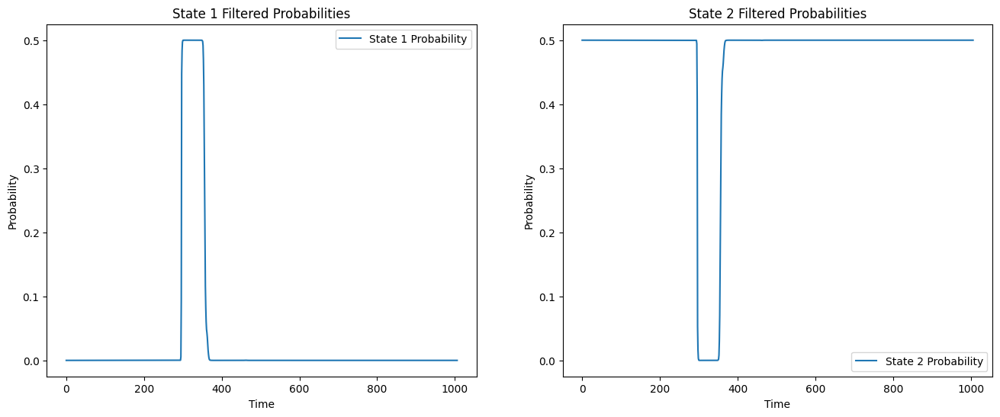

Iteration 3: Max Diff = 18.686395813813895
mu_hat0: [3.12667116 4.16013694 3.12667116 4.16013694]
mu_hat1: [3.19124493 4.16596001 3.19124493 4.16596001]
sigma_hat0: [0.26700454 0.29613828 0.26700454 0.29613828]
sigma_hat1: [0.29088776 0.29145096 0.29088776 0.29145096]
P_hat0: [[8.57918582e-01 9.76081005e-03 1.22559797e-01 9.76081005e-03]
 [5.24022150e-04 8.74082961e-01 5.24022150e-04 1.24868994e-01]
 [1.22559797e-01 9.76081005e-03 8.57918582e-01 9.76081005e-03]
 [5.24022150e-04 1.24868994e-01 5.24022150e-04 8.74082961e-01]]
P_hat1: [[8.60458168e-01 8.30961810e-03 1.22922595e-01 8.30961810e-03]
 [5.30420812e-04 8.74071764e-01 5.30420812e-04 1.24867395e-01]
 [1.22922595e-01 8.30961810e-03 8.60458168e-01 8.30961810e-03]
 [5.30420812e-04 1.24867395e-01 5.30420812e-04 8.74071764e-01]]


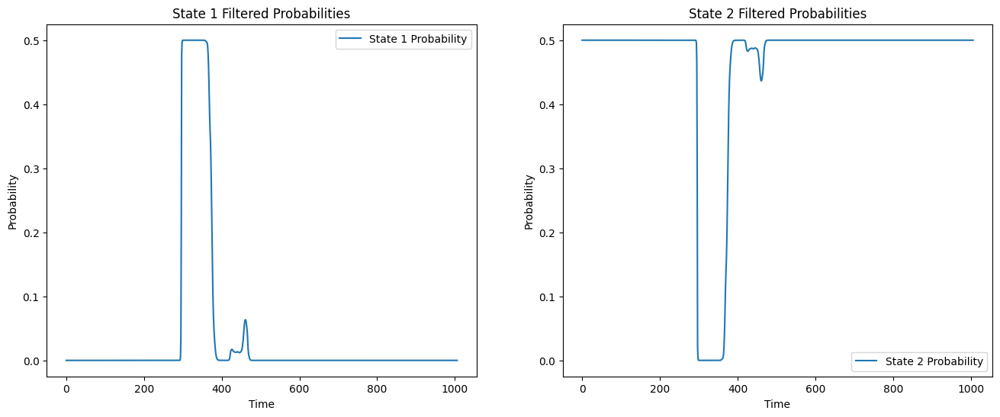

Iteration 4: Max Diff = 14.710922135569735
mu_hat0: [3.19124493 4.16596001 3.19124493 4.16596001]
mu_hat1: [3.30365368 4.17673269 3.30365368 4.17673269]
sigma_hat0: [0.29088776 0.29145096 0.29088776 0.29145096]
sigma_hat1: [0.32187127 0.28468208 0.32187127 0.28468208]
P_hat0: [[8.60458168e-01 8.30961810e-03 1.22922595e-01 8.30961810e-03]
 [5.30420812e-04 8.74071764e-01 5.30420812e-04 1.24867395e-01]
 [1.22922595e-01 8.30961810e-03 8.60458168e-01 8.30961810e-03]
 [5.30420812e-04 1.24867395e-01 5.30420812e-04 8.74071764e-01]]
P_hat1: [[8.62322637e-01 7.24420763e-03 1.23188948e-01 7.24420763e-03]
 [6.24269273e-04 8.73907529e-01 6.24269273e-04 1.24843933e-01]
 [1.23188948e-01 7.24420763e-03 8.62322637e-01 7.24420763e-03]
 [6.24269273e-04 1.24843933e-01 6.24269273e-04 8.73907529e-01]]


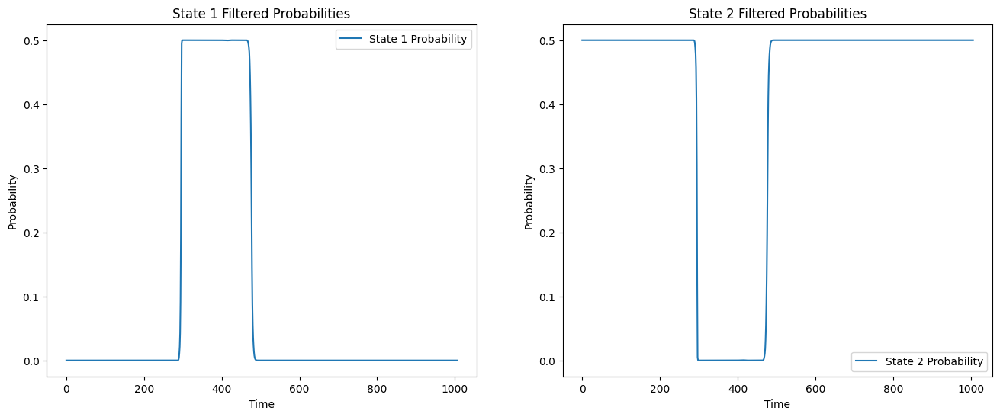

Iteration 5: Max Diff = 49.60401155114989
mu_hat0: [3.30365368 4.17673269 3.30365368 4.17673269]
mu_hat1: [3.52708007 4.23522165 3.52708007 4.23522165]
sigma_hat0: [0.32187127 0.28468208 0.32187127 0.28468208]
sigma_hat1: [0.29290797 0.24417933 0.29290797 0.24417933]
P_hat0: [[8.62322637e-01 7.24420763e-03 1.23188948e-01 7.24420763e-03]
 [6.24269273e-04 8.73907529e-01 6.24269273e-04 1.24843933e-01]
 [1.23188948e-01 7.24420763e-03 8.62322637e-01 7.24420763e-03]
 [6.24269273e-04 1.24843933e-01 6.24269273e-04 8.73907529e-01]]
P_hat1: [[8.70156007e-01 2.76799625e-03 1.24308001e-01 2.76799625e-03]
 [6.09647976e-04 8.73933116e-01 6.09647976e-04 1.24847588e-01]
 [1.24308001e-01 2.76799625e-03 8.70156007e-01 2.76799625e-03]
 [6.09647976e-04 1.24847588e-01 6.09647976e-04 8.73933116e-01]]


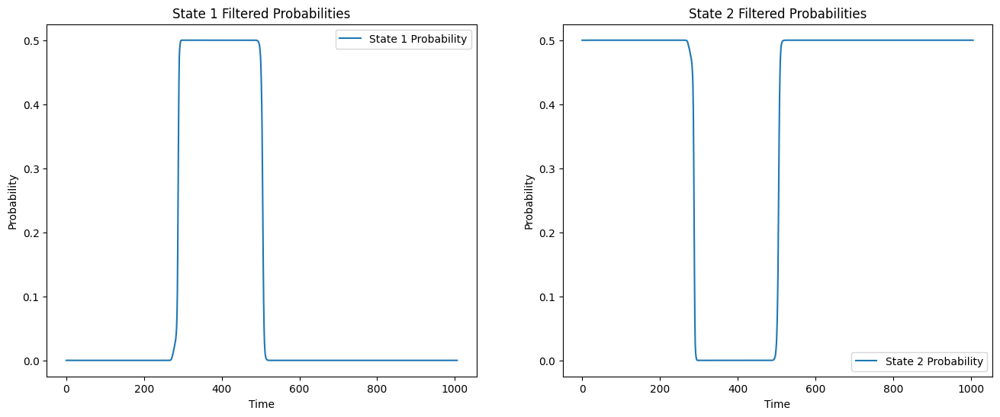

Iteration 6: Max Diff = 5.620310192923622
mu_hat0: [3.52708007 4.23522165 3.52708007 4.23522165]
mu_hat1: [3.58122702 4.25319541 3.58122702 4.25319541]
sigma_hat0: [0.29290797 0.24417933 0.29290797 0.24417933]
sigma_hat1: [0.29362961 0.23460166 0.29362961 0.23460166]
P_hat0: [[8.70156007e-01 2.76799625e-03 1.24308001e-01 2.76799625e-03]
 [6.09647976e-04 8.73933116e-01 6.09647976e-04 1.24847588e-01]
 [1.24308001e-01 2.76799625e-03 8.70156007e-01 2.76799625e-03]
 [6.09647976e-04 1.24847588e-01 6.09647976e-04 8.73933116e-01]]
P_hat1: [[8.70981851e-01 2.29608505e-03 1.24425979e-01 2.29608505e-03]
 [6.36291991e-04 8.73886489e-01 6.36291991e-04 1.24840927e-01]
 [1.24425979e-01 2.29608505e-03 8.70981851e-01 2.29608505e-03]
 [6.36291991e-04 1.24840927e-01 6.36291991e-04 8.73886489e-01]]


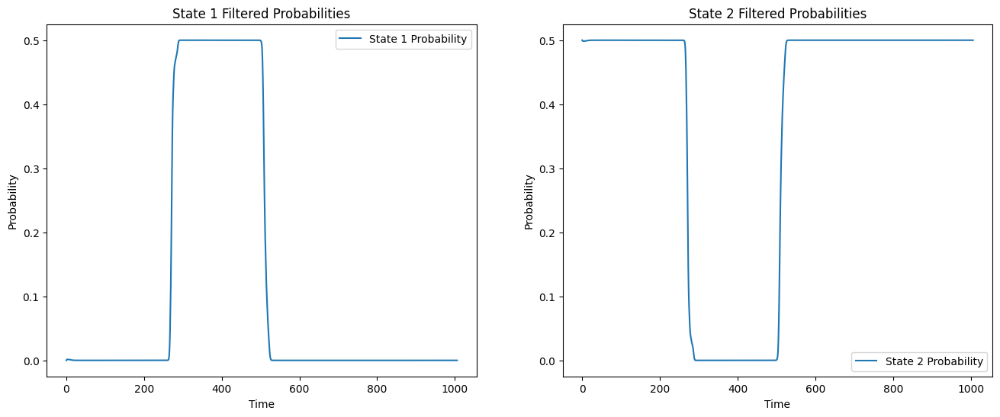

Iteration 7: Max Diff = 2.3388101202238305
mu_hat0: [3.58122702 4.25319541 3.58122702 4.25319541]
mu_hat1: [3.61310811 4.26188768 3.61310811 4.26188768]
sigma_hat0: [0.29362961 0.23460166 0.29362961 0.23460166]
sigma_hat1: [0.29843216 0.23181753 0.29843216 0.23181753]
P_hat0: [[8.70981851e-01 2.29608505e-03 1.24425979e-01 2.29608505e-03]
 [6.36291991e-04 8.73886489e-01 6.36291991e-04 1.24840927e-01]
 [1.24425979e-01 2.29608505e-03 8.70981851e-01 2.29608505e-03]
 [6.36291991e-04 1.24840927e-01 6.36291991e-04 8.73886489e-01]]
P_hat1: [[8.71322416e-01 2.10147667e-03 1.24474631e-01 2.10147667e-03]
 [6.56939507e-04 8.73850356e-01 6.56939507e-04 1.24835765e-01]
 [1.24474631e-01 2.10147667e-03 8.71322416e-01 2.10147667e-03]
 [6.56939507e-04 1.24835765e-01 6.56939507e-04 8.73850356e-01]]


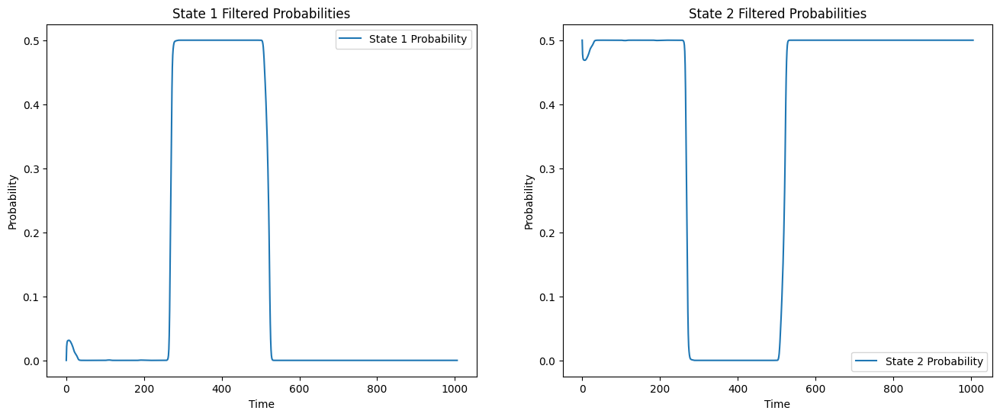

Iteration 8: Max Diff = 0.8729049450525158
mu_hat0: [3.61310811 4.26188768 3.61310811 4.26188768]
mu_hat1: [3.62968042 4.2666169  3.62968042 4.2666169 ]
sigma_hat0: [0.29843216 0.23181753 0.29843216 0.23181753]
sigma_hat1: [0.30064327 0.23051663 0.30064327 0.23051663]
P_hat0: [[8.71322416e-01 2.10147667e-03 1.24474631e-01 2.10147667e-03]
 [6.56939507e-04 8.73850356e-01 6.56939507e-04 1.24835765e-01]
 [1.24474631e-01 2.10147667e-03 8.71322416e-01 2.10147667e-03]
 [6.56939507e-04 1.24835765e-01 6.56939507e-04 8.73850356e-01]]
P_hat1: [[8.71271286e-01 2.13069384e-03 1.24467327e-01 2.13069384e-03]
 [7.10314369e-04 8.73756950e-01 7.10314369e-04 1.24822421e-01]
 [1.24467327e-01 2.13069384e-03 8.71271286e-01 2.13069384e-03]
 [7.10314368e-04 1.24822421e-01 7.10314368e-04 8.73756950e-01]]


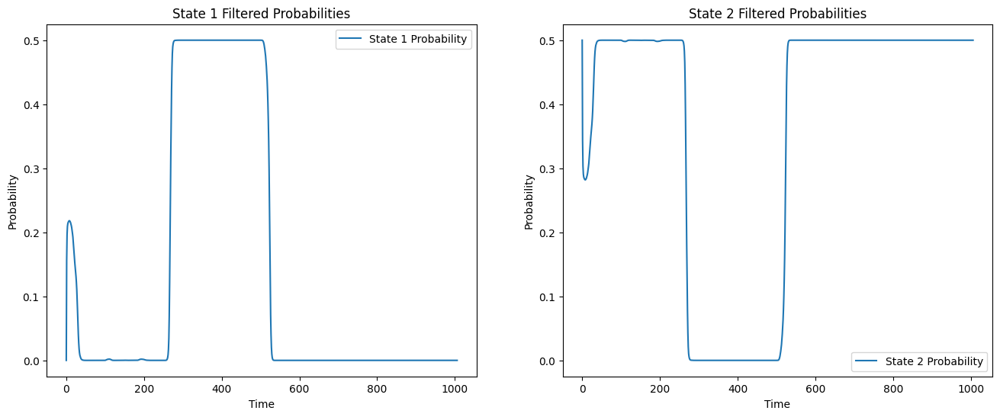

Iteration 9: Max Diff = 8.777741661035673
mu_hat0: [3.62968042 4.2666169  3.62968042 4.2666169 ]
mu_hat1: [3.64641325 4.27204737 3.64641325 4.27204737]
sigma_hat0: [0.30064327 0.23051663 0.30064327 0.23051663]
sigma_hat1: [0.30202822 0.22888331 0.30202822 0.22888331]
P_hat0: [[8.71271286e-01 2.13069384e-03 1.24467327e-01 2.13069384e-03]
 [7.10314369e-04 8.73756950e-01 7.10314369e-04 1.24822421e-01]
 [1.24467327e-01 2.13069384e-03 8.71271286e-01 2.13069384e-03]
 [7.10314368e-04 1.24822421e-01 7.10314368e-04 8.73756950e-01]]
P_hat1: [[0.87019059 0.00274824 0.12431294 0.00274824]
 [0.00098186 0.87328174 0.00098186 0.12475453]
 [0.12431294 0.00274824 0.87019059 0.00274824]
 [0.00098186 0.12475453 0.00098186 0.87328174]]


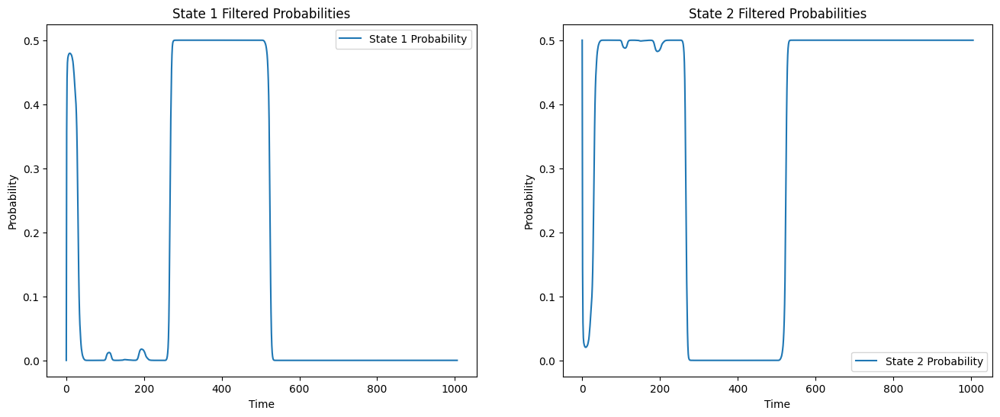

Iteration 10: Max Diff = 9.29092391197765
mu_hat0: [3.64641325 4.27204737 3.64641325 4.27204737]
mu_hat1: [3.6692885  4.28054428 3.66928848 4.28054429]
sigma_hat0: [0.30202822 0.22888331 0.30202822 0.22888331]
sigma_hat1: [0.30283412 0.22619101 0.30283414 0.22619102]
P_hat0: [[0.87019059 0.00274824 0.12431294 0.00274824]
 [0.00098186 0.87328174 0.00098186 0.12475453]
 [0.12431294 0.00274824 0.87019059 0.00274824]
 [0.00098186 0.12475453 0.00098186 0.87328174]]
P_hat1: [[0.86874607 0.00357368 0.12410658 0.00357368]
 [0.00141286 0.87252749 0.00141286 0.12464679]
 [0.12410658 0.00357368 0.86874607 0.00357368]
 [0.00141286 0.12464678 0.00141286 0.87252749]]


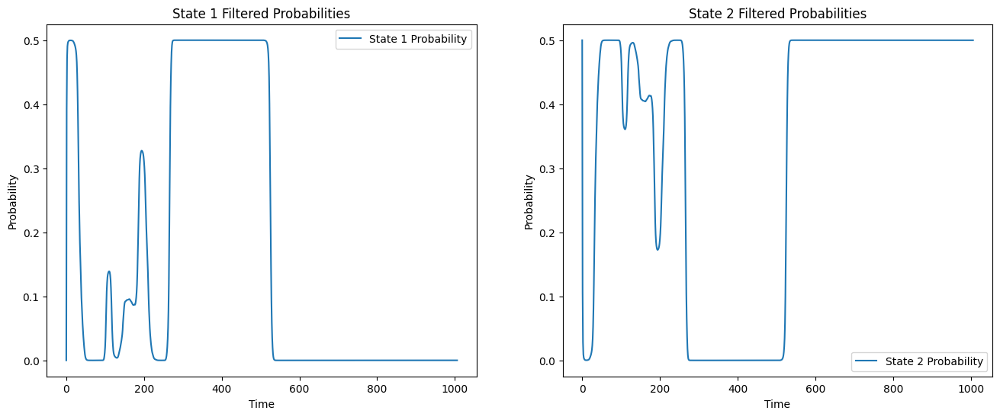

Iteration 11: Max Diff = 10.10445258430161
mu_hat0: [3.6692885  4.28054428 3.66928848 4.28054429]
mu_hat1: [3.70586881 4.29487339 3.70586852 4.2948735 ]
sigma_hat0: [0.30283412 0.22619101 0.30283414 0.22619102]
sigma_hat1: [0.30426052 0.22252382 0.30426086 0.22252386]
P_hat0: [[0.86874607 0.00357368 0.12410658 0.00357368]
 [0.00141286 0.87252749 0.00141286 0.12464679]
 [0.12410658 0.00357368 0.86874607 0.00357368]
 [0.00141286 0.12464678 0.00141286 0.87252749]]
P_hat1: [[0.86677271 0.00470129 0.12382471 0.00470129]
 [0.00219608 0.87115685 0.00219608 0.12445099]
 [0.12382465 0.00470129 0.86677277 0.00470129]
 [0.00219608 0.12445097 0.00219608 0.87115688]]


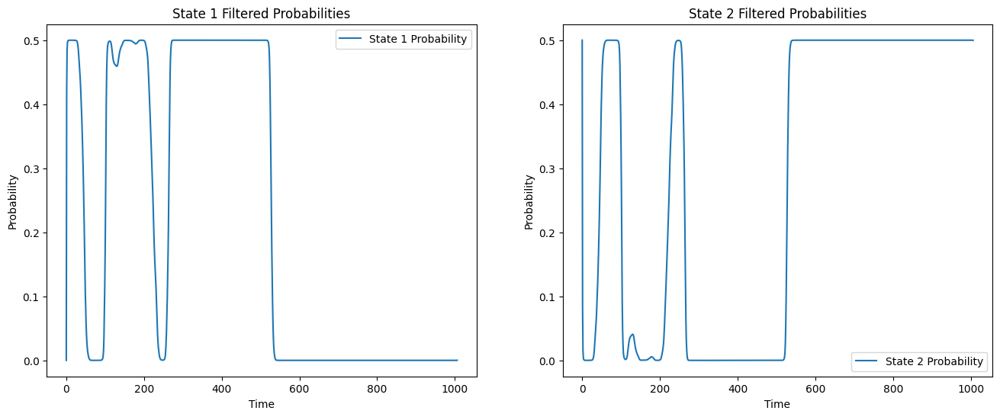

Iteration 12: Max Diff = 5.435800204328424
mu_hat0: [3.70586881 4.29487339 3.70586852 4.2948735 ]
mu_hat1: [3.78688017 4.34491148 3.78687578 4.34491229]
sigma_hat0: [0.30426052 0.22252382 0.30426086 0.22252386]
sigma_hat1: [0.29839221 0.20634883 0.29839799 0.20634906]
P_hat0: [[0.86677271 0.00470129 0.12382471 0.00470129]
 [0.00219608 0.87115685 0.00219608 0.12445099]
 [0.12382465 0.00470129 0.86677277 0.00470129]
 [0.00219608 0.12445097 0.00219608 0.87115688]]
P_hat1: [[0.86859709 0.00365857 0.12408578 0.00365856]
 [0.00271347 0.87025129 0.00271347 0.12432176]
 [0.12408494 0.00365855 0.86859797 0.00365854]
 [0.00271346 0.1243215  0.00271346 0.87025157]]


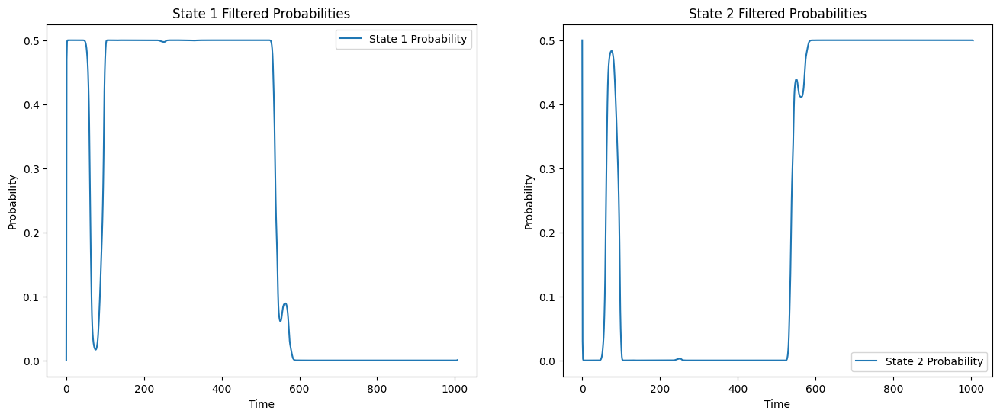

Iteration 13: Max Diff = 6.334478043134465
mu_hat0: [3.78688017 4.34491148 3.78687578 4.34491229]
mu_hat1: [3.83603793 4.38909314 3.83595453 4.38909861]
sigma_hat0: [0.29839221 0.20634883 0.29839799 0.20634906]
sigma_hat1: [0.29475302 0.19020425 0.29486642 0.19020558]
P_hat0: [[0.86859709 0.00365857 0.12408578 0.00365856]
 [0.00271347 0.87025129 0.00271347 0.12432176]
 [0.12408494 0.00365855 0.86859797 0.00365854]
 [0.00271346 0.1243215  0.00271346 0.87025157]]
P_hat1: [[0.87143586 0.00203217 0.12449983 0.00203215]
 [0.00211226 0.87130257 0.00211227 0.1244729 ]
 [0.12448414 0.00203197 0.87145195 0.00203194]
 [0.00211221 0.12447098 0.00211222 0.87130459]]


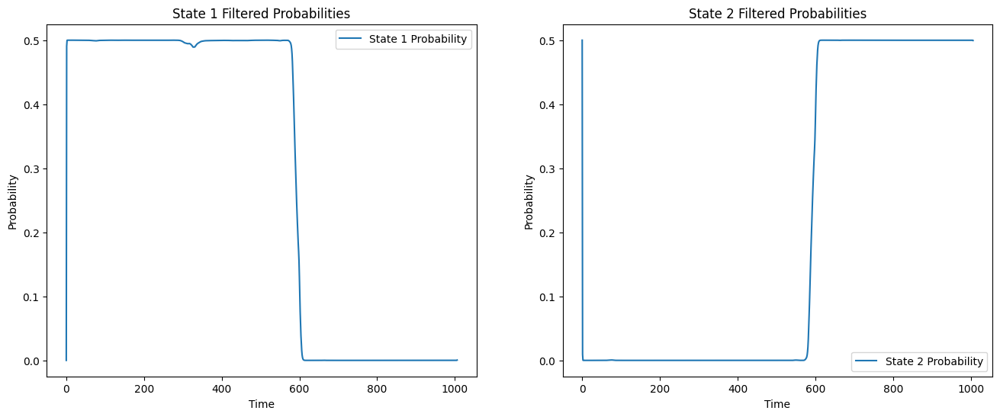

Iteration 14: Max Diff = 7.752225770374524
mu_hat0: [3.83603793 4.38909314 3.83595453 4.38909861]
mu_hat1: [3.87771267 4.43741061 3.87598648 4.4374442 ]
sigma_hat0: [0.29475302 0.19020425 0.29486642 0.19020558]
sigma_hat1: [0.29210165 0.16881318 0.29452188 0.16882078]
P_hat0: [[0.87143586 0.00203217 0.12449983 0.00203215]
 [0.00211226 0.87130257 0.00211227 0.1244729 ]
 [0.12448414 0.00203197 0.87145195 0.00203194]
 [0.00211221 0.12447098 0.00211222 0.87130459]]
P_hat1: [[8.73344752e-01 8.54452627e-04 1.24946430e-01 8.54365108e-04]
 [1.22496254e-03 8.72849501e-01 1.22481319e-03 1.24700723e-01]
 [1.24625371e-01 8.52834132e-04 8.73669048e-01 8.52746780e-04]
 [1.22475757e-03 1.24686883e-01 1.22460824e-03 8.72863751e-01]]


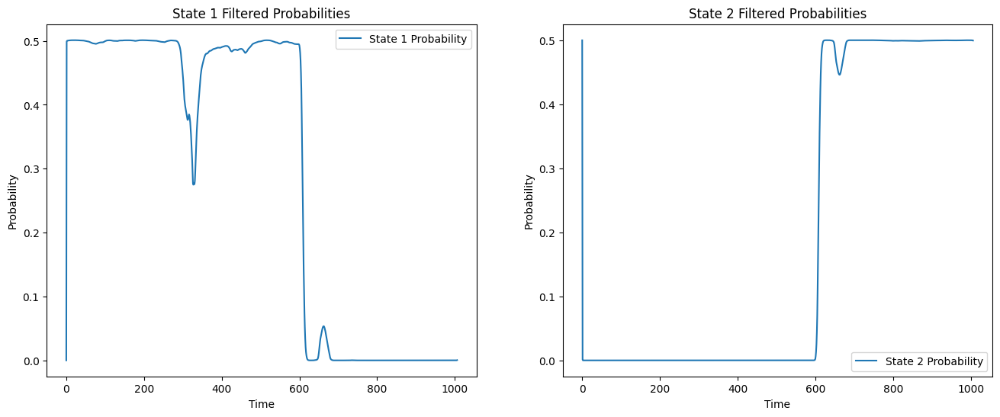

Iteration 15: Max Diff = 16.039686156145915
mu_hat0: [3.87771267 4.43741061 3.87598648 4.4374442 ]
mu_hat1: [3.90583664 4.44840452 3.86755    4.44863069]
sigma_hat0: [0.29210165 0.16881318 0.29452188 0.16882078]
sigma_hat1: [0.26519693 0.16399268 0.31756851 0.16404655]
P_hat0: [[8.73344752e-01 8.54452627e-04 1.24946430e-01 8.54365108e-04]
 [1.22496254e-03 8.72849501e-01 1.22481319e-03 1.24700723e-01]
 [1.24625371e-01 8.52834132e-04 8.73669048e-01 8.52746780e-04]
 [1.22475757e-03 1.24686883e-01 1.22460824e-03 8.72863751e-01]]
P_hat1: [[0.87016961 0.00092937 0.12797236 0.00092866]
 [0.001407   0.8725042  0.00140821 0.12468058]
 [0.12088836 0.00089339 0.87732554 0.00089271]
 [0.00140572 0.12461587 0.00140693 0.87257148]]


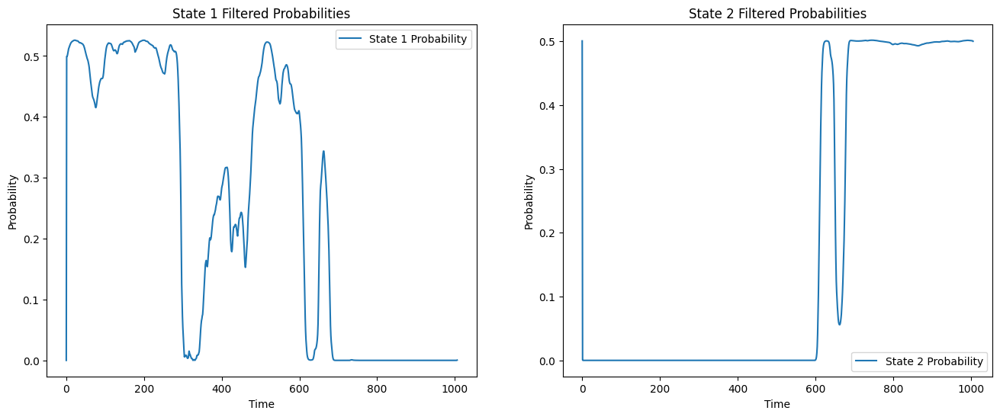

Iteration 16: Max Diff = 100.79631982942192
mu_hat0: [3.90583664 4.44840452 3.86755    4.44863069]
mu_hat1: [4.0000785  4.46207415 3.83407918 4.46357289]
sigma_hat0: [0.26519693 0.16399268 0.31756851 0.16404655]
sigma_hat1: [0.14881966 0.15833722 0.34375978 0.15869567]
P_hat0: [[0.87016961 0.00092937 0.12797236 0.00092866]
 [0.001407   0.8725042  0.00140821 0.12468058]
 [0.12088836 0.00089339 0.87732554 0.00089271]
 [0.00140572 0.12461587 0.00140693 0.87257148]]
P_hat1: [[0.85558579 0.00153751 0.14134728 0.00152942]
 [0.00232926 0.87029678 0.00278273 0.12459122]
 [0.09000209 0.00146907 0.90706747 0.00146137]
 [0.00231351 0.12413208 0.00276315 0.87079127]]


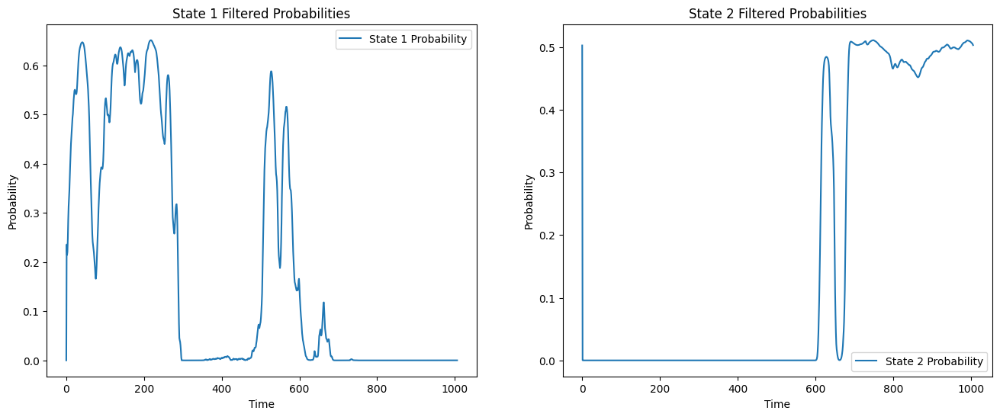

Iteration 17: Max Diff = 86.6072537973752
mu_hat0: [4.0000785  4.46207415 3.83407918 4.46357289]
mu_hat1: [4.04358318 4.46551868 3.84936995 4.47551159]
sigma_hat0: [0.14881966 0.15833722 0.34375978 0.15869567]
sigma_hat1: [0.06887241 0.15457976 0.33346395 0.15695137]
P_hat0: [[0.85558579 0.00153751 0.14134728 0.00152942]
 [0.00232926 0.87029678 0.00278273 0.12459122]
 [0.09000209 0.00146907 0.90706747 0.00146137]
 [0.00231351 0.12413208 0.00276315 0.87079127]]
P_hat1: [[8.77180331e-01 4.97674703e-04 1.21842644e-01 4.79350320e-04]
 [1.00984363e-03 8.68666435e-01 4.62466845e-03 1.25699053e-01]
 [4.96335736e-02 1.98469073e-03 9.46468957e-01 1.91277866e-03]
 [9.68115338e-04 1.22777263e-01 4.41247218e-03 8.71842149e-01]]


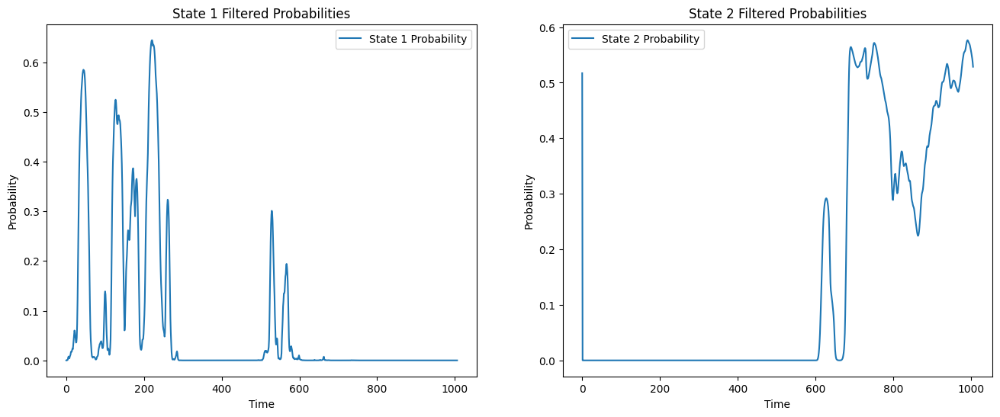

Iteration 18: Max Diff = 286.3576809990326
mu_hat0: [4.04358318 4.46551868 3.84936995 4.47551159]
mu_hat1: [4.04965319 4.45128265 3.90258241 4.51213928]
sigma_hat0: [0.06887241 0.15457976 0.33346395 0.15695137]
sigma_hat1: [0.03534136 0.14150554 0.31273555 0.15470637]
P_hat0: [[8.77180331e-01 4.97674703e-04 1.21842644e-01 4.79350320e-04]
 [1.00984363e-03 8.68666435e-01 4.62466845e-03 1.25699053e-01]
 [4.96335736e-02 1.98469073e-03 9.46468957e-01 1.91277866e-03]
 [9.68115338e-04 1.22777263e-01 4.41247218e-03 8.71842149e-01]]
P_hat1: [[8.72054475e-01 3.44569650e-06 1.27939410e-01 2.66956172e-06]
 [5.24685752e-06 8.63504782e-01 5.75276269e-03 1.30737208e-01]
 [1.54506224e-02 1.57221165e-03 9.81751799e-01 1.22536703e-03]
 [3.85596998e-06 1.12067041e-01 4.33086620e-03 8.83598237e-01]]


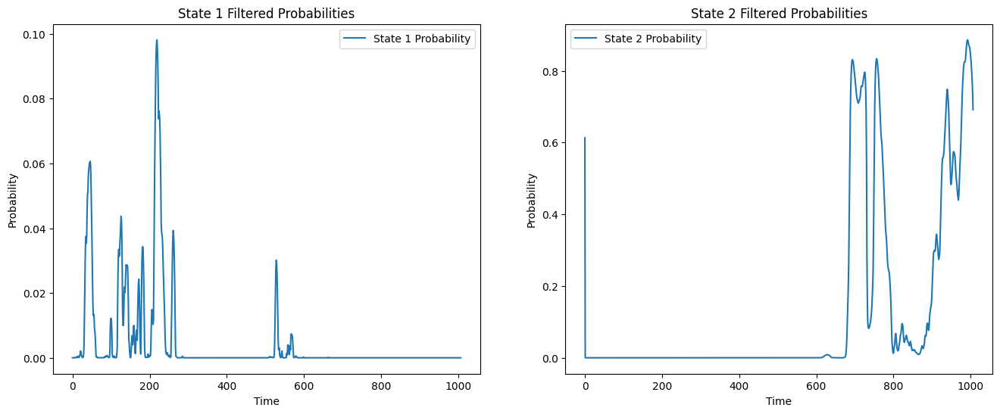

Iteration 19: Max Diff = 4200.456160149782
mu_hat0: [4.04965319 4.45128265 3.90258241 4.51213928]
mu_hat1: [4.04869582 4.40698701 3.93318725 4.57828891]
sigma_hat0: [0.03534136 0.14150554 0.31273555 0.15470637]
sigma_hat1: [0.02240375 0.09103845 0.30217781 0.12771953]
P_hat0: [[8.72054475e-01 3.44569650e-06 1.27939410e-01 2.66956172e-06]
 [5.24685752e-06 8.63504782e-01 5.75276269e-03 1.30737208e-01]
 [1.54506224e-02 1.57221165e-03 9.81751799e-01 1.22536703e-03]
 [3.85596998e-06 1.12067041e-01 4.33086620e-03 8.83598237e-01]]
P_hat1: [[7.45833467e-01 1.07300154e-09 2.54166531e-01 3.91336267e-10]
 [1.78528637e-10 8.91538375e-01 1.03589164e-02 9.81027082e-02]
 [1.73875850e-03 2.26546499e-03 9.95491586e-01 5.04190245e-04]
 [4.21820087e-11 7.06569167e-02 3.41525893e-03 9.25927824e-01]]


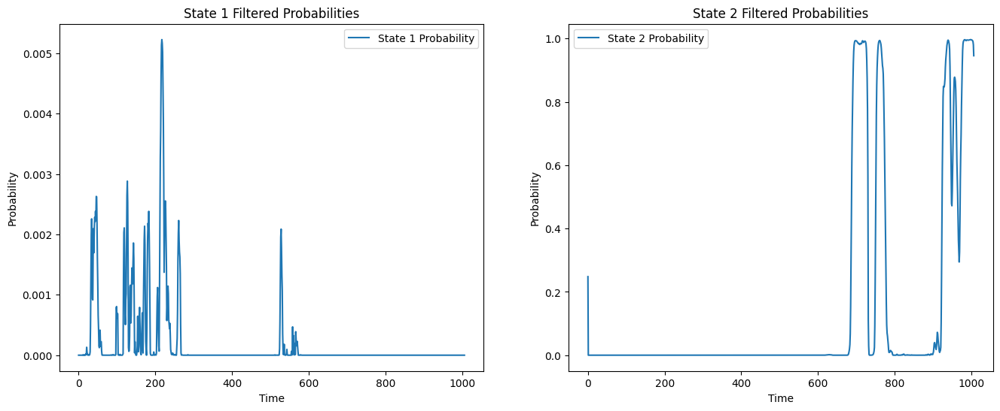

Iteration 20: Max Diff = 7302.408653337037
mu_hat0: [4.04869582 4.40698701 3.93318725 4.57828891]
mu_hat1: [4.04763621 4.39680784 3.93720136 4.6068428 ]
sigma_hat0: [0.02240375 0.09103845 0.30217781 0.12771953]
sigma_hat1: [0.01759263 0.06123116 0.30179121 0.11067565]
P_hat0: [[7.45833467e-01 1.07300154e-09 2.54166531e-01 3.91336267e-10]
 [1.78528637e-10 8.91538375e-01 1.03589164e-02 9.81027082e-02]
 [1.73875850e-03 2.26546499e-03 9.95491586e-01 5.04190245e-04]
 [4.21820087e-11 7.06569167e-02 3.41525893e-03 9.25927824e-01]]
P_hat1: [[5.24910449e-01 1.81139951e-14 4.75089551e-01 7.21537597e-16]
 [1.55900249e-16 9.62138968e-01 9.24605915e-03 2.86149725e-02]
 [1.40359427e-04 2.82790906e-03 9.97018692e-01 1.30395581e-05]
 [2.15934571e-18 2.35685873e-02 4.70922408e-03 9.71722189e-01]]


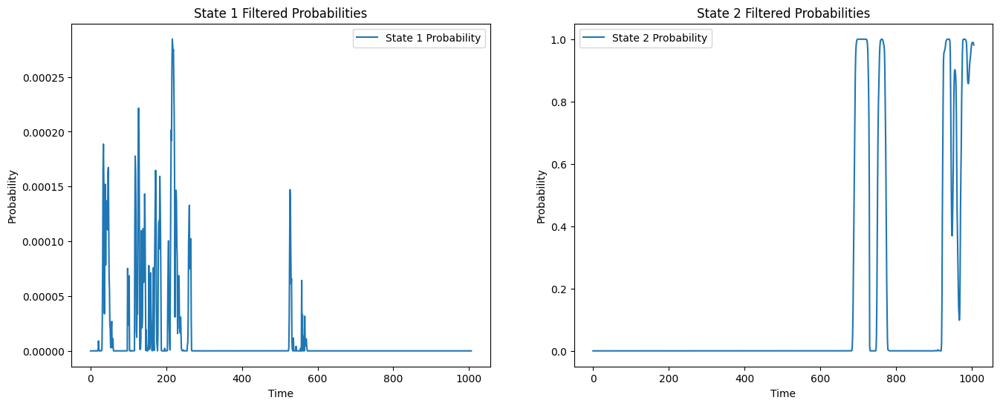

Iteration 21: Max Diff = 4959.70168918348
mu_hat0: [4.04763621 4.39680784 3.93720136 4.6068428 ]
mu_hat1: [4.0468766  4.39867202 3.94004029 4.60530228]
sigma_hat0: [0.01759263 0.06123116 0.30179121 0.11067565]
sigma_hat1: [0.01554908 0.05212713 0.30235791 0.11327396]
P_hat0: [[5.24910449e-01 1.81139951e-14 4.75089551e-01 7.21537597e-16]
 [1.55900249e-16 9.62138968e-01 9.24605915e-03 2.86149725e-02]
 [1.40359427e-04 2.82790906e-03 9.97018692e-01 1.30395581e-05]
 [2.15934571e-18 2.35685873e-02 4.70922408e-03 9.71722189e-01]]
P_hat1: [[3.29704746e-01 2.64902167e-22 6.70295254e-01 2.79997469e-23]
 [4.48899488e-25 9.71033182e-01 9.01269314e-03 1.99541244e-02]
 [1.20082970e-05 3.00073713e-03 9.96987210e-01 4.49025841e-08]
 [6.53540317e-29 1.54494429e-02 6.09056575e-03 9.78459991e-01]]


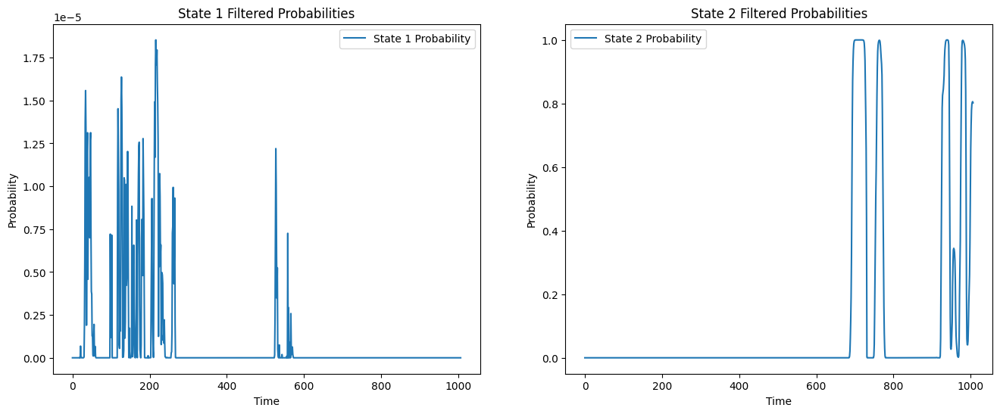

Iteration 22: Max Diff = 3085.610271990797
mu_hat0: [4.0468766  4.39867202 3.94004029 4.60530228]
mu_hat1: [4.04624364 4.40045558 3.94747355 4.5944151 ]
sigma_hat0: [0.01554908 0.05212713 0.30235791 0.11327396]
sigma_hat1: [0.01458984 0.04217906 0.3040244  0.11527826]
P_hat0: [[3.29704746e-01 2.64902167e-22 6.70295254e-01 2.79997469e-23]
 [4.48899488e-25 9.71033182e-01 9.01269314e-03 1.99541244e-02]
 [1.20082970e-05 3.00073713e-03 9.96987210e-01 4.49025841e-08]
 [6.53540317e-29 1.54494429e-02 6.09056575e-03 9.78459991e-01]]
P_hat1: [[1.93341684e-01 3.33438327e-32 8.06658316e-01 2.00867536e-30]
 [2.96984419e-35 9.56554213e-01 1.96344240e-02 2.38113625e-02]
 [1.05087262e-06 3.81555052e-03 9.96183398e-01 2.23624552e-10]
 [1.08941641e-41 1.32752365e-02 5.64110280e-03 9.81083661e-01]]


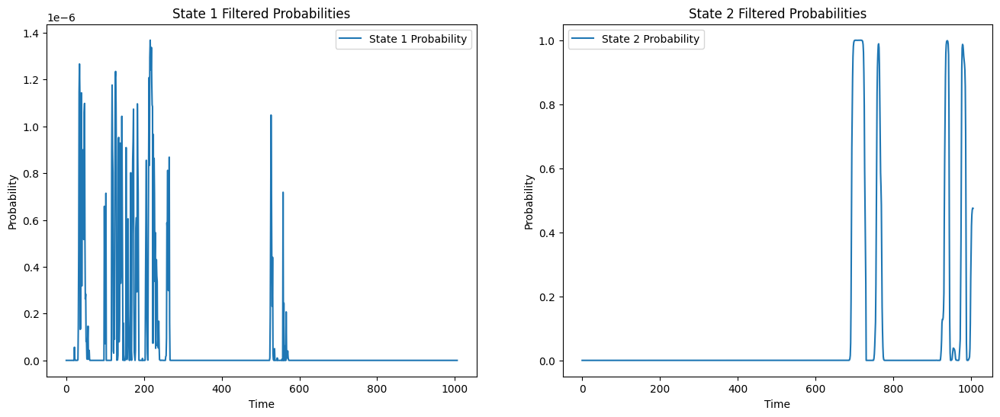

Iteration 23: Max Diff = 19999.9113201212
mu_hat0: [4.04624364 4.40045558 3.94747355 4.5944151 ]
mu_hat1: [4.04564857 4.39744138 3.9532838  4.58719346]
sigma_hat0: [0.01458984 0.04217906 0.3040244  0.11527826]
sigma_hat1: [0.0140791  0.03404231 0.30541965 0.10435914]
P_hat0: [[1.93341684e-01 3.33438327e-32 8.06658316e-01 2.00867536e-30]
 [2.96984419e-35 9.56554213e-01 1.96344240e-02 2.38113625e-02]
 [1.05087262e-06 3.81555052e-03 9.96183398e-01 2.23624552e-10]
 [1.08941641e-41 1.32752365e-02 5.64110280e-03 9.81083661e-01]]
P_hat1: [[1.08617264e-01 3.09529362e-45 8.91382736e-01 2.62031441e-37]
 [3.32474330e-48 9.44564048e-01 2.71337024e-02 2.83022491e-02]
 [9.21602213e-08 3.37645991e-03 9.96623448e-01 2.66670744e-12]
 [1.80752337e-56 1.07462400e-02 7.27231702e-05 9.89181037e-01]]


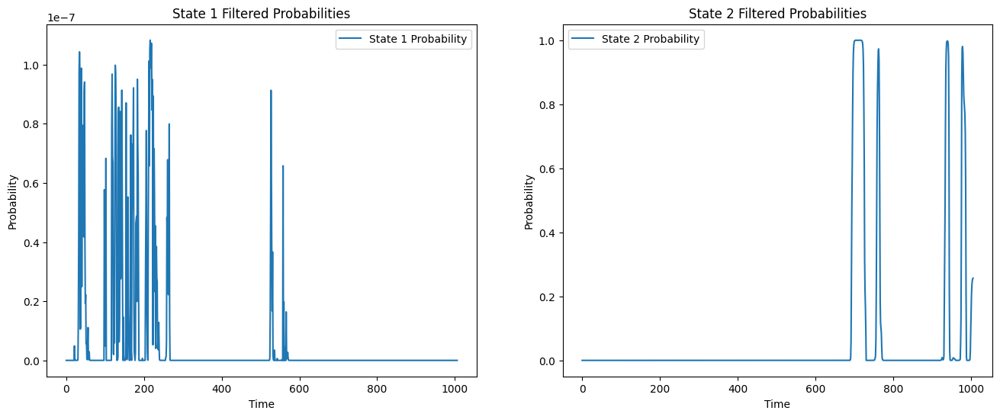

Iteration 24: Max Diff = 1204.558128435984
mu_hat0: [4.04564857 4.39744138 3.9532838  4.58719346]
mu_hat1: [4.04506641 4.39584621 3.95657785 4.58286841]
sigma_hat0: [0.0140791  0.03404231 0.30541965 0.10435914]
sigma_hat1: [0.01375172 0.02939218 0.30634012 0.10546451]
P_hat0: [[1.08617264e-01 3.09529362e-45 8.91382736e-01 2.62031441e-37]
 [3.32474330e-48 9.44564048e-01 2.71337024e-02 2.83022491e-02]
 [9.21602213e-08 3.37645991e-03 9.96623448e-01 2.66670744e-12]
 [1.80752337e-56 1.07462400e-02 7.27231702e-05 9.89181037e-01]]
P_hat1: [[5.95785551e-02 1.57322327e-62 9.40421445e-01 5.98190834e-47]
 [8.92629468e-65 9.34314867e-01 3.26781521e-02 3.30069805e-02]
 [8.06479133e-09 3.05145205e-03 9.96948540e-01 1.11609325e-13]
 [5.27953302e-74 1.02005156e-02 3.52336760e-06 9.89795961e-01]]


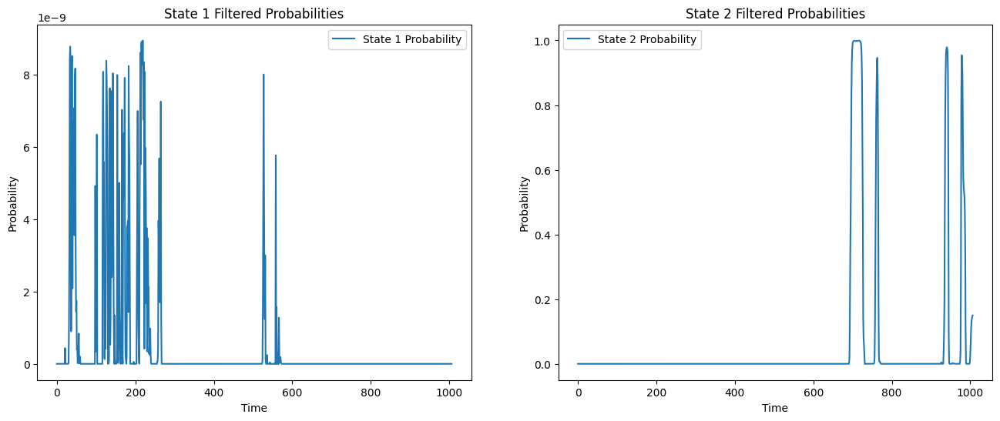

Iteration 25: Max Diff = 725.6797132709709
mu_hat0: [4.04506641 4.39584621 3.95657785 4.58286841]
mu_hat1: [4.04448713 4.39628164 3.95905215 4.58074679]
sigma_hat0: [0.01375172 0.02939218 0.30634012 0.10546451]
sigma_hat1: [0.01348643 0.02697381 0.3070393  0.10614916]
P_hat0: [[5.95785551e-02 1.57322327e-62 9.40421445e-01 5.98190834e-47]
 [8.92629468e-65 9.34314867e-01 3.26781521e-02 3.30069805e-02]
 [8.06479133e-09 3.05145205e-03 9.96948540e-01 1.11609325e-13]
 [5.27953302e-74 1.02005156e-02 3.52336760e-06 9.89795961e-01]]
P_hat1: [[3.23029907e-02 8.52537463e-84 9.67697009e-01 9.68408169e-58]
 [1.04002584e-84 9.25746288e-01 3.72038107e-02 3.70499010e-02]
 [7.01127133e-10 2.89240949e-03 9.97107590e-01 1.23617451e-14]
 [9.42372949e-93 9.92271451e-03 5.32083725e-07 9.90076753e-01]]


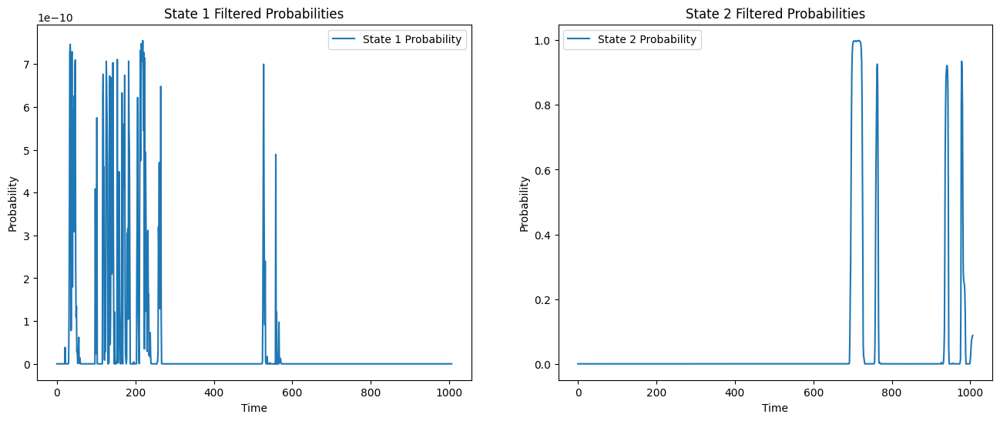

Iteration 26: Max Diff = 445.95375827866553
mu_hat0: [4.04448713 4.39628164 3.95905215 4.58074679]
mu_hat1: [4.0439012  4.3981997  3.96118512 4.57965858]
sigma_hat0: [0.01348643 0.02697381 0.3070393  0.10614916]
sigma_hat1: [0.01322399 0.02549911 0.30763848 0.10665611]
P_hat0: [[3.23029907e-02 8.52537463e-84 9.67697009e-01 9.68408169e-58]
 [1.04002584e-84 9.25746288e-01 3.72038107e-02 3.70499010e-02]
 [7.01127133e-10 2.89240949e-03 9.97107590e-01 1.23617451e-14]
 [9.42372949e-93 9.92271451e-03 5.32083725e-07 9.90076753e-01]]
P_hat1: [[1.74056725e-002 3.92048891e-108 9.82594327e-001 2.86451294e-069]
 [2.69530397e-107 9.18753273e-001 4.12412205e-002 4.00055063e-002]
 [6.02302210e-011 2.79678192e-003 9.97203218e-001 2.35434587e-015]
 [2.23433397e-112 9.61135955e-003 1.60582494e-007 9.90388480e-001]]


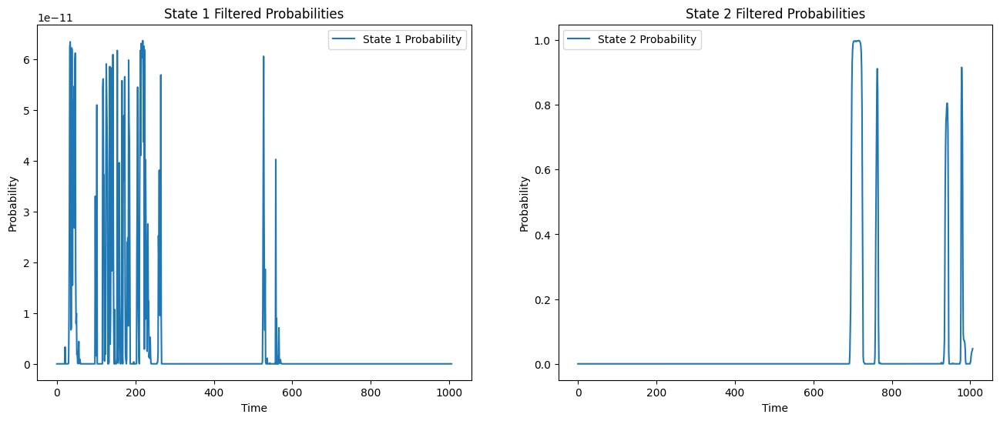

Iteration 27: Max Diff = 284.9640826283231
mu_hat0: [4.0439012  4.3981997  3.96118512 4.57965858]
mu_hat1: [4.04330051 4.40046324 3.96288129 4.57854523]
sigma_hat0: [0.01322399 0.02549911 0.30763848 0.10665611]
sigma_hat1: [0.01293344 0.02415467 0.30811133 0.1073113 ]
P_hat0: [[1.74056725e-002 3.92048891e-108 9.82594327e-001 2.86451294e-069]
 [2.69530397e-107 9.18753273e-001 4.12412205e-002 4.00055063e-002]
 [6.02302210e-011 2.79678192e-003 9.97203218e-001 2.35434587e-015]
 [2.23433397e-112 9.61135955e-003 1.60582494e-007 9.90388480e-001]]
P_hat1: [[9.33916146e-003 4.55802855e-135 9.90660839e-001 2.84700763e-081]
 [3.46203757e-132 9.13230565e-001 4.53094713e-002 4.14599635e-002]
 [5.08991377e-012 2.73193361e-003 9.97268066e-001 6.60772483e-016]
 [1.10202661e-132 9.01730812e-003 7.53342181e-008 9.90982617e-001]]


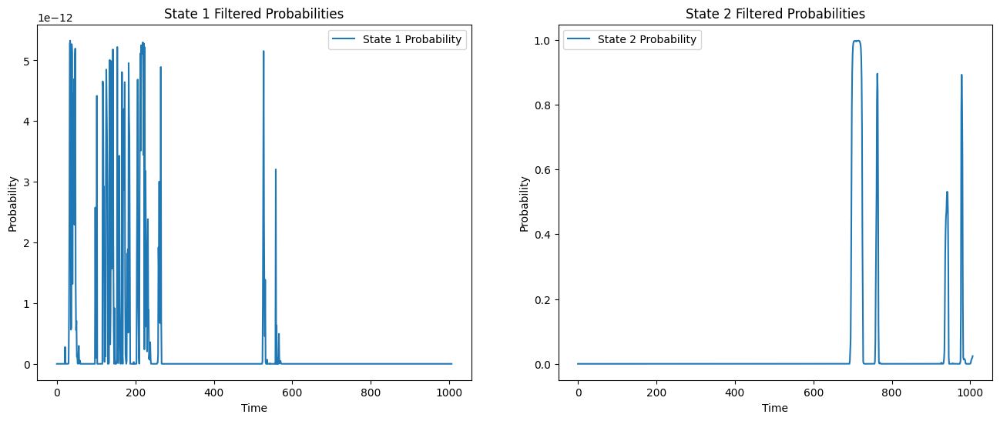

Iteration 28: Max Diff = 222.51781273461106
mu_hat0: [4.04330051 4.40046324 3.96288129 4.57854523]
mu_hat1: [4.04267919 4.40271908 3.96407545 4.57630997]
sigma_hat0: [0.01293344 0.02415467 0.30811133 0.1073113 ]
sigma_hat1: [0.01259693 0.02259206 0.30844656 0.10863846]
P_hat0: [[9.33916146e-003 4.55802855e-135 9.90660839e-001 2.84700763e-081]
 [3.46203757e-132 9.13230565e-001 4.53094713e-002 4.14599635e-002]
 [5.08991377e-012 2.73193361e-003 9.97268066e-001 6.60772483e-016]
 [1.10202661e-132 9.01730812e-003 7.53342181e-008 9.90982617e-001]]
P_hat1: [[4.99261379e-003 6.54297451e-165 9.95007386e-001 1.52484532e-093]
 [1.12998891e-159 9.09724870e-001 5.06536013e-002 3.96215292e-002]
 [4.21622948e-013 2.69470817e-003 9.97305292e-001 2.63990926e-016]
 [1.69224492e-153 7.61934615e-003 4.97323896e-008 9.92380604e-001]]


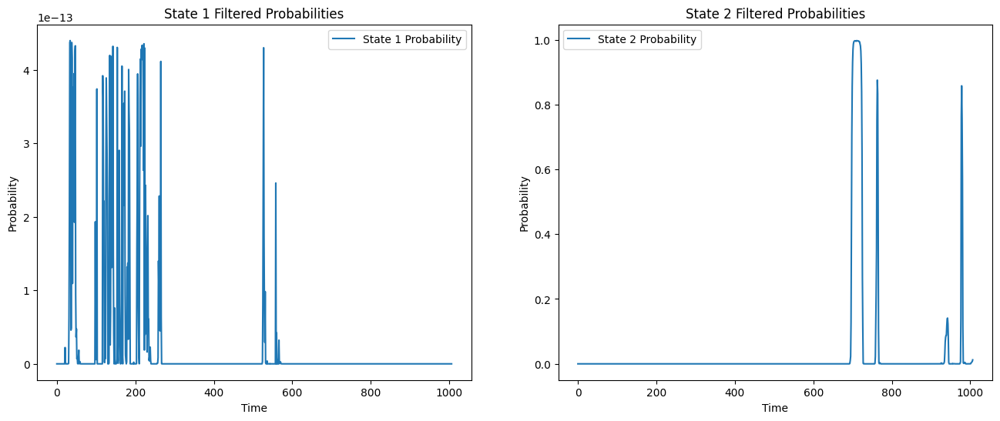

Iteration 29: Max Diff = 236.56180201434333
mu_hat0: [4.04267919 4.40271908 3.96407545 4.57630997]
mu_hat1: [4.04203368 4.40529369 3.96504702 4.57335265]
sigma_hat0: [0.01259693 0.02259206 0.30844656 0.10863846]
sigma_hat1: [0.01220269 0.02039038 0.30872443 0.1102948 ]
P_hat0: [[4.99261379e-003 6.54297451e-165 9.95007386e-001 1.52484532e-093]
 [1.12998891e-159 9.09724870e-001 5.06536013e-002 3.96215292e-002]
 [4.21622948e-013 2.69470817e-003 9.97305292e-001 2.63990926e-016]
 [1.69224492e-153 7.61934615e-003 4.97323896e-008 9.92380604e-001]]
P_hat1: [[2.65821812e-003 1.08814621e-198 9.97341782e-001 7.42518326e-106]
 [1.06994419e-190 9.07932161e-001 5.80950334e-002 3.39728052e-002]
 [3.40946425e-014 2.66761034e-003 9.97332390e-001 1.57327794e-016]
 [1.35941430e-174 5.59418163e-003 4.98402928e-008 9.94405769e-001]]


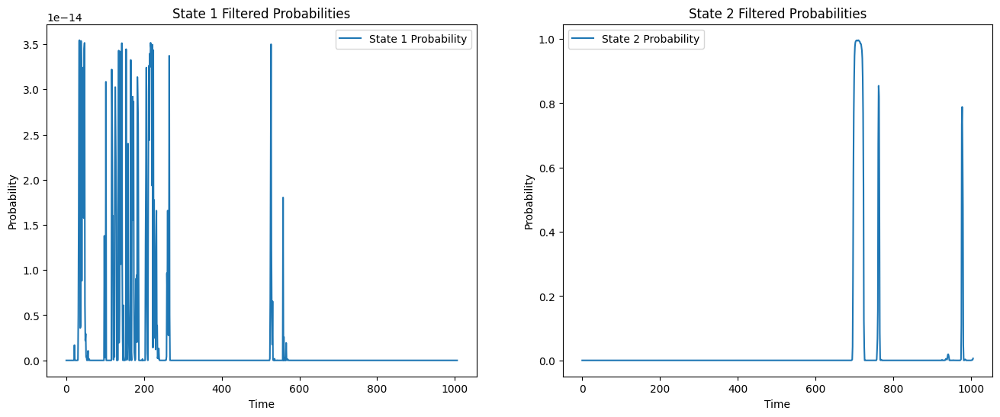

Iteration 30: Max Diff = 148.20981672506505
mu_hat0: [4.04203368 4.40529369 3.96504702 4.57335265]
mu_hat1: [4.04136287 4.40729967 3.96612892 4.5724736 ]
sigma_hat0: [0.01220269 0.02039038 0.30872443 0.1102948 ]
sigma_hat1: [0.01174176 0.01883444 0.30904389 0.11074647]
P_hat0: [[2.65821812e-003 1.08814621e-198 9.97341782e-001 7.42518326e-106]
 [1.06994419e-190 9.07932161e-001 5.80950334e-002 3.39728052e-002]
 [3.40946425e-014 2.66761034e-003 9.97332390e-001 1.57327794e-016]
 [1.35941430e-174 5.59418163e-003 4.98402928e-008 9.94405769e-001]]
P_hat1: [[1.40761449e-003 6.71048447e-239 9.98592386e-001 5.40374115e-118]
 [5.53638656e-228 9.03654691e-001 6.35440246e-002 3.28012839e-002]
 [2.67710443e-015 2.64689575e-003 9.97353104e-001 1.56520669e-016]
 [9.25885161e-196 4.90400030e-003 1.02967807e-007 9.95095897e-001]]


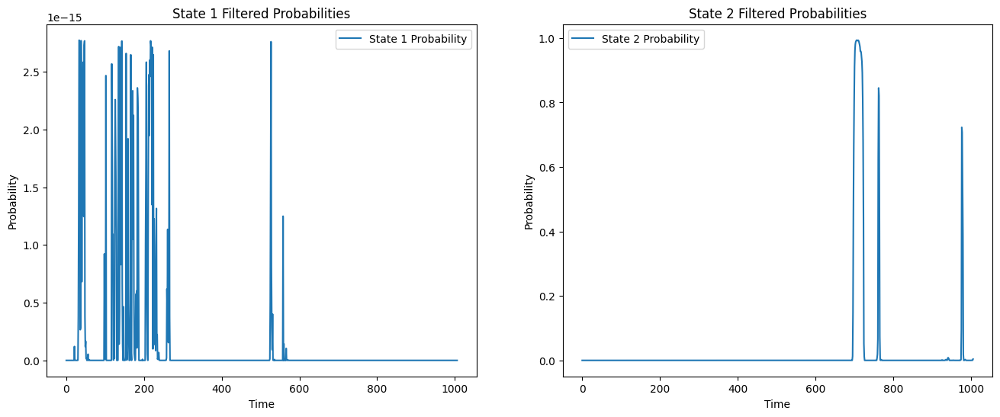

Iteration 31: Max Diff = 120.24529717471113
mu_hat0: [4.04136287 4.40729967 3.96612892 4.5724736 ]
mu_hat1: [4.0406695  4.40847522 3.96704556 4.57238348]
sigma_hat0: [0.01174176 0.01883444 0.30904389 0.11074647]
sigma_hat1: [0.01120716 0.01818217 0.30932959 0.11078699]
P_hat0: [[1.40761449e-003 6.71048447e-239 9.98592386e-001 5.40374115e-118]
 [5.53638656e-228 9.03654691e-001 6.35440246e-002 3.28012839e-002]
 [2.67710443e-015 2.64689575e-003 9.97353104e-001 1.56520669e-016]
 [9.25885161e-196 4.90400030e-003 1.02967807e-007 9.95095897e-001]]
P_hat1: [[7.39427126e-004 3.57868012e-285 9.99260573e-001 8.69527162e-130]
 [2.57932230e-271 8.98388374e-001 6.73255568e-002 3.42860691e-002]
 [2.03000158e-016 2.63818682e-003 9.97361813e-001 1.90366737e-016]
 [6.43553915e-217 4.83494916e-003 3.62157055e-007 9.95164689e-001]]


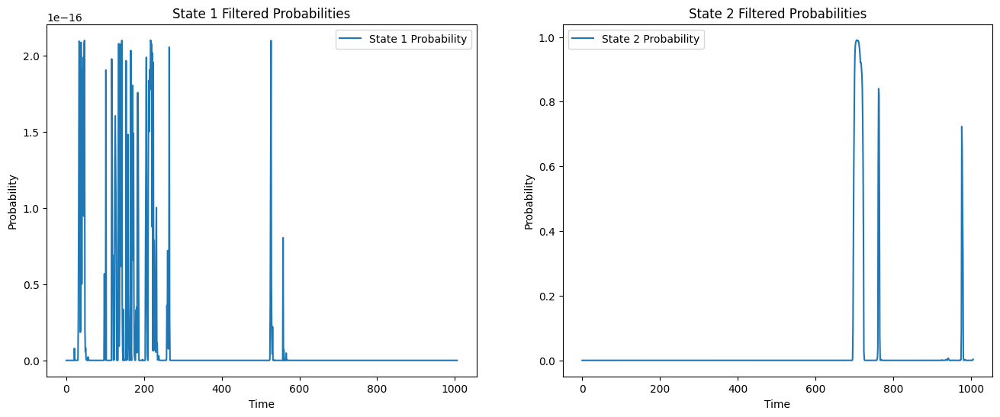

Iteration 32: Max Diff = 89.38456633532661
mu_hat0: [4.0406695  4.40847522 3.96704556 4.57238348]
mu_hat1: [4.0399632  4.40915443 3.96769307 4.57237677]
sigma_hat0: [0.01120716 0.01818217 0.30932959 0.11078699]
sigma_hat1: [0.01059525 0.01792278 0.309539   0.11079268]
P_hat0: [[7.39427126e-004 3.57868012e-285 9.99260573e-001 8.69527162e-130]
 [2.57932230e-271 8.98388374e-001 6.73255568e-002 3.42860691e-002]
 [2.03000158e-016 2.63818682e-003 9.97361813e-001 1.90366737e-016]
 [6.43553915e-217 4.83494916e-003 3.62157055e-007 9.95164689e-001]]
P_hat1: [[3.83959552e-004 0.00000000e+000 9.99616040e-001 4.68929954e-141]
 [0.00000000e+000 8.94286120e-001 7.00686890e-002 3.56451912e-002]
 [1.47816638e-017 2.63341618e-003 9.97366584e-001 2.34278841e-016]
 [4.94276419e-238 4.82821325e-003 1.59378381e-006 9.95170193e-001]]


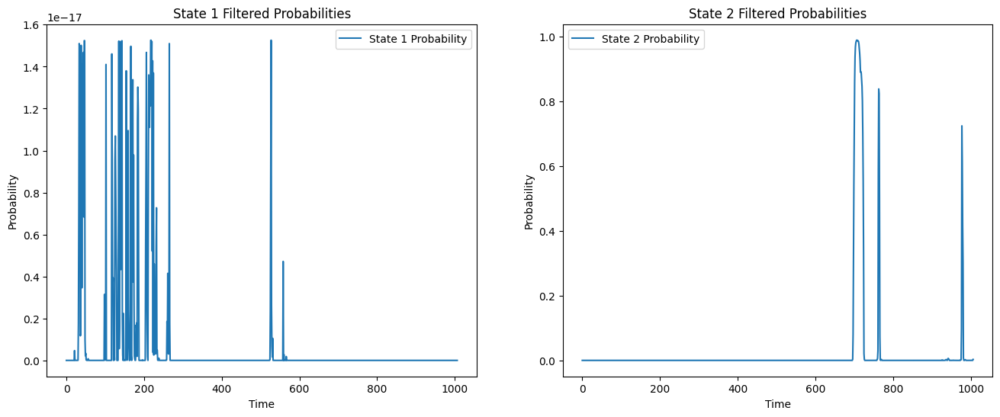

Iteration 33: Max Diff = 59.88597555587066
mu_hat0: [4.0399632  4.40915443 3.96769307 4.57237677]
mu_hat1: [4.03926249 4.40956787 3.96811813 4.57238345]
sigma_hat0: [0.01059525 0.01792278 0.309539   0.11079268]
sigma_hat1: [0.00990907 0.01779608 0.30967833 0.11079281]
P_hat0: [[3.83959552e-004 0.00000000e+000 9.99616040e-001 4.68929954e-141]
 [0.00000000e+000 8.94286120e-001 7.00686890e-002 3.56451912e-002]
 [1.47816638e-017 2.63341618e-003 9.97366584e-001 2.34278841e-016]
 [4.94276419e-238 4.82821325e-003 1.59378381e-006 9.95170193e-001]]
P_hat1: [[1.96044793e-004 0.00000000e+000 9.99803955e-001 1.04528322e-151]
 [0.00000000e+000 8.91488936e-001 7.19027190e-002 3.66083451e-002]
 [1.02686887e-018 2.63035542e-003 9.97369645e-001 2.84216473e-016]
 [4.14649271e-259 4.82315914e-003 7.73309879e-006 9.95169108e-001]]


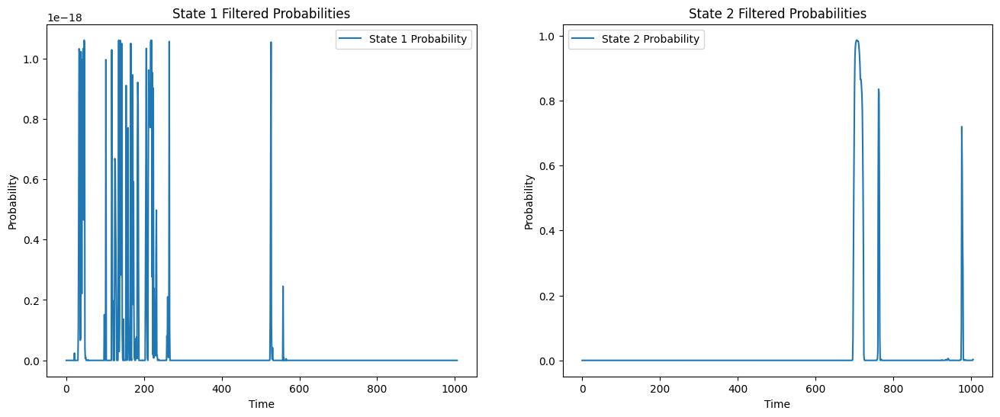

Iteration 34: Max Diff = 37.82830391029884
mu_hat0: [4.03926249 4.40956787 3.96811813 4.57238345]
mu_hat1: [4.03859592 4.40984174 3.96840613 4.57238909]
sigma_hat0: [0.00990907 0.01779608 0.30967833 0.11079281]
sigma_hat1: [0.00916355 0.01771776 0.30977335 0.11079328]
P_hat0: [[1.96044793e-004 0.00000000e+000 9.99803955e-001 1.04528322e-151]
 [0.00000000e+000 8.91488936e-001 7.19027190e-002 3.66083451e-002]
 [1.02686887e-018 2.63035542e-003 9.97369645e-001 2.84216473e-016]
 [4.14649271e-259 4.82315914e-003 7.73309879e-006 9.95169108e-001]]
P_hat1: [[9.76535201e-005 0.00000000e+000 9.99902346e-001 1.05768267e-161]
 [0.00000000e+000 8.89729599e-001 7.29789678e-002 3.72914330e-002]
 [6.75485621e-020 2.62824077e-003 9.97371759e-001 3.40352675e-016]
 [3.69265113e-280 4.79304102e-003 3.93056721e-005 9.95167653e-001]]


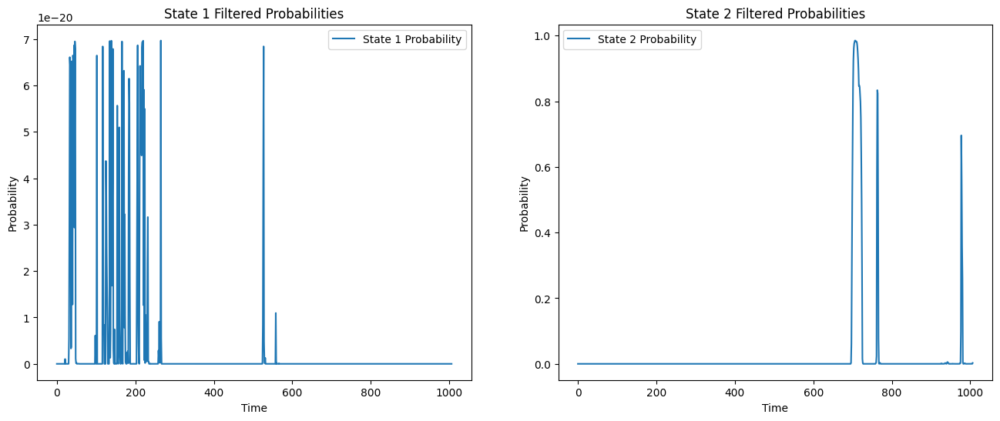

Iteration 35: Max Diff = 15.848153553894127
mu_hat0: [4.03859592 4.40984174 3.96840613 4.57238909]
mu_hat1: [4.03799983 4.410069   3.96864106 4.57238621]
sigma_hat0: [0.00916355 0.01771776 0.30977335 0.11079328]
sigma_hat1: [0.00839028 0.01764969 0.30985187 0.11080005]
P_hat0: [[9.76535201e-005 0.00000000e+000 9.99902346e-001 1.05768267e-161]
 [0.00000000e+000 8.89729599e-001 7.29789678e-002 3.72914330e-002]
 [6.75485621e-020 2.62824077e-003 9.97371759e-001 3.40352675e-016]
 [3.69265113e-280 4.79304102e-003 3.93056721e-005 9.95167653e-001]]
P_hat1: [[4.69384324e-005 0.00000000e+000 9.99953062e-001 5.10074948e-171]
 [0.00000000e+000 8.89301981e-001 7.28284363e-002 3.78695829e-002]
 [4.17371592e-021 2.62646630e-003 9.97373534e-001 4.03631238e-016]
 [3.41822626e-301 4.63193002e-003 2.01073904e-004 9.95166996e-001]]


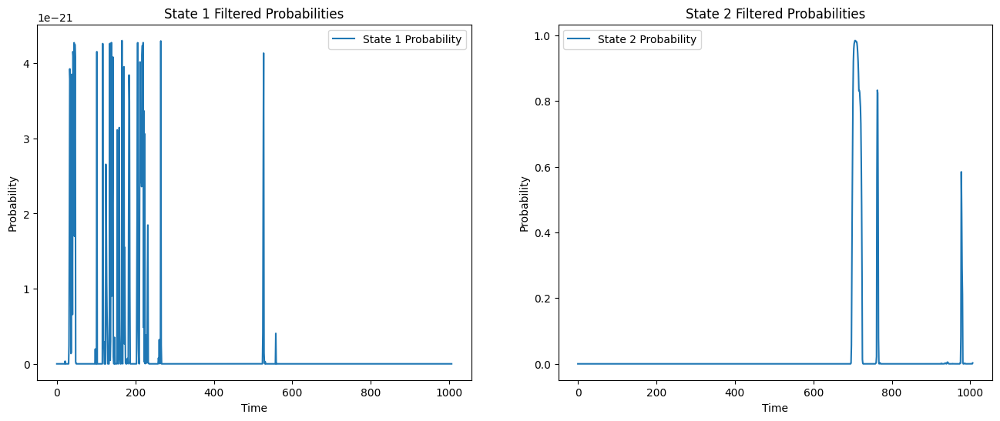

Iteration 36: Max Diff = 99.55693455229492
mu_hat0: [4.03799983 4.410069   3.96864106 4.57238621]
mu_hat1: [4.03750955 4.41041622 3.96897022 4.57235303]
sigma_hat0: [0.00839028 0.01764969 0.30985187 0.11080005]
sigma_hat1: [0.00763589 0.01752841 0.30996496 0.11083379]
P_hat0: [[4.69384324e-005 0.00000000e+000 9.99953062e-001 5.10074948e-171]
 [0.00000000e+000 8.89301981e-001 7.28284363e-002 3.78695829e-002]
 [4.17371592e-021 2.62646630e-003 9.97373534e-001 4.03631238e-016]
 [3.41822626e-301 4.63193002e-003 2.01073904e-004 9.95166996e-001]]
P_hat1: [[2.14776321e-005 0.00000000e+000 9.99978522e-001 1.19214974e-179]
 [0.00000000e+000 8.92674935e-001 6.86113070e-002 3.87137579e-002]
 [2.40347921e-022 2.62392775e-003 9.97376072e-001 4.73981215e-016]
 [0.00000000e+000 3.89921196e-003 9.31688858e-004 9.95169099e-001]]


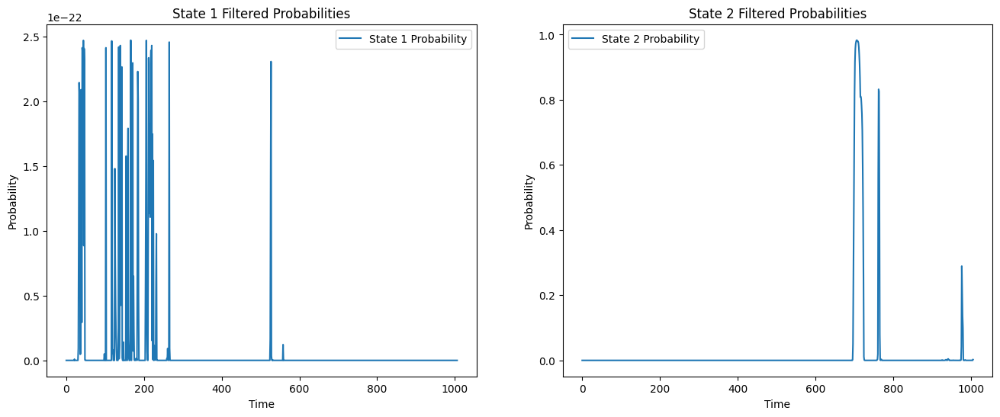

Iteration 37: Max Diff = 298.31803686814266
mu_hat0: [4.03750955 4.41041622 3.96897022 4.57235303]
mu_hat1: [4.03714568 4.41116112 3.96961927 4.57226102]
sigma_hat0: [0.00763589 0.01752841 0.30996496 0.11083379]
sigma_hat1: [0.00694875 0.01723189 0.31019028 0.11092283]
P_hat0: [[2.14776321e-005 0.00000000e+000 9.99978522e-001 1.19214974e-179]
 [0.00000000e+000 8.92674935e-001 6.86113070e-002 3.87137579e-002]
 [2.40347921e-022 2.62392775e-003 9.97376072e-001 4.73981215e-016]
 [0.00000000e+000 3.89921196e-003 9.31688858e-004 9.95169099e-001]]
P_hat1: [[9.22410765e-006 0.00000000e+000 9.99990776e-001 1.24908895e-187]
 [0.00000000e+000 9.03892862e-001 5.56500637e-002 4.04570740e-002]
 [1.28190178e-023 2.61795323e-003 9.97382047e-001 5.45656926e-016]
 [0.00000000e+000 1.96278145e-003 2.85597816e-003 9.95181240e-001]]


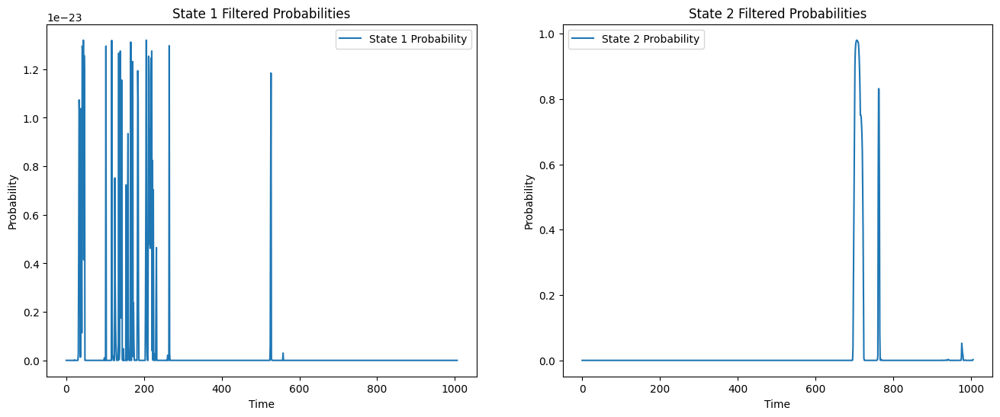

Iteration 38: Max Diff = 243.80643190956846
mu_hat0: [4.03714568 4.41116112 3.96961927 4.57226102]
mu_hat1: [4.03690565 4.41209987 3.97044845 4.5721956 ]
sigma_hat0: [0.00694875 0.01723189 0.31019028 0.11092283]
sigma_hat1: [0.00636003 0.01683566 0.3104723  0.1109918 ]
P_hat0: [[9.22410765e-006 0.00000000e+000 9.99990776e-001 1.24908895e-187]
 [0.00000000e+000 9.03892862e-001 5.56500637e-002 4.04570740e-002]
 [1.28190178e-023 2.61795323e-003 9.97382047e-001 5.45656926e-016]
 [0.00000000e+000 1.96278145e-003 2.85597816e-003 9.95181240e-001]]
P_hat1: [[3.67605471e-006 0.00000000e+000 9.99996324e-001 3.99508301e-195]
 [0.00000000e+000 9.12155886e-001 4.50581158e-002 4.27859981e-002]
 [6.31780475e-025 2.60493183e-003 9.97395068e-001 6.03199036e-016]
 [0.00000000e+000 3.82977261e-004 4.40896385e-003 9.95208059e-001]]


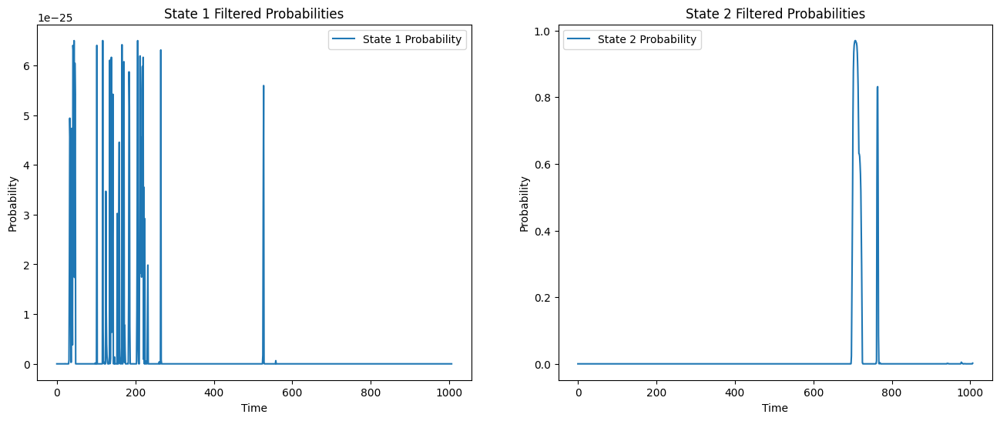

Iteration 39: Max Diff = 73.1457177008006
mu_hat0: [4.03690565 4.41209987 3.97044845 4.5721956 ]
mu_hat1: [4.03676938 4.41308027 3.97141939 4.57219195]
sigma_hat0: [0.00636003 0.01683566 0.3104723  0.1109918 ]
sigma_hat1: [0.00587505 0.01640135 0.31079521 0.11100366]
P_hat0: [[3.67605471e-006 0.00000000e+000 9.99996324e-001 3.99508301e-195]
 [0.00000000e+000 9.12155886e-001 4.50581158e-002 4.27859981e-002]
 [6.31780475e-025 2.60493183e-003 9.97395068e-001 6.03199036e-016]
 [0.00000000e+000 3.82977261e-004 4.40896385e-003 9.95208059e-001]]
P_hat1: [[1.35134439e-006 0.00000000e+000 9.99998649e-001 1.97663379e-202]
 [0.00000000e+000 9.09055670e-001 4.48671181e-002 4.60772116e-002]
 [2.88361944e-026 2.58392435e-003 9.97416076e-001 6.46161598e-016]
 [0.00000000e+000 4.02370410e-005 4.74383812e-003 9.95215925e-001]]


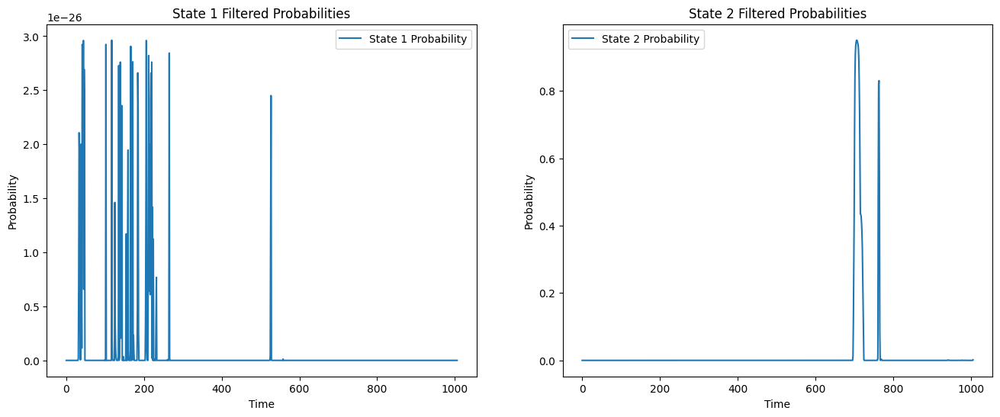

Iteration 40: Max Diff = 202.73738618707742
mu_hat0: [4.03676938 4.41308027 3.97141939 4.57219195]
mu_hat1: [4.03671229 4.41452652 3.97278429 4.5722047 ]
sigma_hat0: [0.00587505 0.01640135 0.31079521 0.11100366]
sigma_hat1: [0.00548064 0.01561924 0.31124586 0.11100118]
P_hat0: [[1.35134439e-006 0.00000000e+000 9.99998649e-001 1.97663379e-202]
 [0.00000000e+000 9.09055670e-001 4.48671181e-002 4.60772116e-002]
 [2.88361944e-026 2.58392435e-003 9.97416076e-001 6.46161598e-016]
 [0.00000000e+000 4.02370410e-005 4.74383812e-003 9.95215925e-001]]
P_hat1: [[4.57831373e-007 0.00000000e+000 9.99999542e-001 1.04618120e-209]
 [0.00000000e+000 8.98998419e-001 4.90669985e-002 5.19345824e-002]
 [1.22480613e-027 2.55318546e-003 9.97446815e-001 6.82172801e-016]
 [0.00000000e+000 3.49981983e-006 4.79182380e-003 9.95204676e-001]]


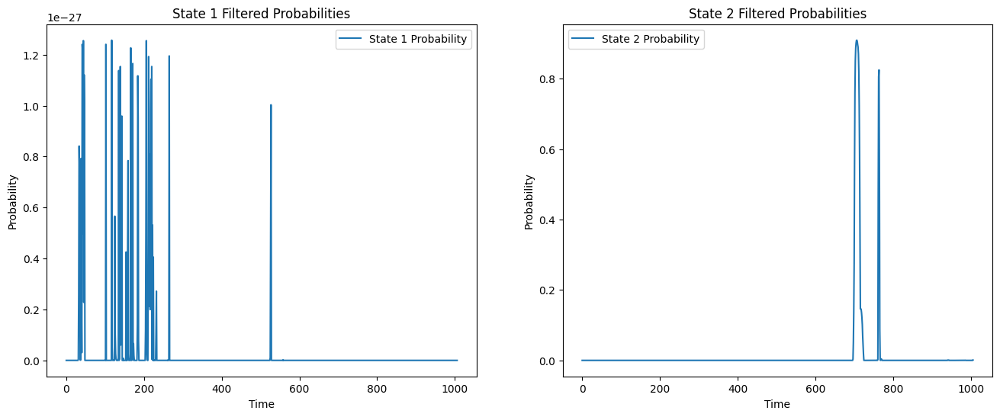

Iteration 41: Max Diff = 410.8876587285583
mu_hat0: [4.03671229 4.41452652 3.97278429 4.5722047 ]
mu_hat1: [4.03671405 4.41714492 3.97480463 4.57222359]
sigma_hat0: [0.00548064 0.01561924 0.31124586 0.11100118]
sigma_hat1: [0.00515689 0.01366742 0.31190777 0.11099543]
P_hat0: [[4.57831373e-007 0.00000000e+000 9.99999542e-001 1.04618120e-209]
 [0.00000000e+000 8.98998419e-001 4.90669985e-002 5.19345824e-002]
 [1.22480613e-027 2.55318546e-003 9.97446815e-001 6.82172801e-016]
 [0.00000000e+000 3.49981983e-006 4.79182380e-003 9.95204676e-001]]
P_hat1: [[1.43214036e-007 0.00000000e+000 9.99999857e-001 5.55639052e-217]
 [0.00000000e+000 8.78536834e-001 5.75062246e-002 6.39569414e-002]
 [4.86665286e-029 2.48969522e-003 9.97510305e-001 7.26079270e-016]
 [0.00000000e+000 2.58898589e-007 4.81081671e-003 9.95188924e-001]]


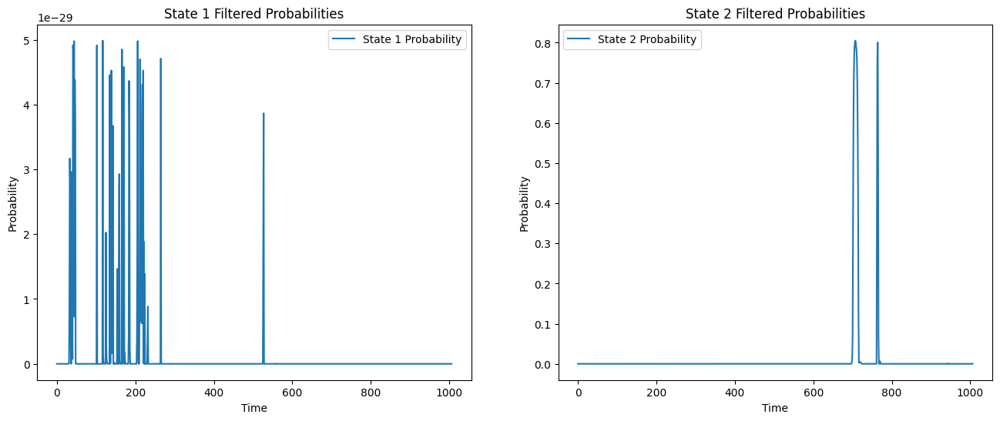

Iteration 42: Max Diff = 540.0079202857816
mu_hat0: [4.03671405 4.41714492 3.97480463 4.57222359]
mu_hat1: [4.03676065 4.41970926 3.97681984 4.572252  ]
sigma_hat0: [0.00515689 0.01366742 0.31190777 0.11099543]
sigma_hat1: [0.00488422 0.01104506 0.31257909 0.11098445]
P_hat0: [[1.43214036e-007 0.00000000e+000 9.99999857e-001 5.55639052e-217]
 [0.00000000e+000 8.78536834e-001 5.75062246e-002 6.39569414e-002]
 [4.86665286e-029 2.48969522e-003 9.97510305e-001 7.26079270e-016]
 [0.00000000e+000 2.58898589e-007 4.81081671e-003 9.95188924e-001]]
P_hat1: [[4.14502708e-008 0.00000000e+000 9.99999959e-001 2.94370436e-224]
 [0.00000000e+000 8.51688640e-001 6.56521366e-002 8.26592231e-002]
 [1.82027905e-030 2.34219514e-003 9.97657805e-001 9.15985098e-016]
 [0.00000000e+000 1.34705833e-008 4.81541725e-003 9.95184569e-001]]


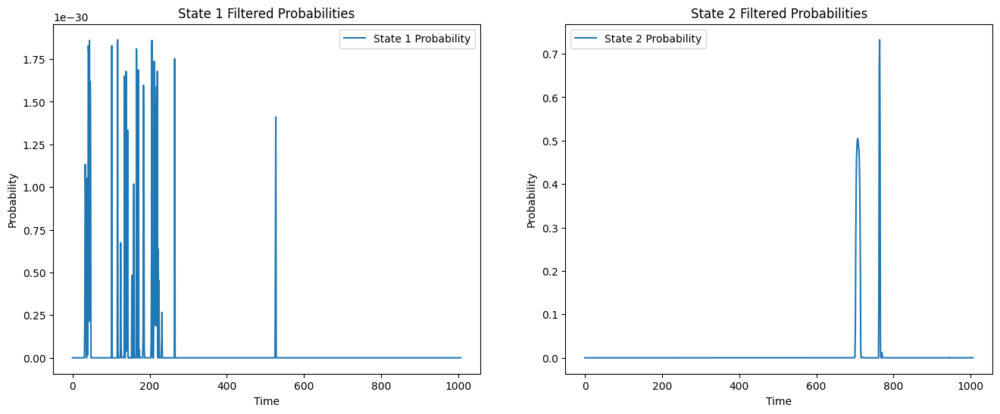

Iteration 43: Max Diff = 1013.1818229251921
mu_hat0: [4.03676065 4.41970926 3.97681984 4.572252  ]
mu_hat1: [4.03684334 4.42047526 3.9794281  4.57228153]
sigma_hat0: [0.00488422 0.01104506 0.31257909 0.11098445]
sigma_hat1: [0.00464553 0.0099511  0.31348768 0.11097215]
P_hat0: [[4.14502708e-008 0.00000000e+000 9.99999959e-001 2.94370436e-224]
 [0.00000000e+000 8.51688640e-001 6.56521366e-002 8.26592231e-002]
 [1.82027905e-030 2.34219514e-003 9.97657805e-001 9.15985098e-016]
 [0.00000000e+000 1.34705833e-008 4.81541725e-003 9.95184569e-001]]
P_hat1: [[1.11161112e-008 0.00000000e+000 9.99999989e-001 1.55035328e-231]
 [0.00000000e+000 8.01434595e-001 6.70570063e-002 1.31508399e-001]
 [6.43500249e-032 1.95242768e-003 9.98047572e-001 1.80168636e-015]
 [0.00000000e+000 4.48571820e-010 4.80018212e-003 9.95199817e-001]]


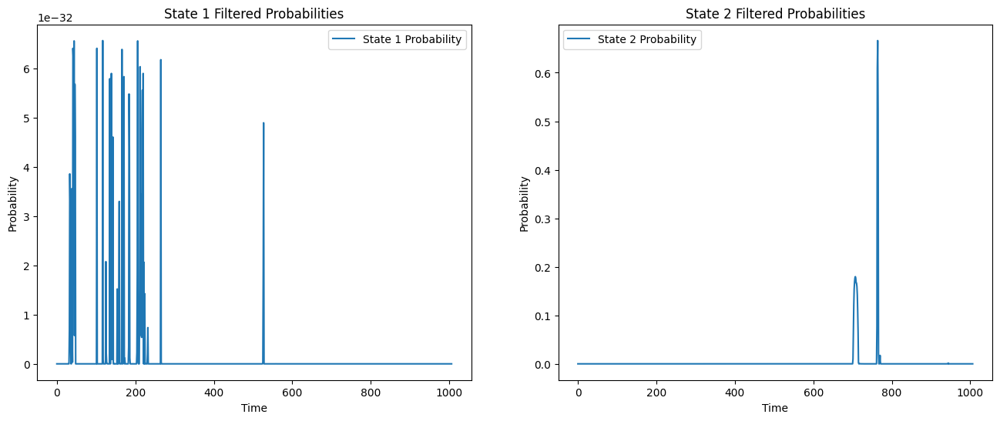

Iteration 44: Max Diff = 2725.6955827425145
mu_hat0: [4.03684334 4.42047526 3.9794281  4.57228153]
mu_hat1: [4.0369566  4.41933603 3.98167599 4.57233546]
sigma_hat0: [0.00464553 0.0099511  0.31348768 0.11097215]
sigma_hat1: [0.00442611 0.00981617 0.31426838 0.11095397]
P_hat0: [[1.11161112e-008 0.00000000e+000 9.99999989e-001 1.55035328e-231]
 [0.00000000e+000 8.01434595e-001 6.70570063e-002 1.31508399e-001]
 [6.43500249e-032 1.95242768e-003 9.98047572e-001 1.80168636e-015]
 [0.00000000e+000 4.48571820e-010 4.80018212e-003 9.95199817e-001]]
P_hat1: [[2.75901982e-009 0.00000000e+000 9.99999997e-001 8.08353351e-239]
 [0.00000000e+000 6.81414579e-001 5.12376541e-002 2.67347767e-001]
 [2.15824991e-033 1.52630718e-003 9.98473693e-001 3.87983937e-015]
 [0.00000000e+000 1.40951554e-011 4.78090047e-003 9.95219100e-001]]


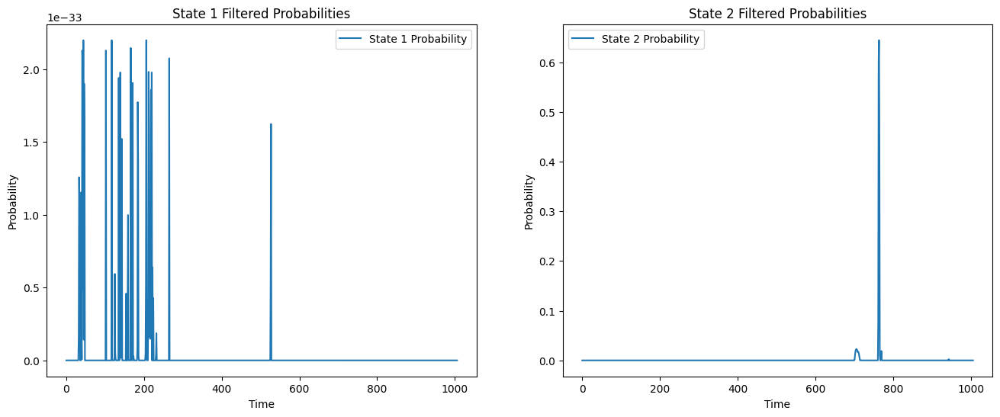

Iteration 45: Max Diff = 4581.939602576335
mu_hat0: [4.0369566  4.41933603 3.98167599 4.57233546]
mu_hat1: [4.03709729 4.41611737 3.98264776 4.57233382]
sigma_hat0: [0.00442611 0.00981617 0.31426838 0.11095397]
sigma_hat1: [0.00421281 0.00945446 0.31460305 0.1109498 ]
P_hat0: [[2.75901982e-009 0.00000000e+000 9.99999997e-001 8.08353351e-239]
 [0.00000000e+000 6.81414579e-001 5.12376541e-002 2.67347767e-001]
 [2.15824991e-033 1.52630718e-003 9.98473693e-001 3.87983937e-015]
 [0.00000000e+000 1.40951554e-011 4.78090047e-003 9.95219100e-001]]
P_hat1: [[6.31845459e-010 0.00000000e+000 9.99999999e-001 4.16477321e-246]
 [0.00000000e+000 4.89977487e-001 1.38092139e-002 4.96213299e-001]
 [6.90169483e-035 1.30956857e-003 9.98690431e-001 5.80015290e-015]
 [0.00000000e+000 6.12950217e-013 4.76619364e-003 9.95233806e-001]]


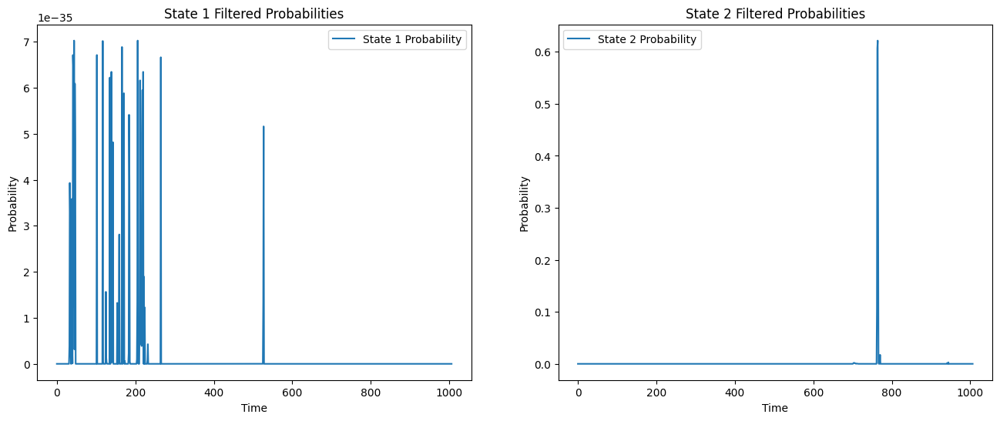

Iteration 46: Max Diff = 2179.2172863788874
mu_hat0: [4.03709729 4.41611737 3.98264776 4.57233382]
mu_hat1: [4.03726358 4.41369911 3.98273475 4.57218717]
sigma_hat0: [0.00421281 0.00945446 0.31460305 0.1109498 ]
sigma_hat1: [0.00399303 0.00848994 0.31463387 0.11098949]
P_hat0: [[6.31845459e-010 0.00000000e+000 9.99999999e-001 4.16477321e-246]
 [0.00000000e+000 4.89977487e-001 1.38092139e-002 4.96213299e-001]
 [6.90169483e-035 1.30956857e-003 9.98690431e-001 5.80015290e-015]
 [0.00000000e+000 6.12950217e-013 4.76619364e-003 9.95233806e-001]]
P_hat1: [[1.32777202e-010 0.00000000e+000 1.00000000e+000 2.13781011e-253]
 [0.00000000e+000 3.94070514e-001 8.03062553e-004 6.05126424e-001]
 [2.11058666e-036 1.27367284e-003 9.98726327e-001 6.18132759e-015]
 [0.00000000e+000 3.30746530e-014 4.75435007e-003 9.95245650e-001]]


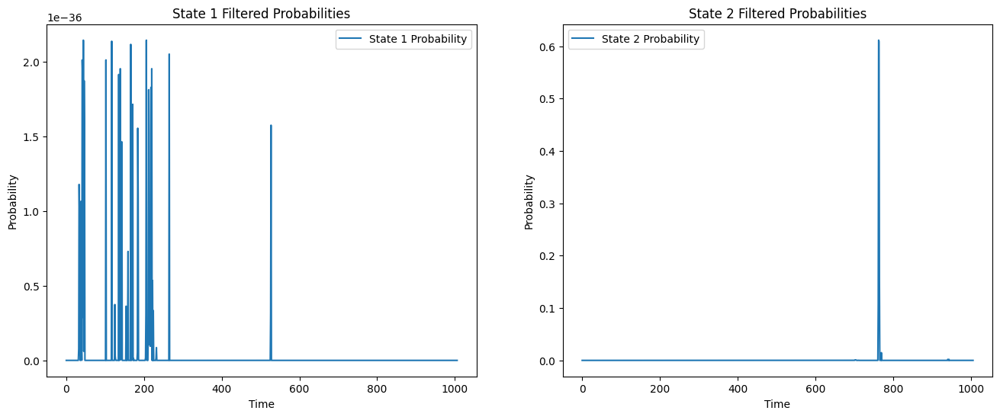

Iteration 47: Max Diff = 1242.236184691412
mu_hat0: [4.03726358 4.41369911 3.98273475 4.57218717]
mu_hat1: [4.03745367 4.41225209 3.98269633 4.57202829]
sigma_hat0: [0.00399303 0.00848994 0.31463387 0.11098949]
sigma_hat1: [0.00375408 0.00739399 0.31462135 0.11103713]
P_hat0: [[1.32777202e-010 0.00000000e+000 1.00000000e+000 2.13781011e-253]
 [0.00000000e+000 3.94070514e-001 8.03062553e-004 6.05126424e-001]
 [2.11058666e-036 1.27367284e-003 9.98726327e-001 6.18132759e-015]
 [0.00000000e+000 3.30746530e-014 4.75435007e-003 9.95245650e-001]]
P_hat1: [[2.53632813e-011 0.00000000e+000 1.00000000e+000 1.11242278e-260]
 [0.00000000e+000 3.32746625e-001 2.88217500e-005 6.67224553e-001]
 [6.16328885e-038 1.27065563e-003 9.98729344e-001 6.61823056e-015]
 [0.00000000e+000 1.61942723e-015 4.74368742e-003 9.95256313e-001]]


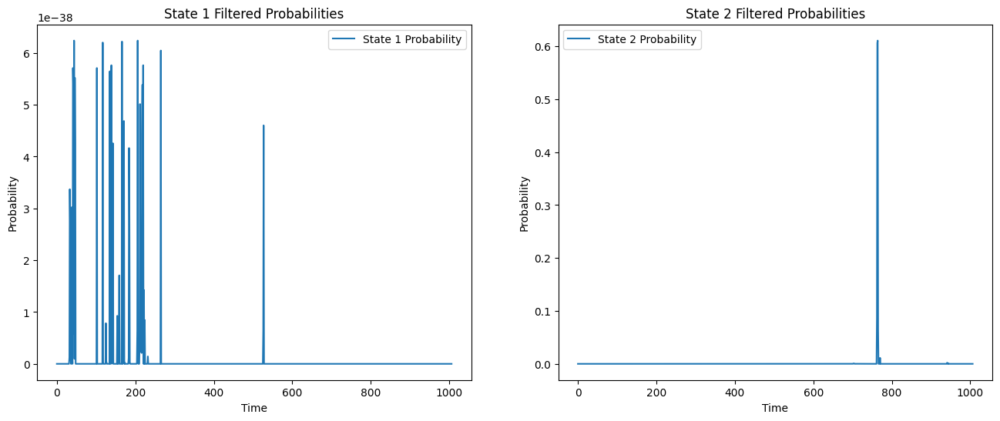

Iteration 48: Max Diff = 1149.0560027244862
mu_hat0: [4.03745367 4.41225209 3.98269633 4.57202829]
mu_hat1: [4.03766414 4.41134628 3.98267426 4.57191688]
sigma_hat0: [0.00375408 0.00739399 0.31462135 0.11103713]
sigma_hat1: [0.00348333 0.00607177 0.31461333 0.11107031]
P_hat0: [[2.53632813e-011 0.00000000e+000 1.00000000e+000 1.11242278e-260]
 [0.00000000e+000 3.32746625e-001 2.88217500e-005 6.67224553e-001]
 [6.16328885e-038 1.27065563e-003 9.98729344e-001 6.61823056e-015]
 [0.00000000e+000 1.61942723e-015 4.74368742e-003 9.95256313e-001]]
P_hat1: [[4.34529273e-012 0.00000000e+000 1.00000000e+000 5.88750215e-268]
 [0.00000000e+000 2.75332803e-001 8.00069231e-007 7.24666397e-001]
 [1.70959770e-039 1.26909731e-003 9.98730903e-001 7.71257782e-015]
 [0.00000000e+000 6.81601680e-017 4.73428959e-003 9.95265710e-001]]


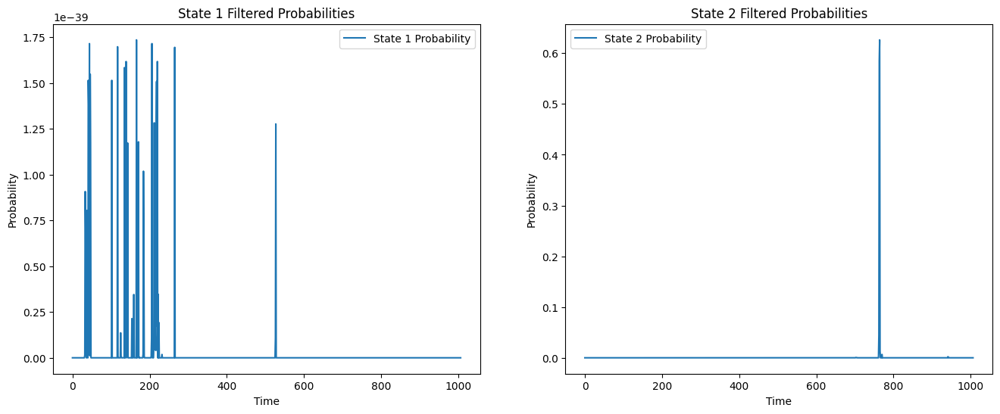

Iteration 49: Max Diff = 1184.1846817015924
mu_hat0: [4.03766414 4.41134628 3.98267426 4.57191688]
mu_hat1: [4.03788726 4.41097393 3.98268056 4.5718555 ]
sigma_hat0: [0.00348333 0.00607177 0.31461333 0.11107031]
sigma_hat1: [0.00317116 0.00451017 0.31461359 0.11108651]
P_hat0: [[4.34529273e-012 0.00000000e+000 1.00000000e+000 5.88750215e-268]
 [0.00000000e+000 2.75332803e-001 8.00069231e-007 7.24666397e-001]
 [1.70959770e-039 1.26909731e-003 9.98730903e-001 7.71257782e-015]
 [0.00000000e+000 6.81601680e-017 4.73428959e-003 9.95265710e-001]]
P_hat1: [[6.57637343e-13 0.00000000e+00 1.00000000e+00 0.00000000e+00]
 [0.00000000e+00 2.16133484e-01 1.74019042e-08 7.83866498e-01]
 [4.46585660e-41 1.26757572e-03 9.98732424e-01 1.01499205e-14]
 [0.00000000e+00 2.28485452e-18 4.72667815e-03 9.95273322e-01]]


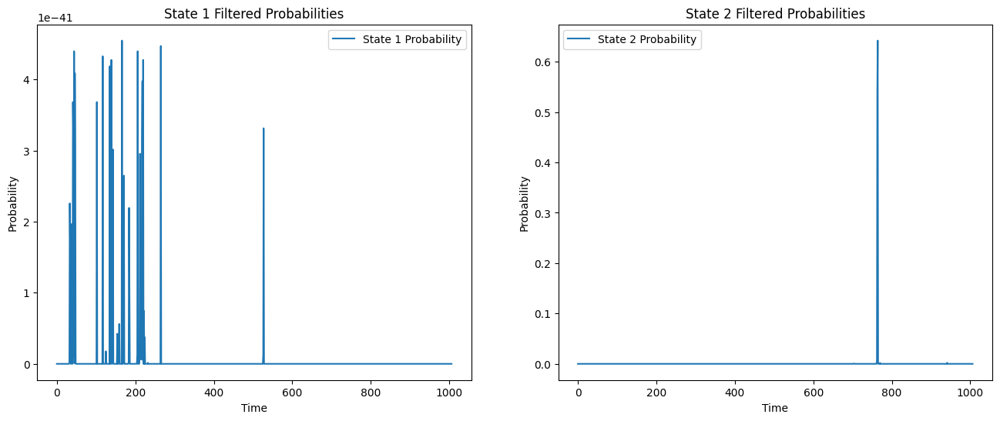

Iteration 50: Max Diff = 1138.0564087632972
mu_hat0: [4.03788726 4.41097393 3.98268056 4.5718555 ]
mu_hat1: [4.03810752 4.41100874 3.98271177 4.57184028]
sigma_hat0: [0.00317116 0.00451017 0.31461359 0.11108651]
sigma_hat1: [0.00282039 0.00333652 0.31462173 0.11108781]
P_hat0: [[6.57637343e-13 0.00000000e+00 1.00000000e+00 0.00000000e+00]
 [0.00000000e+00 2.16133484e-01 1.74019042e-08 7.83866498e-01]
 [4.46585660e-41 1.26757572e-03 9.98732424e-01 1.01499205e-14]
 [0.00000000e+00 2.28485452e-18 4.72667815e-03 9.95273322e-01]]
P_hat1: [[8.69353384e-14 0.00000000e+00 1.00000000e+00 0.00000000e+00]
 [0.00000000e+00 1.59236271e-01 2.83509637e-10 8.40763728e-01]
 [1.08555671e-42 1.26644445e-03 9.98733556e-01 1.57533364e-14]
 [0.00000000e+00 5.49012947e-20 4.72221930e-03 9.95277781e-01]]


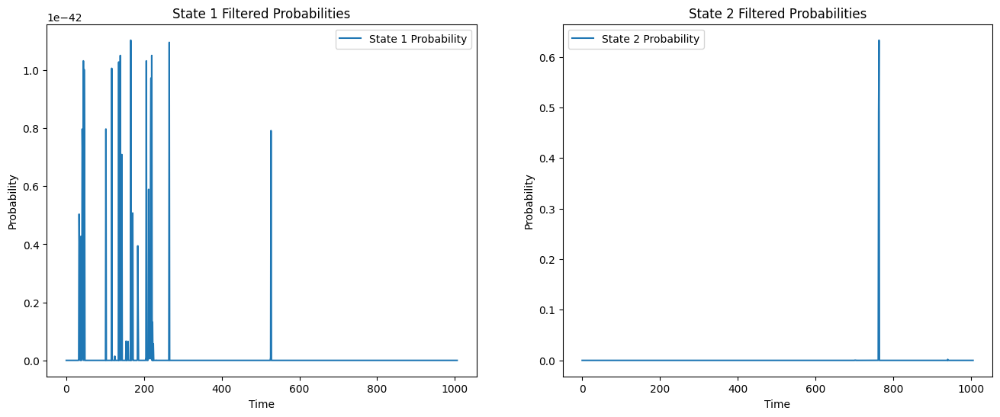

Iteration 51: Max Diff = 1024.5996615607626
mu_hat0: [4.03810752 4.41100874 3.98271177 4.57184028]
mu_hat1: [4.03830335 4.4109261  3.98273975 4.57182873]
sigma_hat0: [0.00282039 0.00333652 0.31462173 0.11108781]
sigma_hat1: [0.0024615  0.00313381 0.31463027 0.11109127]
P_hat0: [[8.69353384e-14 0.00000000e+00 1.00000000e+00 0.00000000e+00]
 [0.00000000e+00 1.59236271e-01 2.83509637e-10 8.40763728e-01]
 [1.08555671e-42 1.26644445e-03 9.98733556e-01 1.57533364e-14]
 [0.00000000e+00 5.49012947e-20 4.72221930e-03 9.95277781e-01]]
P_hat1: [[1.00441450e-14 0.00000000e+00 1.00000000e+00 0.00000000e+00]
 [0.00000000e+00 1.08008948e-01 3.62794244e-12 8.91991052e-01]
 [2.42064475e-44 1.26589512e-03 9.98734105e-01 3.02906118e-14]
 [0.00000000e+00 9.10594473e-22 4.72010911e-03 9.95279891e-01]]


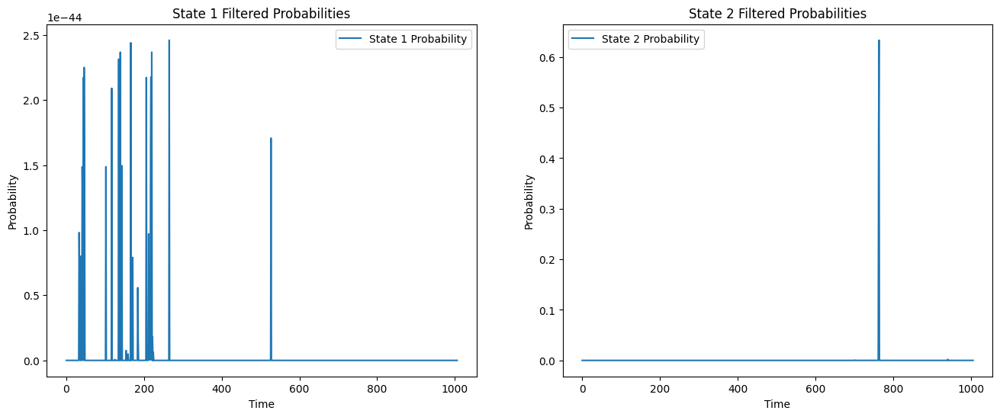

Iteration 52: Max Diff = 677.3578242653773
mu_hat0: [4.03830335 4.4109261  3.98273975 4.57182873]
mu_hat1: [4.03846349 4.41078961 3.98276224 4.57182906]
sigma_hat0: [0.0024615  0.00313381 0.31463027 0.11109127]
sigma_hat1: [0.00214692 0.00310896 0.31463748 0.11109104]
P_hat0: [[1.00441450e-14 0.00000000e+00 1.00000000e+00 0.00000000e+00]
 [0.00000000e+00 1.08008948e-01 3.62794244e-12 8.91991052e-01]
 [2.42064475e-44 1.26589512e-03 9.98734105e-01 3.02906118e-14]
 [0.00000000e+00 9.10594473e-22 4.72010911e-03 9.95279891e-01]]
P_hat1: [[1.02887670e-15 0.00000000e+00 1.00000000e+00 0.00000000e+00]
 [0.00000000e+00 7.41413278e-02 4.37647105e-14 9.25858672e-01]
 [4.88937039e-46 1.26589888e-03 9.98734101e-01 6.08167207e-14]
 [0.00000000e+00 1.46078009e-23 4.72037633e-03 9.95279624e-01]]


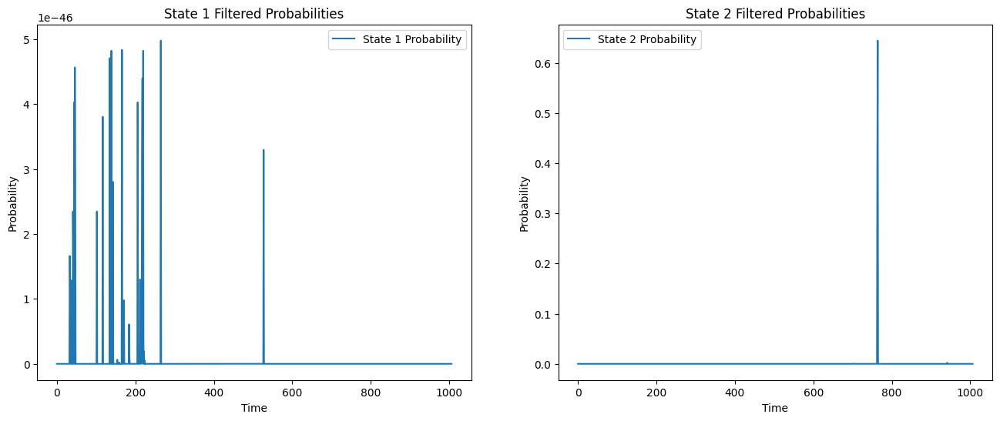

Iteration 53: Max Diff = 439.6214819923448
mu_hat0: [4.03846349 4.41078961 3.98276224 4.57182906]
mu_hat1: [4.03859951 4.41063584 3.98278253 4.5718386 ]
sigma_hat0: [0.00214692 0.00310896 0.31463748 0.11109104]
sigma_hat1: [0.00190284 0.00307762 0.31464399 0.11108717]
P_hat0: [[1.02887670e-15 0.00000000e+00 1.00000000e+00 0.00000000e+00]
 [0.00000000e+00 7.41413278e-02 4.37647105e-14 9.25858672e-01]
 [4.88937039e-46 1.26589888e-03 9.98734101e-01 6.08167207e-14]
 [0.00000000e+00 1.46078009e-23 4.72037633e-03 9.95279624e-01]]
P_hat1: [[9.58041092e-17 0.00000000e+00 1.00000000e+00 0.00000000e+00]
 [0.00000000e+00 5.21612272e-02 5.16741061e-16 9.47838773e-01]
 [8.92074508e-48 1.26599971e-03 9.98734000e-01 1.21424478e-13]
 [0.00000000e+00 2.45189756e-25 4.72124904e-03 9.95278751e-01]]


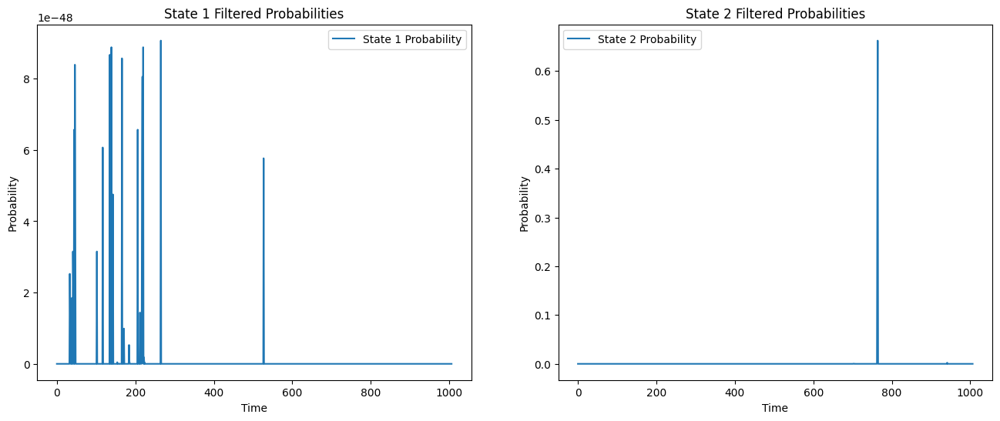

Iteration 54: Max Diff = 310.7298205417354
mu_hat0: [4.03859951 4.41063584 3.98278253 4.5718386 ]
mu_hat1: [4.03872693 4.41046254 3.98280266 4.57185404]
sigma_hat0: [0.00190284 0.00307762 0.31464399 0.11108717]
sigma_hat1: [0.00171371 0.00303262 0.31465046 0.11108097]
P_hat0: [[9.58041092e-17 0.00000000e+00 1.00000000e+00 0.00000000e+00]
 [0.00000000e+00 5.21612272e-02 5.16741061e-16 9.47838773e-01]
 [8.92074508e-48 1.26599971e-03 9.98734000e-01 1.21424478e-13]
 [0.00000000e+00 2.45189756e-25 4.72124904e-03 9.95278751e-01]]
P_hat1: [[8.42193234e-18 0.00000000e+00 1.00000000e+00 0.00000000e+00]
 [0.00000000e+00 3.66257335e-02 5.95027264e-18 9.63374267e-01]
 [1.48364984e-49 1.26606974e-03 9.98733930e-01 2.42557529e-13]
 [0.00000000e+00 4.25476453e-27 4.72217633e-03 9.95277824e-01]]


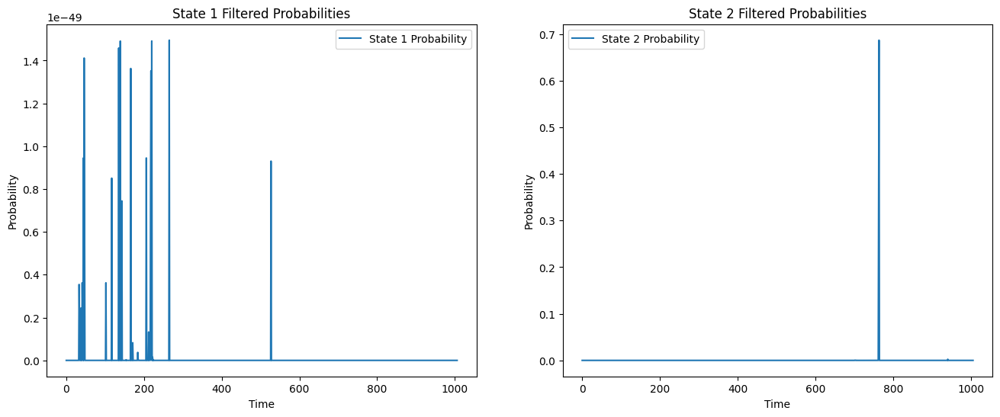

Iteration 55: Max Diff = 232.59322026482107
mu_hat0: [4.03872693 4.41046254 3.98280266 4.57185404]
mu_hat1: [4.03885171 4.41026243 3.98282407 4.57187485]
sigma_hat0: [0.00171371 0.00303262 0.31465046 0.11108097]
sigma_hat1: [0.00155519 0.00296723 0.31465734 0.11107266]
P_hat0: [[8.42193234e-18 0.00000000e+00 1.00000000e+00 0.00000000e+00]
 [0.00000000e+00 3.66257335e-02 5.95027264e-18 9.63374267e-01]
 [1.48364984e-49 1.26606974e-03 9.98733930e-01 2.42557529e-13]
 [0.00000000e+00 4.25476453e-27 4.72217633e-03 9.95277824e-01]]
P_hat1: [[7.28871586e-19 0.00000000e+00 1.00000000e+00 0.00000000e+00]
 [0.00000000e+00 2.49971297e-02 6.63252112e-20 9.75002870e-01]
 [2.27483274e-51 1.26611655e-03 9.98733883e-01 4.87515767e-13]
 [0.00000000e+00 7.57613571e-29 4.72318672e-03 9.95276813e-01]]


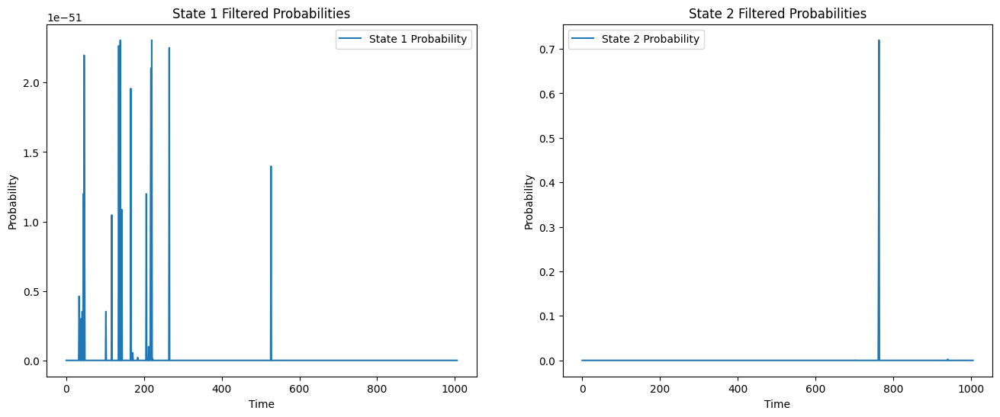

Iteration 56: Max Diff = 179.57624826176522
mu_hat0: [4.03885171 4.41026243 3.98282407 4.57187485]
mu_hat1: [4.03897321 4.41002226 3.98284837 4.57190206]
sigma_hat0: [0.00155519 0.00296723 0.31465734 0.11107266]
sigma_hat1: [0.00141074 0.00286842 0.31466515 0.11106181]
P_hat0: [[7.28871586e-19 0.00000000e+00 1.00000000e+00 0.00000000e+00]
 [0.00000000e+00 2.49971297e-02 6.63252112e-20 9.75002870e-01]
 [2.27483274e-51 1.26611655e-03 9.98733883e-01 4.87515767e-13]
 [0.00000000e+00 7.57613571e-29 4.72318672e-03 9.95276813e-01]]
P_hat1: [[6.41555116e-20 0.00000000e+00 1.00000000e+00 0.00000000e+00]
 [0.00000000e+00 1.60194900e-02 7.07109721e-22 9.83980510e-01]
 [3.23643114e-53 1.26614180e-03 9.98733858e-01 9.91857525e-13]
 [0.00000000e+00 1.37807677e-30 4.72433417e-03 9.95275666e-01]]


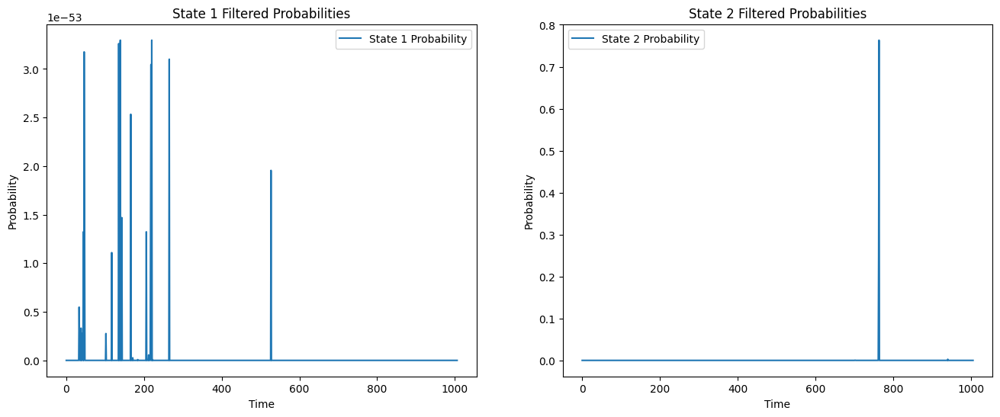

Iteration 57: Max Diff = 138.61839167698736
mu_hat0: [4.03897321 4.41002226 3.98284837 4.57190206]
mu_hat1: [4.03908745 4.40971828 3.98287795 4.57193846]
sigma_hat0: [0.00141074 0.00286842 0.31466515 0.11106181]
sigma_hat1: [0.00127214 0.0027079  0.31467466 0.11104731]
P_hat0: [[6.41555116e-20 0.00000000e+00 1.00000000e+00 0.00000000e+00]
 [0.00000000e+00 1.60194900e-02 7.07109721e-22 9.83980510e-01]
 [3.23643114e-53 1.26614180e-03 9.98733858e-01 9.91857525e-13]
 [0.00000000e+00 1.37807677e-30 4.72433417e-03 9.95275666e-01]]
P_hat1: [[5.84246573e-21 0.00000000e+00 1.00000000e+00 0.00000000e+00]
 [0.00000000e+00 9.08994089e-03 7.06136200e-24 9.90910059e-01]
 [4.27628508e-55 1.26613932e-03 9.98733861e-01 2.05933313e-12]
 [0.00000000e+00 2.55362249e-32 4.72570219e-03 9.95274298e-01]]


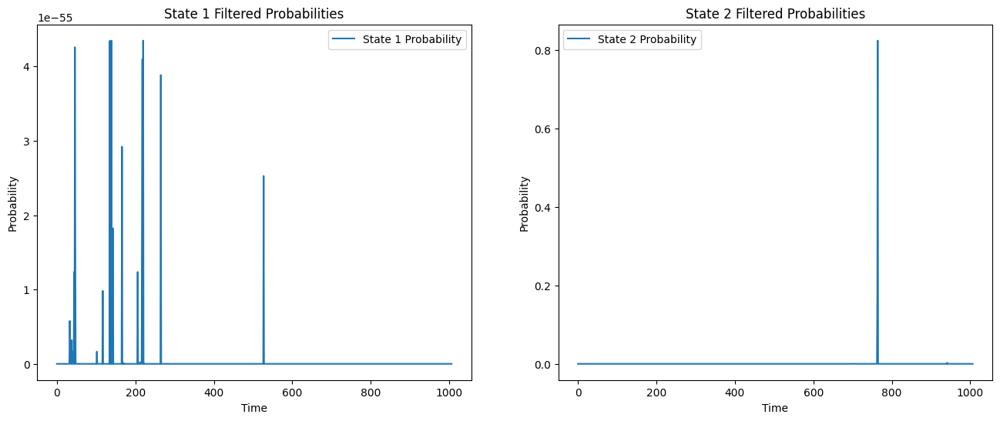

Iteration 58: Max Diff = 101.51169117883784
mu_hat0: [4.03908745 4.40971828 3.98287795 4.57193846]
mu_hat1: [4.03918856 4.40930796 3.98291681 4.5719895 ]
sigma_hat0: [0.00127214 0.0027079  0.31467466 0.11104731]
sigma_hat1: [0.00113702 0.00241499 0.31468716 0.11102698]
P_hat0: [[5.84246573e-21 0.00000000e+00 1.00000000e+00 0.00000000e+00]
 [0.00000000e+00 9.08994089e-03 7.06136200e-24 9.90910059e-01]
 [4.27628508e-55 1.26613932e-03 9.98733861e-01 2.05933313e-12]
 [0.00000000e+00 2.55362249e-32 4.72570219e-03 9.95274298e-01]]
P_hat1: [[5.50629987e-22 0.00000000e+00 1.00000000e+00 0.00000000e+00]
 [0.00000000e+00 4.01612500e-03 6.33548910e-26 9.95983875e-01]
 [5.23008020e-57 1.26609015e-03 9.98733910e-01 4.41683889e-12]
 [0.00000000e+00 4.81262156e-34 4.72742169e-03 9.95272578e-01]]


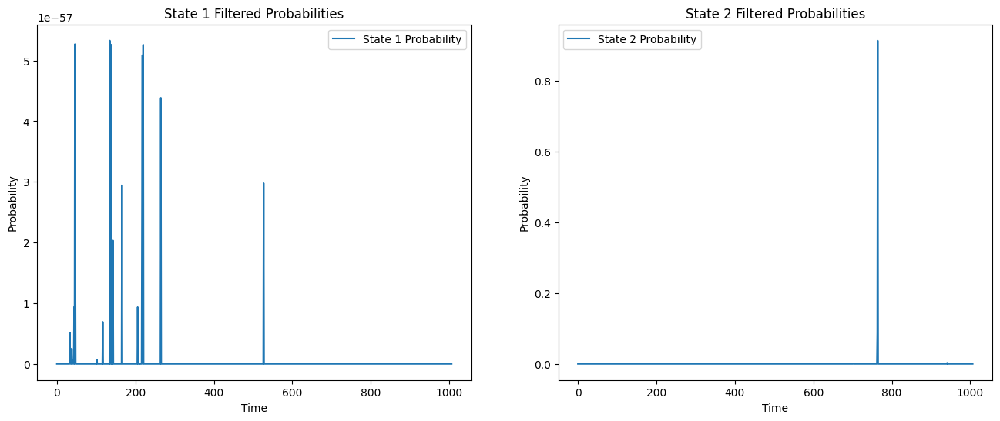

Iteration 59: Max Diff = 61.68954615634947
mu_hat0: [4.03918856 4.40930796 3.98291681 4.5719895 ]
mu_hat1: [4.03926988 4.4087379  3.98297006 4.57206247]
sigma_hat0: [0.00113702 0.00241499 0.31468716 0.11102698]
sigma_hat1: [0.0010063  0.00178635 0.31470428 0.11099791]
P_hat0: [[5.50629987e-22 0.00000000e+00 1.00000000e+00 0.00000000e+00]
 [0.00000000e+00 4.01612500e-03 6.33548910e-26 9.95983875e-01]
 [5.23008020e-57 1.26609015e-03 9.98733910e-01 4.41683889e-12]
 [0.00000000e+00 4.81262156e-34 4.72742169e-03 9.95272578e-01]]
P_hat1: [[5.27785166e-23 0.00000000e+00 1.00000000e+00 0.00000000e+00]
 [0.00000000e+00 9.33956102e-04 4.60529228e-28 9.99066044e-01]
 [5.88582847e-59 1.26594819e-03 9.98734052e-01 9.93373603e-12]
 [0.00000000e+00 9.19230639e-36 4.72958814e-03 9.95270412e-01]]


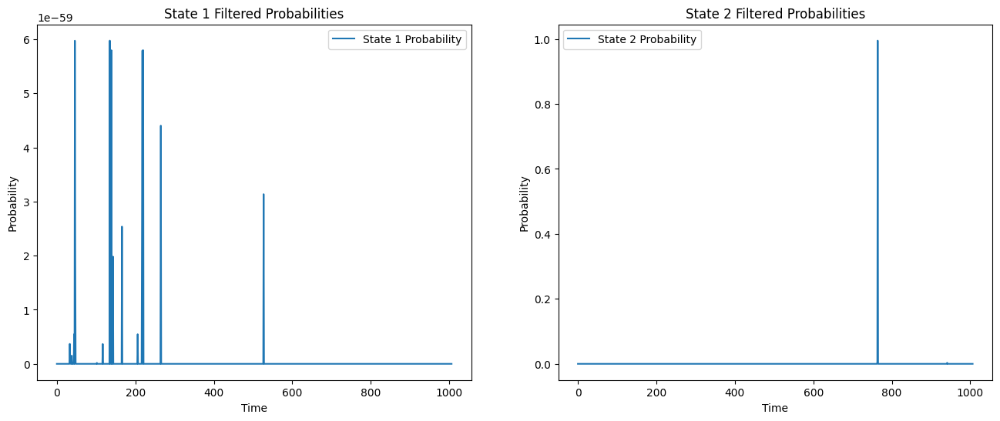

Iteration 60: Max Diff = 18.44809713861066
mu_hat0: [4.03926988 4.4087379  3.98297006 4.57206247]
mu_hat1: [4.03932481 4.40821502 3.98302072 4.57213322]
sigma_hat0: [0.0010063  0.00178635 0.31470428 0.11099791]
sigma_hat1: [0.0008824  0.00044761 0.31472058 0.11096979]
P_hat0: [[5.27785166e-23 0.00000000e+00 1.00000000e+00 0.00000000e+00]
 [0.00000000e+00 9.33956102e-04 4.60529228e-28 9.99066044e-01]
 [5.88582847e-59 1.26594819e-03 9.98734052e-01 9.93373603e-12]
 [0.00000000e+00 9.19230639e-36 4.72958814e-03 9.95270412e-01]]
P_hat1: [[4.94878816e-24 0.00000000e+00 1.00000000e+00 0.00000000e+00]
 [0.00000000e+00 1.33238602e-05 1.85261586e-30 9.99986676e-01]
 [6.05043054e-61 1.26564262e-03 9.98734357e-01 2.28730159e-11]
 [0.00000000e+00 1.69186060e-37 4.73105519e-03 9.95268945e-01]]


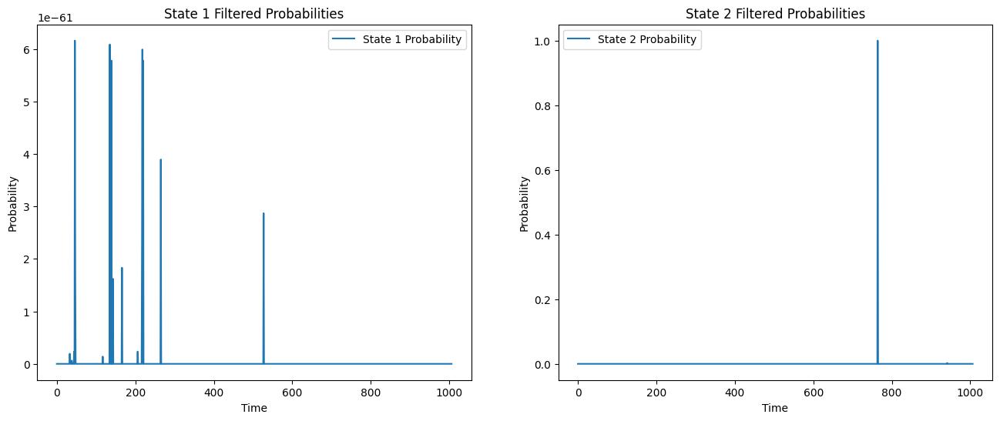

Iteration 61: Max Diff = 1.0005534530677
mu_hat0: [4.03932481 4.40821502 3.98302072 4.57213322]
mu_hat1: [4.0393475  4.40818251 3.98302694 4.57214011]
sigma_hat0: [0.0008824  0.00044761 0.31472058 0.11096979]
sigma_hat1: [7.68199367e-04 1.79979506e-05 3.14722774e-01 1.10967879e-01]
P_hat0: [[4.94878816e-24 0.00000000e+00 1.00000000e+00 0.00000000e+00]
 [0.00000000e+00 1.33238602e-05 1.85261586e-30 9.99986676e-01]
 [6.05043054e-61 1.26564262e-03 9.98734357e-01 2.28730159e-11]
 [0.00000000e+00 1.69186060e-37 4.73105519e-03 9.95268945e-01]]
P_hat1: [[4.22990161e-25 0.00000000e+00 1.00000000e+00 0.00000000e+00]
 [0.00000000e+00 1.01548682e-28 6.42406878e-37 1.00000000e+00]
 [5.63855048e-63 1.26427490e-03 9.98735725e-01 5.05454723e-11]
 [0.00000000e+00 1.80891220e-39 4.72623235e-03 9.95273768e-01]]


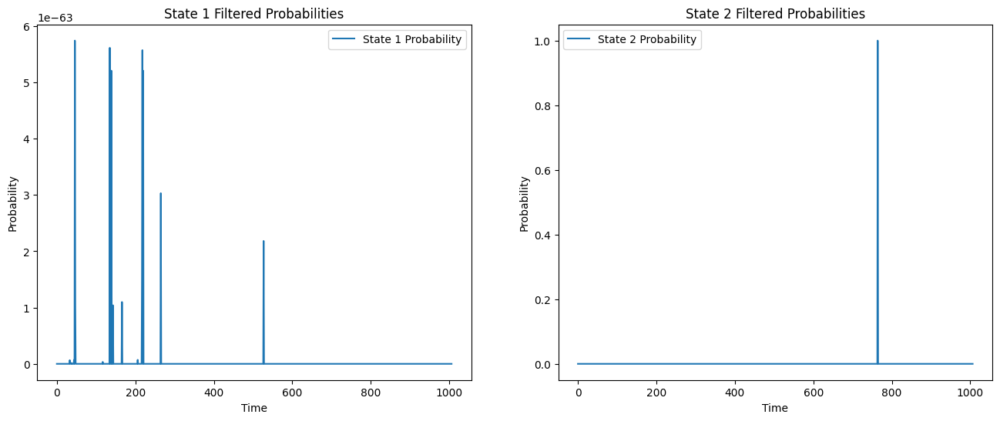

Iteration 62: Max Diff = 1.1168975017308365
mu_hat0: [4.0393475  4.40818251 3.98302694 4.57214011]
mu_hat1: [4.03933448 4.40818163 3.98302111 4.57212813]
sigma_hat0: [7.68199367e-04 1.79979506e-05 3.14722774e-01 1.10967879e-01]
sigma_hat1: [6.62480286e-04 6.62238236e-50 3.14721292e-01 1.10974472e-01]
P_hat0: [[4.22990161e-25 0.00000000e+00 1.00000000e+00 0.00000000e+00]
 [0.00000000e+00 1.01548682e-28 6.42406878e-37 1.00000000e+00]
 [5.63855048e-63 1.26427490e-03 9.98735725e-01 5.05454723e-11]
 [0.00000000e+00 1.80891220e-39 4.72623235e-03 9.95273768e-01]]
P_hat1: [[2.91270382e-26 0.00000000e+00 1.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 6.65959344e-47 1.00000000e+00]
 [4.73595058e-65 1.26121689e-03 9.98738783e-01 1.11645787e-10]
 [0.00000000e+00 6.51713251e-49 4.71442300e-03 9.95285577e-01]]


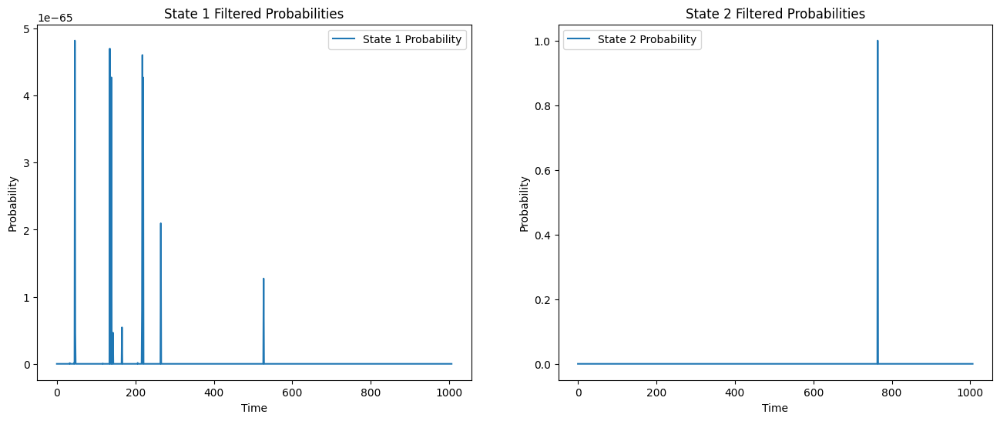

Iteration 63: Max Diff = 1.1150968720725287
mu_hat0: [4.03933448 4.40818163 3.98302111 4.57212813]
mu_hat1: [4.03928782 4.40818163 3.9830205  4.57212731]
sigma_hat0: [6.62480286e-04 6.62238236e-50 3.14721292e-01 1.10974472e-01]
sigma_hat1: [0.00055148 0.         0.31472109 0.11097477]
P_hat0: [[2.91270382e-26 0.00000000e+00 1.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 6.65959344e-47 1.00000000e+00]
 [4.73595058e-65 1.26121689e-03 9.98738783e-01 1.11645787e-10]
 [0.00000000e+00 6.51713251e-49 4.71442300e-03 9.95285577e-01]]
P_hat1: [[1.27995379e-27 0.00000000e+00 1.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 1.52397921e-56 1.00000000e+00]
 [3.57656701e-67 1.26121855e-03 9.98738781e-01 2.46906891e-10]
 [0.00000000e+00 5.20202486e-58 4.71439805e-03 9.95285602e-01]]


<ipython-input-5-064385f0b764>:2: RuntimeWarning: divide by zero encountered in divide
  phi = norm.pdf((y - mu) / sigma)
<ipython-input-5-064385f0b764>:19: RuntimeWarning: divide by zero encountered in scalar divide
  phi[ss2] = norm.pdf((Y[0] - mu[ss2]) / sigma[ss2])
<ipython-input-5-064385f0b764>:29: RuntimeWarning: divide by zero encountered in scalar divide
  phi[ss2] = norm.pdf((Y[tt] - mu[ss2]) / sigma[ss2])
<ipython-input-5-064385f0b764>:2: RuntimeWarning: invalid value encountered in divide
  phi = norm.pdf((y - mu) / sigma)
<ipython-input-5-064385f0b764>:29: RuntimeWarning: invalid value encountered in scalar divide
  phi[ss2] = norm.pdf((Y[tt] - mu[ss2]) / sigma[ss2])


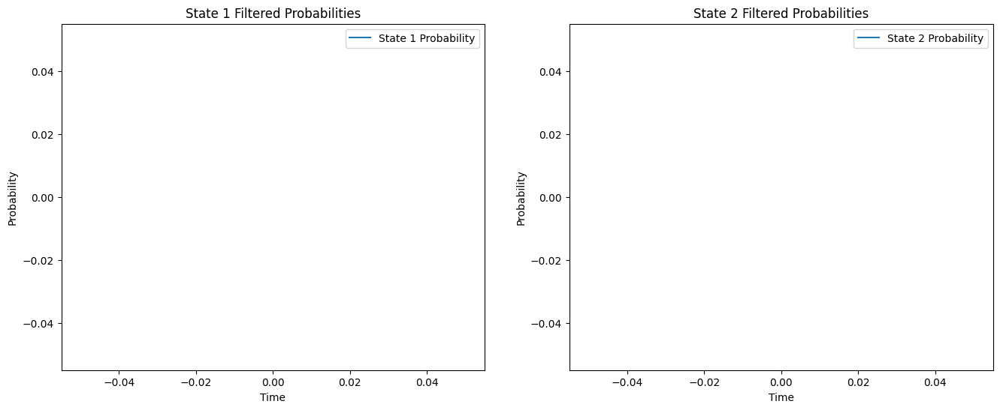

Iteration 64: Max Diff = nan
mu_hat0: [4.03928782 4.40818163 3.9830205  4.57212731]
mu_hat1: [nan nan nan nan]
sigma_hat0: [0.00055148 0.         0.31472109 0.11097477]
sigma_hat1: [nan nan nan nan]
P_hat0: [[1.27995379e-27 0.00000000e+00 1.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 1.52397921e-56 1.00000000e+00]
 [3.57656701e-67 1.26121855e-03 9.98738781e-01 2.46906891e-10]
 [0.00000000e+00 5.20202486e-58 4.71439805e-03 9.95285602e-01]]
P_hat1: [[nan nan nan nan]
 [nan nan nan nan]
 [nan nan nan nan]
 [nan nan nan nan]]
Stopping due to NaN in Max Diff.
{   'P_hat': '[[nan nan nan nan]\n'
             ' [nan nan nan nan]\n'
             ' [nan nan nan nan]\n'
             ' [nan nan nan nan]]',
    'mu_hat': '[nan nan nan nan]',
    'pi_hat': '[nan nan nan nan]',
    'sigma_hat': '[nan nan nan nan]'}


In [ ]:
def likelihood(xi_prob, mu, sigma, y):
    phi = norm.pdf((y - mu) / sigma)
    y_like = np.dot(xi_prob, phi)

    return y_like


# Hamilton filtering
def forward_alg(pi_hat0, N, T, P, mu, sigma, Y):
    xi_prob_t = np.zeros((T, N))
    xi_prob_t1 = np.zeros((T, N))

    # Case t=1
    y_like = likelihood(pi_hat0, mu, sigma, Y[0])

    for ss in range(0, N):
        phi = np.zeros((N))
        for ss2 in range(0, N):
            phi[ss2] = norm.pdf((Y[0] - mu[ss2]) / sigma[ss2])
    xi_prob_t[0, :] = np.multiply(pi_hat0, phi) / y_like
    for ss in range(0, N):
        xi_prob_t1[0, ss] = np.dot(P[:, ss], xi_prob_t[0, :])

    for tt in range(1, T):
        y_like = likelihood(xi_prob_t1[tt - 1, :], mu, sigma, Y[tt])
        for ss in range(0, N):
            phi = np.zeros((N))
            for ss2 in range(0, N):
                phi[ss2] = norm.pdf((Y[tt] - mu[ss2]) / sigma[ss2])
        xi_prob_t[tt, :] = np.multiply(xi_prob_t1[tt - 1, :], phi) / y_like
        for ss in range(0, N):
            xi_prob_t1[tt, ss] = np.dot(P[:, ss], xi_prob_t[tt, :])

    return xi_prob_t, xi_prob_t1


# Kim filtering
def backward_alg(xi_prob_t, xi_prob_t1, N, T, P, mu, sigma, Y):
    xi_prob_T = np.zeros((T, N))
    xi_prob_T[T - 1, :] = xi_prob_t[T - 1, :]

    for tt in range(T - 2, -1, -1):
        xi_T_xi = np.divide(xi_prob_T[tt + 1, :], xi_prob_t1[tt, :])
        for ss in range(0, N):
            xi_prob_T[tt, ss] = xi_prob_t[tt, ss] * np.dot(P[ss, :], xi_T_xi)

    return xi_prob_T  # , xi_prob_T1


def M_step(xi_prob, P, N, T, Y, const_sigma=False, const_mu=False):
    mu_hat = np.zeros((N))
    sigma_hat = np.zeros((N))
    P_hat = np.zeros((N, N))
    pi_hat = np.zeros((N))

    # Case: both const_mu and const_sigma are True
    if const_mu and const_sigma:
        # Calculate common mean
        total_mean = np.dot(xi_prob.T, Y).sum() / np.sum(xi_prob)
        mu_hat = np.repeat(total_mean, N)

        # Calculate common variance
        total_var = np.dot(xi_prob.T, (Y - total_mean) ** 2).sum() / np.sum(xi_prob)
        common_sigma = np.sqrt(total_var)
        sigma_hat = np.repeat(common_sigma, N)

    # Case: const_mu is True but const_sigma is False
    elif const_mu:
        # Calculate common mean
        total_mean = np.dot(xi_prob.T, Y).sum() / np.sum(xi_prob)
        mu_hat = np.repeat(total_mean, N)

        # Calculate different variances
        for ss in range(N):
            xi_y_mu2 = np.dot(xi_prob[:, ss], (Y - total_mean) ** 2)
            sigma_hat[ss] = np.sqrt(xi_y_mu2 / np.sum(xi_prob[:, ss]))

    # Case: const_mu is False but const_sigma is True
    elif const_sigma:
        # Calculate different means
        for ss in range(N):
            xi_y = np.dot(xi_prob[:, ss], Y)
            mu_hat[ss] = xi_y / np.sum(xi_prob[:, ss])

        # Calculate common variance
        total_var = 0
        total_weight = 0
        for ss in range(N):
            xi_y_mu2 = np.dot(xi_prob[:, ss], (Y - mu_hat[ss]) ** 2)
            total_var += xi_y_mu2
            total_weight += np.sum(xi_prob[:, ss])
        common_sigma = np.sqrt(total_var / total_weight)
        sigma_hat = np.repeat(common_sigma, N)

    # Case: both const_mu and const_sigma are False (default)
    else:
        # Standard mean and variance calculation
        for ss in range(N):
            xi_y = np.dot(xi_prob[:, ss], Y)
            mu_hat[ss] = xi_y / np.sum(xi_prob[:, ss])

            xi_y_mu2 = np.dot(xi_prob[:, ss], (Y - mu_hat[ss]) ** 2)
            sigma_hat[ss] = np.sqrt(xi_y_mu2 / np.sum(xi_prob[:, ss]))

    # Calculate transition probabilities
    for ss in range(N):
        for ss2 in range(N):
            P_hat[ss, ss2] = np.sum(P[ss, ss2, 1:]) / np.sum(P[ss, :, 1:])
        pi_hat[ss] = xi_prob[0, ss]

    return mu_hat, sigma_hat, P_hat, pi_hat



# E-Step: Calculate forward probabilities and filtered probabilities
def E_step(data, mu_hat, sigma_hat, pi_hat, P_hat, N, T):
    xi_prob_t, xi_prob_t1 = forward_alg(
        pi_hat, N, T, P_hat, mu_hat, sigma_hat, data
    )
    xi_prob_T = backward_alg(
        xi_prob_t, xi_prob_t1, N, T, P_hat, mu_hat, sigma_hat, data
    )
    return xi_prob_t, xi_prob_t1, xi_prob_T

def has_converged(mu_hat_old, sigma_hat_old, P_hat_old, pi_hat_old, mu_hat_new, sigma_hat_new, P_hat_new, pi_hat_new, itetol):

    params_old = [mu_hat_old, sigma_hat_old, P_hat_old, pi_hat_old]
    params_new = [mu_hat_new, sigma_hat_new, P_hat_new, pi_hat_new]

    diff = np.array([
        np.sum(np.absolute(new - old)) / (np.min(old) + itetol * 1e-2)
        for new, old in zip(params_new, params_old)
    ])

    return np.max(diff) < itetol, diff

# Plot filtered probabilities
def plot_filtered_probabilities(xi_prob):
    plt.subplot(1, 2, 1)
    plt.plot(xi_prob[:, 0], label="State 1 Probability")
    plt.legend()
    plt.title("State 1 Filtered Probabilities")
    plt.ylabel("Probability")
    plt.xlabel("Time")

    plt.subplot(1, 2, 2)
    plt.plot(xi_prob[:, 1], label="State 2 Probability")
    plt.legend()
    plt.title("State 2 Filtered Probabilities")
    plt.ylabel("Probability")
    plt.xlabel("Time")

    fig = plt.gcf()
    fig.set_size_inches(16, 6)
    plt.show()


def EMAnalysis(data, N=2, itemax=100, itetol=1e-2, printing=True, const_var=False, const_mean=False):

    T = len(data)

    mu_hat0 = np.tile([2, 4], int(np.ceil(N / 2)))[:N]
    sigma_hat0 = np.maximum(np.tile([0.1, 0.1], int(np.ceil(N / 2)))[:N], 1e-5)


    P_hat0 = np.zeros((N, N))

    for i in range(N):
        P_hat0[i, i] = 0.7  # High probability of staying in the same state
        for j in range(N):
            if i != j:
                P_hat0[i, j] = (1 - P_hat0[i, i]) / (N - 1)  # Distribute remaining probability evenly

    pi_hat0 = np.ones((N)) / N # Create a uniform initial distribution across states

    pi_hat0 = np.linalg.matrix_power(P_hat0.T, 99) @ pi_hat0

    P_hat_T = np.zeros((N, N, T))

    for ite in range(itemax):
        # E-Step: Calculate forward and filtered probabilities
        xi_prob_t, xi_prob_t1, xi_prob_T = E_step(data, mu_hat0, sigma_hat0, pi_hat0, P_hat0, N, T)

        plot_filtered_probabilities(xi_prob_T)

        # Reshape arrays to enable broadcasting
        xi_prob_t_reshaped = xi_prob_t[:-1, :, None]
        xi_prob_T_reshaped = xi_prob_T[1:, None, :]
        xi_prob_t1_reshaped = xi_prob_t1[:-1, None, :]

        # Calculate the intermediate result
        aux = (P_hat0[:, :, None] *
                      xi_prob_t_reshaped.transpose(1, 2, 0) *
                      xi_prob_T_reshaped.transpose(1, 2, 0) /
                      xi_prob_t1_reshaped.transpose(1, 2, 0))

        P_hat_T[:, :, 1:] = aux


        # M-step
        mu_hat1, sigma_hat1, P_hat1, pi_hat1 = M_step(xi_prob_T, P_hat_T, N, T, data, const_var, const_mean)


        # Check for convergence
        converged, diff = has_converged(mu_hat0, sigma_hat0, P_hat0, pi_hat0, mu_hat1, sigma_hat1, P_hat1, pi_hat1, itetol)

        print(f"Iteration {ite}: Max Diff = {np.max(diff)}")
        print(f'mu_hat0: {mu_hat0}')
        print(f'mu_hat1: {mu_hat1}')
        print(f'sigma_hat0: {sigma_hat0}')
        print(f'sigma_hat1: {sigma_hat1}')
        print(f'P_hat0: {P_hat0}')
        print(f'P_hat1: {P_hat1}')


        # Stop if Max Diff is nan
        if np.isnan(np.max(diff)) and printing:
            print("Stopping due to NaN in Max Diff.")
            printing_results(mu_hat=mu_hat1, sigma_hat=sigma_hat1, P_hat=P_hat1, pi_hat=pi_hat1)
            break

        if converged:
            print("Converged:")
            printing_results(mu_hat=mu_hat1, sigma_hat=sigma_hat1, P_hat=P_hat1, pi_hat=pi_hat1)
            break

        # Update parameters for the next iteration
        mu_hat0, sigma_hat0, P_hat0, pi_hat0 = mu_hat1, sigma_hat1, P_hat1, pi_hat1

    return mu_hat1, sigma_hat1, P_hat1, pi_hat1

def printing_results(**kwargs):

    pp = pprint.PrettyPrinter(indent=4)
    formatted_output = {}
    for key, value in kwargs.items():
        if isinstance(value, np.ndarray):
            formatted_output[key] = np.array2string(value, precision=4, suppress_small=True)
        else:
            formatted_output[key] = value
    pp.pprint(formatted_output)


def run(data):
    # Check the initial type of the input
    print("Initial type of data:", type(data))

    try:
        # Drop any NaN values
        data = data.dropna()
        print(f"Data after dropping NaNs:\n{data.head()}")

        # Check if the data is a DataFrame or Series, then convert to numpy array and reshape
        data = data.to_numpy().reshape(-1, 1)
        print('Data successfully reshaped into a 2D array for EM processing.')
    except AttributeError:
        if not isinstance(data, np.ndarray):
            raise ValueError("Input must be a pandas Series/DataFrame or a numpy array.")

    print("Data type after transformation:", type(data))

    print("Input data shape:", data.shape)

    data = data.flatten()
    print("Data flattened for EM analysis. Shape:", data.shape)

    if len(data) == 0:
        raise ValueError("Data is empty after preprocessing.")

    model_metrics = []
    results = {}

    print("\nRunning analyses for different numbers of states but constant mu and sigma...")

    # Try different numbers of states (2 to 4)
    for n_states in range(2, 5):
        print(f"\nAnalyzing model with {n_states} states constant mu and sigma:")
        mu_hat, sigma_hat, P_hat, pi_hat = EMAnalysis(
            data,
            N=n_states,
            itemax=100,
            itetol=1e-2,
            printing=True,
            const_var=True,
            const_mean=True
        )
        results[f'{n_states}_states_constant_sigma_mu'] = {
            'mu': mu_hat,
            'sigma': sigma_hat,
            'P': P_hat,
            'pi': pi_hat
        }

        current_model_metrics = compare_models_explicit(data, {f'{n_states}_states_constant_sigma_mu': results[f'{n_states}_states_constant_sigma_mu']})
        model_metrics.append({
            'model': f'{n_states}_states_constant_sigma_mu',
            'n_states': n_states,
            'metrics': current_model_metrics
        })

    # Analyze model with constant sigma (variance)
    print(f"\nAnalyzing model with constant sigma (variance):")
    n_states = 3
    mu_hat, sigma_hat, P_hat, pi_hat = EMAnalysis(
        data,
        N=n_states,
        itemax=100,
        itetol=1e-2,
        printing=True,
        const_var=True,
        const_mean=False
    )
    # Store the results for the model with constant sigma
    results[f'{n_states}_constant_sigma'] = {
        'mu': mu_hat,
        'sigma': sigma_hat,
        'P': P_hat,
        'pi': pi_hat
    }

    current_model_metrics = compare_models_explicit(data, {f'{n_states}_constant_sigma': results[f'{n_states}_constant_sigma']})
    model_metrics.append({
        'model': f'{n_states}_constant_sigma',
        'n_states': n_states,
        'metrics': current_model_metrics
    })


    # Analyze model with constant mu (mean)
    print(f"\nAnalyzing model with constant mu (mean):")
    n_states = 3
    mu_hat, sigma_hat, P_hat, pi_hat = EMAnalysis(
        data,
        N=n_states,
        itemax=100,
        itetol=1e-2,
        printing=True,
        const_var=False,
        const_mean=True
    )
    # Store the results for the model with constant mu
    results[f'{n_states}_constant_mu'] = {
        'mu': mu_hat,
        'sigma': sigma_hat,
        'P': P_hat,
        'pi': pi_hat
    }

    current_model_metrics = compare_models_explicit(data, {f'{n_states}_constant_mu': results[f'{n_states}_constant_mu']})
    model_metrics.append({
        'model': f'{n_states}_constant_mu',
        'n_states': n_states,
        'metrics': current_model_metrics
    })


    print("\nRunning analyses for different numbers of states...")

    # Try different numbers of states (2 to 4)
    for n_states in range(2, 5):
        print(f"\nAnalyzing model with {n_states} states:")
        mu_hat, sigma_hat, P_hat, pi_hat = EMAnalysis(
            data,
            N=n_states,
            itemax=100,
            itetol=1e-2,
            printing=True
        )
        # Store the results for the current n_states model
        results[f'{n_states}_states'] = {
            'mu': mu_hat,
            'sigma': sigma_hat,
            'P': P_hat,
            'pi': pi_hat
        }

        current_model_metrics = compare_models_explicit(data, {f'{n_states}_states': results[f'{n_states}_states']})
        model_metrics.append({
            'model': f'{n_states}_states',
            'n_states': n_states,
            'metrics': current_model_metrics
        })



    # Return all results
    return {
        'model_metrics': model_metrics,
        'model_results': results
    }


def calculate_likelihoods(data, result):

    mu = result['mu']
    sigma = result['sigma']
    P = result['P']
    pi = result['pi']

    T = len(data)
    N = len(mu)

    # Initialize likelihoods
    log_likelihood_aic = 0
    log_likelihood_bic = 0

    alpha = np.zeros((T, N))

    # Initial state probabilities
    for j in range(N):
        alpha[0, j] = pi[j] * norm.pdf(data[0], mu[j], sigma[j])

    # Scale to prevent numerical underflow
    scale = np.sum(alpha[0, :])
    alpha[0, :] /= scale

    # Initial likelihood contributions
    log_likelihood_aic = np.log(scale)
    log_likelihood_bic = np.log(scale)

    for t in range(1, T):
        for j in range(N):
            state_prob = 0
            for i in range(N):
                state_prob += alpha[t-1, i] * P[i, j]
            alpha[t, j] = state_prob * norm.pdf(data[t], mu[j], sigma[j])

        scale = np.sum(alpha[t, :])
        alpha[t, :] /= scale

        log_likelihood_aic += np.log(scale)
        log_likelihood_bic += np.log(scale)

    n_params = N * 2 + N * (N - 1)

    # Calculate AIC and BIC
    aic = 2 * n_params - 2 * log_likelihood_aic
    bic = np.log(T) * n_params - 2 * log_likelihood_bic

    return {
        'AIC': {
            'likelihood': log_likelihood_aic,
            'criterion': aic,
            'n_params': n_params
        },
        'BIC': {
            'likelihood': log_likelihood_bic,
            'criterion': bic,
            'n_params': n_params
        }
    }

def compare_models_explicit(data, results):

    T = len(data)
    model_metrics = {}

    for n_states, result in results.items():
        # Calculate likelihoods and criteria
        likelihoods = calculate_likelihoods(data, result)

        model_metrics[n_states] = {
            'AIC': {
                'Log_Likelihood': likelihoods['AIC']['likelihood'],
                'Criterion': likelihoods['AIC']['criterion'],
                'Parameters': likelihoods['AIC']['n_params']
            },
            'BIC': {
                'Log_Likelihood': likelihoods['BIC']['likelihood'],
                'Criterion': likelihoods['BIC']['criterion'],
                'Parameters': likelihoods['BIC']['n_params']
            }
        }

    return model_metrics

def print_detailed_comparison(model_metrics):
    """
    Print detailed model comparison results with both AIC and BIC
    """
    print("\nDetailed Model Comparison Results:")
    print("=" * 80)
    print("AIC Results:")
    print("-" * 80)
    print(f"{'States':<8} {'Parameters':<12} {'AIC Log-Likelihood':<20} {'AIC Value':<15}")
    print("-" * 80)

    for n_states, metrics in model_metrics.items():
        print(f"{n_states:<8} {metrics['AIC']['Parameters']:<12} "
              f"{metrics['AIC']['Log_Likelihood']:<20.2f} "
              f"{metrics['AIC']['Criterion']:<15.2f}")

    print("\nBIC Results:")
    print("-" * 80)
    print(f"{'States':<8} {'Parameters':<12} {'BIC Log-Likelihood':<20} {'BIC Value':<15}")
    print("-" * 80)

    for n_states, metrics in model_metrics.items():
        print(f"{n_states:<8} {metrics['BIC']['Parameters']:<12} "
              f"{metrics['BIC']['Log_Likelihood']:<20.2f} "
              f"{metrics['BIC']['Criterion']:<15.2f}")

    print("=" * 80)



results = run(asset['CL=F'].logprices)



In [ ]:
def print_metrics(results):

    model_metrics = results['model_metrics']
    model_results = results['model_results']

    for metric in model_metrics:
      model_name = metric['model']
      if model_name in metric['metrics']:
                metrics = metric['metrics'][model_name]
                print(f"Model: {model_name}:")
                print(f"  AIC:")
                print(f"    Log-Likelihood: {metrics['AIC']['Log_Likelihood']:.2f}")
                print(f"    Criterion: {metrics['AIC']['Criterion']:.2f}")
                print(f"    Parameters: {metrics['AIC']['Parameters']}")
                print(f"  BIC:")
                print(f"    Log-Likelihood: {metrics['BIC']['Log_Likelihood']:.2f}")
                print(f"    Criterion: {metrics['BIC']['Criterion']:.2f}")
                print(f"    Parameters: {metrics['BIC']['Parameters']}")
                print("=" * 30)  # Separator for readability

                # Print associated model results
                if model_name in model_results:
                    model_res = model_results[model_name]
                    print(f"  mu: {model_res['mu']}")
                    print(f"  sigma: {model_res['sigma']}")
                    print(f"  P: {model_res['P']}")
                    print(f"  pi: {model_res['pi']}")
                    print("=" * 30)

print_metrics(results)

Model: 2_states_constant_sigma_mu:
  AIC:
    Log-Likelihood: -433.36
    Criterion: 878.73
    Parameters: 6
  BIC:
    Log-Likelihood: -433.36
    Criterion: 908.22
    Parameters: 6
  mu: [4.10753314 4.10753314]
  sigma: [0.37210193 0.37210193]
  P: [[0.90288603 0.09711397]
 [0.00122246 0.99877754]]
  pi: [4.39981948e-74 1.00000000e+00]
Model: 3_states_constant_sigma_mu:
  AIC:
    Log-Likelihood: -433.36
    Criterion: 890.73
    Parameters: 12
  BIC:
    Log-Likelihood: -433.36
    Criterion: 949.70
    Parameters: 12
  mu: [4.10753314 4.10753314 4.10753314]
  sigma: [0.37210193 0.37210193 0.37210193]
  P: [[7.50501984e-01 8.86761628e-02 1.60821854e-01]
 [5.58847550e-04 9.98882305e-01 5.58847550e-04]
 [1.60821854e-01 8.86761628e-02 7.50501984e-01]]
  pi: [2.19990974e-74 1.00000000e+00 2.19990974e-74]
Model: 4_states_constant_sigma_mu:
  AIC:
    Log-Likelihood: -433.36
    Criterion: 906.73
    Parameters: 20
  BIC:
    Log-Likelihood: -433.36
    Criterion: 1005.02
    Parameters

Missing values: Ticker
CL=F    1
dtype: int64
Infinite values: Ticker
CL=F    0
dtype: int64
ADF Statistic: -1.5891484055817666
p-value: 0.489042319056727


<ipython-input-7-cdd4e6d66490>:10: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  logprices_cleaned = logprices.fillna(method='ffill')  # Forward fill
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/optimizer.py:19: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method bfgs is: gtol, norm, epsilon. The list of unsupported keyword arguments passed include: tol. After release 0.14, this will raise.
  warnings.warn(


                         Markov Switching Model Results                         
Dep. Variable:                     CL=F   No. Observations:                 1006
Model:             MarkovAutoregression   Log Likelihood                2215.793
Date:                  Thu, 24 Oct 2024   AIC                          -4415.587
Time:                          21:29:11   BIC                          -4376.277
Sample:                               0   HQIC                         -4400.650
                                 - 1006                                         
Covariance Type:                 approx                                         
                             Regime 0 parameters                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0010      0.001      1.291      0.197      -0.001       0.002
sigma2         0.0005   2.76e-05    

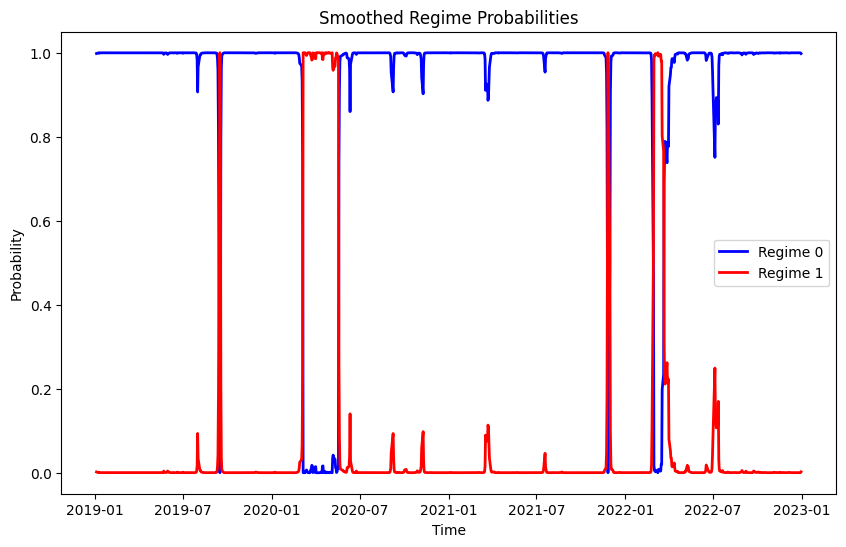

Regime 0: AR coefficients = -0.008096739700630875, Mean (mu) = 0.0009689296233189972, Variance (sigma²) = 0.0005124776159632708 
Regime 1: AR coefficients = -0.0996772166730259, Mean (mu) = -0.004705269611054898, Variance (sigma²) = 0.015837429342849953


In [ ]:
logprices = asset['CL=F'].logprices

# Check for missing or infinite values
print("Missing values:", logprices.isna().sum())
print("Infinite values:", np.isinf(logprices).sum())

# Handle missing values by dropping or filling

#Fill missing values (uncomment to use)
logprices_cleaned = logprices.fillna(method='ffill')  # Forward fill
# logprices_cleaned = logprices.fillna(method='bfill')  # Backward fill

# Perform ADF test on cleaned data
adf_result = adfuller(logprices_cleaned)
print('ADF Statistic:', adf_result[0])
print('p-value:', adf_result[1])

# If non-stationary, difference the data
if adf_result[1] > 0.05:
    diff_logprices = logprices_cleaned.diff().dropna()
else:
    diff_logprices = logprices_cleaned

# Fit the Markov-Switching Autoregressive Model with AR(1)
mod = sm.tsa.MarkovAutoregression(diff_logprices, k_regimes=2, order=1, switching_variance=True)

# Fit the model
try:
    res = mod.fit(maxiter=2000, tol=1e-5)
    print(res.summary())
except Exception as e:
    print("Error fitting model:", e)

# Plot smoothed probabilities
if 'res' in locals():
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.plot(res.smoothed_marginal_probabilities[0], label="Regime 0", color='blue', lw=2)
    ax.plot(res.smoothed_marginal_probabilities[1], label="Regime 1", color='red', lw=2)
    ax.set_title('Smoothed Regime Probabilities')
    ax.set_xlabel('Time')
    ax.set_ylabel('Probability')
    ax.legend()
    plt.show()



# Display results
print(f"Regime 0: AR coefficients = {res.params.iloc[6]}, Mean (mu) = {res.params.iloc[2]}, Variance (sigma²) = {res.params.iloc[4]} ")
print(f"Regime 1: AR coefficients = {res.params.iloc[7]}, Mean (mu) = {res.params.iloc[3]}, Variance (sigma²) = {res.params.iloc[5]}")